# 009. ECONOMIC WORDS IN TWEETS

## PART 1: Finding economic tweets using list of potential economic keywords being used in tweets 

**Objective**: To accurately identify and flag tweets discussing economic topics from English-translated Polish Twitter data, based on a predefined list of 56 economic keywords and multi-word expressions (MWEs), while minimizing false positives.

**Methodology**: A hybrid natural language processing (NLP) approach was implemented, integrating efficient string matching with contextual linguistic analysis using the spaCy library (en_core_web_lg model). The process involves several stages:

Initialization:

1. The predefined list of economic terms was separated into single words and MWEs.-
2. An Aho-Corasick automaton was built for efficient matching of the exact MWE sequences (case-insensitive).
3. Single keywords were lemmatized using spaCy, and a dictionary (target_lemmas) was created mapping each base lemma (lowercase) to its corresponding original keyword(s).
4. Tweet Processing Pipeline: Each tweet's text (text_clean_en) was processed as follows:
    a) MWE Matching: The Aho-Corasick automaton identified all occurrences of predefined MWEs within the tweet text (case-insensitive). These matches were recorded.

    b) SpaCy Linguistic Analysis: The tweet text was processed by spaCy to obtain tokenization, lemmatization, Part-of-Speech (POS) tags (Universal POS tags like NOUN, VERB, PROPN), and Named Entity Recognition (NER) tags (like ORG, MONEY).

    c) Contextual Span Identification: Character indices covered by specific non-economic named entities (e.g., 'Europarlament' tagged as ORG) defined in a blocklist (NON_ECONOMIC_ORG_ENTITIES) were pre-calculated.

    d) Filtered Lemma Matching: Each token in the spaCy-processed tweet was evaluated:

        - Tokens overlapping with already matched MWEs were skipped.
        - Tokens overlapping with the pre-identified non-economic entity spans were ignored (NER Filter).

    e) For the remaining tokens, the lowercase lemma (token.lemma_.lower()) was checked against the target_lemmas dictionary.
        If a lemma match occurred, an additional POS filter was applied only if the lemma was present as a key in a predefined RELEVANT_POS_TAGS dictionary. This dictionary specifies allowed POS tags (e.g., {'NOUN', 'PROPN'} for 'bank') for ambiguous keywords like names of institutions. If the token's token.pos_ was not in the allowed set for that lemma, the match was ignored.
    
    f) Matches passing all filters were recorded, storing both the original token text and the corresponding base keyword(s)).
        Post-hoc Filtering: After initial flagging based on the refined extraction, a final filtering step was applied. Rows where the only matched base keywords were 'equality' or 'inequalities' (or both) were identified and removed entirely from the dataset. This aimed to exclude tweets discussing social/gender equality rather than economic equality when no other economic context was present.

**Output**: The process yields final lists of matched base keywords (matched_keywords_FILTERED) and extracted original word forms (extracted_terms_FILTERED) for each tweet, along with a final boolean flag (has_econ_term_FILTERED reflecting the state after the post-hoc removal) indicating whether the tweet contains relevant economic terms according to this refined procedure.

### For the ABSTRACT - part 1

**explanations**:

Aho-Corasick - Aho-Corasick is a string matching algorithm that efficiently finds all occurrences of a set of keywords in a text. It builds a finite state machine (FSM) from the keywords, allowing for simultaneous searching of multiple patterns in linear time.
spaCy - spaCy is a popular NLP library in Python that provides pre-trained models for various languages, including English. It offers functionalities like tokenization, lemmatization, POS tagging, and NER, making it suitable for linguistic analysis of text data.  

**part of abstract - methodology of finding economic related tweets**

In order to find economic discourse in downloaded tweets, we created keyword-based classification technique that goes beyond basic string matching. This method utilizes a predetermined list of multi-word expressions (MWEs) and economic terms. It combines spaCy-based lemmatization to capture morphological variants, such as verb forms and plurals with the Aho-Corasick algorithm for effective matching of multi-word phrases. Importantly, spaCy's linguistic features are used to apply contextual filters that remove uncertainty from meaning of keyword matches. Filters aim to apply Part-of-Speech tag restrictions for ambiguous keywords, such as separating noun uses of "bank" from verb uses, and ignore matches that exist within specific non-economic Named Entities, like "Europarlament." To eliminate likely non-economic social contexts, a final post-hoc adjustment removes tweets where the only keywords found were "equality" or "inequalities.", which after manual inspection were discorvered as relating only to social topics. Compared to simpler keyword or lemma-only approaches, this hybrid method yields a more accurate classification of tweets relevant to the target economic vocabulary by reducing contextually inappropriate matches while maintaining recall through lemmatization. 

## Part 2: Visualization and Analysis of Identified Economic Discourse

Following the identification of economic tweets, we visualizated and analysed results to understand the characteristics and distribution of this discourse. 

This includes:

Temporal Analysis: The volume of economic tweets is plotted over time (e.g., weekly counts), with key events such as the 2023 Polish election annotated with vertical lines and pre/post periods highlighted using shaded regions to observe potential shifts in discourse volume.

Keyword Popularity: The most and least frequent economic keywords from the final filtered list are identified and visualized using bar charts, providing insights into the dominant themes.

Method Comparison: The performance and output of the final refined keyword extraction method are compared against simpler exact-match techniques (Naive, Regex, FlashText, Aho-Corasick) and aggregated approaches (Union, Gateway). This involves comparing total flagged tweet counts, analyzing overlaps and differences in flagged sets (e.g., via Venn diagrams of top tokens and detailed examination of disagreement samples), and assessing keyword frequencies unique to each method.

Party-Level Discourse: The economic discourse is further analyzed by political party affiliation. This includes visualizing the top economic tokens used by each party (via grouped and stacked bar charts) and plotting the share (percentage) of each party's total tweets that were flagged as economic by different methods (Union, Gateway, and Final Refined).

Top Contributors: Analysis is conducted to identify the top individuals (users/authors) contributing to economic discourse within each party and overall, based on both the raw number and the percentage of their tweets flagged as economic. These are visualized using bar charts sorted within parties and globally.

### For the ABSTRACT - part 2

<image src="">

## Part 3: Sentiment Analysis of Economic Tweets (Overlook)



Once the relevant economic tweets are identified and filtered, the next stage of the project involves sentiment analysis to determine the polarity of this discourse.

Objective: To classify each economic tweet as 'Positive', 'Neutral', or 'Negative'.

Method: This will be achieved by applying a pre-trained transformer-based language model, specifically cardiffnlp/twitter-roberta-base-sentiment-latest, known for its strong performance on social media text. The model will be applied to the demojized and not demojized  texts for of the tweets flagged by the final refined keyword extraction method.

Expected Output & Analysis: The process will yield a sentiment label and a confidence score for each economic tweet. These results will then be analyzed and visualized to understand:

- The overall sentiment distribution (e.g., percentage of positive, neutral, negative economic tweets).

- Sentiment trends over time, potentially correlated with specific events.

- Sentiment breakdown by political party.

- The distribution of sentiment confidence scores.

### For the ABSTRACT - part 3

# CODING PART

In [2]:
import os

os.getcwd()

'h:\\000_Projects\\01_GitHub\\05_PythonProjects\\Twitter\\notebooks'

In [3]:
import pandas as pd

# Load the Parquet file into a DataFrame
# df_clean_translated = pd.read_parquet('data/03_cleaned/df_combined_after_vote_data.parquet') # From 2023-10-16 till the 2024-10-15
# df_clean_translated = pd.read_parquet('data/03_cleaned/df_combined_whole_data.parquet') # From 2022-10-16 till the 2024-10-15

In [1]:
import pandas as pd

# Load the first Parquet file to get the desired column order -> issue with raw files 
try:
    df_reference_after_vote = pd.read_parquet('../data/03.cleaned/df_combined_after_vote_data.parquet')
    desired_column_order = df_reference_after_vote.columns.tolist()
except FileNotFoundError:
    print(f"Error: File '../data/03.cleaned/df_combined_after_vote_data.parquet' not found. "f"Please ensure this file exists to determine the column order.")
    exit()

# Load the second Parquet file
df_clean_translated = pd.read_parquet('../data/03.cleaned/df_combined_whole_data.parquet')

# Reindex the second DataFrame to match the column order of the first
df_clean_translated = df_clean_translated.reindex(columns=desired_column_order)

# Now df_clean_translated should have the same column order as df_reference
print("Column order of the reindexed DataFrame:")
print(df_clean_translated.columns.tolist())

Column order of the reindexed DataFrame:
['created_at', 'text', 'id', 'author_id', 'edit_controls', 'possibly_sensitive', 'reply_settings', 'lang', 'edit_history_tweet_ids', 'conversation_id', 'category', 'attachments', 'username', 'party', 'in_reply_to_user_id', 'context_annotations', 'referenced_tweets', 'geo', 'text_clean', 'mentions', 'links', 'hashtags', 'retweet_count', 'reply_count', 'like_count', 'quote_count', 'impression_count', 'text_clean_en', 'text_clean_en_demojized', 'text_clean_demojized', 'emoji_count_en', 'emoji_count', 'name']


In [4]:
df_reference_after_vote

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,reply_count,like_count,quote_count,impression_count,text_clean_en,text_clean_en_demojized,text_clean_demojized,emoji_count_en,emoji_count,name
0,2024-03-06 14:15:34+00:00,"Policja rzucająca kostką brukową w rolników, p...",1765380709114409216,1.554484e+18,{'editable_until': '2024-03-06 15:15:34+00:00'...,False,everyone,pl,[1765380709114409272],1.765381e+18,...,4,203,0,12028,"Police throwing paving stones at farmers, MP s...","Police throwing paving stones at farmers, MP s...","Policja rzucająca kostką brukową w rolników, p...",0,0,Ryszard Iwaszkiewicz
1,2024-03-03 11:05:34+00:00,Zwróćcie uwagę na punkt 11.\nTu nie ma z czego...,1764245727646044160,1.554484e+18,{'editable_until': '2024-03-03 12:05:34+00:00'...,False,everyone,pl,[1764245727646044196],1.764246e+18,...,0,2,0,275,Please pay attention to point 11. There's noth...,Please pay attention to point 11.\nThere's not...,Zwróćcie uwagę na punkt 11.\nTu nie ma z czego...,0,0,Ryszard Iwaszkiewicz
2,2024-03-02 14:15:58+00:00,"Równość, ale nie dla wszystkich… \nPani „minis...",1763931255521857792,1.554484e+18,{'editable_until': '2024-03-02 15:15:58+00:00'...,False,everyone,pl,[1763931255521857839],1.763931e+18,...,0,0,0,188,"Equality, but not for everyone... The ""minist...","Equality, but not for everyone... \nThe ""minis...","Równość, ale nie dla wszystkich… \nPani „minis...",0,0,Ryszard Iwaszkiewicz
3,2024-03-01 14:45:39+00:00,Pytanie za sto punktów! \nFirma jakiego państw...,1763576337078313216,1.554484e+18,{'editable_until': '2024-03-01 15:45:39+00:00'...,False,everyone,pl,[1763576337078313201],1.763576e+18,...,0,1,0,170,One hundred point question! Which country's c...,One hundred point question! \nWhich country's ...,Pytanie za sto punktów! \nFirma jakiego państw...,1,1,Ryszard Iwaszkiewicz
4,2024-02-29 12:04:21+00:00,Ukraina jeździ na polskim paliwie. \n\nPrzypom...,1763173358068281600,1.554484e+18,{'editable_until': '2024-02-29 13:04:21+00:00'...,False,everyone,pl,[1763173358068281524],1.763173e+18,...,0,0,0,124,Ukraine runs on Polish fuel. I would like to...,Ukraine runs on Polish fuel. \n\nI would like ...,Ukraina jeździ na polskim paliwie. \n\nPrzypom...,0,0,Ryszard Iwaszkiewicz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25682,2023-10-24 10:46:22+00:00,Formacje demokratyczne będą tworzyć przyszły r...,1716768088052359424,9.552394e+08,{'editable_until': '2023-10-24 11:46:22+00:00'...,False,everyone,pl,[1716768088052359454],1.716768e+18,...,2013,4637,100,330379,Democratic formations will form the future gov...,Democratic formations will form the future gov...,Formacje demokratyczne będą tworzyć przyszły r...,2,2,Władysław Kosiniak-Kamysz
25683,2023-10-19 18:05:26+00:00,"Żadne podchody, kłamstwa czy medialne wrzutki ...",1715066644018381312,9.552394e+08,{'editable_until': '2023-10-19 19:05:26+00:00'...,False,everyone,pl,[1715066644018381294],1.715067e+18,...,2406,12760,182,689059,"No tricks, lies or media insertions from PiS w...","No tricks, lies or media insertions from PiS w...","Żadne podchody, kłamstwa czy medialne wrzutki ...",0,0,Władysław Kosiniak-Kamysz
25684,2023-10-19 08:52:05+00:00,"Polska potrzebuje nowego, demokratycznego rząd...",1714927388637696256,9.552394e+08,{'editable_until': '2023-10-19 09:52:05+00:00'...,False,everyone,pl,[1714927388637696291],1.714927e+18,...,1108,3443,47,385751,"Poland needs a new, democratic government beca...","Poland needs a new, democratic government beca...","Polska potrzebuje nowego, demokratycznego rząd...",0,0,Władysław Kosiniak-Kamysz
25685,2023-10-18 16:12:37+00:00,95 lat temu zmarł generał Tadeusz Jordan Rozwa...,1714675864237924864,9.552394e+08,{'editable_until': '2023-10-18 17:12:37+00:00'...,False,everyone,pl,[1714675864237924823],1.714676e+18,...,354,1568,21,205237,"95 years ago, General Tadeusz Jordan Rozwadows...","95 years ago, General Tadeusz J

In [5]:
df_clean_translated[df_clean_translated['name'].notna()]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,reply_count,like_count,quote_count,impression_count,text_clean_en,text_clean_en_demojized,text_clean_demojized,emoji_count_en,emoji_count,name
0,2024-10-15 19:49:34+00:00,"@donaldtusk Niezrealizowanie większości ze ""10...",1846277256509116672,1.182212e+09,{'editable_until': '2024-10-15 20:49:34+00:00'...,False,everyone,pl,[1846277256509116623],1.846092e+18,...,1,33,0,1555,"Failure to implement most of the ""100 specifi...","Failure to implement most of the ""100 specifi...","Niezrealizowanie większości ze ""100 konkretów...",0,0,Bartłomiej Pejo
1,2024-10-15 16:12:19+00:00,Rok po wyborach trzeba powiedzieć jedno - nie ...,1846222583898784000,1.182212e+09,{'editable_until': '2024-10-15 17:12:19+00:00'...,False,everyone,pl,[1846222583898784025],1.846223e+18,...,2,72,0,3031,"A year after the elections, one thing must be ...","A year after the elections, one thing must be ...",Rok po wyborach trzeba powiedzieć jedno - nie ...,0,0,Bartłomiej Pejo
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,3,33,2,8636,"❌ We are a year after the elections, and Pola...",:cross_mark: We are a year after the election...,":cross_mark: Mamy rok po wyborach, a Polska p...",1,1,Bartłomiej Pejo
3,2024-10-15 07:32:44+00:00,Mija rok od wyborów parlamentarnych. W kampani...,1846091824101769472,1.182212e+09,{'editable_until': '2024-10-15 08:32:44+00:00'...,False,everyone,pl,[1846091824101769490],1.846092e+18,...,2,38,0,2441,A year has passed since the parliamentary elec...,A year has passed since the parliamentary elec...,Mija rok od wyborów parlamentarnych. W kampani...,0,0,Bartłomiej Pejo
4,2024-10-15 06:27:14+00:00,#Idę11 🇵 🇱 https://t.co/KiCe5ATOpX,1846075343188144128,1.182212e+09,{'editable_until': '2024-10-15 07:27:14+00:00'...,False,everyone,qme,[1846075343188144153],1.846075e+18,...,18,616,2,8634,#I'm going11 🇵 🇱,#I'm going11 🇵 🇱,#Idę11 🇵 🇱,2,2,Bartłomiej Pejo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48326,2023-09-29 11:30:44+00:00,"Studiujesz na kierunku lekarskim, pielęgniarst...",1707719554355380480,9.611819e+08,{'editable_until': '2023-09-29 12:30:44+00:00'...,False,everyone,pl,[1707719554355380484],1.707720e+18,...,0,6,0,2154,"Are you studying medicine, nursing or emergenc...","Are you studying medicine, nursing or emergenc...","Studiujesz na kierunku lekarskim, pielęgniarst...",0,0,Adam Struzik
48327,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,0,15,0,649,The meeting is over. And further support for t...,The meeting is over. And further support for t...,Za nami posiedzenie . I kolejne wsparcie dla m...,0,0,Adam Struzik
48328,2023-09-15 12:59:29+00:00,Płockie Centrum Onkologii gotowe! Już na począ...,1702668459576786944,9.611819e+08,{'editable_until': '2023-09-15 13:59:29+00:00'...,False,everyone,pl,[1702668459576787064],1.702668e+18,...,0,16,0,581,The Płock Oncology Center is ready! It will ac...,The Płock Oncology Center is ready! It will ac...,Płockie Centrum Onkologii gotowe! Już na począ...,0,0,Adam Struzik
48329,2023-09-13 14:07:56+00:00,To jedna z największych inwestycji drogowych @...,1701960909369868544,9.611819e+08,{'editable_until': '2023-09-13 15:07:56+00:00'...,False,everyone,pl,[1701960909369868437],1.701961e+18,...,0,13,0,621,This is one of the largest road investments ...,This is one of the largest road investments \...,To jedna z największych inwestycji drogowych ...,0,0,Adam Struzik


In [6]:
df_clean_translated[df_clean_translated['name'].isna()]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,reply_count,like_count,quote_count,impression_count,text_clean_en,text_clean_en_demojized,text_clean_demojized,emoji_count_en,emoji_count,name


In [7]:
# Get the rows where 'name' is NaN
missing_name_df = df_clean_translated[df_clean_translated['name'].isna()]

# Extract unique usernames from those rows
missing_name_usernames = missing_name_df['username'].unique().tolist()
missing_name_usernames

[]

Corrected names -> should be empty list

Below code for correcting names in this df (optional use)

In [8]:
username_to_realname = {
    'bartlomiejpejo': 'Bartłomiej Pejo',
    'GrzegorzBraun_': 'Grzegorz Braun',
    'Iwaszkiewicz_RJ': 'Robert Iwaszkiewicz',
    'KonradBerkowicz': 'Konrad Berkowicz',
    'MarSypniewski': 'Marcin Sypniewski',
    'MichalWawer': 'Michał Wawer',
    'placzekgrzegorz': 'Grzegorz Płaczek',
    'SlawomirMentzen': 'Sławomir Mentzen',
    'TudujKrzysztof': 'Krzysztof Tuduj',
    'Wlodek_Skalik': 'Włodzimierz Skalik',
    'WTumanowicz': 'Witold Tumanowicz',
    'AndrzejSzejna': 'Andrzej Szejna',
    'AnitaKDZG': 'Anita Kucharska-Dziedzic',
    'JoankaSW': 'Joanna Scheuring-Wielgus',
    'KGawkowski': 'Krzysztof Gawkowski',
    'K_Smiszek': 'Krzysztof Śmiszek',
    'MarcinKulasek': 'Marcin Kulasek',
    'MoskwaWodnicka': 'Małgorzata Moskwa-Wodnicka',
    'PaulinaPW2024': 'Paulina Piechna-Więckiewicz',
    'poselTTrela': 'Tomasz Trela',
    'RobertBiedron': 'Robert Biedroń',
    'WandaNowicka': 'Wanda Nowicka',
    'wieczorekdarek': 'Dariusz Wieczorek',
    'wlodekczarzasty': 'Włodzimierz Czarzasty',
    'Arek_Iwaniak': 'Arkadiusz Iwaniak',
    'B_Maciejewska': 'Beata Maciejewska',
    'BeataSzydlo': 'Beata Szydło',
    'elzbietawitek': 'Elżbieta Witek',
    'Kaminski_M_': 'Mariusz Kamiński',
    'Kowalczyk_H': 'Henryk Kowalczyk',
    'Macierewicz_A': 'Antoni Macierewicz',
    'mblaszczak': 'Mariusz Błaszczak',
    'MorawieckiM': 'Mateusz Morawiecki',
    'mwojcik_': 'Michał Wójcik',
    'PatrykJaki': 'Patryk Jaki',
    'bbudka': 'Borys Budka',
    'CTomczyk': 'Cezary Tomczyk',
    'donaldtusk': 'Donald Tusk',
    'DorotaNiedziela': 'Dorota Niedziela',
    'EwaKopacz': 'Ewa Kopacz',
    'JanGrabiec': 'Jan Grabiec',
    'Konwinski_PO': 'Zbigniew Konwiński',
    'Leszczyna': 'Izabela Leszczyna',
    'MKierwinski': 'Marcin Kierwiński',
    'M_K_Blonska': 'Małgorzata Kidawa-Błońska',
    'OklaDrewnowicz': 'Agnieszka Okła-Drewnowicz',
    'trzaskowski_': 'Rafał Trzaskowski',
    'TomaszSiemoniak': 'Tomasz Siemoniak',
    'AgaBaranowskaPL': 'Agnieszka Baranowska',
    'aga_buczynska': 'Agnieszka Buczyńska',
    'hennigkloska': 'Paulina Hennig-Kloska',
    'joannamucha': 'Joanna Mucha',
    'Kpelczynska': 'Katarzyna Pełczyńska-Nałęcz',
    'LukaszOsmalak': 'Łukasz Osmalak',
    'SlizPawel': 'Paweł Śliz',
    'szymon_holownia': 'Szymon Hołownia',
    'ZalewskiPawel': 'Paweł Zalewski',
    'ZywnoMaciej': 'Maciej Żywno',
    'JKozlowskiEu': 'Jacek Kozłowski',
    'michalkobosko': 'Michał Kobosko',
    'DariuszKlimczak': 'Dariusz Klimczak',
    'GrzybAndrzej': 'Andrzej Grzyb',
    'Hetman_K': 'Krzysztof Hetman',
    'JarubasAdam': 'Adam Jarubas',
    'KosiniakKamysz': 'Władysław Kosiniak-Kamysz',
    'Paslawska': 'Urszula Pasławska',
    'PZgorzelskiP': 'Piotr Zgorzelski',
    'StefanKrajewski': 'Stefan Krajewski',
    'StruzikAdam': 'Adam Struzik'
}

# # Add the 'name' column to the DataFrame
# df['name'] = df['username'].map(username_to_realname)

# 1. First, create a case-insensitive version of mapping dictionary
username_to_realname_lower = {k.lower(): v for k, v in username_to_realname.items()}

# 2. Now create a function to do the mapping with case-insensitivity
def case_insensitive_map(username):
    if pd.isna(username):
        return None
    return username_to_realname_lower.get(username.lower(), None)

# 3. Apply the function to the DataFrame
df_clean_translated['name'] = df_clean_translated['username'].apply(case_insensitive_map)

# 4. Check if it worked
missing_name_df = df_clean_translated[df_clean_translated['name'].isna()]
missing_name_usernames = missing_name_df['username'].unique().tolist()
print(f"Usernames still missing: {len(missing_name_usernames)}")
print(missing_name_usernames[:100])  # Print first 100 missing usernames

Usernames still missing: 0
[]


In [9]:
df_clean_translated['name'].value_counts()

name
Marcin Kulasek          2102
Marcin Kierwiński       1957
Krzysztof Śmiszek       1759
Patryk Jaki             1755
Rafał Trzaskowski       1663
                        ... 
Agnieszka Baranowska      53
Cezary Tomczyk            33
Jacek Kozłowski           18
Robert Iwaszkiewicz       10
Adam Struzik               7
Name: count, Length: 69, dtype: int64

In [10]:
df_clean_translated[df_clean_translated['name'] == 'Tomasz Trela']

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,reply_count,like_count,quote_count,impression_count,text_clean_en,text_clean_en_demojized,text_clean_demojized,emoji_count_en,emoji_count,name
15482,2024-04-15 16:16:47+00:00,Spokojna i zrównoważona praca w ramach Koalicj...,1779906728336715776,547089308.0,{'editable_until': '2024-04-15 17:16:47+00:00'...,False,everyone,pl,[1779906728336715804],1.779907e+18,...,78,67,4,4765,Calm and balanced work within the October 15 C...,Calm and balanced work within the October 15 C...,Spokojna i zrównoważona praca w ramach Koalicj...,0,0,Tomasz Trela
15483,2024-04-14 16:07:36+00:00,"@DBrzezicka Fajna ta kuchnia, zazdroszczę 😉 😉...",1779542027924803584,547089308.0,{'editable_until': '2024-04-14 17:07:36+00:00'...,False,everyone,pl,[1779542027924803671],1.779494e+18,...,11,101,1,18497,"This kitchen is nice, I envy it 😉 😉 😉","This kitchen is nice, I envy it :winking_face...","Fajna ta kuchnia, zazdroszczę :winking_face: ...",3,3,Tomasz Trela
15484,2024-04-14 15:58:17+00:00,"Czasu mało, pracy dużo. Szczegóły wkrótce. htt...",1779539685288587776,547089308.0,{'editable_until': '2024-04-14 16:58:17+00:00'...,False,everyone,pl,[1779539685288587721],1.779540e+18,...,223,254,27,32469,"Little time, lots of work. Details coming soon.","Little time, lots of work. Details coming soon.","Czasu mało, pracy dużo. Szczegóły wkrótce.",0,0,Tomasz Trela
15485,2024-04-14 10:04:50+00:00,@SlawomirMentzen To jak to jest? Chcecie wyjść...,1779450736721428736,547089308.0,{'editable_until': '2024-04-14 11:04:50+00:00'...,False,everyone,pl,[1779450736721428650],1.779450e+18,...,109,1491,2,13378,So what's it like? You want to leave the Euro...,So what's it like? You want to leave the Euro...,To jak to jest? Chcecie wyjść z Unii Europejs...,0,0,Tomasz Trela
15486,2024-04-13 13:06:26+00:00,"Bardzo dobra decyzja. @KotulaKat, będziemy wal...",1779134049358864640,547089308.0,{'editable_until': '2024-04-13 14:06:26+00:00'...,False,everyone,pl,[1779134049358864601],1.779134e+18,...,171,144,3,10350,"A very good decision. , we will fight for ever...","A very good decision. , we will fight for ever...","Bardzo dobra decyzja. , będziemy walczyć o każ...",1,1,Tomasz Trela
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16954,2024-04-17 17:33:19+00:00,Wybory do Parlamentu Europejskiego już za mome...,1780650761271025664,547089308.0,{'editable_until': '2024-04-17 18:33:19+00:00'...,False,everyone,pl,[1780650761271025751],1.780651e+18,...,89,76,5,7628,The European Parliament elections are just aro...,The European Parliament elections are just aro...,Wybory do Parlamentu Europejskiego już za mome...,4,4,Tomasz Trela
16955,2024-04-16 15:08:38+00:00,"Włókiennictwo - historia, tradycja, przyszłość...",1780251965798174976,547089308.0,{'editable_until': '2024-04-16 16:08:38+00:00'...,False,everyone,pl,[1780251965798174858],1.780252e+18,...,3,32,0,2775,"Textile industry - history, tradition, future....","Textile industry - history, tradition, future....","Włókiennictwo - historia, tradycja, przyszłość...",0,0,Tomasz Trela
16956,2024-04-16 04:30:46+00:00,@patrykmichalski @wirtualnapolska Królestwo pa...,1780091438602039552,547089308.0,{'editable_until': '2024-04-16 05:30:46+00:00'...,False,everyone,pl,[1780091438602039654],1.780091e+18,...,15,312,0,3320,Mr. Zbyszek's kingdom was destroyed. Now it's ...,Mr. Zbyszek's kingdom was destroyed. Now it's ...,Królestwo pana Zbyszka zostało rozbite. Tera...,0,0,Tomasz Trela
16957,2024-04-16 03:37:38+00:00,@KosiniakKamysz @OlekMiszalski @FijoKonrad @Ja...,1780078069748744704,547089308.0,{'editable_until': '2024-04-16 04:37:38+00:00'...,False,everyone,pl,[1780078069748744647],1.779884e+18,...,1,13,0,803,"Cooperation makes sense, always 💪 ♥ ️","Cooperation makes sense, always :flexed_bi...","Współpraca ma sens, zawsze :flexed_biceps:...",3,3,Tomasz Trela


Deletion of rows with Tomasz Trela posts as he was used to check on the code correctness (downloader) and he is not part of any of the groups

In [11]:
# Store the initial row count
initial_count = len(df_clean_translated)

# Create a mask for rows where name == 'Tomasz Trela'
mask_trela = (df_clean_translated['name'] == 'Tomasz Trela')

# Count total rows for Tomasz Trela (overall)
trela_count_overall = mask_trela.sum()

# Define date ranges
range_1_start = '2022-10-16' # strart of the data collection
range_1_end   = '2023-10-15' # Polish parliamentary election 
range_2_start = '2023-10-16' # after the Polish parliamentary election
end_date = df_clean_translated['created_at'].max()  # For display

# Create date range masks
mask_range_1 = (df_clean_translated['created_at'] >= range_1_start) & (df_clean_translated['created_at'] <= range_1_end)
mask_range_2 = (df_clean_translated['created_at'] >= range_2_start)

# Count how many Tomasz Trela rows fall within each date range
trela_count_range_1 = (mask_trela & mask_range_1).sum()
trela_count_range_2 = (mask_trela & mask_range_2).sum()

# Remove those rows
df_clean_translated = df_clean_translated[~mask_trela]
final_count = len(df_clean_translated)

# Print stats
print(f"Initial row count: {initial_count}")
print(f"Overall rows for 'Tomasz Trela': {trela_count_overall}")
print(f"Removed within {range_1_start} to {range_1_end}: {trela_count_range_1}")
print(f"Removed within {range_2_start} to {end_date}: {trela_count_range_2}")
print(f"Final row count after removal of Tomasz Trela: {final_count}")

Initial row count: 48331
Overall rows for 'Tomasz Trela': 1477
Removed within 2022-10-16 to 2023-10-15: 0
Removed within 2023-10-16 to 2024-10-15 21:41:45+00:00: 1477
Final row count after removal of Tomasz Trela: 46854


In [12]:
df_clean_translated.columns

Index(['created_at', 'text', 'id', 'author_id', 'edit_controls',
       'possibly_sensitive', 'reply_settings', 'lang',
       'edit_history_tweet_ids', 'conversation_id', 'category', 'attachments',
       'username', 'party', 'in_reply_to_user_id', 'context_annotations',
       'referenced_tweets', 'geo', 'text_clean', 'mentions', 'links',
       'hashtags', 'retweet_count', 'reply_count', 'like_count', 'quote_count',
       'impression_count', 'text_clean_en', 'text_clean_en_demojized',
       'text_clean_demojized', 'emoji_count_en', 'emoji_count', 'name'],
      dtype='object')

Loading economic words list 

In [6]:
import pandas as pd

def load_economic_words(csv_path):
    # Read the CSV without assuming a header row
    df = pd.read_csv(csv_path, header=None)
    # Convert the first row to a list, dropping any missing values
    words = df.iloc[0].dropna().tolist()
    # Strip extra whitespace from each word
    words = [word.strip() for word in words]
    # Remove the header element if present (e.g., 'economic_words')
    if words and words[0].lower() == 'economic_words':
        words = words[1:]
    return words

# example usage
economic_words = load_economic_words('../data/06.analysis/economic_words.csv')

# economic_words already defined earlier
print("Economic words list:", economic_words)

Economic words list: ['agricultural', 'allowance', 'bank', 'budget', 'consumer', 'credit', 'crisis', 'currency', 'debt', 'demand', 'deregulation', 'development', 'economics', 'economy', 'emissions', 'energy', 'entrepreneurs', 'equalities', 'euro', 'export', 'finance', 'fund', 'gap', 'natural gas', 'highway', 'import', 'inequalities', 'inflation', 'infrastructure', 'industry', 'innovations', 'investment', 'labour', 'macroeconomics', 'market', 'pensions', 'pricey', 'privatization', 'poverty', 'recession', 'savings', 'sector', 'stock market', 'supply', 'taxes', 'trade', 'transition', 'unemployment', 'valorization', 'VAT', 'treasury', 'state-owned companies', 'GDP', 'economic growth', 'economic development', 'economic crisis']


In [7]:
economic_words_set = set(economic_words)

print(len(economic_words_set))

print(len(economic_words))

56
56


**1. Exact Match Approach** - naive aproach

This approach splits the text by whitespace, lowercases the tokens, and checks for membership in *economic words* set.

In [15]:
def matched_exact_economic_words_token(text):
    if pd.isna(text):
        return []
    tokens = text.lower().split()
    # Return unique tokens that exactly match one of your economic words
    return list(set(token for token in tokens if token in economic_words_set))

df_clean_translated['matched_exact_econ_words_naive'] = df_clean_translated['text_clean_en'].apply(matched_exact_economic_words_token)
df_clean_translated['has_exact_econ_word_naive'] = df_clean_translated['matched_exact_econ_words_naive'].apply(lambda x: len(x) > 0)

#df_clean_translated['matched_exact_econ_words_demojized_naive'] = df_clean_translated['text_clean_en_demojized'].apply(matched_exact_economic_words_token)
#df_clean_translated['has_exact_econ_word_demojized_naive'] = df_clean_translated['matched_exact_econ_words_demojized_naive'].apply(lambda x: len(x) > 0)

In [16]:
df_clean_translated[df_clean_translated["has_exact_econ_word_naive"] == True]

# df_clean_translated[df_clean_translated["has_exact_econ_word_demojized_naive"] == True]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,quote_count,impression_count,text_clean_en,text_clean_en_demojized,text_clean_demojized,emoji_count_en,emoji_count,name,matched_exact_econ_words_naive,has_exact_econ_word_naive
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,2,8636,"❌ We are a year after the elections, and Pola...",:cross_mark: We are a year after the election...,":cross_mark: Mamy rok po wyborach, a Polska p...",1,1,Bartłomiej Pejo,[crisis],True
28,2024-10-08 19:47:37+00:00,O trendach i wyzwaniach rynku Data Center rozm...,1843740048350691584,1.182212e+09,{'editable_until': '2024-10-08 20:47:37+00:00'...,False,everyone,pl,[1843740048350691609],1.843740e+18,...,0,4598,We talked about the trends and challenges of t...,We talked about the trends and challenges of t...,O trendach i wyzwaniach rynku Data Center rozm...,2,2,Bartłomiej Pejo,[market],True
30,2024-10-08 08:39:44+00:00,"Okazuje się, że Polska 2050 to sklep meblarski...",1843571973001232640,1.182212e+09,{'editable_until': '2024-10-08 09:39:44+00:00'...,False,everyone,pl,[1843571973001232526],1.843572e+18,...,1,13021,It turns out that Polska 2050 is a furniture s...,It turns out that Polska 2050 is a furniture s...,"Okazuje się, że Polska 2050 to sklep meblarski...",0,0,Bartłomiej Pejo,[treasury],True
32,2024-10-07 14:35:39+00:00,Taki jest właśnie stosunek państwa do polskieg...,1843299154703122432,1.182212e+09,{'editable_until': '2024-10-07 15:35:39+00:00'...,False,everyone,pl,[1843299154703122471],1.843299e+18,...,9,58419,This is the attitude of the state towards Poli...,This is the attitude of the state towards Poli...,Taki jest właśnie stosunek państwa do polskieg...,0,0,Bartłomiej Pejo,[taxes],True
35,2024-10-06 19:01:36+00:00,Europejska gospodarka staje się niekonkurencyj...,1843003692800516352,1.182212e+09,{'editable_until': '2024-10-06 20:01:36+00:00'...,False,everyone,pl,[1843003692800516266],1.843004e+18,...,2,6624,The European economy is becoming uncompetitive...,The European economy is becoming uncompetitive...,Europejska gospodarka staje się niekonkurencyj...,0,0,Bartłomiej Pejo,[economy],True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48279,2023-02-24 10:58:06+00:00,O trudnej sytuacji na ryku mleka na Sejmowej K...,1629073176809414656,1.201875e+09,{'editable_until': '2023-02-24 11:28:06+00:00'...,False,everyone,pl,[1629073176809414662],1.629073e+18,...,1,6200,About the difficult situation on the milk mark...,About the difficult situation on the milk mark...,O trudnej sytuacji na ryku mleka na Sejmowej K...,0,0,Stefan Krajewski,"[market, development]",True
48280,2023-02-24 09:06:58+00:00,Panie Ministrze @JKowalski_posel będzie pan na...,1629045207051210752,1.201875e+09,{'editable_until': '2023-02-24 09:36:58+00:00'...,False,everyone,pl,[1629045207051210752],1.629045e+18,...,0,798,"Mr. Minister, will you be at today's Parliamen...","Mr. Minister, will you be at today's Parliamen...",Panie Ministrze będzie pan na dzisiejszej sej...,1,1,Stefan Krajewski,[development],True
48299,2023-02-05 16:50:22+00:00,Szanowny Panie Ministrze węgla i słomy gdybyśc...,1622276457975222272,1.201875e+09,{'editable_until': '2023-02-05 17:20:22+00:00'...,False,everyone,pl,[1622276457975222277],1.622276e+18,...,0,1272,"Dear Minister of Coal and Straw, if you had li...","Dear Minister of Coal and Straw, if you had li...",Szanowny Panie Ministrze węgla i słomy gdybyśc...,1,1,Stefan Krajewski,[market],True
48303,2023-01-27 09:23:16+00:00,9 Forum Sektora Wołowiny - spotkaliśmy się w g...,1618902451620573184,1.201875e+09,{'editable_until': '2023-01-27 09:53:16+00:00'...,False,everyone,pl,[1618902451620573184],1.618902e+18,...,1,4377,9th Beef Sector Forum - we met among producers...,9th

there are 1895 rows with exact economic words based on naive tokenization (for 2023 to 2024; exact dates can be found above)

and 3622 with inclusion of previous year form 2022 to 2023 

**2. Regex-Based Exact Match**

This method builds a single regex pattern with word boundaries so that multiword expressions (like "natural gas") and case variations are handled. 

In [17]:
import re

# Build a regex pattern from the economic words
pattern = r'\b(?:' + '|'.join(re.escape(word) for word in economic_words) + r')\b'
econ_regex = re.compile(pattern, flags=re.IGNORECASE)

def matched_exact_economic_words_regex(text):
    if pd.isna(text):
        return []
    matches = econ_regex.findall(text)
    # Remove duplicates if desired
    return list(set(matches))

df_clean_translated['matched_exact_econ_words_regex'] = df_clean_translated['text_clean_en'].apply(matched_exact_economic_words_regex)
df_clean_translated['has_exact_econ_word_regex'] = df_clean_translated['matched_exact_econ_words_regex'].apply(lambda x: len(x) > 0)

In [ ]:
df_clean_translated[df_clean_translated["has_exact_econ_word_regex"] == True] 

# df_clean_translated[df_clean_translated["has_exact_econ_word_demojized_naive"] == True]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,text_clean_en,text_clean_en_demojized,text_clean_demojized,emoji_count_en,emoji_count,name,matched_exact_econ_words_naive,has_exact_econ_word_naive,matched_exact_econ_words_regex,has_exact_econ_word_regex
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,"❌ We are a year after the elections, and Pola...",:cross_mark: We are a year after the election...,":cross_mark: Mamy rok po wyborach, a Polska p...",1,1,Bartłomiej Pejo,[crisis],True,[crisis],True
28,2024-10-08 19:47:37+00:00,O trendach i wyzwaniach rynku Data Center rozm...,1843740048350691584,1.182212e+09,{'editable_until': '2024-10-08 20:47:37+00:00'...,False,everyone,pl,[1843740048350691609],1.843740e+18,...,We talked about the trends and challenges of t...,We talked about the trends and challenges of t...,O trendach i wyzwaniach rynku Data Center rozm...,2,2,Bartłomiej Pejo,[market],True,[market],True
30,2024-10-08 08:39:44+00:00,"Okazuje się, że Polska 2050 to sklep meblarski...",1843571973001232640,1.182212e+09,{'editable_until': '2024-10-08 09:39:44+00:00'...,False,everyone,pl,[1843571973001232526],1.843572e+18,...,It turns out that Polska 2050 is a furniture s...,It turns out that Polska 2050 is a furniture s...,"Okazuje się, że Polska 2050 to sklep meblarski...",0,0,Bartłomiej Pejo,[treasury],True,[Treasury],True
32,2024-10-07 14:35:39+00:00,Taki jest właśnie stosunek państwa do polskieg...,1843299154703122432,1.182212e+09,{'editable_until': '2024-10-07 15:35:39+00:00'...,False,everyone,pl,[1843299154703122471],1.843299e+18,...,This is the attitude of the state towards Poli...,This is the attitude of the state towards Poli...,Taki jest właśnie stosunek państwa do polskieg...,0,0,Bartłomiej Pejo,[taxes],True,[taxes],True
35,2024-10-06 19:01:36+00:00,Europejska gospodarka staje się niekonkurencyj...,1843003692800516352,1.182212e+09,{'editable_until': '2024-10-06 20:01:36+00:00'...,False,everyone,pl,[1843003692800516266],1.843004e+18,...,The European economy is becoming uncompetitive...,The European economy is becoming uncompetitive...,Europejska gospodarka staje się niekonkurencyj...,0,0,Bartłomiej Pejo,[economy],True,[economy],True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48291,2023-02-12 16:16:50+00:00,@marcin_konicz @pisorgpl @SolidarnaPL @Kancela...,1624804735126495232,1.201875e+09,{'editable_until': '2023-02-12 16:46:50+00:00'...,False,everyone,pl,[1624804735126495234],1.624345e+18,...,This has nothing to do with the facts. Members...,This has nothing to do with the facts. Members...,To nic z faktami wspólnego nie ma. Posłow...,1,1,Stefan Krajewski,[],False,[privatization],True
48299,2023-02-05 16:50:22+00:00,Szanowny Panie Ministrze węgla i słomy gdybyśc...,1622276457975222272,1.201875e+09,{'editable_until': '2023-02-05 17:20:22+00:00'...,False,everyone,pl,[1622276457975222277],1.622276e+18,...,"Dear Minister of Coal and Straw, if you had li...","Dear Minister of Coal and Straw, if you had li...",Szanowny Panie Ministrze węgla i słomy gdybyśc...,1,1,Stefan Krajewski,[market],True,[market],True
48300,2023-02-04 07:06:28+00:00,W majestacie prawa @pisorgpl i @SolidarnaPL ok...,1621767127660220416,1.201875e+09,{'editable_until': '2023-02-04 07:36:28+00:00'...,False,everyone,pl,[1621767127660220417],1.621767e+18,...,In the majesty of the law and stealing from Po...,In the majesty of the law and stealing from Po...,W majestacie prawa i okradają Polaków? Spółk...,0,0,Stefan Krajewski,[],False,"[energy, State-owned companies]",True
48303,2023-01-27 09:23:16+00:00,9 Forum Sektora Wołowiny - spotkaliśmy się w g...,1618902451620573184,1.201875e+09,{'editable_until': '2023-01-27 09:53:16+00:00'...,False,everyone,pl,[1618902451620573184],

**3. FlashText Approach**

It’s designed for keyword extraction and is extremely efficient when the texts are short and there is a moderate-sized keyword list. It performs literal string matching and usually requires minimal overhead, so it’s a great choice for tweets.

In [19]:
#!pip install flashtext

In [20]:
from flashtext import KeywordProcessor

keyword_processor = KeywordProcessor(case_sensitive=False)
for word in economic_words:
    keyword_processor.add_keyword(word)

def extract_keywords_flashtext(text):
    if pd.isna(text):
        return []
    return keyword_processor.extract_keywords(text)

df_clean_translated['matched_exact_econ_words_flashtext'] = df_clean_translated['text_clean_en'].apply(extract_keywords_flashtext)
df_clean_translated['has_exact_econ_word_flashtext'] = df_clean_translated['matched_exact_econ_words_flashtext'].apply(lambda x: len(x) > 0)

In [21]:
df_clean_translated[df_clean_translated["has_exact_econ_word_flashtext"] == True]

# df_clean_translated[df_clean_translated["has_exact_econ_word_demojized_naive"] == True]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,text_clean_demojized,emoji_count_en,emoji_count,name,matched_exact_econ_words_naive,has_exact_econ_word_naive,matched_exact_econ_words_regex,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,":cross_mark: Mamy rok po wyborach, a Polska p...",1,1,Bartłomiej Pejo,[crisis],True,[crisis],True,[crisis],True
28,2024-10-08 19:47:37+00:00,O trendach i wyzwaniach rynku Data Center rozm...,1843740048350691584,1.182212e+09,{'editable_until': '2024-10-08 20:47:37+00:00'...,False,everyone,pl,[1843740048350691609],1.843740e+18,...,O trendach i wyzwaniach rynku Data Center rozm...,2,2,Bartłomiej Pejo,[market],True,[market],True,[market],True
30,2024-10-08 08:39:44+00:00,"Okazuje się, że Polska 2050 to sklep meblarski...",1843571973001232640,1.182212e+09,{'editable_until': '2024-10-08 09:39:44+00:00'...,False,everyone,pl,[1843571973001232526],1.843572e+18,...,"Okazuje się, że Polska 2050 to sklep meblarski...",0,0,Bartłomiej Pejo,[treasury],True,[Treasury],True,[treasury],True
32,2024-10-07 14:35:39+00:00,Taki jest właśnie stosunek państwa do polskieg...,1843299154703122432,1.182212e+09,{'editable_until': '2024-10-07 15:35:39+00:00'...,False,everyone,pl,[1843299154703122471],1.843299e+18,...,Taki jest właśnie stosunek państwa do polskieg...,0,0,Bartłomiej Pejo,[taxes],True,[taxes],True,[taxes],True
35,2024-10-06 19:01:36+00:00,Europejska gospodarka staje się niekonkurencyj...,1843003692800516352,1.182212e+09,{'editable_until': '2024-10-06 20:01:36+00:00'...,False,everyone,pl,[1843003692800516266],1.843004e+18,...,Europejska gospodarka staje się niekonkurencyj...,0,0,Bartłomiej Pejo,[economy],True,[economy],True,"[economy, economy]",True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48291,2023-02-12 16:16:50+00:00,@marcin_konicz @pisorgpl @SolidarnaPL @Kancela...,1624804735126495232,1.201875e+09,{'editable_until': '2023-02-12 16:46:50+00:00'...,False,everyone,pl,[1624804735126495234],1.624345e+18,...,To nic z faktami wspólnego nie ma. Posłow...,1,1,Stefan Krajewski,[],False,[privatization],True,[privatization],True
48299,2023-02-05 16:50:22+00:00,Szanowny Panie Ministrze węgla i słomy gdybyśc...,1622276457975222272,1.201875e+09,{'editable_until': '2023-02-05 17:20:22+00:00'...,False,everyone,pl,[1622276457975222277],1.622276e+18,...,Szanowny Panie Ministrze węgla i słomy gdybyśc...,1,1,Stefan Krajewski,[market],True,[market],True,[market],True
48300,2023-02-04 07:06:28+00:00,W majestacie prawa @pisorgpl i @SolidarnaPL ok...,1621767127660220416,1.201875e+09,{'editable_until': '2023-02-04 07:36:28+00:00'...,False,everyone,pl,[1621767127660220417],1.621767e+18,...,W majestacie prawa i okradają Polaków? Spółk...,0,0,Stefan Krajewski,[],False,"[energy, State-owned companies]",True,"[state-owned companies, energy]",True
48303,2023-01-27 09:23:16+00:00,9 Forum Sektora Wołowiny - spotkaliśmy się w g...,1618902451620573184,1.201875e+09,{'editable_until': '2023-01-27 09:53:16+00:00'...,False,everyone,pl,[1618902451620573184],1.618902e+18,...,9 Forum Sektora Wołowiny - spotkaliśmy się w g...,1,1,Stefan Krajewski,[sector],True,[Sector],True,[sector],True


**4. Aho-Corasick Approach**

Aho-Corasick is another fast algorithm for multi-pattern matching. (Install with pip install pyahocorasick. - care for other similarly called libraries !!!)

In [22]:
#!pip install pyahocorasick

In [23]:
import ahocorasick

# Build the automaton with economic words (store the original keyword as value)
A = ahocorasick.Automaton()
for word in economic_words:
    A.add_word(word.lower(), word)
A.make_automaton()

def matched_exact_econ_words_ac(text):
    if pd.isna(text):
        return []
    text_lower = text.lower()
    found = set()
    for end_index, original_word in A.iter(text_lower):
        found.add(original_word)
    return list(found)

df_clean_translated['matched_exact_econ_words_ac'] = df_clean_translated['text_clean_en'].apply(matched_exact_econ_words_ac)
df_clean_translated['has_exact_econ_word_ac'] = df_clean_translated['matched_exact_econ_words_ac'].apply(lambda x: len(x) > 0)

In [24]:
df_clean_translated[df_clean_translated["has_exact_econ_word_ac"] == True]

# df_clean_translated[df_clean_translated["has_exact_econ_word_demojized_naive"] == True]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,emoji_count,name,matched_exact_econ_words_naive,has_exact_econ_word_naive,matched_exact_econ_words_regex,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext,matched_exact_econ_words_ac,has_exact_econ_word_ac
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,1,Bartłomiej Pejo,[crisis],True,[crisis],True,[crisis],True,"[crisis, demand]",True
7,2024-10-14 07:16:01+00:00,Polska ma wkrótce uruchomić 49 finansowanych p...,1845725230272000256,1.182212e+09,{'editable_until': '2024-10-14 08:11:46+00:00'...,False,everyone,pl,"[1845724161525616656, 1845725230272000237]",1.845725e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[fund],True
19,2024-10-10 16:31:48+00:00,Słuchając wypowiedzi pani wiceminister Joanny ...,1844415548211245312,1.182212e+09,{'editable_until': '2024-10-10 17:31:48+00:00'...,False,everyone,pl,[1844415548211245396],1.844416e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[fund],True
20,2024-10-10 15:09:01+00:00,#ZNaszychPodatków https://t.co/oBL2BAky86,1844394713572602368,1.182212e+09,{'editable_until': '2024-10-10 16:09:01+00:00'...,False,everyone,qme,[1844394713572602249],1.844395e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[taxes],True
25,2024-10-09 11:57:10+00:00,Inwestycje samorządowe są kluczowe dla mieszka...,1843984045073428992,1.182212e+09,{'editable_until': '2024-10-09 12:57:10+00:00'...,False,everyone,pl,[1843984045073428960],1.843984e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[investment],True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48305,2023-01-17 09:23:05+00:00,"Studenci zaprosili mnie na debatę ,,Przyszłość...",1615278524125908992,1.201875e+09,{'editable_until': '2023-01-17 09:53:05+00:00'...,False,everyone,pl,[1615278524125908992],1.615279e+18,...,4,Stefan Krajewski,[],False,[],False,[],False,[euro],True
48306,2023-01-08 12:59:29+00:00,@J10880 @nowePSL @tvp_info Taka jest różnica ż...,1612071495026483200,1.201875e+09,{'editable_until': '2023-01-08 13:29:29+00:00'...,False,everyone,pl,[1612071495026483201],1.610694e+18,...,0,Stefan Krajewski,"[treasury, demand]",True,"[Treasury, demand]",True,"[treasury, demand]",True,"[treasury, demand]",True
48308,2022-12-11 08:54:12+00:00,Dzisiaj w Przysusze kongres importerów ukraińs...,1601862907117043712,1.201875e+09,{'editable_until': '2022-12-11 09:24:12+00:00'...,False,everyone,pl,[1601862907117043715],1.601863e+18,...,0,Stefan Krajewski,[],False,[],False,[],False,[import],True
48327,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,0,Adam Struzik,[],False,[],False,[],False,[VAT],True


In [25]:
economic_words_set

{'GDP',
 'VAT',
 'agricultural',
 'allowance',
 'bank',
 'budget',
 'consumer',
 'credit',
 'crisis',
 'currency',
 'debt',
 'demand',
 'deregulation',
 'development',
 'economic crisis',
 'economic development',
 'economic growth',
 'economics',
 'economy',
 'emissions',
 'energy',
 'entrepreneurs',
 'equalities',
 'euro',
 'export',
 'finance',
 'fund',
 'gap',
 'highway',
 'import',
 'industry',
 'inequalities',
 'inflation',
 'infrastructure',
 'innovations',
 'investment',
 'labour',
 'macroeconomics',
 'market',
 'natural gas',
 'pensions',
 'poverty',
 'pricey',
 'privatization',
 'recession',
 'savings',
 'sector',
 'state-owned companies',
 'stock market',
 'supply',
 'taxes',
 'trade',
 'transition',
 'treasury',
 'unemployment',
 'valorization'}

In [26]:
df_clean_translated

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,emoji_count,name,matched_exact_econ_words_naive,has_exact_econ_word_naive,matched_exact_econ_words_regex,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext,matched_exact_econ_words_ac,has_exact_econ_word_ac
0,2024-10-15 19:49:34+00:00,"@donaldtusk Niezrealizowanie większości ze ""10...",1846277256509116672,1.182212e+09,{'editable_until': '2024-10-15 20:49:34+00:00'...,False,everyone,pl,[1846277256509116623],1.846092e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[],False
1,2024-10-15 16:12:19+00:00,Rok po wyborach trzeba powiedzieć jedno - nie ...,1846222583898784000,1.182212e+09,{'editable_until': '2024-10-15 17:12:19+00:00'...,False,everyone,pl,[1846222583898784025],1.846223e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[],False
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,1,Bartłomiej Pejo,[crisis],True,[crisis],True,[crisis],True,"[crisis, demand]",True
3,2024-10-15 07:32:44+00:00,Mija rok od wyborów parlamentarnych. W kampani...,1846091824101769472,1.182212e+09,{'editable_until': '2024-10-15 08:32:44+00:00'...,False,everyone,pl,[1846091824101769490],1.846092e+18,...,0,Bartłomiej Pejo,[],False,[],False,[],False,[],False
4,2024-10-15 06:27:14+00:00,#Idę11 🇵 🇱 https://t.co/KiCe5ATOpX,1846075343188144128,1.182212e+09,{'editable_until': '2024-10-15 07:27:14+00:00'...,False,everyone,qme,[1846075343188144153],1.846075e+18,...,2,Bartłomiej Pejo,[],False,[],False,[],False,[],False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48326,2023-09-29 11:30:44+00:00,"Studiujesz na kierunku lekarskim, pielęgniarst...",1707719554355380480,9.611819e+08,{'editable_until': '2023-09-29 12:30:44+00:00'...,False,everyone,pl,[1707719554355380484],1.707720e+18,...,0,Adam Struzik,[],False,[],False,[],False,[],False
48327,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,0,Adam Struzik,[],False,[],False,[],False,[VAT],True
48328,2023-09-15 12:59:29+00:00,Płockie Centrum Onkologii gotowe! Już na począ...,1702668459576786944,9.611819e+08,{'editable_until': '2023-09-15 13:59:29+00:00'...,False,everyone,pl,[1702668459576787064],1.702668e+18,...,0,Adam Struzik,[],False,[],False,[],False,[],False
48329,2023-09-13 14:07:56+00:00,To jedna z największych inwestycji drogowych @...,1701960909369868544,9.611819e+08,{'editable_until': '2023-09-13 15:07:56+00:00'...,False,everyone,pl,[1701960909369868437],1.701961e+18,...,0,Adam Struzik,[],False,[],False,[],False,[investment],True


In [27]:
economic_words_list = economic_words

**5. Refined Keyword Extraction (Lemmatization + MWE + Contextual Filters)**

This hybrid approach aims to accurately identify economic discourse by combining efficient multi-word matching, linguistic normalization (lemmatization), and contextual filtering to improve precision over simpler methods. It leverages spaCy for deep linguistic analysis. (Requires spacy, ahocorasick, pandas).

**Methodology**:

*Preparation*:

1. Keywords are split into Multi-Word Expressions (MWEs) and single words.

2. An Aho-Corasick automaton is built for fast, case-insensitive matching of exact MWEs (Multi-Word Expression; sequences of two or more words that funciton as a single unit in some way).
Single words are lemmatized (e.g., "taxes" -> "tax"), and a dictionary maps these base lemmas (lowercase) back to the original keyword(s).

3. Extraction & Filtering per Tweet:

- Exact MWEs are identified using Aho-Corasick.
- The tweet text is processed with spaCy to get tokens with lemmas, Part-of-Speech (POS) tags, and Named Entity Recognition (NER) tags.
- Single word matches are found by comparing the lowercase lemma of each spaCy token to the target lemma dictionary.

4. Contextual Filters Applied:

- NER Filter: Matches are ignored if the token belongs to a predefined non-economic Named Entity (e.g., ignoring 'euro' if part of 'Europarlament' tagged as ORG).
- POS Filter: Matches for specific ambiguous keywords (e.g., 'bank', 'finance', 'equality') are ignored if the token's POS tag (e.g., VERB) is not in a predefined set of allowed tags (RELEVANT_POS_TAGS) for that keyword's lemma. This requires careful tuning.
- The results combine matched MWEs and single words that passed the contextual filters.

5. Post-hoc Row Removal: Tweets where the only keywords identified by the above refined process were 'equality' or 'inequalities' are removed entirely from the dataset to filter out likely non-economic contexts.

**Output**: The final output includes a boolean flag (has_econ_term_FILTERED in the modified DataFrame) indicating relevance based on this process, the list of matched base keywords (matched_keywords_FILTERED), and the originally extracted text fragments (extracted_terms_FILTERED).
**Benefit**: Significantly improves precision compared to basic keyword/lemma matching by actively filtering contextually irrelevant uses, while lemmatization helps maintain recall for different word forms. Requires tuning of NER/POS filter rules.



**ADDITIONAL:** Refined Keyword Extraction (Brief Summary / Abstract)

This method identifies economic keywords in tweets using a hybrid NLP approach to enhance contextual relevance. It combines Aho-Corasick for multi-word expressions, spaCy-based lemmatization for word variants, and crucially applies contextual filters based on Named Entity Recognition (NER) (e.g., excluding keywords within 'Europarlament') and Part-of-Speech (POS) tagging (e.g., distinguishing noun vs. verb uses for words like 'finance'). A final step removes tweets solely containing 'equality'/'inequalities'. This approach yields higher precision than simpler keyword methods by reducing contextually inappropriate matches.

In [13]:
# !python -m spacy download en_core_web_lg
# !python -m spacy download en_core_web_md 
# !python -m spacy download en_core_web_sm

In [15]:
# import spacy

# model_name_to_check = "en_core_web_lg"  # Change to en_core_web_md or en_core_web_lg as needed

# try:
#     nlp = spacy.load(model_name_to_check)
#     # nlp.path usually points to the specific versioned model data directory
#     # e.g., .../lib/python3.x/site-packages/en_core_web_sm/en_core_web_sm-3.7.1
#     model_data_path = nlp.path
    
#     # The model "package" directory is typically the parent of nlp.path.parent
#     # e.g. .../lib/python3.x/site-packages/en_core_web_sm
#     model_package_path = model_data_path.parent.parent 

#     print(f"Model '{model_name_to_check}' data files are located at: {model_data_path}")
#     print(f"The Python package for '{model_name_to_check}' is likely located at: {model_package_path}")

# except OSError:
#     print(f"Could not load model '{model_name_to_check}'.")
#     print(f"Make sure it's installed and the name is correct.")
#     print(f"You can list installed spaCy packages using: !python -m spacy validate")

----- Setup Stage -----

Loaded spaCy model: en_core_web_lg
Using economic keyword list with 56 items.
Separated into 50 single words and 6 MWEs.
Lemmatizing target single words...
Target lemmas created: 50 unique lemmas.
Building Aho-Corasick automaton for MWEs...
Aho-Corasick automaton built.
Using DataFrame 'df_clean_translated' with 46854 rows.

--------------------------------------------------
----> Setup Complete <----
--------------------------------------------------



----- Defining Extraction Functions -----

--------------------------------------------------
----> Extraction functions defined. <----
--------------------------------------------------



----- Applying ORIGINAL Term Extraction (Lemma + MWE) -----


Extracting Original Terms:   0%|          | 0/46854 [00:00<?, ?it/s]

ORIGINAL method flagged: 6368 tweets (13.59%)

--------------------------------------------------
----> Original Term Extraction Complete <----
--------------------------------------------------



----- Applying REFINED Term Extraction (Lemma + MWE + Filters) -----


Extracting Refined Terms:   0%|          | 0/46854 [00:00<?, ?it/s]

REFINED method flagged:  6100 tweets (13.02%)

--------------------------------------------------
----> Refined Term Extraction Complete <----
--------------------------------------------------



----- Comparing Original vs. Refined Extraction Method -----

Original Method flagged: 6368 tweets
Refined Method flagged:  6100 tweets
Tweets removed by NER/POS filtering: 268 (4.21% of original)
--------------------------------------------------
Overlap Analysis:
- Flagged by Both: 6100
- Flagged by Original ONLY (Removed by NER/POS Filter): 268
- Flagged by Filtered ONLY (Added by Filter?): 0
--------------------------------------------------

Showing up to 200 examples of tweets REMOVED by NER/POS filtering:


,id,text_clean_en,matched_keywords_ORIG,matched_keywords_FILTERED
95,1838211497081585920,"According to the left, ""this is not the time a...",[demand],[]
118,1835992251001868544,What ingratitude of the Ukrainian authorities!...,[demand],[]
155,1831661381919117824,"After the summer break, we are back in action!...",[development],[]
423,1802945122016911872,We demand the truth about the situation on the...,[demand],[]
1509,1787943411011539200,The City Council of #WodzisławŚląski has a cou...,[development],[]
...,...,...,...,...
29007,1602063301139173376,I encourage you to read the presentation of th...,[development],[]
29155,1697516027733508352,World War II began just before dawn in Poland....,[demand],[]
29281,1672644285798252544,"Due to the situation in Russia, our services a...",[crisis],[]
29549,1618908547483586560,There was a gas explosion in Katowice. The ser...,[crisis],[]



----- Final Filtering: Removing 'equality'/'inequalities'-only tweets -----

Stats BEFORE removal:
- Total rows: 46854
- Rows flagged by refined method: 6100
- Rows identified for removal (flagged with only {'equality', 'inequalities'}): 11

Removing 11 rows from 'df_clean_translated' IN PLACE...
Rows removed.

Stats AFTER removal (in modified 'df_clean_translated'):
- Total rows remaining: 46843
- Rows flagged by refined method remaining: 6089

--------------------------------------------------



----- Time Period Analysis (Based on FINAL Flags) -----
Using date column: 'created_at'
Using flag column: 'has_econ_term_FILTERED' (Reflects data after final filtering)
Period 1: 2022-10-15 to 2023-10-15
Period 2: 2023-10-16 to 2024-10-15
An error occurred during date processing or filtering: Invalid comparison between dtype=datetime64[ns, UTC] and Timestamp

--------------------------------------------------



----- Keyword Popularity Analysis (Based on FINAL Results) -----
Note: Keyword

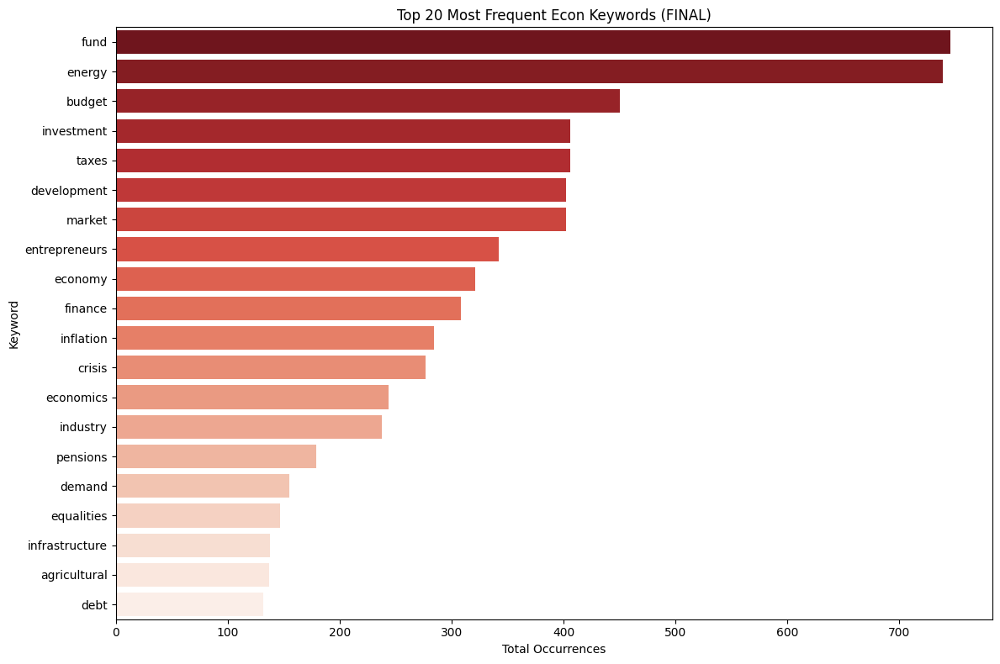

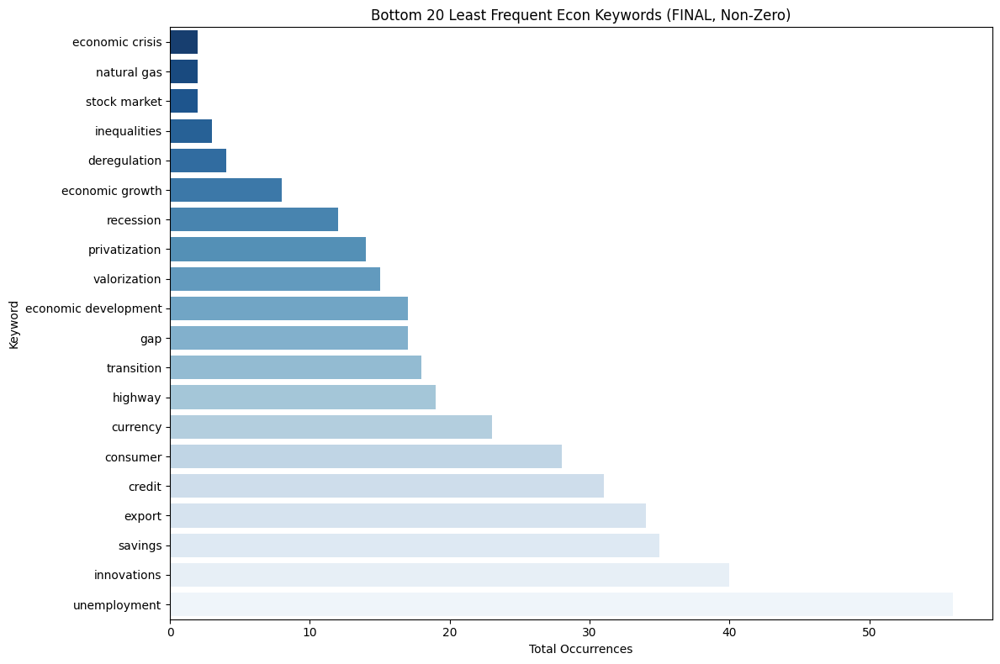

--------------------------------------------------



----- Comparison of FINAL Method with Previous Methods -----
Comparing 'has_econ_term_FILTERED' (after final filtering) with: has_exact_econ_word_naive, has_exact_econ_word_regex, has_exact_econ_word_flashtext, has_exact_econ_word_ac

Total Flagged by FINAL Method (has_econ_term_FILTERED): 6089

--- Comparing with: has_exact_econ_word_naive ---
Total Flagged by 'has_exact_econ_word_naive' (in remaining data): 3617
Tweets Flagged by BOTH 'has_exact_econ_word_naive' AND 'has_econ_term_FILTERED': 3502
Agreement: 96.82% of remaining 'has_exact_econ_word_naive' tweets also flagged by 'has_econ_term_FILTERED'.
Agreement: 57.51% of 'has_econ_term_FILTERED' tweets also flagged by 'has_exact_econ_word_naive'.

--- Comparing with: has_exact_econ_word_regex ---
Total Flagged by 'has_exact_econ_word_regex' (in remaining data): 5030
Tweets Flagged by BOTH 'has_exact_econ_word_regex' AND 'has_econ_term_FILTERED': 4886
Agreement: 97.14% of remaini

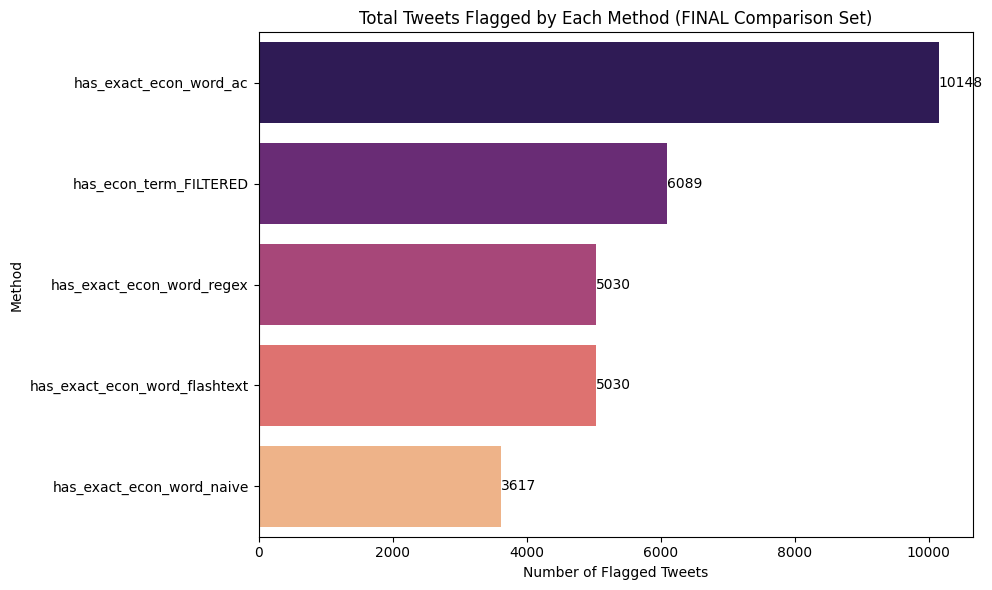


Comparison Summary Table (FINAL vs Previous):


,Method,Total Flags (Method),Total Flags (FINAL),Flags in Both,% of has_exact_econ_word_naive in FINAL,% of FINAL in has_exact_econ_word_naive,% of has_exact_econ_word_regex in FINAL,% of FINAL in has_exact_econ_word_regex,% of has_exact_econ_word_flashtext in FINAL,% of FINAL in has_exact_econ_word_flashtext,% of has_exact_econ_word_ac in FINAL,% of FINAL in has_exact_econ_word_ac
0,has_exact_econ_word_naive,3617,6089,3502,96.82,57.51,NaN,NaN,NaN,NaN,NaN,NaN
1,has_exact_econ_word_regex,5030,6089,4886,NaN,NaN,97.14,80.24,NaN,NaN,NaN,NaN
2,has_exact_econ_word_flashtext,5030,6089,4886,NaN,NaN,NaN,NaN,97.14,80.24,NaN,NaN
3,has_exact_econ_word_ac,10148,6089,5745,NaN,NaN,NaN,NaN,NaN,NaN,56.61,94.35



--------------------------------------------------




In [29]:
# ==============================================================================
# Script Summary
# ==============================================================================
# This script performs the following steps:
# 1.  SETUP: Loads models, keywords, data, and prepares helper dictionaries/automata.
# 2.  DEFINE EXTRACTION FUNCTIONS: Defines an original lemma/MWE keyword extraction
#     function and a refined version incorporating NER/POS contextual filtering.
# 3.  APPLY ORIGINAL EXTRACTION: Runs the original function on the dataset, storing
#     results (matched keywords, boolean flag) with an '_ORIG' suffix.
# 4.  APPLY REFINED EXTRACTION: Runs the refined function, storing its results
#     (extracted terms, matched keywords, boolean flag) with a '_FILTERED' suffix.
# 5.  COMPARE EXTRACTIONS: Compares the flagged counts and shows examples of
#     differences between the original and refined keyword extraction methods.
# 6.  FINAL FILTERING: Identifies and REMOVES rows from the main DataFrame
#     (`df_clean_translated`) where the *only* keywords found by the refined
#     method were 'equality' or 'inequalities'. All subsequent analyses use
#     this modified DataFrame.
# 7.  TIME PERIOD ANALYSIS: Compares the count and percentage of finally flagged
#     economic tweets across two defined time periods.
# 8.  KEYWORD POPULARITY ANALYSIS: Calculates and visualizes the frequency of
#     each economic keyword found by the final refined method across all flagged tweets.
# 9.  COMPARISON WITH PREVIOUS EXACT METHODS: Compares the final refined flagging
#     results against four earlier exact-match methods (Naive, Regex, FlashText, Aho-Corasick),
#     showing total counts and agreement percentages.
# 10. SPECIFIC KEYWORD CHECK: Allows for focused examination of tweets containing
#     user-defined specific keywords (e.g., 'equality', 'inequalities' to verify
#     the effect of filtering) based on the final refined results.
# 11. DIFFERENCE ANALYSIS (Refined vs. Exact): For each of the four exact-match
#     methods, this step identifies and displays sample tweets where the final refined
#     method's flagging decision differs. It also analyzes the keywords most
#     frequently found by the refined method in cases where it flagged a tweet
#     but the specific exact method did not.
# ==============================================================================

import spacy
import ahocorasick
import pandas as pd
from collections import defaultdict, Counter
import os # Needed for file checks
import random # Needed for sampling
# Import tqdm for the progress bar
from tqdm.auto import tqdm # auto selects notebook or console version
# Import libraries for analysis and visualization
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ==============================================================================
# 1. SETUP
# ==============================================================================
print("=" * 50)
print("----- Setup Stage -----")
print("=" * 50)
print()

# --- Load spaCy Model ---
try:
    nlp = spacy.load("en_core_web_lg")
    print("Loaded spaCy model: en_core_web_lg")
except OSError:
    print("Trying medium model 'en_core_web_md'...")
    try: nlp = spacy.load("en_core_web_md"); print("Loaded spaCy model: en_core_web_md")
    except OSError:
        print("Trying small model 'en_core_web_sm'...")
        try: nlp = spacy.load("en_core_web_sm"); print("Loaded spaCy model: en_core_web_sm")
        except OSError:
            print("ERROR: No English spaCy model found. Install one: python -m spacy download en_core_web_lg (or md/sm)"); raise RuntimeError("spaCy model loading failed.")

# !!!!!!!!!!!!!!!!!!!! D O U B L E C H E C K !!!!!!!!!!!!!!!!!!!!!!!
# !!! ENSURE 'economic_words_list' IS DEFINED BEFORE THIS SCRIPT !!!
if 'economic_words_list' not in globals():
     raise NameError("'economic_words_list' is not defined. Please define it above this script.")

print(f"Using economic keyword list with {len(economic_words_list)} items.")

# --- Separate Single Words and MWEs ---
single_words = []
multi_word_expressions = []
for word in economic_words_list:
    if ' ' in word or '-' in word: multi_word_expressions.append(word)
    else: single_words.append(word)
print(f"Separated into {len(single_words)} single words and {len(multi_word_expressions)} MWEs.")

# --- Lemmatize Target Single Words (English) ---
target_lemmas = defaultdict(list)
if nlp:
    print("Lemmatizing target single words...")
    for word in single_words:
        doc = nlp(word.lower())
        if len(doc) > 0: target_lemmas[doc[0].lemma_].append(word) # Map lemma to original word(s)
    print(f"Target lemmas created: {len(target_lemmas)} unique lemmas.")
else:
    print("CRITICAL ERROR: spaCy model not loaded.") # Should be caught above

# --- Build Aho-Corasick Automaton for MWEs (English) ---
A_mwe = ahocorasick.Automaton()
print("Building Aho-Corasick automaton for MWEs...")
for mwe in multi_word_expressions: A_mwe.add_word(mwe.lower(), (mwe, 'mwe'))
A_mwe.make_automaton()
print(f"Aho-Corasick automaton built.")

# --- Ensure DataFrame Exists ---
# !!! ENSURE 'df_clean_translated' IS LOADED AND AVAILABLE !!! -> for the sake of not matching dataset names due to changes introduced
if 'df_clean_translated' not in globals(): raise NameError("'df_clean_translated' DataFrame not defined.")
else: print(f"Using DataFrame 'df_clean_translated' with {len(df_clean_translated)} rows.")

# --- Ensure Text Column Exists ---
text_column = 'text_clean_en' # Ensure this is your correct text column
if text_column not in df_clean_translated.columns:
    raise KeyError(f"Text column '{text_column}' not found in DataFrame. Available: {df_clean_translated.columns.tolist()}")

print()
print("-" * 50)
print("----> Setup Complete <----")
print("-" * 50)
print()
print()


# ==============================================================================
# 2. DEFINE EXTRACTION FUNCTIONS
# ==============================================================================
print()
print("=" * 50)
print("----- Defining Extraction Functions -----")
print("=" * 50)

# --- Function 2a: Original Lemma + MWE Extraction ---
def extract_economic_terms_lemma_mwe_en(text, nlp_model, mwe_automaton, target_lemma_dict):
    """ ORIGINAL: Extracts terms based on lemmatization and MWE matching. """
    if pd.isna(text) or not nlp_model: return [], set()
    found_original_terms = set()
    matched_base_keywords = set()
    text_lower = text.lower()
    mwe_match_indices = set()
    mwe_hits = []
    for end_index, (original_mwe, type_tag) in mwe_automaton.iter(text_lower):
        start_index = end_index - len(original_mwe) + 1
        mwe_hits.append({'mwe': original_mwe, 'start': start_index, 'end': end_index, 'matched_text': text_lower[start_index:end_index+1]})
        for i in range(start_index, end_index + 1): mwe_match_indices.add(i)
    for hit in mwe_hits:
         matched_base_keywords.add(hit['mwe'])
         found_original_terms.add(hit['matched_text'])
    doc = nlp_model(text)
    for token in doc:
        token_start_char, token_end_char = token.idx, token.idx + len(token.text)
        token_char_indices = set(range(token_start_char, token_end_char))
        if not token_char_indices.isdisjoint(mwe_match_indices): continue # Skip if part of MWE

        token_lemma = token.lemma_.lower()
        if token_lemma in target_lemma_dict:
            found_original_terms.add(token.text)
            for base_keyword in target_lemma_dict[token_lemma]: matched_base_keywords.add(base_keyword)
    return list(found_original_terms), matched_base_keywords # Fixed commented return

# --- Function 2b: Refined Extraction with NER/POS Filters ---

# Define known non-economic entities containing keywords to ignore
# !!! CHANGE LIST IF NECESSARY !!!
NON_ECONOMIC_ORG_ENTITIES = {
    'europarlament', 'european parliament', 'europol',
}

# Define POS tags to keep for ambiguous words 
# !!! HANGE LIST IF NECESSARY !!!
# Common Universal POS tags: NOUN, PROPN (Proper Noun), VERB, ADJ (Adjective), ADV (Adverb), SYM (Symbol)
RELEVANT_POS_TAGS = {
    # Nouns vs Verbs
    'bank':         {'NOUN', 'PROPN'},
    'market':       {'NOUN', 'PROPN'},
    'trade':        {'NOUN', 'PROPN'},
    'fund':         {'NOUN', 'PROPN', 'VERB'}, # Keep VERB based on previous finding
    'finance':      {'NOUN', 'PROPN', 'VERB'}, # Keep VERB based on previous finding
    'credit':       {'NOUN'},
    'demand':       {'NOUN'},
    'supply':       {'NOUN'},
    'export':       {'NOUN', 'VERB'}, # UPDATED: Allow VERB 'to export'/'exporting'
    'import':       {'NOUN', 'VERB'}, # UPDATED: Allow VERB 'to import'/'importing'
    'investment':   {'NOUN'},
    'development':  {'NOUN'},
    'savings':      {'NOUN'},
    'tax':          {'NOUN'},
    'pension':      {'NOUN', 'PROPN'},
    'growth':       {'NOUN'},

    # Specific Cases
    'equality':     {'NOUN'},
    'inequalities': {'NOUN'},
    'euro':         {'PROPN', 'NOUN'},
    'crisis':       {'NOUN'},

}

def extract_economic_terms_filtered(text, nlp_model, mwe_automaton, target_lemma_dict):
    """ REFINED: Extracts terms using Lemma+MWE + NER/POS context filters. """
    if pd.isna(text) or not nlp_model: return [], set()
    found_original_terms = set()
    matched_base_keywords = set()
    text_lower = text.lower()

    # 1. Find MWEs
    mwe_match_indices = set()
    mwe_hits = []
    for end_index, (original_mwe, type_tag) in mwe_automaton.iter(text_lower):
        start_index = end_index - len(original_mwe) + 1
        mwe_hits.append({'mwe': original_mwe, 'start': start_index, 'end': end_index, 'matched_text': text_lower[start_index:end_index+1]})
        for i in range(start_index, end_index + 1): mwe_match_indices.add(i)
    for hit in mwe_hits:
         matched_base_keywords.add(hit['mwe'])
         found_original_terms.add(hit['matched_text'])

    # 2. Process with spaCy
    doc = nlp_model(text)

    # --- Pre-calculate indices covered by unwanted entities ---
    unwanted_entity_char_indices = set()
    for ent in doc.ents:
        if ent.label_ == 'ORG' and ent.text.lower() in NON_ECONOMIC_ORG_ENTITIES:
            for i in range(ent.start_char, ent.end_char): unwanted_entity_char_indices.add(i)
        # Add more entity checks if needed

    # 3. Find single-word lemma matches WITH context checks
    for token in doc:
        token_start_char, token_end_char = token.idx, token.idx + len(token.text)
        token_char_indices = set(range(token_start_char, token_end_char))

        # --- CONTEXT CHECKS ---
        ignore_match = False
        # a) Check MWE Overlap
        if not token_char_indices.isdisjoint(mwe_match_indices): continue # Skip if part of MWE
        # b) Check Unwanted Entity Overlap
        if not token_char_indices.isdisjoint(unwanted_entity_char_indices): ignore_match = True
        # c) Check POS
        token_lemma = token.lemma_.lower()
        if not ignore_match and token_lemma in RELEVANT_POS_TAGS:
            if token.pos_ not in RELEVANT_POS_TAGS[token_lemma]: ignore_match = True
        # --- END CONTEXT CHECKS ---

        if not ignore_match and token_lemma in target_lemma_dict:
            found_original_terms.add(token.text)
            for base_keyword in target_lemma_dict[token_lemma]: matched_base_keywords.add(base_keyword)

    return list(found_original_terms), matched_base_keywords

# --- Function 2c: Helper for Difference Analysis (defined once) ---
def check_term_match_difference(row):
    """ Compares sets of extracted vs matched keywords for difference analysis. """
    # Expects a dictionary-like row with 'extracted_terms_en' and 'matched_keywords_en' keys
    try:
        extracted = set(t.lower() for t in row['extracted_terms_en'] if isinstance(t, str))
        matched = set(k.lower() for k in row['matched_keywords_en'] if isinstance(k, str))
        return extracted != matched
    except Exception:
        return None # Handle errors

print()
print("-" * 50)
print("----> Extraction functions defined. <----")
print("-" * 50)
print()
print()


# ==============================================================================
# 3. APPLY **ORIGINAL** EXTRACTION TO DATAFRAME
# ==============================================================================
print()
print("=" * 80)
print("----- Applying ORIGINAL Term Extraction (Lemma + MWE) -----")
print("=" * 80)

tqdm.pandas(desc="Extracting Original Terms")
results_orig = df_clean_translated[text_column].progress_apply(
    lambda text: extract_economic_terms_lemma_mwe_en(text, nlp, A_mwe, target_lemmas)
)
# Store original matched keywords and flag
df_clean_translated['matched_keywords_ORIG'] = results_orig.apply(lambda x: list(x[1]))
df_clean_translated['has_econ_term_ORIG'] = df_clean_translated['matched_keywords_ORIG'].apply(lambda x: len(x) > 0)
num_flagged_orig = df_clean_translated['has_econ_term_ORIG'].sum()
total_rows_orig = len(df_clean_translated)
print(f"ORIGINAL method flagged: {num_flagged_orig} tweets ({num_flagged_orig/total_rows_orig:.2%})")
print()
print("-" * 50)
print("----> Original Term Extraction Complete <----")
print("-" * 50)
print()
print()


# ==============================================================================
# 4. APPLY **REFINED** EXTRACTION TO DATAFRAME
# ==============================================================================
print()
print("=" * 50)
print("----- Applying REFINED Term Extraction (Lemma + MWE + Filters) -----")
print("=" * 50)

tqdm.pandas(desc="Extracting Refined Terms")
results_filtered = df_clean_translated[text_column].progress_apply(
    lambda text: extract_economic_terms_filtered(text, nlp, A_mwe, target_lemmas)
)
# Store refined extracted terms, matched keywords, and flag
df_clean_translated['extracted_terms_FILTERED'] = results_filtered.apply(lambda x: x[0])
df_clean_translated['matched_keywords_FILTERED'] = results_filtered.apply(lambda x: list(x[1]))
df_clean_translated['has_econ_term_FILTERED'] = df_clean_translated['matched_keywords_FILTERED'].apply(lambda x: len(x) > 0)
num_flagged_filtered = df_clean_translated['has_econ_term_FILTERED'].sum()
total_rows_filtered = len(df_clean_translated)
print(f"REFINED method flagged:  {num_flagged_filtered} tweets ({num_flagged_filtered/total_rows_filtered:.2%})")

print()
print("-" * 50)
print("----> Refined Term Extraction Complete <----")
print("-" * 50)
print()
print()


# ==============================================================================
# 5. COMPARE ORIGINAL vs. REFINED EXTRACTION RESULTS
# ==============================================================================
print()
print("=" * 50)
print("----- Comparing Original vs. Refined Extraction Method -----")
print("=" * 50)
print() 

orig_flag_col = 'has_econ_term_ORIG'
filt_flag_col = 'has_econ_term_FILTERED'
orig_kw_col = 'matched_keywords_ORIG'
filt_kw_col = 'matched_keywords_FILTERED'
text_col = 'text_clean_en'

missing_compare_cols = [c for c in [orig_flag_col, filt_flag_col, orig_kw_col, filt_kw_col, text_col] if c not in df_clean_translated.columns]
if missing_compare_cols:
    print(f"ERROR: Missing columns needed for comparison: {missing_compare_cols}. Skipping.")
else:
    num_flagged_orig_comp = df_clean_translated[orig_flag_col].sum() # Recalc or use previous
    num_flagged_filtered_comp = df_clean_translated[filt_flag_col].sum() # Recalc or use previous
    num_removed = num_flagged_orig_comp - num_flagged_filtered_comp
    perc_removed = (num_removed / num_flagged_orig_comp * 100) if num_flagged_orig_comp > 0 else 0
    print(f"Original Method flagged: {num_flagged_orig_comp} tweets")
    print(f"Refined Method flagged:  {num_flagged_filtered_comp} tweets")
    print(f"Tweets removed by NER/POS filtering: {num_removed} ({perc_removed:.2f}% of original)")
    print("-" * 50)
    both_flagged = df_clean_translated[df_clean_translated[orig_flag_col] & df_clean_translated[filt_flag_col]].shape[0]
    orig_only = df_clean_translated[df_clean_translated[orig_flag_col] & ~df_clean_translated[filt_flag_col]].shape[0]
    filt_only = df_clean_translated[~df_clean_translated[orig_flag_col] & df_clean_translated[filt_flag_col]].shape[0]
    print("Overlap Analysis:")
    print(f"- Flagged by Both: {both_flagged}")
    print(f"- Flagged by Original ONLY (Removed by NER/POS Filter): {orig_only}")
    print(f"- Flagged by Filtered ONLY (Added by Filter?): {filt_only}") # Should be 0
    print("-" * 50)
    if orig_only > 0:
        print(f"\nShowing up to 200 examples of tweets REMOVED by NER/POS filtering:")
        df_removed = df_clean_translated[df_clean_translated[orig_flag_col] & ~df_clean_translated[filt_flag_col]].copy()
        cols_to_show = [text_col, orig_kw_col, filt_kw_col]
        if 'id' in df_clean_translated.columns: cols_to_show.insert(0, 'id') 
        try: display(df_removed[cols_to_show].head(200))
        except NameError: print(df_removed[cols_to_show].head(200).to_string())
    else: print("\nNo tweets were removed by the NER/POS filtering process.")


# ==============================================================================
# 6. FINAL FILTERING: Remove rows containing ONLY 'equality'/'inequalities' as these tweets were manually checked and it was found out that they are not relvevant to the ecnomic topics; they are related to the social equality issues 
# ==============================================================================
print()
print("=" * 50)
print("----- Final Filtering: Removing 'equality'/'inequalities'-only tweets -----")
print("=" * 50)

keywords_to_check_alone = {'equality', 'inequalities'}
refined_flag_col_ff = 'has_econ_term_FILTERED' # Input flag
refined_kw_col_ff = 'matched_keywords_FILTERED' # Input keywords

if refined_flag_col_ff not in df_clean_translated.columns or refined_kw_col_ff not in df_clean_translated.columns:
    print(f"ERROR: Required columns ('{refined_flag_col_ff}', '{refined_kw_col_ff}') not found. Skipping removal.")
else:
    def contains_only_target(keyword_list):
        if not isinstance(keyword_list, list) or not keyword_list: return False
        return all(kw in keywords_to_check_alone for kw in keyword_list)
    rows_to_remove_mask = (
        df_clean_translated[refined_flag_col_ff] &
        df_clean_translated[refined_kw_col_ff].apply(contains_only_target)
    )
    indices_to_remove = df_clean_translated[rows_to_remove_mask].index
    num_rows_to_remove = len(indices_to_remove)
    total_rows_before = len(df_clean_translated)
    num_flagged_filtered_before_ff = df_clean_translated[refined_flag_col_ff].sum()
    print(f"\nStats BEFORE removal:")
    print(f"- Total rows: {total_rows_before}")
    print(f"- Rows flagged by refined method: {num_flagged_filtered_before_ff}")
    print(f"- Rows identified for removal (flagged with only {keywords_to_check_alone}): {num_rows_to_remove}")
    if num_rows_to_remove > 0:
        print(f"\nRemoving {num_rows_to_remove} rows from 'df_clean_translated' IN PLACE...")
        df_clean_translated.drop(index=indices_to_remove, inplace=True) # Modify inplace
        print("Rows removed.")
        # Optional: Reset index after dropping
        # df_clean_translated.reset_index(drop=True, inplace=True)
    else: print("\nNo rows met the criteria for removal.")
    total_rows_after = len(df_clean_translated)
    num_flagged_after_removal = df_clean_translated[refined_flag_col_ff].sum() # Flag count on modified DF
    print(f"\nStats AFTER removal (in modified 'df_clean_translated'):")
    print(f"- Total rows remaining: {total_rows_after}")
    print(f"- Rows flagged by refined method remaining: {num_flagged_after_removal}")

print()
print("-" * 50)
print()
print()


# ==============================================================================
# 7. TIME PERIOD ANALYSIS (Using FINAL Results)
# ==============================================================================
print()
print("=" * 50)
print("----- Time Period Analysis (Based on FINAL Flags) -----")
print("=" * 50)

date_column = 'created_at'
# Use the flag column that reflects the state *after* the inplace drop
flag_column_name_for_analysis = 'has_econ_term_FILTERED'

if date_column not in df_clean_translated.columns:
    print(f"ERROR: Date column '{date_column}' not found. Skipping time analysis.")
    print(f"       Available columns: {df_clean_translated.columns.tolist()}")
elif flag_column_name_for_analysis not in df_clean_translated.columns:
    print(f"ERROR: Flag column '{flag_column_name_for_analysis}' not found. Skipping time analysis.")
else:
    print(f"Using date column: '{date_column}'")
    print(f"Using flag column: '{flag_column_name_for_analysis}' (Reflects data after final filtering)")
    try:
        # Operate on a copy for safety if date conversion drops rows
        df_temp_time = df_clean_translated.copy()
        df_temp_time[date_column] = pd.to_datetime(df_temp_time[date_column], errors='coerce')
        initial_rows = len(df_temp_time)
        df_temp_time.dropna(subset=[date_column], inplace=True)
        rows_dropped = initial_rows - len(df_temp_time)
        if rows_dropped > 0: print(f"Dropped {rows_dropped} rows due to invalid date format for this analysis.")

        start_date_p1=pd.Timestamp("2022-10-15"); end_date_p1=pd.Timestamp("2023-10-15")
        start_date_p2=pd.Timestamp("2023-10-16"); end_date_p2=df_temp_time[date_column].max()
        print(f"Period 1: {start_date_p1.date()} to {end_date_p1.date()}")
        print(f"Period 2: {start_date_p2.date()} to {end_date_p2.date()}")
        df_period1 = df_temp_time[(df_temp_time[date_column] >= start_date_p1) & (df_temp_time[date_column] <= end_date_p1)].copy()
        df_period2 = df_temp_time[(df_temp_time[date_column] >= start_date_p2) & (df_temp_time[date_column] <= end_date_p2)].copy()
        if df_period1.empty or df_period2.empty: print("WARNING: One or both time periods resulted in empty DataFrames.")
        else:
            flagged_p1 = df_period1[flag_column_name_for_analysis].sum(); total_p1 = len(df_period1)
            flagged_p2 = df_period2[flag_column_name_for_analysis].sum(); total_p2 = len(df_period2)
            print("\nComparison of FINAL Flagged Tweets:")
            print(f"Period 1: {flagged_p1} flagged out of {total_p1} total ({flagged_p1/total_p1:.2% if total_p1 > 0 else 0})")
            print(f"Period 2: {flagged_p2} flagged out of {total_p2} total ({flagged_p2/total_p2:.2% if total_p2 > 0 else 0})")
    except Exception as e: print(f"An error occurred during date processing or filtering: {e}")

print()
print("-" * 50)
print()
print()


# ==============================================================================
# 8. KEYWORD POPULARITY ANALYSIS (Using FINAL Results)
# ==============================================================================
print()
print("=" * 50)
print("----- Keyword Popularity Analysis (Based on FINAL Results) -----")
print("Note: Keyword frequency counts TOTAL occurrences.")
print("=" * 50)

# Use the flag and keyword columns reflecting the state *after* inplace drop
final_flag_col = 'has_econ_term_FILTERED'
final_kw_col = 'matched_keywords_FILTERED'

if final_flag_col not in df_clean_translated.columns or final_kw_col not in df_clean_translated.columns:
    print(f"ERROR: Columns ('{final_flag_col}', '{final_kw_col}') not found. Skipping popularity analysis.")
else:
    keywords_to_remove_pop = {'equality', 'inequalities'} # Define again for safety
    all_base_keywords_from_list_final = set(multi_word_expressions)
    for lemma, original_words in target_lemmas.items():
        if original_words and original_words[0] not in keywords_to_remove_pop:
            all_base_keywords_from_list_final.add(original_words[0])
    print(f"Analyzing frequency based on {len(all_base_keywords_from_list_final)} unique base keywords (excluding filtered).")
    keyword_counts_all_final = Counter({keyword: 0 for keyword in all_base_keywords_from_list_final})
    actual_matched_keywords_final = [
        keyword for sublist in df_clean_translated.loc[df_clean_translated[final_flag_col], final_kw_col]
        if isinstance(sublist, list) for keyword in sublist
    ]
    if not actual_matched_keywords_final:
        print("No keywords remained after final filtering. Skipping popularity analysis.")
    else:
        actual_counts_final = Counter(actual_matched_keywords_final)
        keyword_counts_all_final.update(actual_counts_final)
        df_keyword_counts_final = pd.DataFrame(keyword_counts_all_final.items(), columns=['Keyword', 'Frequency'])
        df_keyword_counts_final = df_keyword_counts_final.sort_values(by=['Frequency', 'Keyword'], ascending=[False, True])
        print("Keyword Frequencies (FINAL Method):")
        print(df_keyword_counts_final.head(10))
        print("..."); print(df_keyword_counts_final.tail(10))
        num_keywords_to_plot = 20
        df_non_zero_counts_final = df_keyword_counts_final[df_keyword_counts_final['Frequency'] > 0].copy()
        df_non_zero_counts_sorted_asc_final = df_non_zero_counts_final.sort_values(by=['Frequency', 'Keyword'], ascending=[True, True])
        if not df_non_zero_counts_final.empty:
            plt.figure(figsize=(12, 8)); top_keywords_to_plot = df_keyword_counts_final.head(num_keywords_to_plot)
            sns.barplot(data=top_keywords_to_plot, y='Keyword', x='Frequency', palette='Reds_r', hue = 'Keyword')
            plt.title(f'Top {min(num_keywords_to_plot, len(df_keyword_counts_final))} Most Frequent Econ Keywords (FINAL)')
            plt.xlabel('Total Occurrences'); plt.ylabel('Keyword'); plt.tight_layout(); plt.show()
            if len(df_non_zero_counts_final) > 1:
                plt.figure(figsize=(12, 8)); bottom_keywords_to_plot = df_non_zero_counts_sorted_asc_final.head(num_keywords_to_plot)
                sns.barplot(data=bottom_keywords_to_plot, y='Keyword', x='Frequency', palette='Blues_r', hue = 'Keyword')
                plt.title(f'Bottom {min(num_keywords_to_plot, len(df_non_zero_counts_final))} Least Frequent Econ Keywords (FINAL, Non-Zero)')
                plt.xlabel('Total Occurrences'); plt.ylabel('Keyword'); plt.tight_layout(); plt.show()
            elif len(df_non_zero_counts_final) == 1: print("\nOnly one keyword category had non-zero frequency (FINAL method).")
        else: print("No non-zero keyword counts to visualize (FINAL method).")

print("-" * 50)
print()
print()


# ==============================================================================
# 9. COMPARISON WITH PREVIOUS METHODS (Naive, Regex, etc.) (Using FINAL Results)
# ==============================================================================
print()
print("=" * 50)
print("----- Comparison of FINAL Method with Previous Methods -----")
print("=" * 50)

flag_cols_to_compare = [
    'has_exact_econ_word_naive', 'has_exact_econ_word_regex',
    'has_exact_econ_word_flashtext', 'has_exact_econ_word_ac'
]
# Use the flag column reflecting state *after* inplace drop
final_method_flag = 'has_econ_term_FILTERED'
all_compare_cols = flag_cols_to_compare + [final_method_flag]
missing_cols = [col for col in all_compare_cols if col not in df_clean_translated.columns]
if missing_cols:
    print(f"ERROR: Required flag columns missing: {missing_cols}. Skipping comparison.")
else:
    print(f"Comparing '{final_method_flag}' (after final filtering) with: {', '.join(flag_cols_to_compare)}")
    comparison_results_final = []
    final_method_total = df_clean_translated[final_method_flag].sum() # Count on modified DF
    print(f"\nTotal Flagged by FINAL Method ({final_method_flag}): {final_method_total}\n")
    comparison_summary_final = {final_method_flag: final_method_total}
    for method_flag in flag_cols_to_compare:
        # IMPORTANT: Compare against counts from the *modified* df_clean_translated
        # If the naive/regex flags were calculated *before* the drop, the comparison % might be slightly off
        if method_flag not in df_clean_translated.columns:
            print(f"Warning: Column {method_flag} not found in final dataframe, skipping comparison for it.")
            continue
        other_method_total = df_clean_translated[method_flag].sum() # Count remaining naive/etc flags
        comparison_summary_final[method_flag] = other_method_total
        both_flagged = df_clean_translated[df_clean_translated[method_flag] & df_clean_translated[final_method_flag]].shape[0]
        perc_other_in_final = (both_flagged / other_method_total * 100) if other_method_total > 0 else 0
        perc_final_in_other = (both_flagged / final_method_total * 100) if final_method_total > 0 else 0
        print(f"--- Comparing with: {method_flag} ---")
        print(f"Total Flagged by '{method_flag}' (in remaining data): {other_method_total}")
        print(f"Tweets Flagged by BOTH '{method_flag}' AND '{final_method_flag}': {both_flagged}")
        print(f"Agreement: {perc_other_in_final:.2f}% of remaining '{method_flag}' tweets also flagged by '{final_method_flag}'.")
        print(f"Agreement: {perc_final_in_other:.2f}% of '{final_method_flag}' tweets also flagged by '{method_flag}'.\n")
        comparison_results_final.append({
            'Method': method_flag, 'Total Flags (Method)': other_method_total,
            'Total Flags (FINAL)': final_method_total, 'Flags in Both': both_flagged,
            f'% of {method_flag} in FINAL': perc_other_in_final, f'% of FINAL in {method_flag}': perc_final_in_other
        })
    if comparison_summary_final:
        df_summary = pd.DataFrame(list(comparison_summary_final.items()), columns=['Method', 'Total Flagged Tweets'])
        df_summary = df_summary.sort_values(by='Total Flagged Tweets', ascending=False)
        plt.figure(figsize=(10, 6)); barplot = sns.barplot(data=df_summary, y='Method', x='Total Flagged Tweets', palette='magma', hue='Method')
        plt.title('Total Tweets Flagged by Each Method (FINAL Comparison Set)')
        plt.xlabel('Number of Flagged Tweets'); plt.ylabel('Method')
        for i in barplot.containers: barplot.bar_label(i,)
        plt.tight_layout(); plt.show()
    if comparison_results_final:
        df_comparison_table = pd.DataFrame(comparison_results_final)
        print("\nComparison Summary Table (FINAL vs Previous):")
        try: display(df_comparison_table.round(2))
        except NameError: print(df_comparison_table.round(2).to_string())

print()
print("-" * 50)
print()
print()

In [30]:
# # DEBUGGING: Check specific tweet examples and theiir tokenization details 
# print("--- Debugging Tweet 8654 ---")
# text_8654 = "RECEIPTS OF Terror are PiS's fault ❗ ️  Taxes may be lower and therefore prices may also be lower.  will make it happen!  ✅️"
# doc_8654 = nlp(text_8654)
# print(f"Processing text: '{text_8654}'")
# print("Token Details (Text, Lemma, POS, Fine-grained Tag, Entity Type):")
# for token in doc_8654:
#     print(f"- {token.text:<15} {token.lemma_:<15} {token.pos_:<7} {token.tag_:<5} {token.ent_type_}")
# print("-" * 30)

In [31]:
text_pensions = "INHERITANCE OF PENSIONS"
doc = nlp(text_pensions)
print([(t.text, t.lemma_, t.pos_, t.tag_, t.ent_type_) for t in doc if t.text.upper() == 'PENSIONS'])

[('PENSIONS', 'PENSIONS', 'PROPN', 'NNPS', '')]


In [32]:
df_clean_translated

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext,matched_exact_econ_words_ac,has_exact_econ_word_ac,matched_keywords_ORIG,has_econ_term_ORIG,extracted_terms_FILTERED,matched_keywords_FILTERED,has_econ_term_FILTERED
0,2024-10-15 19:49:34+00:00,"@donaldtusk Niezrealizowanie większości ze ""10...",1846277256509116672,1.182212e+09,{'editable_until': '2024-10-15 20:49:34+00:00'...,False,everyone,pl,[1846277256509116623],1.846092e+18,...,False,[],False,[],False,[],False,[],[],False
1,2024-10-15 16:12:19+00:00,Rok po wyborach trzeba powiedzieć jedno - nie ...,1846222583898784000,1.182212e+09,{'editable_until': '2024-10-15 17:12:19+00:00'...,False,everyone,pl,[1846222583898784025],1.846223e+18,...,False,[],False,[],False,[],False,[],[],False
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,True,[crisis],True,"[crisis, demand]",True,"[crisis, demand]",True,"[crisis, demands]","[crisis, demand]",True
3,2024-10-15 07:32:44+00:00,Mija rok od wyborów parlamentarnych. W kampani...,1846091824101769472,1.182212e+09,{'editable_until': '2024-10-15 08:32:44+00:00'...,False,everyone,pl,[1846091824101769490],1.846092e+18,...,False,[],False,[],False,[],False,[],[],False
4,2024-10-15 06:27:14+00:00,#Idę11 🇵 🇱 https://t.co/KiCe5ATOpX,1846075343188144128,1.182212e+09,{'editable_until': '2024-10-15 07:27:14+00:00'...,False,everyone,qme,[1846075343188144153],1.846075e+18,...,False,[],False,[],False,[],False,[],[],False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48326,2023-09-29 11:30:44+00:00,"Studiujesz na kierunku lekarskim, pielęgniarst...",1707719554355380480,9.611819e+08,{'editable_until': '2023-09-29 12:30:44+00:00'...,False,everyone,pl,[1707719554355380484],1.707720e+18,...,False,[],False,[],False,[],False,[],[],False
48327,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,False,[],False,[VAT],True,[],False,[],[],False
48328,2023-09-15 12:59:29+00:00,Płockie Centrum Onkologii gotowe! Już na począ...,1702668459576786944,9.611819e+08,{'editable_until': '2023-09-15 13:59:29+00:00'...,False,everyone,pl,[1702668459576787064],1.702668e+18,...,False,[],False,[],False,[],False,[],[],False
48329,2023-09-13 14:07:56+00:00,To jedna z największych inwestycji drogowych @...,1701960909369868544,9.611819e+08,{'editable_until': '2023-09-13 15:07:56+00:00'...,False,everyone,pl,[1701960909369868437],1.701961e+18,...,False,[],False,[investment],True,[investment],True,[investments],[investment],True


In [ ]:
# ==============================================================================
# 10. ANALYSIS: Focus on Specific Keywords (Using FINAL Results)
# ==============================================================================
print("=" * 90)
print("----- Analysis of Specific Keywords (Based on FINAL Results) -----")
print("=" * 90)

# !!! DEFINE the specific keywords for checking here !!!
target_specific_keywords = ['equalities', 'inequalities'] # Check these again to verify removal, adjust later if needed
final_flag_col_spec = 'has_econ_term_FILTERED' # Flag reflecting state after drop
final_kw_col_spec = 'matched_keywords_FILTERED' # Keywords reflecting state after drop
text_col_display_spec = 'text_clean_en'
id_col_display_spec = 'id' 

if final_flag_col_spec not in df_clean_translated.columns or final_kw_col_spec not in df_clean_translated.columns:
    print(f"ERROR: Columns ('{final_flag_col_spec}', '{final_kw_col_spec}') not found. Skipping analysis.")
else:
    try:
        # Use the modified df_clean_translated
        df_flagged_final_spec = df_clean_translated[df_clean_translated[final_flag_col_spec]].copy()
        mask_contains_target = df_flagged_final_spec[final_kw_col_spec].apply(
            lambda keywords_list: isinstance(keywords_list, list) and any(kw in target_specific_keywords for kw in keywords_list)
        )
        df_target_related_final = df_flagged_final_spec[mask_contains_target]
        num_target_tweets_final = len(df_target_related_final)
        if num_target_tweets_final > 0:
            print(f"\nFound {num_target_tweets_final} unique tweets flagged by '{final_flag_col_spec}'")
            print(f"  that STILL contain at least one of the target keyword(s): {', '.join(target_specific_keywords)}")
            print(f"  (This means they co-occurred with other valid keywords).")
            print(f"\nDisplaying ALL {num_target_tweets_final} tweets containing these keywords:")
            cols_to_display_specific = [text_col_display_spec, 'extracted_terms_FILTERED', final_kw_col_spec]
            if id_col_display_spec in df_clean_translated.columns: cols_to_display_specific.insert(0, id_col_display_spec)
            original_max_rows = pd.get_option('display.max_rows')
            pd.set_option('display.max_rows', num_target_tweets_final + 10)
            try: display(df_target_related_final[cols_to_display_specific])
            except NameError: print(df_target_related_final[cols_to_display_specific].to_string())
            finally: pd.set_option('display.max_rows', original_max_rows)
        else:
            print(f"\nConfirmed: No remaining tweets contain ONLY '{', '.join(target_specific_keywords)}' (or they were removed).")
            print(f"Any remaining instances co-occur with other keywords.")
    except Exception as e: print(f"An error occurred during specific keyword analysis: {e}")
print()
print()


# ==============================================================================
# 11. DIFFERENCE ANALYSIS: Final Method vs. Each Exact Match Method (Show Extracted Terms)
# ==============================================================================
# This section compares the final flagged tweets against EACH match method,
# reports counts, and shows samples including extracted terms.
print("=" * 90)
print("--- Difference Analysis: Final Method vs. Each Exact Match Method ---")
print("=" * 90)

# --- Configuration ---
final_refined_flag = 'has_econ_term_FILTERED' # Flag reflecting state after inplace drop
refined_kw_col = 'matched_keywords_FILTERED' # FINAL Matched Keywords reflecting state after inplace drop
refined_extracted_col = 'extracted_terms_FILTERED' # Extracted terms from Refined step (before equality removal)

exact_match_flags = [
    'has_exact_econ_word_naive', 'has_exact_econ_word_regex',
    'has_exact_econ_word_flashtext', 'has_exact_econ_word_ac'
]
exact_match_kw_cols = [
    'matched_exact_econ_words_naive', 'matched_exact_econ_words_regex',
    'matched_exact_econ_words_flashtext', 'matched_exact_econ_words_ac'
]
text_col_diff = 'text_clean_en'
id_col_diff = 'id' # !!! check if correct !!!
n_sample_rows_to_show = 2000 # Number of sample rows to show (adjust if needed)


# --- Loop through each exact match method for comparison ---
for i, exact_flag in enumerate(exact_match_flags):
    print()
    print("-" * 90)
    print("-"*10 + f" Comparing with: {exact_flag} " + "-"*10)
    print("-" * 90)
    
    exact_kw_col = exact_match_kw_cols[i] if i < len(exact_match_kw_cols) else None
    if exact_kw_col and exact_kw_col not in df_clean_translated.columns:
        print(f"INFO: Exact match keyword column '{exact_kw_col}' not found.")
        exact_kw_col = None

    # Check essential flag columns
    required_cols_loop = [final_refined_flag, exact_flag]
    missing_cols_loop = [c for c in required_cols_loop if c not in df_clean_translated.columns]
    if missing_cols_loop:
        print(f"ERROR: Missing required flag columns: {missing_cols_loop}. Skipping comparison.")
        continue

    # Check optional context columns
    if refined_kw_col not in df_clean_translated.columns:
         print(f"INFO: Refined keyword column '{refined_kw_col}' not found.")
         refined_kw_col = None # Set to None if missing
    if refined_extracted_col not in df_clean_translated.columns:
         print(f"INFO: Refined extracted terms column '{refined_extracted_col}' not found.")
         refined_extracted_col = None # Set to None if missing


    # --- Calculate Disagreement Sets (using the modified df_clean_translated) ---

    # 1. Flagged by FINAL Method, BUT NOT by this Exact Method
    refined_not_exact_mask = (df_clean_translated[final_refined_flag] == True) & (df_clean_translated[exact_flag] == False)
    # Use .loc with mask to avoid potential index issues if rows were dropped
    df_refined_not_exact = df_clean_translated.loc[refined_not_exact_mask].copy()
    count_refined_not_exact = len(df_refined_not_exact)
    print(f"\nTweets flagged by Final Method but NOT by '{exact_flag}': {count_refined_not_exact}")

    if count_refined_not_exact > 0:
        print("   (Indicates gains from lemmatization, MWEs, or filtering differences)")
        print("   Sample (Final=True, Exact=False):")
        # *** MODIFIED cols_to_show ***
        cols_to_show = [text_col_diff]
        if refined_extracted_col: cols_to_show.append(refined_extracted_col) # ADDED Extracted Terms
        if refined_kw_col: cols_to_show.append(refined_kw_col)                # Matched Final Keywords
        if exact_kw_col: cols_to_show.append(exact_kw_col)                   # Exact Matched Keywords
        if id_col_diff in df_clean_translated.columns: cols_to_show.insert(0,id_col_diff)

        # Ensure columns actually exist in the sampled DF before trying to display
        cols_to_display_final = [col for col in cols_to_show if col in df_refined_not_exact.columns]

        try:
            display(df_refined_not_exact[cols_to_display_final].head(n_sample_rows_to_show))
        except NameError:
            print(df_refined_not_exact[cols_to_display_final].head(n_sample_rows_to_show).to_string())

        # Analyze Keywords found by Refined in this subset (using final matched keywords)
        if refined_kw_col and refined_kw_col in df_refined_not_exact.columns: # Check column exists
            keywords_in_diff = [kw for sl in df_refined_not_exact[refined_kw_col] if isinstance(sl, list) for kw in sl]
            if keywords_in_diff:
                keyword_counts_diff = Counter(keywords_in_diff)
                df_keyword_counts_diff = pd.DataFrame(keyword_counts_diff.items(), columns=['Keyword', 'Frequency']).sort_values(by='Frequency', ascending=False)
                print(f"\n   Most Common FINAL Matched Keywords (when '{exact_flag}' missed):") # Clarified label
                try: display(df_keyword_counts_diff.head(10)) # Show top 10
                except NameError: print(df_keyword_counts_diff.head(10).to_string())
            # else: print(f"   No keywords listed in '{refined_kw_col}' for this subset.") # Redundant if count > 0
        # else: print(f"   Cannot analyze keywords: Column '{refined_kw_col}' not found.") # Already checked

    # 2. Flagged by this Exact Method, BUT NOT by FINAL Method
    exact_not_refined_mask = (df_clean_translated[final_refined_flag] == False) & (df_clean_translated[exact_flag] == True)
    df_exact_not_refined = df_clean_translated.loc[exact_not_refined_mask].copy()
    count_exact_not_refined = len(df_exact_not_refined)
    print(f"\nTweets flagged by '{exact_flag}' but NOT by Final Method: {count_exact_not_refined}")

    if count_exact_not_refined > 0:
        print("   (Likely due to NER/POS filters or 'equality'-only removal)")
        print("   Sample (Final=False, Exact=True):")
        # *** MODIFIED cols_to_show ***
        cols_to_show = [text_col_diff]
        if refined_extracted_col: cols_to_show.append(refined_extracted_col) # ADDED Extracted Terms (Context)
        if refined_kw_col: cols_to_show.append(refined_kw_col)                # Matched Final Keywords 
        if exact_kw_col: cols_to_show.append(exact_kw_col)                   # Exact Matched Keywords
        if id_col_diff in df_clean_translated.columns: cols_to_show.insert(0,id_col_diff)

        # Ensure columns actually exist in the sampled DF before trying to display
        cols_to_display_final = [col for col in cols_to_show if col in df_exact_not_refined.columns]

        try:
            display(df_exact_not_refined[cols_to_display_final].head(n_sample_rows_to_show))
        except NameError:
            print(df_exact_not_refined[cols_to_display_final].head(n_sample_rows_to_show).to_string())

print()
print()
print("-" * 90)
print("----> Difference Analysis vs. Exact Methods Complete <----")
print("-" * 90)

----- Analysis of Specific Keywords (Based on FINAL Results) -----

Found 149 unique tweets flagged by 'has_econ_term_FILTERED'
  that STILL contain at least one of the target keyword(s): equalities, inequalities
  (This means they co-occurred with other valid keywords).

Displaying ALL 149 tweets containing these keywords:


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED
1736,1763931255521857792,"Equality, but not for everyone... The ""minist...",[Equality],[equalities]
1902,1759270467431502080,"Behind us, where I gave a lecture entitled ""Fr...",[equality],[equalities]
2049,1841742482591384064,"This woman is a minister, although she can't g...",[equality],[equalities]
2273,1829142889873740288,"First, a lot about women's safety, then even m...",[equality],[equalities]
2564,1817832438472577024,"On the one hand, Babiarz, on the other, Kurdej...",[equality],[equalities]
2573,1817152957474861056,Why did the opening of the Olympic Games attac...,[equality],[equalities]
2918,1796899570212819200,Hate speech is when someone dares to crit...,[equality],[equalities]
3036,1792201423792529920,"In your opinion, crosses in city offices are ...",[equality],[equalities]
4152,1823686542839239168,Conversation regarding retirement age 👇 🏻 I ...,"[pension, equality]","[pensions, equalities]"
5351,1845882584204455936,Rafał Trzaskowski wants to ban the Independenc...,[equality],[equalities]




--- Difference Analysis: Final Method vs. Each Exact Match Method ---

------------------------------------------------------------------------------------------
---------- Comparing with: has_exact_econ_word_naive ----------
------------------------------------------------------------------------------------------

Tweets flagged by Final Method but NOT by 'has_exact_econ_word_naive': 2587
   (Indicates gains from lemmatization, MWEs, or filtering differences)
   Sample (Final=True, Exact=False):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_naive
7,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,[funded],[fund],[]
19,1844415548211245312,Listening to the statement of Deputy Minister ...,[funds],[fund],[]
25,1843984045073428992,Local government investments are crucial for r...,[investments],[investment],[]
87,1839005913639682560,"The idea of ​​a ""start-up loan"" is not really ...","[market, banks]","[market, bank]",[]
113,1836431900266635264,This is how Urszula Zielińska sabotaged hydrot...,[investments],[investment],[]
...,...,...,...,...,...
39110,1658184540265803776,Full house. Great energy. Open conversation ab...,[energy],[energy],[]
39137,1653101258029293568,Negating the importance of our membership in t...,[funds],[fund],[]
39147,1651667550273454080,"Investments, urban greenery, education, tenanc...",[Investments],[investment],[]
39149,1651571000138506240,"Intergenerational Week is underway, so I visit...",[energy],[energy],[]



   Most Common FINAL Matched Keywords (when 'has_exact_econ_word_naive' missed):


,Keyword,Frequency
0,fund,460
1,investment,183
16,economics,173
24,equalities,143
9,finance,139
4,taxes,133
18,energy,133
32,pensions,115
11,entrepreneurs,114
26,demand,95



Tweets flagged by 'has_exact_econ_word_naive' but NOT by Final Method: 115
   (Likely due to NER/POS filters or 'equality'-only removal)
   Sample (Final=False, Exact=True):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_naive
95,1838211497081585920,"According to the left, ""this is not the time a...",[],[],[demand]
155,1831661381919117824,"After the summer break, we are back in action!...",[],[],[development]
423,1802945122016911872,We demand the truth about the situation on the...,[],[],[demand]
1509,1787943411011539200,The City Council of #WodzisławŚląski has a cou...,[],[],[development]
2294,1828043449167134976,Fun fact; the hero to whom we owe yesterday's ...,[],[],[demand]
...,...,...,...,...,...
47013,1661766202836803584,"""Speak the truth! Follow the truth! Demand the...",[],[],[demand]
47623,1670665776041189376,The head of the Ukrainian Institute of Nationa...,[],[],[demand]
47759,1648205573542772736,💬 and the management of the Ministry of Agricu...,[],[],[development]
48030,1599753555640201216,"Today in Suwałki, we started collecting signat...",[],[],[pensions]



------------------------------------------------------------------------------------------
---------- Comparing with: has_exact_econ_word_regex ----------
------------------------------------------------------------------------------------------

Tweets flagged by Final Method but NOT by 'has_exact_econ_word_regex': 1203
   (Indicates gains from lemmatization, MWEs, or filtering differences)
   Sample (Final=True, Exact=False):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_regex
7,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,[funded],[fund],[]
19,1844415548211245312,Listening to the statement of Deputy Minister ...,[funds],[fund],[]
25,1843984045073428992,Local government investments are crucial for r...,[investments],[investment],[]
113,1836431900266635264,This is how Urszula Zielińska sabotaged hydrot...,[investments],[investment],[]
151,1832316314272059392,Volvo is withdrawing its plans to produce only...,[emission],[emissions],[]
...,...,...,...,...,...
48164,1681531509021331456,One hundred days of rule have passed and the m...,[budgets],[budget],[]
48204,1651101563866185728,I know what agriculture should look like in P...,[economic],[economics],[]
48220,1645830601482567680,It may be interesting with these companies imp...,[importing],[import],[]
48229,1642433834250543104,We laid flowers at the Papal Altar on the 18th...,[economic],[economics],[]



   Most Common FINAL Matched Keywords (when 'has_exact_econ_word_regex' missed):


,Keyword,Frequency
0,fund,330
10,equalities,138
1,investment,130
9,economics,129
7,finance,99
14,demand,85
17,pensions,85
18,import,43
3,bank,31
5,innovations,25



Tweets flagged by 'has_exact_econ_word_regex' but NOT by Final Method: 144
   (Likely due to NER/POS filters or 'equality'-only removal)
   Sample (Final=False, Exact=True):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_regex
95,1838211497081585920,"According to the left, ""this is not the time a...",[],[],[demand]
155,1831661381919117824,"After the summer break, we are back in action!...",[],[],[Development]
423,1802945122016911872,We demand the truth about the situation on the...,[],[],[demand]
1509,1787943411011539200,The City Council of #WodzisławŚląski has a cou...,[],[],[Development]
2294,1828043449167134976,Fun fact; the hero to whom we owe yesterday's ...,[],[],[demand]
...,...,...,...,...,...
47759,1648205573542772736,💬 and the management of the Ministry of Agricu...,[],[],[Development]
48030,1599753555640201216,"Today in Suwałki, we started collecting signat...",[],[],[PENSIONS]
48223,1644227090630279168,Will the 5th Minister of Agriculture and Rural...,[],[],[Development]
48225,1644044085559263232,I hope that the new Minister will get off to a...,[],[],[Development]



------------------------------------------------------------------------------------------
---------- Comparing with: has_exact_econ_word_flashtext ----------
------------------------------------------------------------------------------------------

Tweets flagged by Final Method but NOT by 'has_exact_econ_word_flashtext': 1203
   (Indicates gains from lemmatization, MWEs, or filtering differences)
   Sample (Final=True, Exact=False):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_flashtext
7,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,[funded],[fund],[]
19,1844415548211245312,Listening to the statement of Deputy Minister ...,[funds],[fund],[]
25,1843984045073428992,Local government investments are crucial for r...,[investments],[investment],[]
113,1836431900266635264,This is how Urszula Zielińska sabotaged hydrot...,[investments],[investment],[]
151,1832316314272059392,Volvo is withdrawing its plans to produce only...,[emission],[emissions],[]
...,...,...,...,...,...
48164,1681531509021331456,One hundred days of rule have passed and the m...,[budgets],[budget],[]
48204,1651101563866185728,I know what agriculture should look like in P...,[economic],[economics],[]
48220,1645830601482567680,It may be interesting with these companies imp...,[importing],[import],[]
48229,1642433834250543104,We laid flowers at the Papal Altar on the 18th...,[economic],[economics],[]



   Most Common FINAL Matched Keywords (when 'has_exact_econ_word_flashtext' missed):


,Keyword,Frequency
0,fund,330
10,equalities,138
1,investment,130
9,economics,129
7,finance,99
14,demand,85
17,pensions,85
18,import,43
3,bank,31
5,innovations,25



Tweets flagged by 'has_exact_econ_word_flashtext' but NOT by Final Method: 144
   (Likely due to NER/POS filters or 'equality'-only removal)
   Sample (Final=False, Exact=True):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_flashtext
95,1838211497081585920,"According to the left, ""this is not the time a...",[],[],[demand]
155,1831661381919117824,"After the summer break, we are back in action!...",[],[],[development]
423,1802945122016911872,We demand the truth about the situation on the...,[],[],[demand]
1509,1787943411011539200,The City Council of #WodzisławŚląski has a cou...,[],[],[development]
2294,1828043449167134976,Fun fact; the hero to whom we owe yesterday's ...,[],[],[demand]
...,...,...,...,...,...
47759,1648205573542772736,💬 and the management of the Ministry of Agricu...,[],[],[development]
48030,1599753555640201216,"Today in Suwałki, we started collecting signat...",[],[],[pensions]
48223,1644227090630279168,Will the 5th Minister of Agriculture and Rural...,[],[],[development]
48225,1644044085559263232,I hope that the new Minister will get off to a...,[],[],[development]



------------------------------------------------------------------------------------------
---------- Comparing with: has_exact_econ_word_ac ----------
------------------------------------------------------------------------------------------

Tweets flagged by Final Method but NOT by 'has_exact_econ_word_ac': 344
   (Indicates gains from lemmatization, MWEs, or filtering differences)
   Sample (Final=True, Exact=False):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_ac
151,1832316314272059392,Volvo is withdrawing its plans to produce only...,[emission],[emissions],[]
618,1765106615705866496,An entrepreneur has to pay exorbitant sums bec...,[entrepreneur],[entrepreneurs],[]
864,1725309307560874496,"Some people love monuments, while others trave...",[economic],[economics],[]
891,1724341443211219200,"From July 1, 2024, when entering Krakow by car...",[emission],[emissions],[]
1736,1763931255521857792,"Equality, but not for everyone... The ""minist...",[Equality],[equalities],[]
...,...,...,...,...,...
47426,1705135635814625536,The meeting of members and supporters of the P...,[economic],[economics],[]
47586,1674317848427077632,We have a program and we consistently present ...,[economic],[economics],[]
47693,1660741595971440640,"After the next #PiS proposals, an entrepreneur...",[entrepreneur],[entrepreneurs],[]
48204,1651101563866185728,I know what agriculture should look like in P...,[economic],[economics],[]



   Most Common FINAL Matched Keywords (when 'has_exact_econ_word_ac' missed):


,Keyword,Frequency
2,economics,102
3,equalities,100
7,pensions,74
5,finance,17
1,entrepreneurs,16
0,emissions,15
9,supply,14
6,industry,6
8,economy,3
4,savings,1



Tweets flagged by 'has_exact_econ_word_ac' but NOT by Final Method: 4403
   (Likely due to NER/POS filters or 'equality'-only removal)
   Sample (Final=False, Exact=True):


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED,matched_exact_econ_words_ac
20,1844394713572602368,#FromOurTaxes,[],[],[taxes]
26,1843968804092829952,Seventeen countries (14 Member States plus Nor...,[],[],[euro]
34,1843182024766722048,Krzysztof Śmiszek from the Left voted in the E...,[],[],[euro]
54,1841500236423823616,And this is what our country looks like. Stron...,[],[],[import]
69,1840348605086920704,"That is, the most important thing is the bea...",[],[],[import]
...,...,...,...,...,...
23061,1680670454288113664,What the European Commission expects from us i...,[],[],[euro]
23074,1677764426605240320,The important thing is that we are sure,[],[],[import]
23090,1672134857554534400,Children/adolescent mental health clinic Menta...,[],[],[euro]
23098,1712854207949053952,To victory! This Sunday will be ours! Vote for...,[],[],[euro]




------------------------------------------------------------------------------------------
----> Difference Analysis vs. Exact Methods Complete <----
------------------------------------------------------------------------------------------


## First data checkpoint
### Checkpoint 1: Data Preparation and Initial Keyword Extraction

In [ ]:
import pandas as pd
import gc 

# Save the DataFrame to a Parquet file
df_clean_translated.to_parquet('../data/04.memory_savers/df_clean_translated_whole_PARTIAL.parquet', index=False)

gc.collect() # Run garbage collection to free up memory

809

In [17]:
import pandas as pd
import gc 

# Load the Parquet file into a DataFrame
df_clean_translated = pd.read_parquet('../data/04.memory_savers/df_clean_translated_whole_PARTIAL.parquet')

In [36]:
import numpy as np 

token_cols = ['matched_exact_econ_words_naive', 
              'matched_exact_econ_words_regex',
              'matched_exact_econ_words_flashtext', 
              'matched_exact_econ_words_ac',
              'extracted_terms_FILTERED',
              'matched_keywords_FILTERED']

for col in token_cols:
    df_clean_translated[col] = df_clean_translated[col].apply(
        lambda x: x.tolist() if isinstance(x, np.ndarray) else x
    )

In [37]:
import pandas as pd

def load_economic_words(csv_path):
    # Read the CSV without assuming a header row
    df = pd.read_csv(csv_path, header=None)
    # Convert the first row to a list, dropping any missing values
    words = df.iloc[0].dropna().tolist()
    # Strip extra whitespace from each word
    words = [word.strip() for word in words]
    # Remove the header element if present (e.g., 'economic_words')
    if words and words[0].lower() == 'economic_words':
        words = words[1:]
    return words

# example usage
economic_words = load_economic_words('data/economic_words.csv')

# economic_words already defined earlier
print("Economic words list:", economic_words)

Economic words list: ['agricultural', 'allowance', 'bank', 'budget', 'consumer', 'credit', 'crisis', 'currency', 'debt', 'demand', 'deregulation', 'development', 'economics', 'economy', 'emissions', 'energy', 'entrepreneurs', 'equalities', 'euro', 'export', 'finance', 'fund', 'gap', 'natural gas', 'highway', 'import', 'inequalities', 'inflation', 'infrastructure', 'industry', 'innovations', 'investment', 'labour', 'macroeconomics', 'market', 'pensions', 'pricey', 'privatization', 'poverty', 'recession', 'savings', 'sector', 'stock market', 'supply', 'taxes', 'trade', 'transition', 'unemployment', 'valorization', 'VAT', 'treasury', 'state-owned companies', 'GDP', 'economic growth', 'economic development', 'economic crisis']


**6. Embedding-Based (Semantic Similarity) Approach**

This approach leverages the power of embedding models to capture the overall meaning of text, rather than relying solely on exact keyword matching.

Two models are used to compute semantic similarity:

**All‑MiniLM-L6-v2:** A general-purpose model that efficiently captures semantic similarity across a wide range of topics.

**FinBERT:** A domain-specific model tuned on financial texts, which may provide more precise insights when evaluating economic content.

*Short explanation:* Embedding-based approaches convert text into high-dimensional numerical vectors (embeddings) that capture the underlying semantic meaning. This method allows to detect economic-related content even if tweets do not contain specific keywords or include false matches like "europarlament." Instead of relying solely on keyword presence, the similarity score measures how close a tweet's meaning is to an averaged economic concept derived from a curated list of economic words.

*Cons:* There is no list of matched key-words

In [38]:
#!pip install sentence-transformers

In [39]:
import os
# Suppress TensorFlow warnings (only show errors)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import pandas as pd
import numpy as np
from tqdm.notebook import tqdm  # Use tqdm.auto if not in Jupyter
from sentence_transformers import SentenceTransformer, util

In [40]:
print("Economic words list:", economic_words)

Economic words list: ['agricultural', 'allowance', 'bank', 'budget', 'consumer', 'credit', 'crisis', 'currency', 'debt', 'demand', 'deregulation', 'development', 'economics', 'economy', 'emissions', 'energy', 'entrepreneurs', 'equalities', 'euro', 'export', 'finance', 'fund', 'gap', 'natural gas', 'highway', 'import', 'inequalities', 'inflation', 'infrastructure', 'industry', 'innovations', 'investment', 'labour', 'macroeconomics', 'market', 'pensions', 'pricey', 'privatization', 'poverty', 'recession', 'savings', 'sector', 'stock market', 'supply', 'taxes', 'trade', 'transition', 'unemployment', 'valorization', 'VAT', 'treasury', 'state-owned companies', 'GDP', 'economic growth', 'economic development', 'economic crisis']


In [41]:
# --------------------------------------------------------------------------
# 2. Load the two models.
model_allminilm = SentenceTransformer('all-MiniLM-L6-v2')
model_finbert = SentenceTransformer('yiyanghkust/finbert-tone')


# --------------------------------------------------------------------------
# 3. Compute the economic reference embedding as the average of embeddings for each economic word.
# For All-MiniLM:
economic_words_emb_allminilm = model_allminilm.encode(economic_words, convert_to_tensor=True)
economic_ref_emb_allminilm = economic_words_emb_allminilm.mean(dim=0, keepdim=True)
# For FinBERT:
economic_words_emb_finbert = model_finbert.encode(economic_words, convert_to_tensor=True)
economic_ref_emb_finbert = economic_words_emb_finbert.mean(dim=0, keepdim=True)


# --------------------------------------------------------------------------
# 4. Batch size for faster processing.
BATCH_SIZE = 128

# Function to compute semantic scores using All-MiniLM in batches.
def compute_semantic_scores_allminilm(texts, batch_size=BATCH_SIZE):
    scores = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Computing All-MiniLM scores"):
        batch_texts = texts[i:i+batch_size]
        embeddings = model_allminilm.encode(batch_texts, convert_to_tensor=True, show_progress_bar=False)
        # Compute cosine similarity between each tweet and the averaged reference embedding.
        sims = util.cos_sim(embeddings, economic_ref_emb_allminilm).squeeze().cpu().numpy()
        scores.extend(sims)
    return scores

# Function to compute semantic scores using FinBERT in batches.
def compute_semantic_scores_finbert(texts, batch_size=BATCH_SIZE):
    scores = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Computing FinBERT scores"):
        batch_texts = texts[i:i+batch_size]
        embeddings = model_finbert.encode(batch_texts, convert_to_tensor=True, show_progress_bar=False)
        sims = util.cos_sim(embeddings, economic_ref_emb_finbert).squeeze().cpu().numpy()
        scores.extend(sims)
    return scores

No sentence-transformers model found with name yiyanghkust/finbert-tone. Creating a new one with mean pooling.


We will ommit it for now as it is not needed for the analysis and it is not giving us best results.

In [42]:
# # --------------------------------------------------------------------------
# # 5. Compute semantic scores.
# texts = df_clean_translated['text_clean_en'].tolist()
# df_clean_translated['econ_semantic_score_allminilm'] = compute_semantic_scores_allminilm(texts)
# df_clean_translated['econ_semantic_score_finbert'] = compute_semantic_scores_finbert(texts)

In [43]:
# df_clean_translated.dtypes

In [44]:
# Save the DataFrame to a Parquet file
df_clean_translated.to_parquet('data/05_final/df_clean_translated_whole.parquet', index=False)

## Second data checkpoint - necessary for saving ram

In [45]:
import gc 

gc.collect() # Run garbage collection to free up memory

60

In [46]:
import pandas as pd

# Load the Parquet file into a DataFrame
df_clean_translated = pd.read_parquet('data/05_final/df_clean_translated_whole.parquet')

In [47]:
df_clean_translated

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext,matched_exact_econ_words_ac,has_exact_econ_word_ac,matched_keywords_ORIG,has_econ_term_ORIG,extracted_terms_FILTERED,matched_keywords_FILTERED,has_econ_term_FILTERED
0,2024-10-15 19:49:34+00:00,"@donaldtusk Niezrealizowanie większości ze ""10...",1846277256509116672,1.182212e+09,{'editable_until': '2024-10-15 20:49:34+00:00'...,False,everyone,pl,[1846277256509116623],1.846092e+18,...,False,[],False,[],False,[],False,[],[],False
1,2024-10-15 16:12:19+00:00,Rok po wyborach trzeba powiedzieć jedno - nie ...,1846222583898784000,1.182212e+09,{'editable_until': '2024-10-15 17:12:19+00:00'...,False,everyone,pl,[1846222583898784025],1.846223e+18,...,False,[],False,[],False,[],False,[],[],False
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,True,[crisis],True,"[crisis, demand]",True,"[crisis, demand]",True,"[crisis, demands]","[crisis, demand]",True
3,2024-10-15 07:32:44+00:00,Mija rok od wyborów parlamentarnych. W kampani...,1846091824101769472,1.182212e+09,{'editable_until': '2024-10-15 08:32:44+00:00'...,False,everyone,pl,[1846091824101769490],1.846092e+18,...,False,[],False,[],False,[],False,[],[],False
4,2024-10-15 06:27:14+00:00,#Idę11 🇵 🇱 https://t.co/KiCe5ATOpX,1846075343188144128,1.182212e+09,{'editable_until': '2024-10-15 07:27:14+00:00'...,False,everyone,qme,[1846075343188144153],1.846075e+18,...,False,[],False,[],False,[],False,[],[],False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46838,2023-09-29 11:30:44+00:00,"Studiujesz na kierunku lekarskim, pielęgniarst...",1707719554355380480,9.611819e+08,{'editable_until': '2023-09-29 12:30:44+00:00'...,False,everyone,pl,[1707719554355380484],1.707720e+18,...,False,[],False,[],False,[],False,[],[],False
46839,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,False,[],False,[VAT],True,[],False,[],[],False
46840,2023-09-15 12:59:29+00:00,Płockie Centrum Onkologii gotowe! Już na począ...,1702668459576786944,9.611819e+08,{'editable_until': '2023-09-15 13:59:29+00:00'...,False,everyone,pl,[1702668459576787064],1.702668e+18,...,False,[],False,[],False,[],False,[],[],False
46841,2023-09-13 14:07:56+00:00,To jedna z największych inwestycji drogowych @...,1701960909369868544,9.611819e+08,{'editable_until': '2023-09-13 15:07:56+00:00'...,False,everyone,pl,[1701960909369868437],1.701961e+18,...,False,[],False,[investment],True,[investment],True,[investments],[investment],True


Due to parquet format removing "," from the lists, we will correct in the next step

In [48]:
import numpy as np 

token_cols = ['matched_exact_econ_words_naive', 
              'matched_exact_econ_words_regex',
              'matched_exact_econ_words_flashtext', 
              'matched_exact_econ_words_ac',
              'extracted_terms_FILTERED',
              'matched_keywords_FILTERED']

for col in token_cols:
    df_clean_translated[col] = df_clean_translated[col].apply(
        lambda x: x.tolist() if isinstance(x, np.ndarray) else x
    )


In [49]:
df_clean_translated

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext,matched_exact_econ_words_ac,has_exact_econ_word_ac,matched_keywords_ORIG,has_econ_term_ORIG,extracted_terms_FILTERED,matched_keywords_FILTERED,has_econ_term_FILTERED
0,2024-10-15 19:49:34+00:00,"@donaldtusk Niezrealizowanie większości ze ""10...",1846277256509116672,1.182212e+09,{'editable_until': '2024-10-15 20:49:34+00:00'...,False,everyone,pl,[1846277256509116623],1.846092e+18,...,False,[],False,[],False,[],False,[],[],False
1,2024-10-15 16:12:19+00:00,Rok po wyborach trzeba powiedzieć jedno - nie ...,1846222583898784000,1.182212e+09,{'editable_until': '2024-10-15 17:12:19+00:00'...,False,everyone,pl,[1846222583898784025],1.846223e+18,...,False,[],False,[],False,[],False,[],[],False
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,True,[crisis],True,"[crisis, demand]",True,"[crisis, demand]",True,"[crisis, demands]","[crisis, demand]",True
3,2024-10-15 07:32:44+00:00,Mija rok od wyborów parlamentarnych. W kampani...,1846091824101769472,1.182212e+09,{'editable_until': '2024-10-15 08:32:44+00:00'...,False,everyone,pl,[1846091824101769490],1.846092e+18,...,False,[],False,[],False,[],False,[],[],False
4,2024-10-15 06:27:14+00:00,#Idę11 🇵 🇱 https://t.co/KiCe5ATOpX,1846075343188144128,1.182212e+09,{'editable_until': '2024-10-15 07:27:14+00:00'...,False,everyone,qme,[1846075343188144153],1.846075e+18,...,False,[],False,[],False,[],False,[],[],False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46838,2023-09-29 11:30:44+00:00,"Studiujesz na kierunku lekarskim, pielęgniarst...",1707719554355380480,9.611819e+08,{'editable_until': '2023-09-29 12:30:44+00:00'...,False,everyone,pl,[1707719554355380484],1.707720e+18,...,False,[],False,[],False,[],False,[],[],False
46839,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,False,[],False,[VAT],True,[],False,[],[],False
46840,2023-09-15 12:59:29+00:00,Płockie Centrum Onkologii gotowe! Już na począ...,1702668459576786944,9.611819e+08,{'editable_until': '2023-09-15 13:59:29+00:00'...,False,everyone,pl,[1702668459576787064],1.702668e+18,...,False,[],False,[],False,[],False,[],[],False
46841,2023-09-13 14:07:56+00:00,To jedna z największych inwestycji drogowych @...,1701960909369868544,9.611819e+08,{'editable_until': '2023-09-13 15:07:56+00:00'...,False,everyone,pl,[1701960909369868437],1.701961e+18,...,False,[],False,[investment],True,[investment],True,[investments],[investment],True


As was written above, we will not use the embedding-based approach for now, as it is not giving us best results.

In [50]:
# # --------------------------------------------------------------------------
# # 6. Function to evaluate a range of thresholds and print stats.
# import matplotlib.pyplot as plt

# def evaluate_thresholds_data(df, score_col, thresholds):
#     total = len(df)
#     flagged_counts = []
#     flagged_perc = []
#     for thresh in thresholds:
#         count = (df[score_col] > thresh).sum()
#         flagged_counts.append(count)
#         flagged_perc.append((count / total) * 100)
#     return flagged_counts, flagged_perc

# # Define a range of thresholds to test.
# thresholds = np.arange(0.05, 1, 0.05)

# # Get the evaluation data for both models.
# counts_allminilm, perc_allminilm = evaluate_thresholds_data(df_clean_translated, 'econ_semantic_score_allminilm', thresholds)
# counts_finbert, perc_finbert = evaluate_thresholds_data(df_clean_translated, 'econ_semantic_score_finbert', thresholds)

# # Plot the percentage of flagged tweets vs threshold for both models.
# plt.figure(figsize=(10, 6))
# plt.plot(thresholds, perc_allminilm, label="All-MiniLM", marker="o")
# plt.plot(thresholds, perc_finbert, label="FinBERT", marker="o")
# plt.xlabel("Threshold")
# plt.ylabel("Percentage of Tweets Flagged (%)")
# plt.title("Effect of Threshold on Flagged Tweets")
# plt.legend()
# plt.grid(True)
# plt.show()

# # # Plot the raw counts.
# # plt.figure(figsize=(10, 6))
# # plt.plot(thresholds, counts_allminilm, label="All-MiniLM", marker="o")
# # plt.plot(thresholds, counts_finbert, label="FinBERT", marker="o")
# # plt.xlabel("Threshold")
# # plt.ylabel("Number of Tweets Flagged")
# # plt.title("Threshold vs. Number of Tweets Flagged")
# # plt.legend()
# # plt.grid(True)
# # plt.show()


In [51]:
# import numpy as np
# from sklearn.metrics import confusion_matrix

# # naive flag will be used as ground truth.
# naive_flags = df_clean_translated['has_exact_econ_word_naive']
# naive_count = naive_flags.sum()
# total_tweets = len(df_clean_translated)
# print(f"Naive Approach: {naive_count} tweets flagged out of {total_tweets} ({(naive_count/total_tweets)*100:.1f}%)")

# # ADJUST
# # Define candidate thresholds.
# thresholds = np.arange(0.05, 1, 0.005)

# # Define an objective:
# # We want to maximize True Positives (TP) and minimize the absolute difference between 
# # the embedding-based flagged count and the naive count.
# # Score = TP - alpha * abs(embedding_count - naive_count)

# # ADJUST
# alpha = 1.0  # Can adjust this penalty weight.

# # ----------------------------------------------------------------------------
# # Optimize for All-MiniLM
# # ----------------------------------------------------------------------------
# best_thresh_allminilm = None
# best_score_allminilm = -np.inf
# best_tp_allminilm = None
# best_diff_allminilm = None

# for t in thresholds:
#     embed_flags = (df_clean_translated['econ_semantic_score_allminilm'] > t)
#     # Compute confusion matrix: rows = naive, columns = embedding flag.
#     cm = confusion_matrix(naive_flags, embed_flags)
#     # If no positives in naive, avoid error (shouldn't happen if naive_count > 0).
#     if cm.shape == (1,1):
#         TP = 0
#     else:
#         TP = cm[1, 1]  # True Positives: both naive and embedding are True.
    
#     embedding_count = embed_flags.sum()
#     diff = abs(embedding_count - naive_count)
#     score = TP - alpha * diff
#     if score > best_score_allminilm:
#          best_score_allminilm = score
#          best_thresh_allminilm = t
#          best_tp_allminilm = TP
#          best_diff_allminilm = diff

# print("\n--- All-MiniLM Optimization ---")
# print(f"Best threshold for All-MiniLM: {best_thresh_allminilm:.2f}")
# print(f"TP (both naive and All-MiniLM True): {best_tp_allminilm} out of {naive_count}")
# embedding_count_allminilm = (df_clean_translated['econ_semantic_score_allminilm'] > best_thresh_allminilm).sum()
# print(f"All-MiniLM flagged count: {embedding_count_allminilm}")
# print(f"Absolute difference from naive count: {best_diff_allminilm}")

# # ----------------------------------------------------------------------------
# # Optimize for FinBERT
# # ----------------------------------------------------------------------------
# best_thresh_finbert = None
# best_score_finbert = -np.inf
# best_tp_finbert = None
# best_diff_finbert = None

# for t in thresholds:
#     embed_flags = (df_clean_translated['econ_semantic_score_finbert'] > t)
#     cm = confusion_matrix(naive_flags, embed_flags)
#     if cm.shape == (1,1):
#         TP = 0
#     else:
#         TP = cm[1, 1]
    
#     embedding_count = embed_flags.sum()
#     diff = abs(embedding_count - naive_count)
#     score = TP - alpha * diff
#     if score > best_score_finbert:
#          best_score_finbert = score
#          best_thresh_finbert = t
#          best_tp_finbert = TP
#          best_diff_finbert = diff

# print("\n--- FinBERT Optimization ---")
# print(f"Best threshold for FinBERT: {best_thresh_finbert:.2f}")
# print(f"TP (both naive and FinBERT True): {best_tp_finbert} out of {naive_count}")
# embedding_count_finbert = (df_clean_translated['econ_semantic_score_finbert'] > best_thresh_finbert).sum()
# print(f"FinBERT flagged count: {embedding_count_finbert}")
# print(f"Absolute difference from naive count: {best_diff_finbert}")

# # Set the new flags based on the optimized thresholds.
# df_clean_translated['econ_semantic_flag_allminilm_opt'] = df_clean_translated['econ_semantic_score_allminilm'] > best_thresh_allminilm
# df_clean_translated['econ_semantic_flag_finbert_opt'] = df_clean_translated['econ_semantic_score_finbert'] > best_thresh_finbert

number of TP is kinda low so we probably won't rely much on embedding and will think about some other solution

In [52]:
df_clean_translated[df_clean_translated["has_exact_econ_word_naive"] == True]

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,has_exact_econ_word_regex,matched_exact_econ_words_flashtext,has_exact_econ_word_flashtext,matched_exact_econ_words_ac,has_exact_econ_word_ac,matched_keywords_ORIG,has_econ_term_ORIG,extracted_terms_FILTERED,matched_keywords_FILTERED,has_econ_term_FILTERED
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,True,[crisis],True,"[crisis, demand]",True,"[crisis, demand]",True,"[crisis, demands]","[crisis, demand]",True
28,2024-10-08 19:47:37+00:00,O trendach i wyzwaniach rynku Data Center rozm...,1843740048350691584,1.182212e+09,{'editable_until': '2024-10-08 20:47:37+00:00'...,False,everyone,pl,[1843740048350691609],1.843740e+18,...,True,[market],True,[market],True,[market],True,[market],[market],True
30,2024-10-08 08:39:44+00:00,"Okazuje się, że Polska 2050 to sklep meblarski...",1843571973001232640,1.182212e+09,{'editable_until': '2024-10-08 09:39:44+00:00'...,False,everyone,pl,[1843571973001232526],1.843572e+18,...,True,[treasury],True,[treasury],True,[treasury],True,[Treasury],[treasury],True
32,2024-10-07 14:35:39+00:00,Taki jest właśnie stosunek państwa do polskieg...,1843299154703122432,1.182212e+09,{'editable_until': '2024-10-07 15:35:39+00:00'...,False,everyone,pl,[1843299154703122471],1.843299e+18,...,True,[taxes],True,[taxes],True,[taxes],True,[taxes],[taxes],True
35,2024-10-06 19:01:36+00:00,Europejska gospodarka staje się niekonkurencyj...,1843003692800516352,1.182212e+09,{'editable_until': '2024-10-06 20:01:36+00:00'...,False,everyone,pl,[1843003692800516266],1.843004e+18,...,True,"[economy, economy]",True,"[euro, economy]",True,[economy],True,[economy],[economy],True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46791,2023-02-24 10:58:06+00:00,O trudnej sytuacji na ryku mleka na Sejmowej K...,1629073176809414656,1.201875e+09,{'editable_until': '2023-02-24 11:28:06+00:00'...,False,everyone,pl,[1629073176809414662],1.629073e+18,...,True,"[market, development]",True,"[market, development]",True,"[market, development]",True,[market],[market],True
46792,2023-02-24 09:06:58+00:00,Panie Ministrze @JKowalski_posel będzie pan na...,1629045207051210752,1.201875e+09,{'editable_until': '2023-02-24 09:36:58+00:00'...,False,everyone,pl,[1629045207051210752],1.629045e+18,...,True,"[development, market]",True,"[development, market]",True,"[development, market]",True,[market],[market],True
46811,2023-02-05 16:50:22+00:00,Szanowny Panie Ministrze węgla i słomy gdybyśc...,1622276457975222272,1.201875e+09,{'editable_until': '2023-02-05 17:20:22+00:00'...,False,everyone,pl,[1622276457975222277],1.622276e+18,...,True,[market],True,"[market, VAT, import]",True,"[market, import]",True,"[imported, market]","[market, import]",True
46815,2023-01-27 09:23:16+00:00,9 Forum Sektora Wołowiny - spotkaliśmy się w g...,1618902451620573184,1.201875e+09,{'editable_until': '2023-01-27 09:53:16+00:00'...,False,everyone,pl,[1618902451620573184],1.618902e+18,...,True,[sector],True,[sector],True,[sector],True,[Sector],[sector],True


This part of the analysis focuses on processing and comparing results from various keyword-based methods used to identify economic discourse. 

Initially, keywords identified by four exact-match techniques (Naive, Regex, FlashText, Aho-Corasick) and newly created Refined method are aggregated for each tweet using two strategies: a 'Union' approach, collecting any keyword found by at least one of these five methods, and a 'Gateway' approach, requiring agreement from multiple (e.g., three) exact methods. 

Alongside these aggregations, a more sophisticated 'Final Refined' method (based on lemmatization, multi-word expression matching, contextual NER/POS filtering, and a specific post-hoc removal of 'equality'-only tweets) generates its own set of keywords and flags. 

Boolean flags are created for the Union, Gateway, and Final Refined approaches. 

To track agreement, a combined pattern tuple is also generated for each tweet, indicating the True/False status across the four exact methods and the Final Refined method. 

The script displays sample tables of tweets flagged by the initial Union and Gateway aggregations. 

Key visualizations are then produced: annotated bar charts show the most frequent keywords identified separately by the Union, Gateway, and Final Refined methods. To compare these, a 3-way Venn diagram illustrates the overlap and differences among the top keywords found by these three distinct approaches. 

Furthermore, the analysis visualizes the overall agreement by plotting the distribution of how many methods (the four exact plus the final refined) flagged each tweet.


--- 1. Calculating Token Aggregation (Gateway & Union) ---

Applying union_tokens...
Applying gateway_tokens (threshold=3)...
Gateway and Union tokens/flags calculated.
--------------------------------------------------

--- 2. Creating Combined Flag Pattern ---
Combined flag pattern created.
--------------------------------------------------

--- 3. Filtering Examples based on Gateway/Union ---

Sample rows based on Union Tokens (non-empty union_tokens):


,text_clean_en,flag_pattern_combined,union_tokens
2,"❌ We are a year after the elections, and Pola...","(True, True, True, True, True)","[crisis, demand]"
7,Poland is soon to launch 49 EU-funded Foreigne...,"(False, False, False, True, True)",[fund]
19,Listening to the statement of Deputy Minister ...,"(False, False, False, True, True)",[fund]
20,#FromOurTaxes,"(False, False, False, True, False)",[taxes]
25,Local government investments are crucial for r...,"(False, False, False, True, True)",[investment]



Sample rows based on Gateway Tokens (non-empty gateway_tokens):


,text_clean_en,flag_pattern_combined,gateway_tokens
2,"❌ We are a year after the elections, and Pola...","(True, True, True, True, True)",[crisis]
28,We talked about the trends and challenges of t...,"(True, True, True, True, True)",[market]
30,It turns out that Polska 2050 is a furniture s...,"(True, True, True, True, True)",[treasury]
32,This is the attitude of the state towards Poli...,"(True, True, True, True, True)",[taxes]
35,The European economy is becoming uncompetitive...,"(True, True, True, True, True)",[economy]


--------------------------------------------------

--- 4. Calculating Number of True Flags per Tweet (Incl. Final Refined) ---
Calculating sum of flags: has_exact_econ_word_naive, has_exact_econ_word_regex, has_exact_econ_word_flashtext, has_exact_econ_word_ac, has_econ_term_FILTERED
Calculated 'num_true_flags_incl_refined' column (sum of 4 Exact Match + 1 Final Refined flags).
--------------------------------------------------

--- 5. Visualizing Distribution of True Flags (0-5 Methods) ---
Plotting distribution for 0-5 flags...


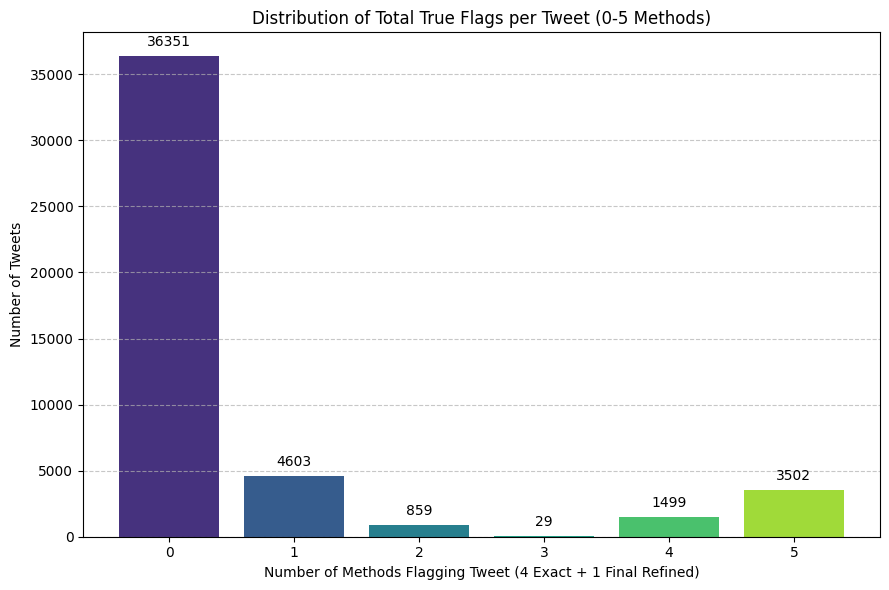

Plotting distribution for 1-5 flags...


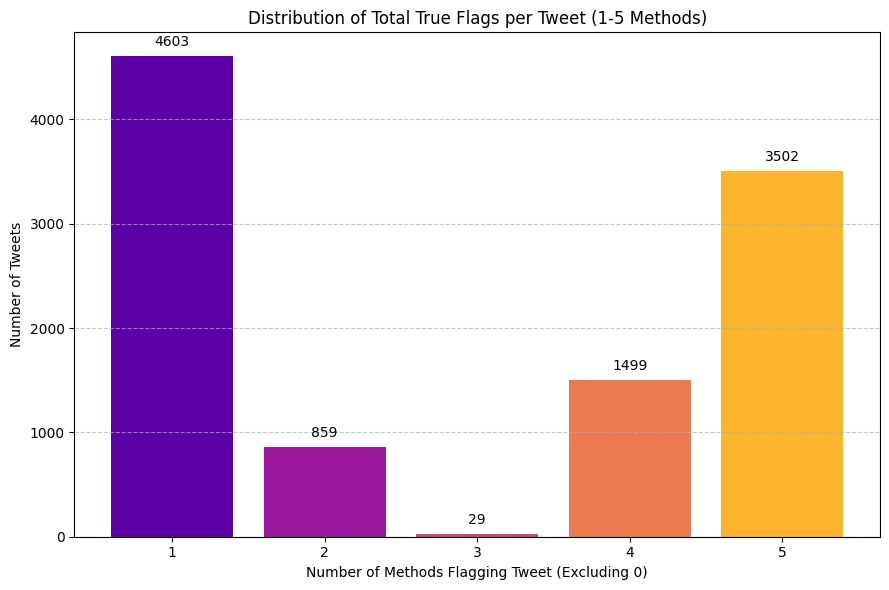

--------------------------------------------------

--- 6. Top Tokens Analysis & Visualization (Including FINAL Method) ---

Top 10 tokens for 'Top 10 Tokens (Gateway)':
  energy: 739
  development: 444
  budget: 433
  taxes: 409
  market: 372
  entrepreneurs: 319
  economy: 310
  inflation: 284
  crisis: 281
  fund: 251


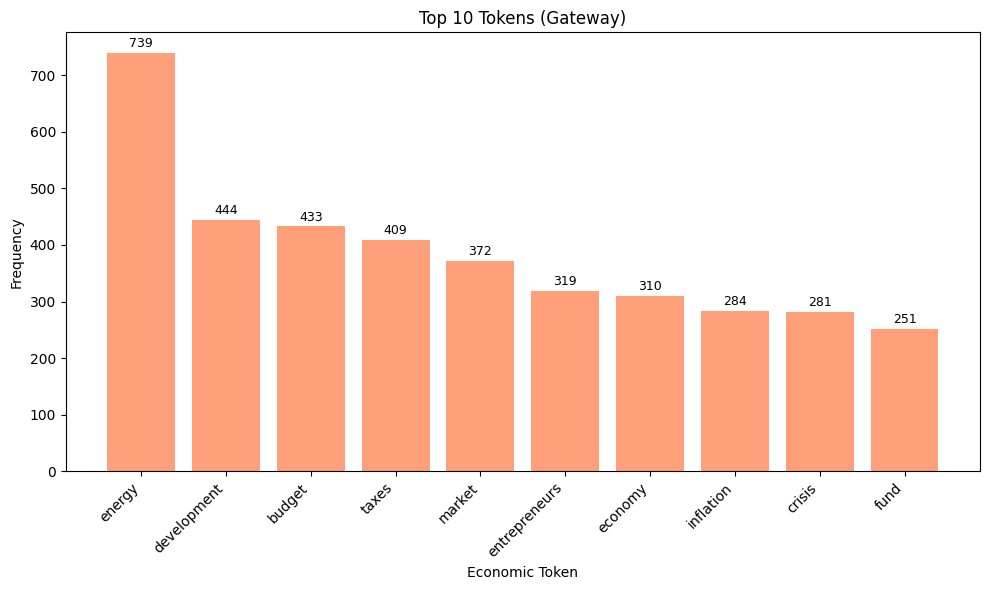


Top 10 tokens for 'Top 10 Tokens (Union)':
  euro: 2915
  import: 1858
  fund: 903
  VAT: 764
  energy: 742
  development: 479
  budget: 458
  investment: 431
  market: 426
  taxes: 417


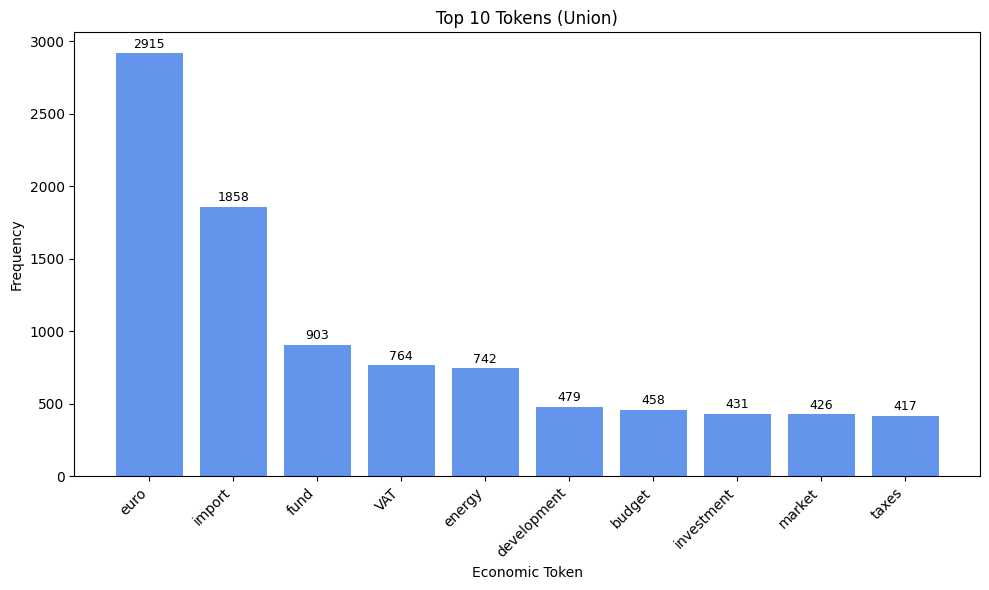


Top 10 tokens for 'Top 10 Tokens (FINAL Refined)':
  fund: 746
  energy: 739
  budget: 450
  investment: 406
  taxes: 406
  market: 402
  development: 402
  entrepreneurs: 342
  economy: 321
  finance: 308


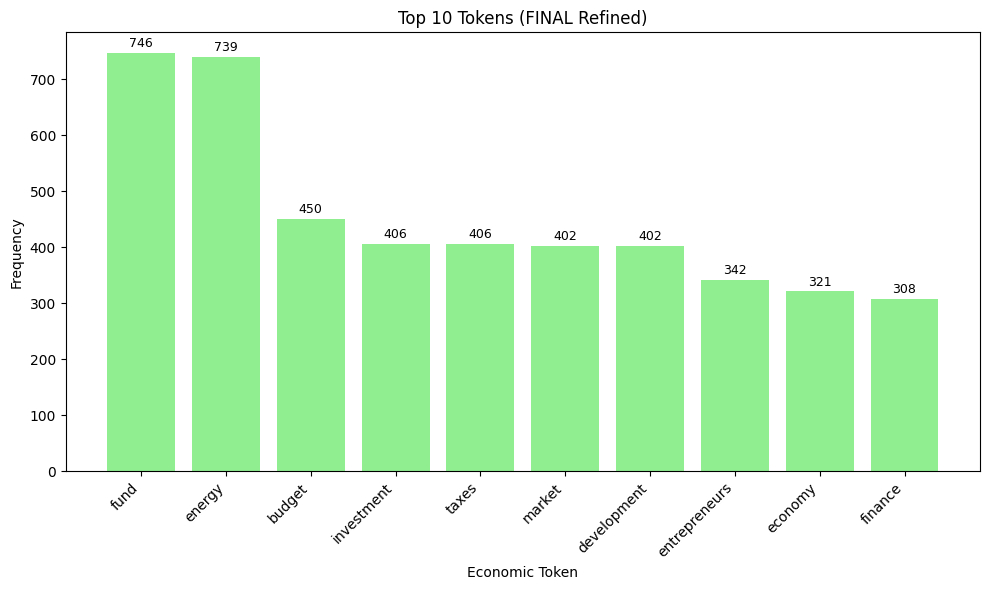


--------------------------------------------------
--- Venn Diagram Comparison of Top Tokens ---


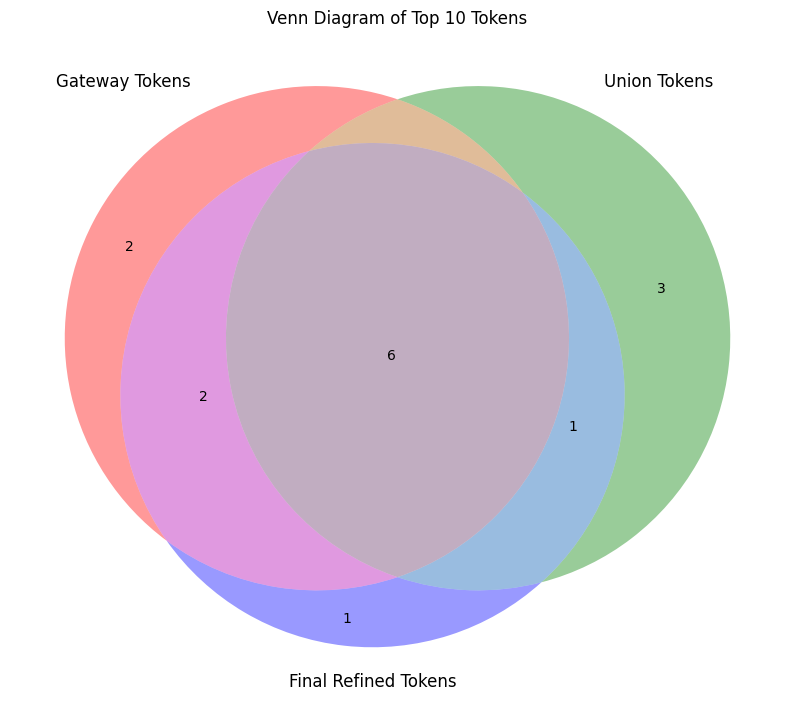


Intersection Analysis (Top 10 Tokens):
Total Unique Top 10 Tokens across all 3 methods: 15

--- Segment Counts & Tokens ---
Only Gateway:                  2 | {'crisis', 'inflation'}
Only Union:                    3 | {'euro', 'import', 'VAT'}
Only Final Refined:            1 | {'finance'}
Gateway & Union (not Final):   0 | set()
Gateway & Final (not Union):   2 | {'economy', 'entrepreneurs'}
Union & Final (not Gateway):   1 | {'investment'}
All Three (G & U & F):         6 | {'fund', 'development', 'taxes', 'energy', 'market', 'budget'}
--------------------------------------------------


In [53]:
# ==============================================================================
# ANALYSIS SCRIPT 
# ==============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

try:
    from matplotlib_venn import venn2, venn3
    venn_available = True
except ImportError:
    print("INFO: matplotlib-venn not installed (pip install matplotlib-venn). Venn diagrams will be skipped.")
    venn_available = False


# ==============================================================================
# 1. Token Aggregation Approaches (Gateway & Union - Based on Original Exact Methods)
# ==============================================================================
print("\n--- 1. Calculating Token Aggregation (Gateway & Union) ---")
print() 

def union_tokens(row):
    """ Returns the union of tokens from four original keyword-based columns. """
    cols = ['matched_exact_econ_words_naive', 'matched_exact_econ_words_regex',
            'matched_exact_econ_words_flashtext', 'matched_exact_econ_words_ac', 'matched_keywords_FILTERED']
    tokens = set() # Use set for efficiency
    for col in cols:
        # Check if column exists and value is a list
        if col in row and isinstance(row[col], list):
            tokens.update(row[col])
    return list(tokens)

def gateway_tokens(row, threshold=3): # Using threshold=3 
    """ Returns tokens that appear in at least 'threshold' of the four original columns. """
    cols = ['matched_exact_econ_words_naive', 'matched_exact_econ_words_regex',
            'matched_exact_econ_words_flashtext', 'matched_exact_econ_words_ac', 'matched_keywords_FILTERED']
    tokens_list = []
    # Check if all required columns exist for the row
    if not all(col in row for col in cols):
        return [] # Return empty if any column is missing
    for col in cols:
        if isinstance(row[col], list):
            tokens_list.extend(row[col])
    counts = Counter(tokens_list)
    return [token for token, cnt in counts.items() if cnt >= threshold]

# Check if source columns exist before applying
exact_keyword_cols = ['matched_exact_econ_words_naive', 'matched_exact_econ_words_regex',
                      'matched_exact_econ_words_flashtext', 'matched_exact_econ_words_ac', 'matched_keywords_FILTERED']
if all(col in df_clean_translated.columns for col in exact_keyword_cols):
    print("Applying union_tokens...")
    df_clean_translated['union_tokens'] = df_clean_translated.apply(union_tokens, axis=1)
    print("Applying gateway_tokens (threshold=3)...")
    df_clean_translated['gateway_tokens'] = df_clean_translated.apply(lambda row: gateway_tokens(row, threshold=3), axis=1)

    # Boolean flags for non-empty token lists
    df_clean_translated['union_flag'] = df_clean_translated['union_tokens'].apply(lambda x: isinstance(x, list) and len(x) > 0)
    df_clean_translated['gateway_flag'] = df_clean_translated['gateway_tokens'].apply(lambda x: isinstance(x, list) and len(x) > 0)
    print("Gateway and Union tokens/flags calculated.")
else:
    print("WARNING: One or more exact match keyword columns missing. Skipping Gateway/Union calculation.")
    # Ensure columns exist even if skipped, to prevent later errors
    if 'union_tokens' not in df_clean_translated.columns: df_clean_translated['union_tokens'] = [[] for _ in range(len(df_clean_translated))]
    if 'gateway_tokens' not in df_clean_translated.columns: df_clean_translated['gateway_tokens'] = [[] for _ in range(len(df_clean_translated))]
    if 'union_flag' not in df_clean_translated.columns: df_clean_translated['union_flag'] = False
    if 'gateway_flag' not in df_clean_translated.columns: df_clean_translated['gateway_flag'] = False

print("-" * 50)


# ==============================================================================
# 2. Combined Flag Pattern (Including Final Refined Method)
# ==============================================================================
print("\n--- 2. Creating Combined Flag Pattern ---")

# Define the flag columns in the desired order
# Using the final refined flag 'has_econ_term_FILTERED'
flag_cols_ordered = [
    'has_exact_econ_word_naive',
    'has_exact_econ_word_regex',
    'has_exact_econ_word_flashtext',
    'has_exact_econ_word_ac',
    'has_econ_term_FILTERED' # Your final refined flag
]

# Check if all flag columns exist
missing_flags = [col for col in flag_cols_ordered if col not in df_clean_translated.columns]
if missing_flags:
    print(f"WARNING: The following flag columns are missing and will be excluded from the pattern: {missing_flags}")
    # Filter the list to only include existing columns
    flag_cols_ordered = [col for col in flag_cols_ordered if col in df_clean_translated.columns]

if flag_cols_ordered: # Proceed only if there are some flags left
    df_clean_translated['flag_pattern_combined'] = df_clean_translated.apply(
        lambda row: tuple(bool(row[col]) for col in flag_cols_ordered), # Ensure boolean values
        axis=1
    )
    print("Combined flag pattern created.")
    # Optional: Display value counts for the pattern
    # print("\nFlag Pattern Distribution:")
    # print(df_clean_translated['flag_pattern_combined'].value_counts())
else:
    print("ERROR: No valid flag columns found to create combined pattern.")

print("-" * 50)


# ==============================================================================
# 3. Filtering Examples (Based on Gateway/Union Flags)
# ==============================================================================
# This section remains useful for comparing Gateway/Union results if needed.
print("\n--- 3. Filtering Examples based on Gateway/Union ---")

cols_to_display_agg = ['text_clean_en']
if 'flag_pattern_combined' in df_clean_translated.columns: cols_to_display_agg.append('flag_pattern_combined')
else: print("INFO: 'flag_pattern_combined' column not available for display.")

if 'union_flag' in df_clean_translated.columns and df_clean_translated['union_flag'].any():
    df_with_flags_union = df_clean_translated[df_clean_translated['union_flag'] == True]
    print("\nSample rows based on Union Tokens (non-empty union_tokens):")
    cols_union = cols_to_display_agg + ['union_tokens']
    cols_union_exist = [c for c in cols_union if c in df_with_flags_union.columns]
    try:
        display(df_with_flags_union[cols_union_exist].head())
    except NameError:
        print(df_with_flags_union[cols_union_exist].head().to_string())
else:
    print("\nNo rows found based on Union Tokens or 'union_flag' column missing.")


if 'gateway_flag' in df_clean_translated.columns and df_clean_translated['gateway_flag'].any():
    df_with_flags_gateway = df_clean_translated[df_clean_translated['gateway_flag'] == True]
    print("\nSample rows based on Gateway Tokens (non-empty gateway_tokens):")
    cols_gateway = cols_to_display_agg + ['gateway_tokens']
    cols_gateway_exist = [c for c in cols_gateway if c in df_with_flags_gateway.columns]
    try:
        display(df_with_flags_gateway[cols_gateway_exist].head())
    except NameError:
        print(df_with_flags_gateway[cols_gateway_exist].head().to_string())
else:
    print("\nNo rows found based on Gateway Tokens or 'gateway_flag' column missing.")

print("-" * 50)


# ==============================================================================
# 4. Calculate Total True Flag Count (Incl. Final Refined Method)
# ==============================================================================
print("\n--- 4. Calculating Number of True Flags per Tweet (Incl. Final Refined) ---")

# Include the final refined flag along with the original exact match flags
flags_for_dist_count = [
    'has_exact_econ_word_naive',
    'has_exact_econ_word_regex',
    'has_exact_econ_word_flashtext',
    'has_exact_econ_word_ac',
    'has_econ_term_FILTERED' # Include the final refined flag
]
# Define the new column name
count_col_name = 'num_true_flags_incl_refined'

# Check if all these columns exist in the modified df_clean_translated
missing_flags_for_count = [col for col in flags_for_dist_count if col not in df_clean_translated.columns]
if missing_flags_for_count:
    print(f"WARNING: The following flag columns are missing: {missing_flags_for_count}.")
    print(f"         Skipping calculation of '{count_col_name}'. Distribution plot will fail.")
    # Create dummy column to potentially avoid later errors, or handle downstream
    df_clean_translated[count_col_name] = 0
else:
    # Sum the boolean flags across rows (True counts as 1)
    print(f"Calculating sum of flags: {', '.join(flags_for_dist_count)}")
    df_clean_translated[count_col_name] = df_clean_translated[flags_for_dist_count].sum(axis=1)
    print(f"Calculated '{count_col_name}' column (sum of 4 Exact Match + 1 Final Refined flags).")

print("-" * 50)


# ==============================================================================
# 5. Visualization: Distribution of True Flags (Incl. Final Refined Method)
# ==============================================================================
print("\n--- 5. Visualizing Distribution of True Flags (0-5 Methods) ---")

target_col_dist = count_col_name # Use the new column name

if target_col_dist not in df_clean_translated.columns or df_clean_translated[target_col_dist].sum() == 0 and len(missing_flags_for_count)>0 :
    print(f"ERROR: Column '{target_col_dist}' not found or could not be calculated. Cannot create distribution plot.")
else:
    # 5A) Including 0..5 True Flags
    print("Plotting distribution for 0-5 flags...")
    cat_order = [0, 1, 2, 3, 4, 5]
    
    df_count = df_clean_translated.get(target_col_dist, default=pd.Series(dtype=int)).value_counts(sort=False)
    df_count = df_count.reindex(cat_order, fill_value=0)

    colors = sns.color_palette("viridis", n_colors=len(cat_order)) # Changed palette, 6 colors
    plt.figure(figsize=(9, 6)) # Slightly wider figure
    bars = plt.bar([str(c) for c in cat_order], df_count.values, color=colors)
    for bar, count in zip(bars, df_count.values):
        plt.annotate(f"{count}", xy=(bar.get_x() + bar.get_width()/2, count),
                     xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
    plt.xlabel("Number of Methods Flagging Tweet (4 Exact + 1 Final Refined)")
    plt.ylabel("Number of Tweets")
    plt.title("Distribution of Total True Flags per Tweet (0-5 Methods)")
    plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout(); plt.show()

    # 5B) Excluding 0 (only 1..5)
    print("Plotting distribution for 1-5 flags...")
    cat_order_nz = [1, 2, 3, 4, 5]
    df_count_nz = df_count.reindex(cat_order_nz, fill_value=0)
    if df_count_nz.sum() > 0: # Only plot if there are non-zero counts in 1-5 range
        colors_nz = sns.color_palette("plasma", n_colors=len(cat_order_nz)) # Changed palette, 5 colors
        plt.figure(figsize=(9, 6)) # Slightly wider figure
        bars_nz = plt.bar([str(c) for c in cat_order_nz], df_count_nz.values, color=colors_nz)
        for bar, count in zip(bars_nz, df_count_nz.values):
            plt.annotate(f"{count}", xy=(bar.get_x() + bar.get_width()/2, count),
                         xytext=(0, 5), textcoords='offset points', ha='center', va='bottom')
        plt.xlabel("Number of Methods Flagging Tweet (Excluding 0)")
        plt.ylabel("Number of Tweets")
        plt.title("Distribution of Total True Flags per Tweet (1-5 Methods)")
        plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout(); plt.show()
    else:
        print("No tweets found with 1-5 flags.")

print("-" * 50)


# ==============================================================================
# 6. Visualizations: Top Tokens & Venn Diagram (Incl. FINAL Refined Method)
# ==============================================================================
print("\n--- 6. Top Tokens Analysis & Visualization (Including FINAL Method) ---")

def plot_top_tokens_annotated(df, token_col, title, top_n=10, color="skyblue"):
    """ Plots top N tokens from a specified column in a DataFrame. """
    if token_col not in df.columns:
        print(f"Warning: Column '{token_col}' not found in DataFrame for plotting. Skipping '{title}'.")
        return
    # Ensure the column contains lists and handle potential non-list entries gracefully
    all_tokens = [token for tokens_list in df[token_col] if isinstance(tokens_list, list) for token in tokens_list]
    if not all_tokens:
        print(f"No tokens found in column '{token_col}' for plotting '{title}'.")
        return
    token_counts = Counter(all_tokens)
    print(f"\nTop {top_n} tokens for '{title}':")
    for token, count in token_counts.most_common(top_n): print(f"  {token}: {count}")
    top_tokens_data = token_counts.most_common(top_n)
    if not top_tokens_data: print(f"No top tokens found to plot for '{title}'."); return
    tokens, counts = zip(*top_tokens_data)
    plt.figure(figsize=(10, 6)); bars = plt.bar(tokens, counts, color=color)
    plt.xlabel("Economic Token"); plt.ylabel("Frequency"); plt.title(title)
    plt.xticks(rotation=45, ha='right')
    for bar, cnt in zip(bars, counts):
        plt.annotate(f"{cnt}", xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()),
                     xytext=(0, 2), textcoords="offset points", ha='center', va='bottom', fontsize=9)
    plt.tight_layout(); plt.show()

def get_top_tokens_set(df, token_col, top_n=10):
    """ Returns a set of the top N tokens from the specified column. """
    if token_col not in df.columns: return set() # Return empty set if column missing
    all_tokens = [token for tokens_list in df[token_col] if isinstance(tokens_list, list) for token in tokens_list]
    if not all_tokens: return set()
    token_counts = Counter(all_tokens)
    top_tokens_list = [token for token, count in token_counts.most_common(top_n)]
    return set(top_tokens_list)

# --- Plot Top Tokens ---
top_n_to_plot = 10
# Gateway (uses df_with_flags_gateway based on original exact matches)
if 'df_with_flags_gateway' in locals() and not df_with_flags_gateway.empty:
    plot_top_tokens_annotated(df_with_flags_gateway, 'gateway_tokens', f"Top {top_n_to_plot} Tokens (Gateway)", top_n=top_n_to_plot, color="lightsalmon")
else: print("Skipping Gateway plot: 'df_with_flags_gateway' not defined or empty.")
# Union (uses df_with_flags_union based on original exact matches)
if 'df_with_flags_union' in locals() and not df_with_flags_union.empty:
    plot_top_tokens_annotated(df_with_flags_union, 'union_tokens', f"Top {top_n_to_plot} Tokens (Union)", top_n=top_n_to_plot, color="cornflowerblue")
else: print("Skipping Union plot: 'df_with_flags_union' not defined or empty.")
# FINAL Refined Method (uses the modified df_clean_translated)
final_flag_col = 'has_econ_term_FILTERED' # Flag after inplace drop
final_kw_col = 'matched_keywords_FILTERED' # Keywords after inplace drop
if final_flag_col in df_clean_translated.columns and final_kw_col in df_clean_translated.columns:
    df_final_flagged = df_clean_translated[df_clean_translated[final_flag_col]].copy()
    if not df_final_flagged.empty:
        plot_top_tokens_annotated(df_final_flagged, final_kw_col, f"Top {top_n_to_plot} Tokens (FINAL Refined)", top_n=top_n_to_plot, color="lightgreen")
    else: print("No tweets flagged by the FINAL refined method to plot.")
else: print(f"Skipping FINAL Refined plot: Columns '{final_flag_col}' or '{final_kw_col}' not found.")



# --- Venn Diagram Comparison (Gateway vs Union vs Final Refined) ---
print("\n" + "-"*50)
print("--- Venn Diagram Comparison of Top Tokens ---")
if not venn_available:
    print("Skipping Venn diagram as matplotlib-venn library is not available.")
else:
    top_n_venn = 10 # Number of top tokens to compare
    # Get top tokens sets
    top_gateway_set = get_top_tokens_set(df_with_flags_gateway, 'gateway_tokens', top_n=top_n_venn) if 'df_with_flags_gateway' in locals() else set()
    top_union_set   = get_top_tokens_set(df_with_flags_union, 'union_tokens', top_n=top_n_venn) if 'df_with_flags_union' in locals() else set()
    if final_flag_col in df_clean_translated.columns and final_kw_col in df_clean_translated.columns:
         df_final_flagged_venn = df_clean_translated[df_clean_translated[final_flag_col]]
         top_final_set = get_top_tokens_set(df_final_flagged_venn, final_kw_col, top_n=top_n_venn)
    else: top_final_set = set()

    if not top_gateway_set and not top_union_set and not top_final_set:
         print("No top tokens found for any method to create Venn diagram.")
    else:
         plt.figure(figsize=(10, 10))
         v = venn3([top_gateway_set, top_union_set, top_final_set],
                   set_labels=('Gateway Tokens', 'Union Tokens', 'Final Refined Tokens'),
                   # Use counts for subsets
                   subset_label_formatter=lambda x: str(x) if x > 0 else ''
                   )
         # Optional colors:
         # if v: v.get_patch_by_id('100').set_color('salmon'); v.get_patch_by_id('010').set_color('cornflowerblue'); v.get_patch_by_id('001').set_color('lightgreen')
         plt.title(f"Venn Diagram of Top {top_n_venn} Tokens")
         plt.show()

         # Calculate and Print Intersections
         g_u_f = top_gateway_set.intersection(top_union_set).intersection(top_final_set)
         g_u_nf = top_gateway_set.intersection(top_union_set) - top_final_set
         g_f_nu = top_gateway_set.intersection(top_final_set) - top_union_set
         u_f_ng = top_union_set.intersection(top_final_set) - top_gateway_set
         g_nu_nf = top_gateway_set - top_union_set - top_final_set
         u_ng_nf = top_union_set - top_gateway_set - top_final_set
         f_ng_nu = top_final_set - top_gateway_set - top_union_set
         all_top_tokens = top_gateway_set.union(top_union_set).union(top_final_set)
         total_unique_top = len(all_top_tokens)
         print(f"\nIntersection Analysis (Top {top_n_venn} Tokens):")
         print(f"Total Unique Top {top_n_venn} Tokens across all 3 methods: {total_unique_top}")
         print(f"\n--- Segment Counts & Tokens ---")
         print(f"Only Gateway:                {len(g_nu_nf):>3} | {g_nu_nf}")
         print(f"Only Union:                  {len(u_ng_nf):>3} | {u_ng_nf}")
         print(f"Only Final Refined:          {len(f_ng_nu):>3} | {f_ng_nu}")
         print(f"Gateway & Union (not Final): {len(g_u_nf):>3} | {g_u_nf}")
         print(f"Gateway & Final (not Union): {len(g_f_nu):>3} | {g_f_nu}")
         print(f"Union & Final (not Gateway): {len(u_f_ng):>3} | {u_f_ng}")
         print(f"All Three (G & U & F):       {len(g_u_f):>3} | {g_u_f}")

print("-" * 50)

In [55]:
# ==============================================================================
# (6.0) INSPECT RANDOM ROWS FOR SPECIFIC TOP KEYWORDS
# ==============================================================================
# This section allows inspecting a RANDOM SAMPLE of rows containing a specific
# keyword identified by different methods.

print("\n--- Inspecting RANDOM Rows for Specific Top Keywords ---")

# !!! DEFINE the keyword you want to inspect !!!
keyword_to_inspect = 'energy' # <--- CHANGE THIS to 'euro', 'import', 'taxes', etc.

# Methods and their corresponding keyword list columns
methods_to_inspect = {
    'Gateway': 'gateway_tokens',
    'Union': 'union_tokens',
    'Final_Refined': 'matched_keywords_FILTERED' # Use the final keyword column
}

# Configuration for display
text_col_inspect = 'text_clean_en'
id_col_inspect = 'id' # !!! Use ID column name !!!
n_rows_to_sample = 50 # Number of RANDOM sample rows to display for each method

print(f"\nLooking for keyword: '{keyword_to_inspect}'")
print("-" * 50)

# Loop through each method
for method_name, kw_col in methods_to_inspect.items():
    print(f"--- Checking Method: {method_name} (Column: {kw_col}) ---")

    # Check if the keyword column exists in the main DataFrame
    if kw_col not in df_clean_translated.columns:
        print(f"ERROR: Keyword column '{kw_col}' not found in df_clean_translated. Skipping.")
        continue

    # Create a mask to find rows where the keyword list contains the target keyword
    # Ensure the column contains lists and handle potential errors/NaNs gracefully
    try:
        mask_contains_keyword = df_clean_translated[kw_col].apply(
            lambda lst: isinstance(lst, list) and keyword_to_inspect in lst
        )
    except Exception as e:
        print(f"Error creating mask for column '{kw_col}': {e}. Skipping method.")
        continue

    # Filter the DataFrame
    df_contains_keyword = df_clean_translated[mask_contains_keyword]
    count_contains_keyword = len(df_contains_keyword)

    if count_contains_keyword > 0:
        print(f"Found {count_contains_keyword} rows where '{keyword_to_inspect}' is in '{kw_col}'.")

        # Determine actual sample size (cannot sample more than available)
        actual_sample_size = min(n_rows_to_sample, count_contains_keyword)
        print(f"Displaying a random sample of {actual_sample_size} examples:")

        # --- Get a RANDOM SAMPLE ---
        # Use random_state=None for a different sample each time, or an integer for reproducibility
        df_sample_to_show = df_contains_keyword.sample(n=actual_sample_size, random_state=None)

        # Define columns to show for context
        cols_to_show_inspect = [text_col_inspect, kw_col]
        if method_name == 'Final_Refined' and 'extracted_terms_FILTERED' in df_sample_to_show.columns:
            cols_to_show_inspect.insert(1, 'extracted_terms_FILTERED')
        if id_col_inspect in df_sample_to_show.columns:
            cols_to_show_inspect.insert(0, id_col_inspect)
        
        # Ensure chosen columns exist in the sample (should, as they come from df_contains_keyword)
        cols_to_display_final = [c for c in cols_to_show_inspect if c in df_sample_to_show.columns]

        try:
            display(df_sample_to_show[cols_to_display_final])
        except NameError:
            print(df_sample_to_show[cols_to_display_final].to_string())
    else:
        print(f"No rows found where '{keyword_to_inspect}' is in '{kw_col}'.")
    print("-" * 50)

print("--- Keyword Row Inspection Complete ---")
print("-" * 50)


--- Inspecting RANDOM Rows for Specific Top Keywords ---

Looking for keyword: 'energy'
--------------------------------------------------
--- Checking Method: Gateway (Column: gateway_tokens) ---
Found 739 rows where 'energy' is in 'gateway_tokens'.
Displaying a random sample of 50 examples:


,id,text_clean_en,gateway_tokens
35272,1688917129675034624,"Today, together with Masovia, as part of the #...",[energy]
38428,1768329485458211072,Energy transformation is an opportunity for a ...,"[energy, entrepreneurs]"
32948,1769376921295425536,"On October 15, huge mobilization and great civ...",[energy]
9794,1636829335859474432,Ladies - it's easy to fight when you have su...,[energy]
28078,1616716427032989696,"Even the pandemic, war abroad, Putinflation an...","[crisis, energy]"
36724,1702018202396496128,I cordially invite you - personally as a resid...,[energy]
38483,1731420472703660288,"Regarding #LexSiemens, in April this year PGE,...","[supply, energy]"
45334,1583843161943977984,"Our today's meeting with Mega energy, great to...",[energy]
2348,1825545214628618752,Your government announced nuclear energy 15 y...,[energy]
34430,1696817383644725504,At #Campus2023 you could feel the energy of yo...,[energy]


--------------------------------------------------
--- Checking Method: Union (Column: union_tokens) ---
Found 742 rows where 'energy' is in 'union_tokens'.
Displaying a random sample of 50 examples:


,id,text_clean_en,union_tokens
8998,1601491905631916032,Bravo 👏 🏻 Pressure makes sense! We have expos...,"[euro, VAT, energy]"
14477,1730488356377604352,"🗣 ️ , he practically plowed wind energy in Po...",[energy]
8645,1687157188328861696,The Parliament has banned the sale of energy d...,[energy]
14460,1731595139741610240,🗣 ️Both the energy and military security of o...,[energy]
45747,1711423139660321024,"And this morning, my hometown #Biskupiec, #Jez...",[energy]
40472,1700185094256738560,"Nobody buys into such a narrative, but we can...",[energy]
7619,1768580095210398208,📣 The issue of emission reduction is that we ...,"[energy, emissions]"
36325,1660734840138866688,"Ostróda and Morąg, great meetings and fantasti...",[energy]
9869,1606569023549972480,❌ You can feel that elections are coming. The...,"[energy, budget]"
36667,1705925800652943872,See what energy there was in the pouring rain ...,"[market, energy]"


--------------------------------------------------
--- Checking Method: Final_Refined (Column: matched_keywords_FILTERED) ---
Found 739 rows where 'energy' is in 'matched_keywords_FILTERED'.
Displaying a random sample of 50 examples:


,id,text_clean_en,extracted_terms_FILTERED,matched_keywords_FILTERED
26661,1661045405054902272,Today in the European Parliament there are int...,"[Industry, Energy]","[energy, industry]"
10356,1655508816031625216,There is no bathroom in over a million Polish ...,"[energy, poverty]","[energy, poverty]"
18384,1616103517097283584,💬 We are waiting for wind energy to finally b...,"[crisis, energy]","[crisis, energy]"
2127,1836744266762109184,"Climate activists, energy experts, lobbyists. ...","[market, energy]","[market, energy]"
42120,1672533824423567360,Friendship. New energy. Cooperation. Simply th...,[energy],[energy]
35272,1688917129675034624,"Today, together with Masovia, as part of the #...",[energy],[energy]
2334,1825966685553135872,"You had a whole campaign, a whole year of gov...","[energy, poverty, inflation]","[energy, poverty, inflation]"
46628,1584139852001705984,"In 2015-21, 9 mines were closed. At the same t...","[development, energy, imports]","[development, import, energy]"
40668,1625451967098109952,The government is talking more and more ab...,[energy],[energy]
34666,1677626201223962624,In Poland we have the most expensive energy in...,[energy],[energy]


--------------------------------------------------
--- Keyword Row Inspection Complete ---
--------------------------------------------------


In [56]:
df_clean_translated.columns

Index(['created_at', 'text', 'id', 'author_id', 'edit_controls',
       'possibly_sensitive', 'reply_settings', 'lang',
       'edit_history_tweet_ids', 'conversation_id', 'category', 'attachments',
       'username', 'party', 'in_reply_to_user_id', 'context_annotations',
       'referenced_tweets', 'geo', 'text_clean', 'mentions', 'links',
       'hashtags', 'retweet_count', 'reply_count', 'like_count', 'quote_count',
       'impression_count', 'text_clean_en', 'text_clean_en_demojized',
       'text_clean_demojized', 'emoji_count_en', 'emoji_count', 'name',
       'matched_exact_econ_words_naive', 'has_exact_econ_word_naive',
       'matched_exact_econ_words_regex', 'has_exact_econ_word_regex',
       'matched_exact_econ_words_flashtext', 'has_exact_econ_word_flashtext',
       'matched_exact_econ_words_ac', 'has_exact_econ_word_ac',
       'matched_keywords_ORIG', 'has_econ_term_ORIG',
       'extracted_terms_FILTERED', 'matched_keywords_FILTERED',
       'has_econ_term_FILTERED', '

In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict, Counter # Make sure this is imported
import os
import random
from tqdm.auto import tqdm
import ahocorasick 
import spacy 

In [58]:
# ==============================================================================
# 7. PARTY ANALYSIS PREPARATION
# ==============================================================================
# This section prepares data needed for analysis later on
# includes naem standarization and color definitions.

print("\n--- 7. Party Analysis Preparation ---")

party_col = 'party' # !!! CAREFULLY CHECK IF THE COLUMN IS RIGHT !!!

# Check if party column exists
if party_col not in df_clean_translated.columns:
    print(f"ERROR: Party column '{party_col}' not found.")
    run_party_analysis = False
else:
    print(f"Using party column: '{party_col}' for analysis.")
    run_party_analysis = True


    # --------------------------------------------------------------------------
    # 7.A: Optional Party Name Remapping 
    # --------------------------------------------------------------------------
    # Uncomment and modify this block if you need to map different names
    # (e.g., 'PO') to a single standard name ('Platforma Obywatelska') for the sake of graphs or something else.
    # Make sure the keys in party_colors (defined next) match the FINAL names.

    # print("\n--- 7.A: Standardizing Party Names (Example) ---")
    # party_mapping = {
    #     'PO': 'Platforma Obywatelska', 
    #     'Nowa Lewica': 'Lewica',     
    #     'PL2050': 'PL2050',
    #     'PIS': 'PiS',
    #     'PSL': 'PSL',
    #     'Konfederacja': 'Konfederacja',
    # }

    # # Check current unique values
    # original_parties = sorted(df_clean_translated[party_col].astype(str).unique())
    # print(f"Original unique party values: {original_parties}")
    # # Apply mapping - maps keys present in the dict, keeps others using .fillna()
    # df_clean_translated[party_col] = df_clean_translated[party_col].map(party_mapping).fillna(df_clean_translated[party_col])
    # standardized_parties = sorted(df_clean_translated[party_col].astype(str).unique())
    # if list(original_parties) != list(standardized_parties):
    #      print(f"Standardized unique party values: {standardized_parties}")
    # else:
    #      print("Party names appear consistent or mapping wasn't applied/needed.")
    # print("-" * 30)


    # --------------------------------------------------------------------------
    # 7.B: Define Party Colors
    # --------------------------------------------------------------------------
    print("\n--- 7.B: Defining Party Colors ---")
    # !!! IMPORTANT: Keys MUST match the FINAL party names in your 'party' column (AFTER any remapping done in step 7.A) !!!
    party_colors = {
        'Konfederacja':           'red',
        'NL':                     'blue',    
        'PL2050':                 'green',
        'PO':                     'purple',  
        'PSL':                    'orange',
        'PIS':                    'yellow',  

        'Unknown_Party':          'grey'     # Fallback color
    }
    print("Party colors dictionary defined based on user specification:")
    print(party_colors)
    # Check against actual unique values in the potentially remapped column
    current_parties_in_data = df_clean_translated[party_col].unique()
    for p in current_parties_in_data:
        if p not in party_colors:
             print(f"WARNING: Party '{p}' found in data but is missing from party_colors dictionary! Will use grey.")
    print()
    print("-" * 50)

print("----> Party Analysis Preparation Complete <----")
print("-" * 50)


--- 7. Party Analysis Preparation ---
Using party column: 'party' for analysis.

--- 7.B: Defining Party Colors ---
Party colors dictionary defined based on user specification:
{'Konfederacja': 'red', 'NL': 'blue', 'PL2050': 'green', 'PO': 'purple', 'PSL': 'orange', 'PIS': 'yellow', 'Unknown_Party': 'grey'}

--------------------------------------------------
----> Party Analysis Preparation Complete <----
--------------------------------------------------



--- 8. Party-Level Analysis & Visualization (7D Structure) ---
Party analysis helper functions defined.
--------------------------------------------------

--- 8.B: Calculating Party Summary Statistics (Counts & Shares %) ---

Party Summary Table (Counts and Shares %):


,party,total_tweets,Union_count,Gateway_count,Final_Refined_count,Union_share_pct,Gateway_share_pct,Final_Refined_share_pct
0,Konfederacja,12001,2705,1498,1693,22.54,12.48,14.11
1,NL,10914,2325,873,1224,21.30,8.00,11.21
2,PIS,6264,1734,725,904,27.68,11.57,14.43
3,PL2050,5055,1091,645,753,21.58,12.76,14.90
4,PO,8906,1590,688,833,17.85,7.73,9.35
5,PSL,3703,1047,585,682,28.27,15.80,18.42


------------------------------------------------------------

--- Running Analysis for: Final Refined Method ---

Plotting top 10 tokens by party for approach: Final Refined


<Figure size 640x480 with 0 Axes>

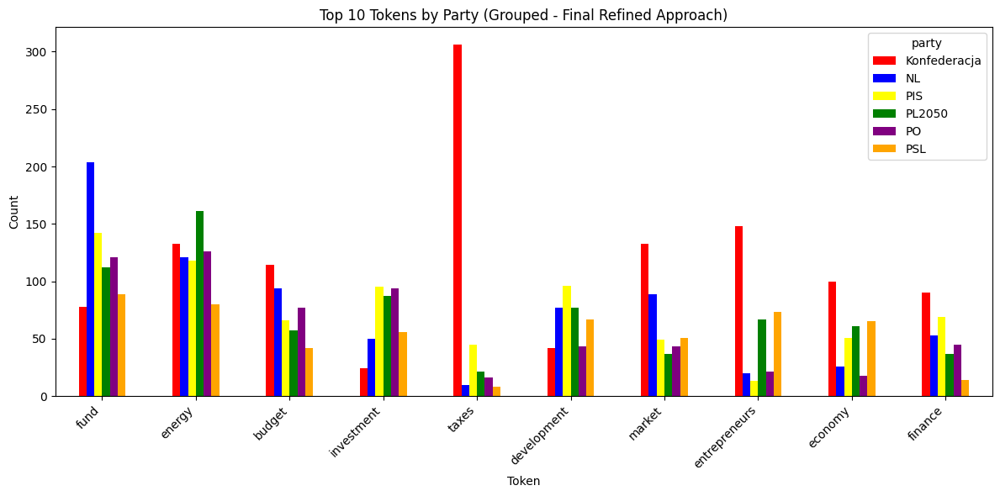

<Figure size 640x480 with 0 Axes>

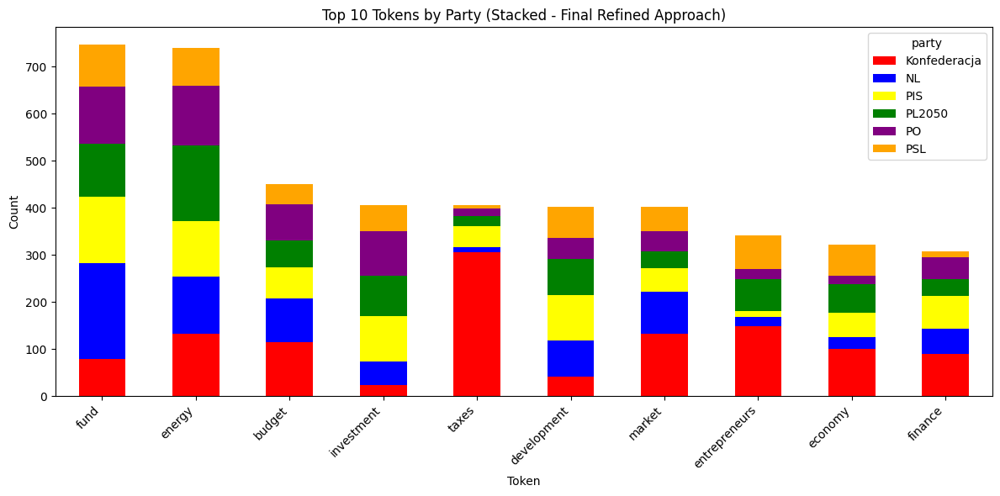


Plotting Share for: Final_Refined Method


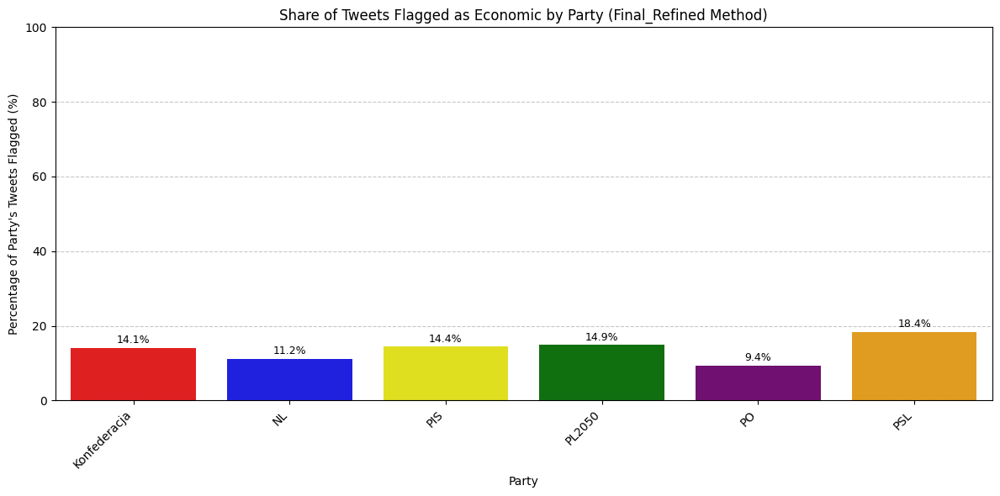

------------------------------------------------------------

----> Party-Level Analysis Complete <----


In [59]:
# ==============================================================================
# 8. PARTY-LEVEL ANALYSIS & VISUALIZATION
# ==============================================================================
# This section defines functions and performs analysis on token usage and
# flagging shares broken down by political party, using specified party colors.
# Analysis for each method is called sequentially.

# Only run if party column exists and run_party_analysis is True (set in Section 7)
if run_party_analysis:
    print("\n--- 8. Party-Level Analysis & Visualization (7D Structure) ---")

    # --- Configuration ---
    # party_col defined in Section 7
    # party_colors defined in Section 7
    top_n_party_tokens = 10

    # --------------------------------------------------------------------------
    # 8.A: Define Helper Functions
    # --------------------------------------------------------------------------
    # (Includes get_party_token_counts, plot_party_top_tokens (modified for color),
    #  and plot_party_share from previous responses)

    def get_party_token_counts(df, token_col='union_tokens', party_col='party'):
        """ Counts tokens per party from a specified column. """
        if token_col not in df.columns or party_col not in df.columns:
            print(f"Warning: Missing cols ('{token_col}' or '{party_col}') in get_party_token_counts. Returning empty DF.")
            return pd.DataFrame([], columns=[party_col, 'token', 'count'])
        party_token_map = defaultdict(Counter)
        for idx, row in df.iterrows():
            party = row.get(party_col, 'Unknown_Party')
            tokens = row.get(token_col, [])
            if isinstance(tokens, list):
                for token in tokens: party_token_map[party][token] += 1
        records = [(p, t, c) for p, counter in party_token_map.items() for t, c in counter.items()]
        return pd.DataFrame(records, columns=[party_col, 'token', 'count'])

    def plot_party_top_tokens(df_party, party_colors_dict, top_n=10, approach="Unknown", party_col='party'):
        """ Plots grouped and stacked bar charts for top N tokens, colored by party using provided dict. """
        if df_party.empty or not all(c in df_party.columns for c in [party_col, 'token', 'count']):
            print(f"Info: Input DataFrame for plot_party_top_tokens ('{approach}') is empty or missing columns. Skipping plots.")
            return pd.DataFrame() # Return empty if nothing to plot
        token_totals = df_party.groupby('token')['count'].sum()
        if token_totals.empty: print(f"Info: No token counts to plot for plot_party_top_tokens ('{approach}'). Skipping plots."); return pd.DataFrame()
        top_tokens = token_totals.sort_values(ascending=False).head(top_n).index.tolist()
        df_top = df_party[df_party['token'].isin(top_tokens)]
        if df_top.empty: print(f"Info: No data for top {top_n} tokens ('{approach}'). Skipping plots."); return pd.DataFrame()
        try: pivot = pd.pivot_table(df_top, index='token', columns=party_col, values='count', fill_value=0, aggfunc='sum')
        except Exception as e: print(f"Warning: Pivot table failed ('{approach}'): {e}. Skipping plots."); return pd.DataFrame()
        for party in party_colors_dict:
            if party != 'Unknown_Party' and party not in pivot.columns: pivot[party] = 0
        pivot['total'] = pivot.sum(axis=1); pivot = pivot.sort_values('total', ascending=False).drop(columns='total')
        if pivot.empty: print(f"Info: Pivot table empty after sorting ('{approach}'). Skipping plots."); return pivot

        print(f"\nPlotting top {top_n} tokens by party for approach: {approach}")
        plot_colors = [party_colors_dict.get(party, party_colors_dict.get('Unknown_Party','grey')) for party in pivot.columns]
        # Grouped Bar Chart
        try:
            plt.figure(); ax_grouped = pivot.plot(kind='bar', figsize=(12,6), color=plot_colors)
            ax_grouped.set_title(f"Top {top_n} Tokens by Party (Grouped - {approach} Approach)"); ax_grouped.set_xlabel("Token"); ax_grouped.set_ylabel("Count")
            ax_grouped.legend(title=party_col); plt.xticks(rotation=45, ha='right'); plt.tight_layout(); plt.show()
        except Exception as e: print(f"Error plotting grouped bar for {approach}: {e}")
        # Stacked Bar Chart
        try:
            plt.figure(); ax_stacked = pivot.plot(kind='bar', stacked=True, figsize=(12,6), color=plot_colors)
            ax_stacked.set_title(f"Top {top_n} Tokens by Party (Stacked - {approach} Approach)"); ax_stacked.set_xlabel("Token"); ax_stacked.set_ylabel("Count")
            ax_stacked.legend(title=party_col); plt.xticks(rotation=45, ha='right'); plt.tight_layout(); plt.show()
        except Exception as e: print(f"Error plotting stacked bar for {approach}: {e}")
        return pivot

    def plot_party_share(party_summary_df, method_name, share_col_name, party_colors_dict, party_col='party'):
        """ Plots a single bar chart for party shares for one method, colored by party. """
        print(f"\nPlotting Share for: {method_name} Method")
        if party_summary_df.empty or share_col_name not in party_summary_df.columns:
            print(f"Skipping share plot for {method_name}: Summary data or column '{share_col_name}' missing.")
            return
        if not isinstance(party_colors_dict, dict):
            print(f"Skipping share plot for {method_name}: party_colors_dict is not a dictionary."); return

        plt.figure(figsize=(12, 6))
        plot_palette = [party_colors_dict.get(party, party_colors_dict.get('Unknown_Party', 'grey')) for party in party_summary_df[party_col]]
        ax = sns.barplot(x=party_col, y=share_col_name, data=party_summary_df, palette=plot_palette, hue=party_col, legend=False)
        plt.title(f'Share of Tweets Flagged as Economic by Party ({method_name} Method)')
        plt.xlabel("Party"); plt.ylabel("Percentage of Party's Tweets Flagged (%)")
        plt.xticks(rotation=45, ha='right'); plt.grid(axis='y', linestyle='--', alpha=0.7)
        for container in ax.containers: ax.bar_label(container, fmt='%.1f%%', label_type='edge', padding=2, fontsize=9)
        plt.ylim(0, max(100, party_summary_df[share_col_name].max() * 1.1)); plt.tight_layout(); plt.show()

    print("Party analysis helper functions defined.")
    print("-" * 50)

    # --------------------------------------------------------------------------
    # 8.B: Calculate Party Summary Statistics (Shares) - Run Once
    # --------------------------------------------------------------------------
    # (Keep this section exactly as in the previous response to calculate party_summary)
    print("\n--- 8.B: Calculating Party Summary Statistics (Counts & Shares %) ---")
    flag_cols_share = {
        'Union': 'union_flag', 'Gateway': 'gateway_flag', 'Final_Refined': 'has_econ_term_FILTERED'}
    required_flags = list(flag_cols_share.values())
    missing_share_flags = [col for col in required_flags if col not in df_clean_translated.columns]
    party_summary = pd.DataFrame() # Initialize
    if party_col not in df_clean_translated.columns: print(f"ERROR: Party column '{party_col}' missing.")
    elif missing_share_flags: print(f"ERROR: Flag columns missing for share analysis: {missing_share_flags}.")
    elif 'party_colors' not in locals(): print("ERROR: 'party_colors' not defined.")
    else:
        try:
            party_summary = df_clean_translated.groupby(party_col).agg(
                total_tweets=pd.NamedAgg(column=party_col, aggfunc='size'),
                **{f'{name}_count': pd.NamedAgg(column=flag_col, aggfunc='sum')
                for name, flag_col in flag_cols_share.items()}).reset_index()
            for name in flag_cols_share.keys():
                count_col=f'{name}_count'; share_col=f'{name}_share_pct'
                party_summary[share_col] = party_summary.apply(lambda r: (r[count_col]/r['total_tweets']*100) if r['total_tweets'] > 0 else 0, axis=1)
            print("\nParty Summary Table (Counts and Shares %):")
            party_summary = party_summary.sort_values(by=party_col)
            try: display(party_summary.round(2))
            except NameError: print(party_summary.round(2).to_string())
        except Exception as e: print(f"An error occurred during share calculation: {e}"); party_summary = pd.DataFrame()
    print("-" * 60)


    # --------------------------------------------------------------------------
    # 8.C: Generate Plots and Analysis (Method by Method)
    # --------------------------------------------------------------------------
    # This block follows the structure you requested, making it easier to comment out methods.

    # # --- Union Approach ---
    # # To skip Union analysis, comment out from the line below down to the next section
    # print("\n--- Running Analysis for: Union Method ---")
    # union_token_col = 'union_tokens'
    # union_share_col = 'Union_share_pct'
    # if union_token_col in df_clean_translated.columns:
    #     df_party_union = get_party_token_counts(df_clean_translated, token_col=union_token_col, party_col=party_col)
    #     pivot_union = plot_party_top_tokens(df_party_union, party_colors, top_n=top_n_party_tokens, approach="Union", party_col=party_col)
    #     plot_party_share(party_summary, 'Union', union_share_col, party_colors, party_col)
    # else: print(f"Skipping Union analysis: Column '{union_token_col}' not found.")
    # print("-" * 30) # End of Union block


    # # --- Gateway Approach ---
    # # To skip Gateway analysis, comment out from the line below down to the next section
    # print("\n--- Running Analysis for: Gateway Method ---")
    # gateway_token_col = 'gateway_tokens'
    # gateway_share_col = 'Gateway_share_pct'
    # if gateway_token_col in df_clean_translated.columns:
    #     df_party_gateway = get_party_token_counts(df_clean_translated, token_col=gateway_token_col, party_col=party_col)
    #     pivot_gateway = plot_party_top_tokens(df_party_gateway, party_colors, top_n=top_n_party_tokens, approach="Gateway", party_col=party_col)
    #     plot_party_share(party_summary, 'Gateway', gateway_share_col, party_colors, party_col)
    # else: print(f"Skipping Gateway analysis: Column '{gateway_token_col}' not found.")
    # print("-" * 30) # End of Gateway block


    # --- Final Refined Approach ---
    # To skip Final Refined analysis, comment out from the line below down to the next section -> for now will leave this part only as it is the one needed
    print("\n--- Running Analysis for: Final Refined Method ---")
    final_kw_col_party = 'matched_keywords_FILTERED' # Use final keywords column
    final_share_col = 'Final_Refined_share_pct'
    if final_kw_col_party in df_clean_translated.columns:
        df_party_final = get_party_token_counts(df_clean_translated, token_col=final_kw_col_party, party_col=party_col)
        pivot_final = plot_party_top_tokens(df_party_final, party_colors, top_n=top_n_party_tokens, approach="Final Refined", party_col=party_col)
        plot_party_share(party_summary, 'Final_Refined', final_share_col, party_colors, party_col)
    else: print(f"Skipping Final Refined analysis: Column '{final_kw_col_party}' not found.")
    print("-" * 60) # End of Final Refined block


# Final completion message for the whole section
if run_party_analysis:
    print("\n" + "="*60)
    print("----> Party-Level Analysis Complete <----")
    print("="*60)

In [60]:
# --------------------------------------------------------------------------
# 8.F: Display Detailed Token Counts per Party for Selected Methods
# --------------------------------------------------------------------------
# This block calculates and displays the full, sorted list of tokens and
# their counts for each party, but only for the methods specified in the list below.

# !!! --- CONTROL WHICH METHODS TO DISPLAY DETAILS FOR --- !!!

# List includes 'Union', 'Gateway', and/or 'Final_Refined'
methods_to_display_details = ['Final_Refined'] #['Union', 'Gateway', 'Final_Refined']
# Example: methods_to_display_details = ['Final_Refined'] # Only show details for the final method
# Example: methods_to_display_details = [] # Skip this detailed display section
print(f"\n--- 8.F: Displaying Detailed Token Counts per Party for: {', '.join(methods_to_display_details)} ---")
# Define mapping from method name to token column
method_to_token_col = {
    'Union': 'union_tokens',
    'Gateway': 'gateway_tokens',
    'Final_Refined': 'matched_keywords_FILTERED'
}
if not run_party_analysis:
    print("Skipping detailed display because party analysis did not run.")
elif not methods_to_display_details:
     print("Skipping detailed display because 'methods_to_display_details' list is empty.")
else:
    # Loop through the methods requested by the user
    for method_name in methods_to_display_details:
        print("\n" + "="*20 + f" Method: {method_name} " + "="*20)
        token_col = method_to_token_col.get(method_name)
        if not token_col:
            print(f"ERROR: Unknown method name '{method_name}' in control list.")
            continue
        if token_col not in df_clean_translated.columns:
            print(f"ERROR: Token column '{token_col}' not found for method '{method_name}'. Cannot display details.")
            continue
        # Calculate the party-token counts for this method
        # (Recalculates, independent of whether plots in 8.C/D/E ran)
        df_party_current = get_party_token_counts(df_clean_translated, token_col=token_col, party_col=party_col)
        if df_party_current.empty:
            print(f"No token counts found for method '{method_name}'.")
            continue
        # Get unique parties present for this method's results
        unique_parties = sorted(df_party_current[party_col].unique())
        print(f"Displaying token counts for {len(unique_parties)} parties found with tokens for this method:")
        # Display sorted table for each party
        for party in unique_parties:
            print(f"\n--- Party: {party} ({method_name} Tokens) ---")
            party_df = df_party_current[df_party_current[party_col] == party].sort_values('count', ascending=False)
            if party_df.empty:
                print("(No tokens found for this party in this method's results)")
                continue
            # Set display options to show more rows for detailed view
            original_max_rows = pd.get_option('display.max_rows')
            pd.set_option('display.max_rows', len(party_df) + 10) # Show all rows for this party
            try:
                # Display the filtered and sorted DataFrame for the party
                display(party_df[['token', 'count']]) # Display only token and count
            except NameError:
                # Fallback for non-notebook environments
                print(party_df[['token', 'count']].to_string(index=False))
            finally:
                # Reset display options
                pd.set_option('display.max_rows', original_max_rows)
# Fnal completion message for the whole section (keep outside the loop)
if run_party_analysis:
    print("\n" + "="*60)
    print("--- Party-Level Analysis Complete ---")
    print("="*60)


--- 8.F: Displaying Detailed Token Counts per Party for: Final_Refined ---

==================== Method: Final_Refined ====================
Displaying token counts for 6 parties found with tokens for this method:

--- Party: Konfederacja (Final_Refined Tokens) ---


,token,count
6,taxes,306
15,entrepreneurs,148
9,energy,133
4,market,133
8,inflation,117
20,budget,114
7,economy,100
13,finance,90
2,fund,78
19,debt,76



--- Party: NL (Final_Refined Tokens) ---


,token,count
51,fund,204
62,energy,121
55,equalities,118
59,budget,94
58,market,89
71,pensions,79
57,development,77
61,crisis,72
66,finance,53
56,demand,52



--- Party: PIS (Final_Refined Tokens) ---


,token,count
101,fund,142
103,energy,118
112,development,96
114,investment,95
111,finance,69
105,budget,66
99,economy,51
107,market,49
104,crisis,45
109,taxes,45



--- Party: PL2050 (Final_Refined Tokens) ---


,token,count
198,energy,161
195,fund,112
205,investment,87
197,development,77
194,entrepreneurs,67
208,economy,61
196,budget,57
206,finance,37
210,market,37
223,economics,31



--- Party: PO (Final_Refined Tokens) ---


,token,count
149,energy,126
146,fund,121
160,investment,94
151,budget,77
148,crisis,61
157,inflation,52
147,finance,45
163,market,43
162,development,43
156,bank,27



--- Party: PSL (Final_Refined Tokens) ---


,token,count
258,fund,89
254,energy,80
253,entrepreneurs,73
246,development,67
248,economy,65
243,investment,56
252,market,51
259,agricultural,47
265,budget,42
249,economics,38



--- Party-Level Analysis Complete ---


### NEXT PART of analysise, group per member

In [189]:
df_clean_translated

,created_at,text,id,author_id,edit_controls,possibly_sensitive,reply_settings,lang,edit_history_tweet_ids,conversation_id,...,has_econ_term_ORIG,extracted_terms_FILTERED,matched_keywords_FILTERED,has_econ_term_FILTERED,union_tokens,gateway_tokens,union_flag,gateway_flag,flag_pattern_combined,num_true_flags_incl_refined
0,2024-10-15 19:49:34+00:00,"@donaldtusk Niezrealizowanie większości ze ""10...",1846277256509116672,1.182212e+09,{'editable_until': '2024-10-15 20:49:34+00:00'...,False,everyone,pl,[1846277256509116623],1.846092e+18,...,False,[],[],False,[],[],False,False,"[False, False, False, False, False]",0
1,2024-10-15 16:12:19+00:00,Rok po wyborach trzeba powiedzieć jedno - nie ...,1846222583898784000,1.182212e+09,{'editable_until': '2024-10-15 17:12:19+00:00'...,False,everyone,pl,[1846222583898784025],1.846223e+18,...,False,[],[],False,[],[],False,False,"[False, False, False, False, False]",0
2,2024-10-15 12:09:12+00:00,"❌ Mamy rok po wyborach, a Polska pogrąża się ...",1846161400328028160,1.182212e+09,{'editable_until': '2024-10-15 13:09:12+00:00'...,False,everyone,pl,[1846161400328028272],1.846161e+18,...,True,"[demands, crisis]","[demand, crisis]",True,"[demand, crisis]",[crisis],True,True,"[True, True, True, True, True]",5
3,2024-10-15 07:32:44+00:00,Mija rok od wyborów parlamentarnych. W kampani...,1846091824101769472,1.182212e+09,{'editable_until': '2024-10-15 08:32:44+00:00'...,False,everyone,pl,[1846091824101769490],1.846092e+18,...,False,[],[],False,[],[],False,False,"[False, False, False, False, False]",0
4,2024-10-15 06:27:14+00:00,#Idę11 🇵 🇱 https://t.co/KiCe5ATOpX,1846075343188144128,1.182212e+09,{'editable_until': '2024-10-15 07:27:14+00:00'...,False,everyone,qme,[1846075343188144153],1.846075e+18,...,False,[],[],False,[],[],False,False,"[False, False, False, False, False]",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46838,2023-09-29 11:30:44+00:00,"Studiujesz na kierunku lekarskim, pielęgniarst...",1707719554355380480,9.611819e+08,{'editable_until': '2023-09-29 12:30:44+00:00'...,False,everyone,pl,[1707719554355380484],1.707720e+18,...,False,[],[],False,[],[],False,False,"[False, False, False, False, False]",0
46839,2023-09-19 13:08:40+00:00,Za nami posiedzenie @SejmikMaz. I kolejne wspa...,1704120323023454464,9.611819e+08,{'editable_until': '2023-09-19 14:08:40+00:00'...,False,everyone,pl,[1704120323023454339],1.704120e+18,...,False,[],[],False,[VAT],[],True,False,"[False, False, False, True, False]",1
46840,2023-09-15 12:59:29+00:00,Płockie Centrum Onkologii gotowe! Już na począ...,1702668459576786944,9.611819e+08,{'editable_until': '2023-09-15 13:59:29+00:00'...,False,everyone,pl,[1702668459576787064],1.702668e+18,...,False,[],[],False,[],[],False,False,"[False, False, False, False, False]",0
46841,2023-09-13 14:07:56+00:00,To jedna z największych inwestycji drogowych @...,1701960909369868544,9.611819e+08,{'editable_until': '2023-09-13 15:07:56+00:00'...,False,everyone,pl,[1701960909369868437],1.701961e+18,...,True,[investments],[investment],True,[investment],[],True,False,"[False, False, False, True, True]",2


In [61]:
df_clean_translated.columns

Index(['created_at', 'text', 'id', 'author_id', 'edit_controls',
       'possibly_sensitive', 'reply_settings', 'lang',
       'edit_history_tweet_ids', 'conversation_id', 'category', 'attachments',
       'username', 'party', 'in_reply_to_user_id', 'context_annotations',
       'referenced_tweets', 'geo', 'text_clean', 'mentions', 'links',
       'hashtags', 'retweet_count', 'reply_count', 'like_count', 'quote_count',
       'impression_count', 'text_clean_en', 'text_clean_en_demojized',
       'text_clean_demojized', 'emoji_count_en', 'emoji_count', 'name',
       'matched_exact_econ_words_naive', 'has_exact_econ_word_naive',
       'matched_exact_econ_words_regex', 'has_exact_econ_word_regex',
       'matched_exact_econ_words_flashtext', 'has_exact_econ_word_flashtext',
       'matched_exact_econ_words_ac', 'has_exact_econ_word_ac',
       'matched_keywords_ORIG', 'has_econ_term_ORIG',
       'extracted_terms_FILTERED', 'matched_keywords_FILTERED',
       'has_econ_term_FILTERED', '

In [199]:
# locals()


--- 9. Top People Posting Analysis ---
Helper functions defined for Top People analysis.
------------------------------------------------------------

--- 9.B.3: Top People Analysis - Final Refined Approach ---
Top 10 People Posting (Final Refined Approach, by total tweets per party):


,party,name,total_tweets,econ_tweets,econ_pct
0,Konfederacja,Bartłomiej Pejo,1546,301,19.469599
3,Konfederacja,Konrad Berkowicz,1538,172,11.183355
5,Konfederacja,Marcin Sypniewski,1520,257,16.907895
8,Konfederacja,Sławomir Mentzen,1489,266,17.864338
10,Konfederacja,Włodzimierz Skalik,1465,166,11.331058
2,Konfederacja,Grzegorz Płaczek,1315,156,11.863118
9,Konfederacja,Witold Tumanowicz,1262,165,13.074485
1,Konfederacja,Grzegorz Braun,776,26,3.350515
6,Konfederacja,Michał Wawer,696,153,21.982759
4,Konfederacja,Krzysztof Tuduj,384,30,7.812500



Generating Top People plots (Sorted Within Party) for: Final Refined Approach


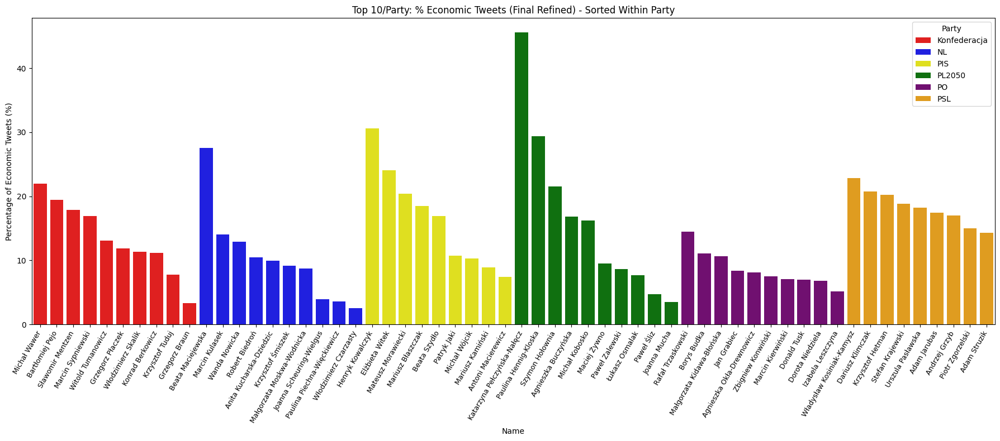

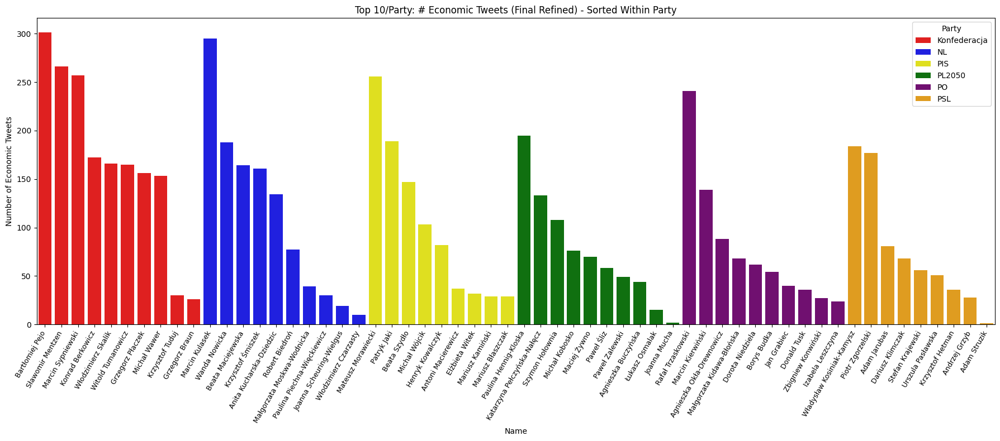

------------------------------

--- 9.C: Overall Top People Plots (Final Refined Method - Sorted Globally) ---
Generating overall plots based on the 58 users identified from Final Refined method...


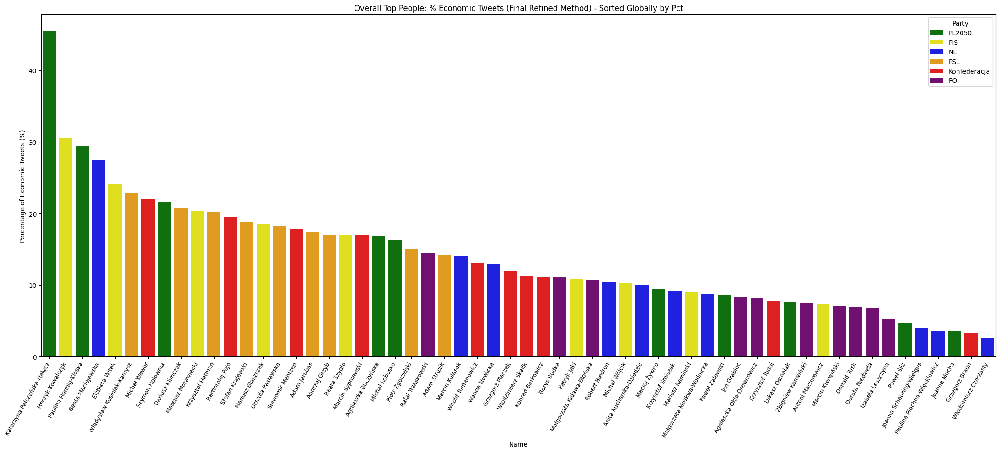

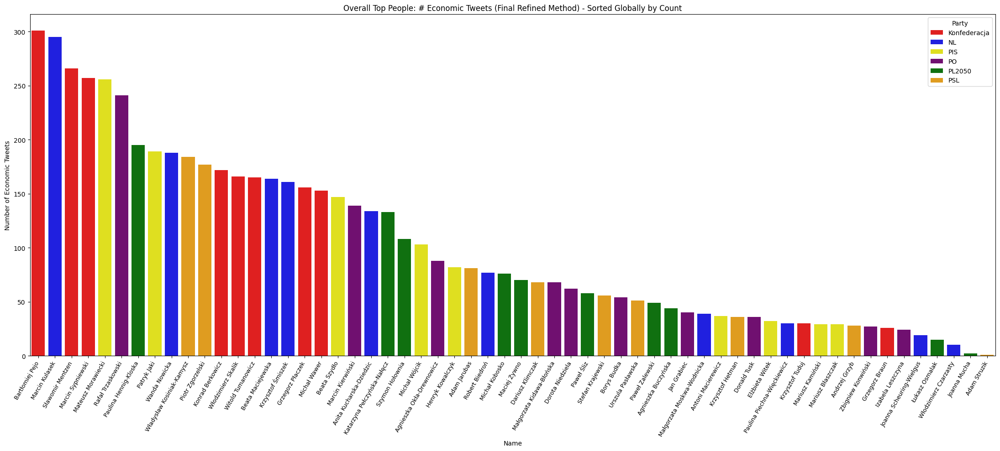


--- Top People Analysis Section Complete ---


In [62]:
# ==============================================================================
# 9. TOP PEOPLE POSTING ANALYSIS (Per Method & Overall)
# ==============================================================================
# This section analyzes which users post the most overall and the most economic tweets, broken down by party and method, using specified party colors.
# Plots show users sorted WITHIN party for each method, and then plots sorted OVERALL for the Final Refined method.

# Import necessary for transforms
import matplotlib.transforms as mtransforms

# Only run if party analysis is generally enabled (set in Section 7)
# and top people analysis is runnable (checks for user_col and party_colors)
if 'run_party_analysis' in locals() and run_party_analysis:
    print("\n--- 9. Top People Posting Analysis ---")

    # --- Configuration ---
    # party_col should be defined in Section 7 (e.g., party_col = 'party')
    # party_colors should be defined in Section 7
    user_col = 'name' # !!! CHECK IF NAME OF THE VARIABLE IS CORRECT !!!
    top_n_people = 10 # Number of top people per party to analyze

    # Check required columns for the section
    if user_col not in df_clean_translated.columns:
         print(f"ERROR: User column '{user_col}' not found. Skipping Top People Analysis.")
         run_top_people_analysis = False
    elif 'party_colors' not in locals() or not isinstance(party_colors, dict): # Ensure party_colors is a dict
         print("ERROR: 'party_colors' dictionary not found or not a dictionary. Skipping Top People Analysis.")
         run_top_people_analysis = False
    else:
         run_top_people_analysis = True # Set to True if checks pass

# Only proceed if columns exist AND initial party analysis was set to run
if 'run_party_analysis' in locals() and run_party_analysis and 'run_top_people_analysis' in locals() and run_top_people_analysis:


    # --------------------------------------------------------------------------
    # 9.A: Define Helper Functions
    # --------------------------------------------------------------------------
# (Located in Section 9.A: Define Helper Functions)

    def top_people_economic_party(df, user_col='name', party_col='party', econ_flag_col='union_flag', top_n=10):
        """ Calculates top N posters per party based on total tweets and their economic tweet stats. """

        if not all(c in df.columns for c in [user_col, party_col, econ_flag_col]):
            print(f"Warning: Missing columns in top_people_economic_party ({user_col}, {party_col}, {econ_flag_col}). Returning empty DF.")
            return pd.DataFrame([], columns=[party_col, user_col, 'total_tweets', 'econ_tweets', 'econ_pct'])

        # Calculate total tweets per user and party
        total_tweets = df.groupby([party_col, user_col]).size().rename("total_tweets")

        # Calculate economic tweets per user and party
        # Ensure econ_flag_col is boolean for correct filtering and sum
        econ_tweets = df[df[econ_flag_col].astype(bool)].groupby([party_col, user_col]).size().rename("econ_tweets")

        # Combine into a single DataFrame
        df_users = pd.concat([total_tweets, econ_tweets], axis=1).fillna(0) # Fill NaN econ_tweets with 0
        df_users['econ_tweets'] = df_users['econ_tweets'].astype(int) # Ensure integer counts

        # Calculate percentage of economic tweets for each user
        # Replace potential 0 in total_tweets with NaN to avoid division by zero, then fill resulting NaN with 0
        df_users['econ_pct'] = (df_users['econ_tweets'] / df_users['total_tweets'].replace(0, np.nan) * 100).fillna(0)
        
        df_users = df_users.reset_index() # 'party' and 'user_col' are now guaranteed columns

        # --- Get top N users per party based on *total* tweets ---
        # This pattern is generally more robust for getting top N per group while keeping group keys as columns.
        top_users = (df_users.sort_values(["total_tweets"], ascending=[False])
                    .groupby(party_col, group_keys=False)
                    .head(top_n))

        # Final sort for presentation
        return top_users.sort_values([party_col, 'total_tweets'], ascending=[True, False])


    def plot_top_people_by_party_sorted(top_users_df, party_colors_dict, method_name, top_n=10, user_col='name', party_col='party', figsize=(18, 8), x_label_rotation=60, x_label_ha='right', x_offset_points=0):
        """ Plots % and # of economic tweets for top users, sorted WITHIN party, colored by party. """
        if top_users_df.empty: print(f"Info: Empty DataFrame for plot_top_people_by_party_sorted ('{method_name}'). Skipping."); return
        if not all(c in top_users_df.columns for c in [party_col, user_col, 'econ_pct', 'econ_tweets']): print(f"Warning: Missing columns in plot_top_people_by_party_sorted ('{method_name}'). Skipping."); return
        if not isinstance(party_colors_dict, dict): print(f"Warning: Invalid party_colors_dict ('{method_name}'). Skipping."); return

        print(f"\nGenerating Top People plots (Sorted Within Party) for: {method_name} Approach")
        
        # --- Plot 1: Percentage (Sorted within Party) ---
        try:
            top_users_sorted_pct = top_users_df.sort_values(by=[party_col, 'econ_pct'], ascending=[True, False])
            fig1, ax1 = plt.subplots(figsize=figsize)
            sns.barplot(data=top_users_sorted_pct, x=user_col, y='econ_pct', hue=party_col,
                        palette=party_colors_dict, dodge=False, ax=ax1)
            ax1.set_title(f"Top {top_n}/Party: % Economic Tweets ({method_name}) - Sorted Within Party")
            ax1.set_xlabel(user_col.capitalize()); ax1.set_ylabel("Percentage of Economic Tweets (%)")
            
            ax1.set_xticks(ax1.get_xticks()) # Mitigate UserWarning
            ax1.set_xticklabels(ax1.get_xticklabels(), rotation=x_label_rotation, ha=x_label_ha, fontsize=9)
            if x_offset_points != 0:
                dx = x_offset_points / 72.; dy = 0.
                offset = mtransforms.ScaledTranslation(dx, dy, fig1.dpi_scale_trans)
                for label in ax1.xaxis.get_majorticklabels():
                    label.set_transform(label.get_transform() + offset)
            
            ax1.legend(title=party_col.capitalize(), loc='upper right'); # Legend inside
            plt.tight_layout(); plt.show()
        except Exception as e: print(f"Error plotting percentage chart for {method_name}: {e}")

        # --- Plot 2: Count (Sorted within Party) ---
        try:
            top_users_sorted_count = top_users_df.sort_values(by=[party_col, 'econ_tweets'], ascending=[True, False])
            fig2, ax2 = plt.subplots(figsize=figsize)
            sns.barplot(data=top_users_sorted_count, x=user_col, y='econ_tweets', hue=party_col,
                        palette=party_colors_dict, dodge=False, ax=ax2)
            ax2.set_title(f"Top {top_n}/Party: # Economic Tweets ({method_name}) - Sorted Within Party")
            ax2.set_xlabel(user_col.capitalize()); ax2.set_ylabel("Number of Economic Tweets")

            ax2.set_xticks(ax2.get_xticks()) # Mitigate UserWarning
            ax2.set_xticklabels(ax2.get_xticklabels(), rotation=x_label_rotation, ha=x_label_ha, fontsize=9)
            if x_offset_points != 0:
                dx = x_offset_points / 72.; dy = 0.
                offset = mtransforms.ScaledTranslation(dx, dy, fig2.dpi_scale_trans)
                for label in ax2.xaxis.get_majorticklabels():
                    label.set_transform(label.get_transform() + offset)

            ax2.legend(title=party_col.capitalize(), loc='upper right'); # Legend inside
            plt.tight_layout(); plt.show()
        except Exception as e: print(f"Error plotting count chart for {method_name}: {e}")

    print("Helper functions defined for Top People analysis.")
    print("-" * 60)


    # --------------------------------------------------------------------------
    # 9.B: Generate Top People Data & Party-Sorted Plots (Method by Method)
    # --------------------------------------------------------------------------
    # --- Define x-axis label parameters for party-sorted plots ---
    PARTY_SORTED_X_ROTATION = 60
    PARTY_SORTED_X_HA = 'right'  # 'center' or 'right'
    PARTY_SORTED_X_OFFSET = 3    # Points to shift right (positive) or left (negative)

    top_people_union = pd.DataFrame() # Initialize to avoid NameError if a block is skipped
    top_people_gateway = pd.DataFrame()
    top_people_final = pd.DataFrame()


    # # --- Union Approach ---
    # # Comment it comment out this block if not needed
    # print("\n--- 9.B.1: Top People Analysis - Union Approach ---")
    # union_flag_col = 'union_flag'
    # if union_flag_col in df_clean_translated.columns:
    #     top_people_union = top_people_economic_party(
    #         df_clean_translated, user_col=user_col, party_col=party_col,
    #         econ_flag_col=union_flag_col, top_n=top_n_people)
    #     print(f"Top {top_n_people} People Posting (Union Approach, by total tweets per party):")
    #     try: display(top_people_union)
    #     except NameError: print(top_people_union.to_string())
    #     if not top_people_union.empty : # Only plot if data exists
    #          plot_top_people_by_party_sorted(
    #              top_people_union, party_colors, "Union", top_n=top_n_people,
    #              user_col=user_col, party_col=party_col,
    #              x_label_rotation=PARTY_SORTED_X_ROTATION, x_label_ha=PARTY_SORTED_X_HA, x_offset_points=PARTY_SORTED_X_OFFSET)
    # else: print(f"Skipping Union Top People analysis: Flag column '{union_flag_col}' not found.")
    # print("-" * 60)
    # ###---### End Union ---###


    # # --- Gateway Approach ---
    # # Comment it out this block if not needed
    # print("\n--- 9.B.2: Top People Analysis - Gateway Approach ---")
    # gateway_flag_col = 'gateway_flag'
    # if gateway_flag_col in df_clean_translated.columns:
    #     top_people_gateway = top_people_economic_party(
    #         df_clean_translated, user_col=user_col, party_col=party_col,
    #         econ_flag_col=gateway_flag_col, top_n=top_n_people)
    #     print(f"Top {top_n_people} People Posting (Gateway Approach, by total tweets per party):")
    #     try: display(top_people_gateway)
    #     except NameError: print(top_people_gateway.to_string())
    #     if not top_people_gateway.empty: # Only plot if data exists
    #         plot_top_people_by_party_sorted(
    #             top_people_gateway, party_colors, "Gateway", top_n=top_n_people,
    #             user_col=user_col, party_col=party_col,
    #             x_label_rotation=PARTY_SORTED_X_ROTATION, x_label_ha=PARTY_SORTED_X_HA, x_offset_points=PARTY_SORTED_X_OFFSET)
    # else: print(f"Skipping Gateway Top People analysis: Flag column '{gateway_flag_col}' not found.")
    # print("-" * 60)
    # ###---### End Gateway ---###


    # --- Final Refined Approach ---
    # You can comment out this block if not needed
    print("\n--- 9.B.3: Top People Analysis - Final Refined Approach ---")
    final_flag_col_tp = 'has_econ_term_FILTERED' # Use final flag name
    if final_flag_col_tp in df_clean_translated.columns:
        top_people_final = top_people_economic_party(
            df_clean_translated, user_col=user_col, party_col=party_col,
            econ_flag_col=final_flag_col_tp, top_n=top_n_people)
        print(f"Top {top_n_people} People Posting (Final Refined Approach, by total tweets per party):")
        try: display(top_people_final)
        except NameError: print(top_people_final.to_string())
        if not top_people_final.empty: # Only plot if data exists
            plot_top_people_by_party_sorted(
                top_people_final, party_colors, "Final Refined", top_n=top_n_people,
                user_col=user_col, party_col=party_col,
                x_label_rotation=PARTY_SORTED_X_ROTATION, x_label_ha=PARTY_SORTED_X_HA, x_offset_points=PARTY_SORTED_X_OFFSET)
    else: print(f"Skipping Final Refined Top People analysis: Flag column '{final_flag_col_tp}' not found.")
    print("-" * 30)
    ###---### End Final Refined ---###


    # --------------------------------------------------------------------------
    # 9.C: Overall Top People Plots (Final Refined Method - Sorted Globally)
    # --------------------------------------------------------------------------
    print("\n--- 9.C: Overall Top People Plots (Final Refined Method - Sorted Globally) ---")

    # Define x-axis label parameters for these overall plots
    OVERALL_X_ROTATION = 60
    OVERALL_X_HA = 'right'
    OVERALL_X_OFFSET = 3 # Adjust as needed

    if 'top_people_final' not in locals() or top_people_final.empty:
        print("Skipping overall plots: 'top_people_final' DataFrame is empty or not created (likely its source method was skipped or had no data).")
    else:
        print(f"Generating overall plots based on the {len(top_people_final)} users identified from Final Refined method...")
        overall_figsize = (22, 10) # Wider for more names

        # --- Plot 1: Overall Percentage (Sorted Globally) ---
        try:
            overall_sorted_pct = top_people_final.sort_values(by="econ_pct", ascending=False)
            overall_order_pct = overall_sorted_pct[user_col].tolist()
            fig_ov_pct, ax_ov_pct = plt.subplots(figsize=overall_figsize)
            sns.barplot(data=overall_sorted_pct, x=user_col, y='econ_pct', hue=party_col,
                        order=overall_order_pct, palette=party_colors, dodge=False, ax=ax_ov_pct)
            ax_ov_pct.set_title(f"Overall Top People: % Economic Tweets (Final Refined Method) - Sorted Globally by Pct")
            ax_ov_pct.set_xlabel(user_col.capitalize()); ax_ov_pct.set_ylabel("Percentage of Economic Tweets (%)")
            ax_ov_pct.set_xticks(ax_ov_pct.get_xticks())
            ax_ov_pct.set_xticklabels(ax_ov_pct.get_xticklabels(), rotation=OVERALL_X_ROTATION, ha=OVERALL_X_HA, fontsize=9)
            if OVERALL_X_OFFSET != 0:
                dx = OVERALL_X_OFFSET / 72.; dy = 0.
                offset = mtransforms.ScaledTranslation(dx, dy, fig_ov_pct.dpi_scale_trans)
                for label in ax_ov_pct.xaxis.get_majorticklabels():
                    label.set_transform(label.get_transform() + offset)
            ax_ov_pct.legend(title=party_col.capitalize(), loc='upper right');
            plt.tight_layout(); plt.show()
        except Exception as e: print(f"Error plotting overall percentage chart: {e}")

        # --- Plot 2: Overall Count (Sorted Globally) ---
        try:
            overall_sorted_count = top_people_final.sort_values(by="econ_tweets", ascending=False)
            overall_order_count = overall_sorted_count[user_col].tolist()
            fig_ov_count, ax_ov_count = plt.subplots(figsize=overall_figsize)
            sns.barplot(data=overall_sorted_count, x=user_col, y='econ_tweets', hue=party_col,
                        order=overall_order_count, palette=party_colors, dodge=False, ax=ax_ov_count)
            ax_ov_count.set_title(f"Overall Top People: # Economic Tweets (Final Refined Method) - Sorted Globally by Count")
            ax_ov_count.set_xlabel(user_col.capitalize()); ax_ov_count.set_ylabel("Number of Economic Tweets")
            ax_ov_count.set_xticks(ax_ov_count.get_xticks())
            ax_ov_count.set_xticklabels(ax_ov_count.get_xticklabels(), rotation=OVERALL_X_ROTATION, ha=OVERALL_X_HA, fontsize=9)
            if OVERALL_X_OFFSET != 0:
                dx = OVERALL_X_OFFSET / 72.; dy = 0.
                offset = mtransforms.ScaledTranslation(dx, dy, fig_ov_count.dpi_scale_trans)
                for label in ax_ov_count.xaxis.get_majorticklabels():
                    label.set_transform(label.get_transform() + offset)
            ax_ov_count.legend(title=party_col.capitalize(), loc='upper right');
            plt.tight_layout(); plt.show()
        except Exception as e: print(f"Error plotting overall count chart: {e}")

# Final completion message
if 'run_party_analysis' in locals() and run_party_analysis and 'run_top_people_analysis' in locals() and run_top_people_analysis:
    print("\n" + "="*60)
    print("--- Top People Analysis Section Complete ---")
    print("="*60)


--- Inspecting Specific Tweets (with Person's Keyword Stats) ---

--- Inspection Criteria & Overall Stats ---
Focusing on user: 'Katarzyna Pełczyńska-Nałęcz'

Total tweets for user 'Katarzyna Pełczyńska-Nałęcz': 292
Tweets flagged by 'has_econ_term_FILTERED' for user 'Katarzyna Pełczyńska-Nałęcz': 133 (45.55%)

--- Keyword Distribution for Katarzyna Pełczyńska-Nałęcz's Economic Tweets (flagged by 'has_econ_term_FILTERED') ---
Top 15 keywords used by Katarzyna Pełczyńska-Nałęcz in these 133 economic tweets:


,Keyword,Frequency
3,fund,51
0,investment,29
1,development,22
6,energy,16
9,entrepreneurs,12
4,budget,11
19,economy,11
5,finance,10
7,infrastructure,9
2,industry,6


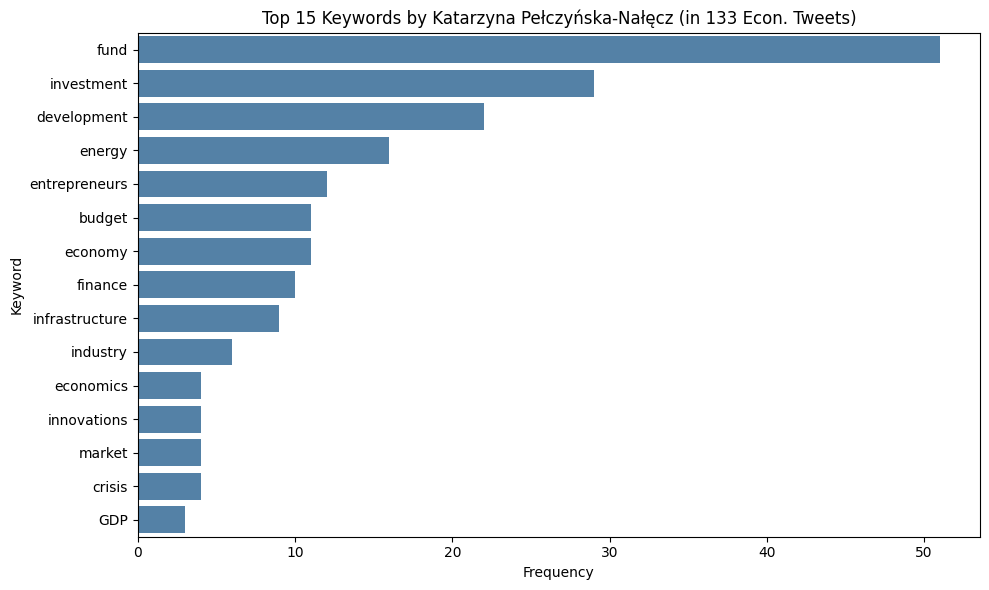

------------------------------

Filtering the 133 economic tweets for keyword: 'fund' (for sampling)...
Found 51 tweets also containing 'fund'.
------------------------------

Displaying a random sample of 10 (out of 51) tweets matching ALL criteria:


,id,name,text_clean_en,has_econ_term_FILTERED,matched_keywords_FILTERED,extracted_terms_FILTERED
38654,1797592928493453824,Katarzyna Pełczyńska-Nałęcz,"I confirm. Red is bad did not receive subsidies from European funds. EU subsidies need to be accounted for, money from PiS does not necessarily ha...",True,[fund],[funds]
38571,1836051857657192704,Katarzyna Pełczyńska-Nałęcz,PLN 1.5 billion - this is how much we will redirect funds 🇪 🇺 🇵 🇱 to reconstruction after the flood. These are funds for the renovation of singl...,True,"[fund, energy, infrastructure]","[energy, funds, infrastructure]"
38673,1783432940547924224,Katarzyna Pełczyńska-Nałęcz,"Record payouts from KPO. As I announced, we already have funds in Poland, so we are accelerating our investments. Today we pay out: 👉 PLN 507 mil...",True,"[fund, investment]","[investments, funds]"
38733,1750820462362284544,Katarzyna Pełczyńska-Nałęcz,A loan fund is launched - PLN 450 million for reduced loans for small companies in eastern Poland. We support the tourism industry in the regions ...,True,"[fund, industry]","[fund, industry]"
38566,1838187441703842048,Katarzyna Pełczyńska-Nałęcz,We are creating a new priority in European Funds: Reconstruction after the flood and strengthening resilience. I have consulted with local gover...,True,"[fund, energy, infrastructure]","[Energy, Funds, infrastructure]"
38689,1775562951543455744,Katarzyna Pełczyńska-Nałęcz,"As promised, we are accelerating investments from EU funds and KPO! In April, we will announce 36 new competitions in addition to the 97 competiti...",True,"[fund, economy, entrepreneurs, industry, investment]","[economy, entrepreneurs, investments, industry, funds]"
38651,1798281641569272320,Katarzyna Pełczyńska-Nałęcz,Direction: Białowieża. Purpose: consultations with local government officials and entrepreneurs. I want to hear from those interested themselves...,True,"[fund, entrepreneurs]","[funds, entrepreneurs]"
38600,1825920618266578944,Katarzyna Pełczyńska-Nałęcz,"Today, at the Council of Ministers, I presented a report on the implementation of the #KPO. We just reached 555,000. signed contracts with benefi...",True,[fund],[funds]
38739,1747879919965622784,Katarzyna Pełczyńska-Nałęcz,"Today, the payment of funds from the KPO: new places in nurseries - PLN 1 million (ultimately 47.5 thousand places), modernization of SMEs in agri...",True,[fund],[funds]
38726,1753063382780186880,Katarzyna Pełczyńska-Nałęcz,In a women's group (as it happened:) about support for entrepreneurs from funds 🇪 🇺 🇵 🇱 . Thank you for the conversation and I invite you to conti...,True,"[fund, entrepreneurs]","[funds, entrepreneurs]"



--- Tweet Inspection Section Complete ---
--------------------------------------------------


In [63]:
# ==============================================================================
# SECTION 9 CHECK: INSPECT SPECIFIC TWEETS (with Person's Keyword Stats)
# ==============================================================================
# This section allows inspecting a RANDOM SAMPLE of tweets based on:
# - A specific person (optional) - if so, shows their keyword distribution.
# - A specific keyword within their matched keywords (optional for sampling).
# - A specific flagging method.
# It also provides summary statistics based on these criteria.

print("\n" + "="*60)
print("--- Inspecting Specific Tweets (with Person's Keyword Stats) ---")
print("="*60)

# --- Configuration ---
user_col_inspect = 'name' # This should match the column with author names
id_col_inspect = 'id'     # Unique tweet ID column
text_col_inspect = 'text_clean_en'

# !!! --- DEFINE YOUR INSPECTION CRITERIA BELOW --- !!!
# 1. OPTIONAL: Specify a person to filter by.
person_to_inspect = "Katarzyna Pełczyńska-Nałęcz"  # Example, REPLACE THIS or set to None
# person_to_inspect = None # Example: To select from all users

# 2. OPTIONAL: Specify a keyword to filter by FOR SAMPLING.
#    The script will look for this keyword in the 'kw_col_to_inspect' for the random sample.
#    Set to None or "" to not filter the random sample by a specific keyword.
keyword_to_filter_by_sample = 'fund'  # Example: 'inflation' or 'bank' or None

# 3. Choose the method's flag and keyword columns for initial filtering & stats
flag_to_inspect = 'has_econ_term_FILTERED'
kw_col_to_inspect = 'matched_keywords_FILTERED' # This is used for person's keyword stats AND keyword_to_filter_by_sample
extracted_col_inspect = 'extracted_terms_FILTERED' # Contextual: 'extracted_terms_FILTERED' or None

n_tweets_to_show_sample = 10 # How many random tweets to show that match ALL criteria
top_n_person_keywords = 15 # How many top keywords to show for the specified person
# --- End Configuration ---

# Check if the base DataFrame and essential columns exist
if 'df_clean_translated' not in globals() or df_clean_translated.empty:
    print("ERROR: 'df_clean_translated' DataFrame not found or is empty. Skipping inspection.")
elif user_col_inspect not in df_clean_translated.columns:
    print(f"ERROR: User column '{user_col_inspect}' not found. Skipping inspection.")
elif flag_to_inspect not in df_clean_translated.columns:
    print(f"ERROR: Flag column '{flag_to_inspect}' not found. Skipping inspection.")
elif kw_col_to_inspect not in df_clean_translated.columns:
    print(f"ERROR: Keyword column '{kw_col_to_inspect}' not found. Skipping inspection.")
else:
    print("\n--- Inspection Criteria & Overall Stats ---")
    target_df_for_stats = df_clean_translated

    if person_to_inspect:
        print(f"Focusing on user: '{person_to_inspect}'")
        target_df_for_stats = df_clean_translated[df_clean_translated[user_col_inspect] == person_to_inspect].copy()
        if target_df_for_stats.empty:
            print(f"No tweets found for user '{person_to_inspect}'. Check spelling/case/remapping.")
            target_df_for_stats = None # Indicates error or no data for person
    else:
        print("Considering all users for initial stats and sampling pool.")

    if target_df_for_stats is not None and not target_df_for_stats.empty:
        total_tweets_in_scope = len(target_df_for_stats)
        econ_tweets_in_scope_df = target_df_for_stats[target_df_for_stats[flag_to_inspect] == True].copy()
        econ_tweets_in_scope_count = len(econ_tweets_in_scope_df)
        pct_econ_in_scope = (econ_tweets_in_scope_count / total_tweets_in_scope * 100) if total_tweets_in_scope > 0 else 0

        scope_description = f"for user '{person_to_inspect}'" if person_to_inspect else "in the dataset"
        print(f"\nTotal tweets {scope_description}: {total_tweets_in_scope}")
        print(f"Tweets flagged by '{flag_to_inspect}' {scope_description}: {econ_tweets_in_scope_count} ({pct_econ_in_scope:.2f}%)")

        # --- Keyword Distribution for Specified Person's Economic Tweets ---
        if person_to_inspect and not econ_tweets_in_scope_df.empty:
            print(f"\n--- Keyword Distribution for {person_to_inspect}'s Economic Tweets (flagged by '{flag_to_inspect}') ---")
            person_keywords_list = [
                kw for sublist in econ_tweets_in_scope_df[kw_col_to_inspect]
                if isinstance(sublist, list) for kw in sublist
            ]
            if person_keywords_list:
                person_keyword_counts = Counter(person_keywords_list)
                df_person_kw_counts = pd.DataFrame(person_keyword_counts.items(), columns=['Keyword', 'Frequency'])
                df_person_kw_counts = df_person_kw_counts.sort_values(by='Frequency', ascending=False)

                print(f"Top {top_n_person_keywords} keywords used by {person_to_inspect} in these {econ_tweets_in_scope_count} economic tweets:")
                try:
                    display(df_person_kw_counts.head(top_n_person_keywords))
                except NameError:
                    print(df_person_kw_counts.head(top_n_person_keywords).to_string())

                # Optional: Plot bar chart for this person's top keywords
                plt.figure(figsize=(10, max(6, top_n_person_keywords * 0.4))) # Dynamic height
                top_plot_data = df_person_kw_counts.head(top_n_person_keywords)
                sns.barplot(data=top_plot_data, y='Keyword', x='Frequency', color='steelblue')
                plt.title(f"Top {top_n_person_keywords} Keywords by {person_to_inspect} (in {econ_tweets_in_scope_count} Econ. Tweets)")
                plt.xlabel("Frequency"); plt.ylabel("Keyword")
                plt.tight_layout(); plt.show()
            else:
                print(f"No matched keywords found in the economic tweets for {person_to_inspect} using column '{kw_col_to_inspect}'.")
            print("-" * 30)
        # --- End Person's Keyword Distribution ---

        df_final_pool = econ_tweets_in_scope_df # Start with economic tweets in current scope

        if keyword_to_filter_by_sample: # Now filter this pool for sampling
            print(f"\nFiltering the {len(df_final_pool)} economic tweets for keyword: '{keyword_to_filter_by_sample}' (for sampling)...")
            mask_contains_keyword_sample = df_final_pool[kw_col_to_inspect].apply(
                lambda lst: isinstance(lst, list) and keyword_to_filter_by_sample in lst
            )
            df_final_pool = df_final_pool[mask_contains_keyword_sample].copy()
            print(f"Found {len(df_final_pool)} tweets also containing '{keyword_to_filter_by_sample}'.")
        else:
            print(f"\nNo specific keyword filter for sampling. Will sample from all {len(df_final_pool)} economic tweets in scope.")
        print("-" * 30)

        # --- Sample and Display ---
        count_final_pool = len(df_final_pool)
        if count_final_pool > 0:
            actual_sample_size = min(n_tweets_to_show_sample, count_final_pool)
            print(f"\nDisplaying a random sample of {actual_sample_size} (out of {count_final_pool}) tweets matching ALL criteria:")
            df_sample_to_show = df_final_pool.sample(n=actual_sample_size, random_state=None)
            cols_to_display_inspect = [text_col_inspect, flag_to_inspect, kw_col_to_inspect]
            if extracted_col_inspect and extracted_col_inspect in df_sample_to_show.columns: cols_to_display_inspect.append(extracted_col_inspect)
            if id_col_inspect and id_col_inspect in df_sample_to_show.columns: cols_to_display_inspect.insert(0, id_col_inspect)
            if person_to_inspect and user_col_inspect in df_sample_to_show.columns and user_col_inspect not in cols_to_display_inspect:
                 if id_col_inspect: cols_to_display_inspect.insert(1, user_col_inspect)
                 else: cols_to_display_inspect.insert(0, user_col_inspect)
            cols_to_display_final = [c for c in cols_to_display_inspect if c in df_sample_to_show.columns]
            if not cols_to_display_final: print("Warning: No valid columns to display for the sample.")
            else:
                 try:
                     original_max_colwidth = pd.get_option('display.max_colwidth'); pd.set_option('display.max_colwidth', 150)
                     display(df_sample_to_show[cols_to_display_final])
                     pd.set_option('display.max_colwidth', original_max_colwidth)
                 except NameError: print(df_sample_to_show[cols_to_display_final].to_string())
                 except Exception as e: print(f"Error during display: {e}"); print(df_sample_to_show[cols_to_display_final].to_string())
        else:
            print("No tweets found matching all specified criteria to sample from.")
    elif target_df_for_stats is None: pass # Error already printed
    else: print("Initial DataFrame 'df_clean_translated' (or filtered by person) is empty.")

print("\n--- Tweet Inspection Section Complete ---")
print("-" * 50)

In [64]:
# ==============================================================================
# SECTION 10: TIME SERIES ANALYSIS & VISUALIZATION
# ==============================================================================
# This section includes:
# 10.A: Definitions of time series plotting functions with flexible annotations.
# 10.B: A calling block to generate plots for specific methods/frequencies.
# 10.C: Analysis of peaks in the time series using smoothing.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
# import matplotlib.transforms as mtransforms # Already imported 

print("\n" + "="*60)
print("--- Section 10: Time Series Analysis & Visualization ---")
print("="*60)

# ------------------------------------------------------------------------------
# SECTION 10.A: Function Definitions for Time Series Plotting
# ------------------------------------------------------------------------------
print("\n--- 10.A: Defining Time Series Plotting Functions ---")

def plot_annotated_timeseries(df, flag_col, method_name,
                              annotations=None,
                              show_custom_annotations=True,
                              election_date_str=None,
                              show_election_shading=True,
                              freq='W', figsize=(14, 7), date_col='created_at'):
    """ Plots the COUNT of flagged tweets over time with annotations. """
    print(f"\nGenerating annotated COUNT time series for: {method_name} Method")
    if annotations and show_custom_annotations: print("Custom annotations: SHOWN.")
    else: print("Custom annotations: HIDDEN or not provided.")
    if election_date_str and show_election_shading: print("Election shading: SHOWN.")
    else: print("Election shading: HIDDEN or election date not provided.")

    df_plot = df.copy()
    if date_col not in df_plot.columns: print(f"ERROR: Date column '{date_col}' not found."); return
    try:
        df_plot[date_col] = pd.to_datetime(df_plot[date_col], errors='coerce')
        df_plot.dropna(subset=[date_col], inplace=True)
        if df_plot.empty: print(f"No valid dates in '{date_col}'."); return
        df_plot = df_plot.set_index(date_col, drop=False).sort_index()
        if df_plot.index.tz is not None:
            df_plot.index = df_plot.index.tz_convert('UTC').tz_localize(None)
    except Exception as e: print(f"Error processing date column/index: {e}"); return

    if flag_col not in df_plot.columns: print(f"ERROR: Flag column '{flag_col}' not found."); return
    try: ts_counts = df_plot[flag_col].resample(freq).sum()
    except Exception as e: print(f"Error during resampling: {e}"); return
    if ts_counts.empty: print("No data after resampling for counts."); return

    plot_start_date = ts_counts.index.min(); plot_end_date = ts_counts.index.max()
    election_date = pd.to_datetime(election_date_str) if election_date_str else None
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(ts_counts.index, ts_counts.values, marker='.', linestyle='-', label=f'Economic Tweets ({method_name})', zorder=5)

    if election_date and pd.notna(plot_start_date) and pd.notna(plot_end_date) and plot_start_date <= election_date <= plot_end_date:
        ax.axvline(election_date, color='red', linestyle='--', lw=2, label=f"Parl. Elections: {election_date.strftime('%Y-%m-%d')}", zorder=10)
        if show_election_shading:
            if plot_start_date < election_date: ax.axvspan(plot_start_date, election_date, color='#DDA0DD', alpha=0.3, label='Pre-Election Period', zorder=1)
            if election_date < plot_end_date: ax.axvspan(election_date, plot_end_date, color='#90EE90', alpha=0.3, label='Post-Election Period', zorder=1)

    if annotations and show_custom_annotations:
        print("Processing custom annotations for count plot...")
        annotation_labels_used = set()
        for event in annotations:
            try:
                if 'date' in event:
                    dt = pd.to_datetime(event['date']);
                    if pd.notna(plot_start_date) and pd.notna(plot_end_date) and plot_start_date <= dt <= plot_end_date:
                        label=event.get('label', f"Evt:{event['date']}")
                        current_label = label if label not in annotation_labels_used else None
                        ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), label=current_label, zorder=10)
                        if current_label: annotation_labels_used.add(label)
                elif 'start_date' in event and 'end_date' in event:
                    dt_start=pd.to_datetime(event['start_date']); dt_end=pd.to_datetime(event['end_date'])
                    if pd.notna(dt_start) and pd.notna(dt_end) and dt_start <= dt_end and not (dt_end < plot_start_date or dt_start > plot_end_date):
                        label=event.get('label', f"R:{event['start_date']}-{event['end_date']}")
                        current_label = label if label not in annotation_labels_used else None
                        span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                        ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.2), label=current_label, zorder=1)
                        if current_label: annotation_labels_used.add(label)
                        if event.get('add_lines', False):
                            line_color=event.get('line_color', event.get('color', 'cyan')); line_style=event.get('line_style', ':'); line_width=event.get('line_width', 1)
                            if plot_start_date <= dt_start <= plot_end_date: ax.axvline(dt_start, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
                            if plot_start_date <= dt_end <= plot_end_date: ax.axvline(dt_end, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
            except Exception as e: print(f"Warning: Could not process custom annotation {event}. Error: {e}")

    ax.set_title(f'Economic Tweets Over Time ({freq} Freq, {method_name} Method)'); ax.set_xlabel(f'Time ({freq} ending)'); ax.set_ylabel('Number of Economic Tweets')
    ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1)); ax.grid(True, alpha=0.6); plt.tight_layout(rect=[0, 0, 0.88, 1]); plt.show()


def plot_top_token_timeseries(df, token_col, method_name, top_n=10, freq='W',
                              annotations=None, show_custom_annotations=True,
                              election_date_str=None, show_election_shading=True,
                              figsize=(14,8), date_col='created_at'):
    """ Plots time series for top N tokens, with annotations. """
    print(f"\nGenerating top {top_n} token time series plot for: {method_name} Method")
    if annotations and show_custom_annotations: print("Custom annotations: SHOWN.")
    else: print("Custom annotations: HIDDEN or not provided.")
    if election_date_str and show_election_shading: print("Election shading: SHOWN.")
    else: print("Election shading: HIDDEN or election date not provided.")

    df_plot = df.copy()
    if date_col not in df_plot.columns: print(f"ERROR: Date column '{date_col}' not found."); return
    try:
        df_plot[date_col] = pd.to_datetime(df_plot[date_col], errors='coerce')
        df_plot.dropna(subset=[date_col], inplace=True);
        if df_plot.empty: print(f"No valid dates in '{date_col}'."); return
        df_plot = df_plot.set_index(date_col).sort_index() # Set index directly
        if df_plot.index.tz is not None: df_plot.index = df_plot.index.tz_convert('UTC').tz_localize(None)
    except Exception as e: print(f"Error processing date column/index for top tokens: {e}"); return

    if token_col not in df_plot.columns: print(f"ERROR: Token column '{token_col}' not found."); return
    all_tokens = [t for tokens_list in df_plot[token_col] if isinstance(tokens_list, list) for t in tokens_list]
    if not all_tokens: print(f"No tokens in '{token_col}' for {method_name}."); return
    top_tokens = [token for token, count in Counter(all_tokens).most_common(top_n)]
    print(f"Top {top_n} tokens for {method_name}: {top_tokens}")

    fig, ax = plt.subplots(figsize=figsize)
    plot_start_date = None; plot_end_date = None

    for token in top_tokens:
        try:
            ts = df_plot[token_col].apply(lambda t_list: 1 if (isinstance(t_list, list) and token in t_list) else 0).resample(freq).sum()
            if not ts.empty:
                 ax.plot(ts.index, ts.values, marker='o', linestyle='-', label=token, zorder=5)
                 current_min = ts.index.min(); current_max = ts.index.max()
                 if plot_start_date is None or current_min < plot_start_date: plot_start_date = current_min
                 if plot_end_date is None or current_max > plot_end_date: plot_end_date = current_max
        except Exception as e: print(f"Error processing/plotting token '{token}': {e}")

    election_date = pd.to_datetime(election_date_str) if election_date_str else None
    if election_date and pd.notna(plot_start_date) and pd.notna(plot_end_date) and plot_start_date <= election_date <= plot_end_date:
        ax.axvline(election_date, color='red', linestyle='--', lw=1.5, label=f"Parl. Elections: {election_date.strftime('%Y-%m-%d')}", zorder=10)
        if show_election_shading:
            if plot_start_date < election_date: ax.axvspan(plot_start_date, election_date, color='#DDA0DD', alpha=0.2, zorder=1)
            if election_date < plot_end_date: ax.axvspan(election_date, plot_end_date, color='#90EE90', alpha=0.2, zorder=1)

    if annotations and show_custom_annotations:
        print("Processing custom annotations for top token plot...")
        annotation_labels_used = set()
        for event in annotations: # (Annotation logic - same as above)
            try:
                if 'date' in event:
                    dt = pd.to_datetime(event['date']);
                    if pd.notna(plot_start_date) and pd.notna(plot_end_date) and plot_start_date <= dt <= plot_end_date:
                        label=event.get('label', f"Evt:{event['date']}")
                        current_label = label if label not in annotation_labels_used else None
                        ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), label=current_label, zorder=10)
                        if current_label: annotation_labels_used.add(label)
                elif 'start_date' in event and 'end_date' in event:
                    dt_start=pd.to_datetime(event['start_date']); dt_end=pd.to_datetime(event['end_date'])
                    if pd.notna(dt_start) and pd.notna(dt_end) and dt_start <= dt_end and not (dt_end < plot_start_date or dt_start > plot_end_date):
                        label=event.get('label', f"R:{event['start_date']}-{event['end_date']}")
                        current_label = label if label not in annotation_labels_used else None
                        span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                        ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), label=current_label, zorder=1)
                        if current_label: annotation_labels_used.add(label)
                        if event.get('add_lines', False):
                            line_color=event.get('line_color', event.get('color', 'cyan')); line_style=event.get('line_style', ':'); line_width=event.get('line_width', 0.8)
                            if plot_start_date <= dt_start <= plot_end_date: ax.axvline(dt_start, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
                            if plot_start_date <= dt_end <= plot_end_date: ax.axvline(dt_end, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
            except Exception as e: print(f"Warning: Could not process custom annotation {event} for top token plot. Error: {e}")

    ax.set_title(f'{freq} Frequency of Top {top_n} Tokens ({method_name} Approach)'); ax.set_xlabel(f'Time ({freq} ending)'); ax.set_ylabel('Frequency')
    ax.legend(title=f'Top {method_name} Tokens', loc='upper left', bbox_to_anchor=(1.02, 1)); ax.grid(True, alpha=0.6); plt.tight_layout(rect=[0, 0, 0.88, 1]); plt.show()

print("Time series functions defined.")
print("-" * 50)


--- Section 10: Time Series Analysis & Visualization ---

--- 10.A: Defining Time Series Plotting Functions ---
Time series functions defined.
--------------------------------------------------



--- 10.B: Generating Time Series Plots ---

Selected plot configuration:
  Method: Final_Refined, Frequency: W
  Main Election line for: 2023-10-15, Pre/Post Shading: True
  Show other custom annotations: True
  Number of custom annotations: 7
--------------------------------------------------

Generating annotated COUNT time series for: Final_Refined Method
Custom annotations: SHOWN.
Election shading: SHOWN.
Processing custom annotations for count plot...


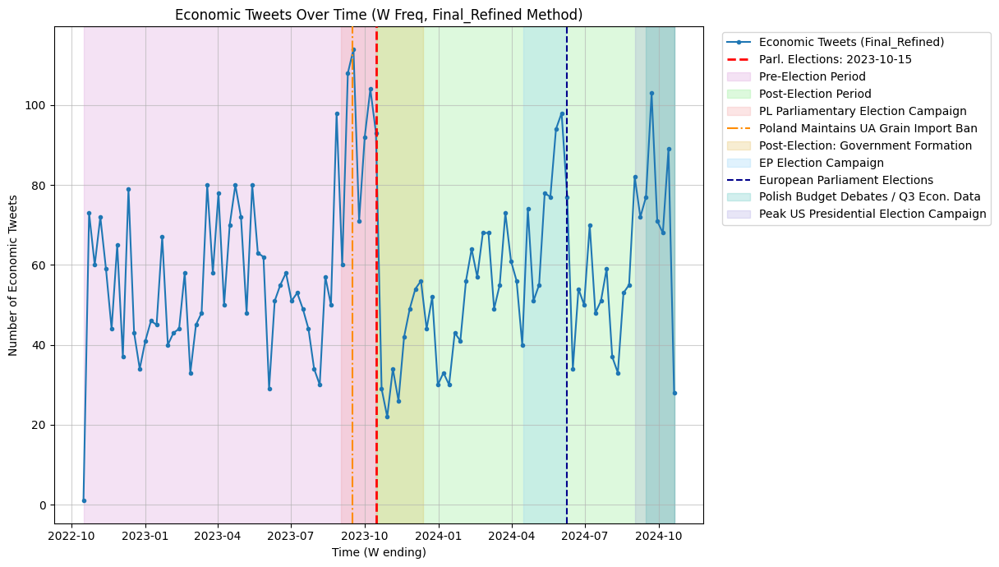


--- Time Series Analysis Section Complete ---
--------------------------------------------------


In [65]:
# ==============================================================================
# SECTION 10.B: TIME SERIES ANALYSIS & VISUALIZATION CALLING BLOCK
# ==============================================================================
# To generate different plots:
# 1. Copy part of block starting from words"- HERE" into a new cell.
# 2. Change the parameters in the function - example shown later.

print("\n" + "="*60)
print("--- 10.B: Generating Time Series Plots ---")
print("="*60)

# --- Configuration for THIS specific plot run ---
# VVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVV
# VVVVVVVVVVVVVVVV CHANGE THESE PARAMETERS FOR DIFFERENT PLOTS VVVVVVVVVVVVVVVVV
# VVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVVV

method_to_analyze = 'Final_Refined' # Options: 'Union', 'Gateway', 'Final_Refined'
time_series_freq = 'W'             # Options: 'W' (Weekly), 'M' (Monthly), 'D' (Daily)
date_col_ts = 'created_at'          # !!! Actual date column name !!!

# --- Define CUSTOM Annotations (these are optional, controlled by show_other_custom_annotations) ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parliamentary Election Campaign', 'color': 'lightcoral', 'alpha': 0.2, 'add_lines': False},
    {'date': '2023-09-16', 'label': 'Poland Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.5 },
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Government Formation', 'color': '#DAA520', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25, 'add_lines': False },
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5 },
    {'start_date': '2024-09-15', 'end_date': '2024-10-31', 'label': 'Polish Budget Debates / Q3 Econ. Data', 'color': 'lightseagreen', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-09-01', 'end_date': '2024-11-04', 'label': 'Peak US Presidential Election Campaign', 'color': 'slateblue', 'alpha': 0.15, 'add_lines': False},
    # Add more or remove as needed
]

# --- Toggles for standard and custom annotations ---
main_election_date_str = '2023-10-15' # Main Polish election line, set to None to hide
show_pre_post_main_election_shading = True # Toggle for light purple/green shading around main_election_date_str
show_other_custom_annotations = True       # Toggle for the annotations_list above

# ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
# ^^^^^^^^^^^^^^^ END OF PARAMETERS TO CHANGE FOR DIFFERENT PLOTS ^^^^^^^^^^^^^^^
# ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

print("\nSelected plot configuration:")
print(f"  Method: {method_to_analyze}, Frequency: {time_series_freq}")
print(f"  Main Election line for: {main_election_date_str}, Pre/Post Shading: {show_pre_post_main_election_shading}")
print(f"  Show other custom annotations: {show_other_custom_annotations}")
if show_other_custom_annotations and annotations_list: print(f"  Number of custom annotations: {len(annotations_list)}")
else: print(f"  Custom annotations_list is empty or toggled off.")
print("-" * 50)

# --- Determine columns based on chosen method ---
flag_col = None; token_col_ts = None
if method_to_analyze == 'Union': flag_col = 'union_flag'; token_col_ts = 'union_tokens'
elif method_to_analyze == 'Gateway': flag_col = 'gateway_flag'; token_col_ts = 'gateway_tokens'
elif method_to_analyze == 'Final_Refined': flag_col = 'has_econ_term_FILTERED'; token_col_ts = 'matched_keywords_FILTERED'
else: print(f"ERROR: Unknown method '{method_to_analyze}'.")

# --- Generate Annotated Plot for Tweet Counts - HERE ---
if 'plot_annotated_timeseries' in locals() and flag_col and flag_col in df_clean_translated.columns:
    if date_col_ts not in df_clean_translated.columns: print(f"ERROR: Date column '{date_col_ts}' not found.")
    else:
         plot_annotated_timeseries(
             df=df_clean_translated, flag_col=flag_col, method_name=method_to_analyze,
             annotations=annotations_list, show_custom_annotations=show_other_custom_annotations,
             election_date_str=main_election_date_str, show_election_shading=show_pre_post_main_election_shading,
             freq=time_series_freq, date_col=date_col_ts)
elif not ('plot_annotated_timeseries' in locals()): print("ERROR: 'plot_annotated_timeseries' function not defined.")
else: print(f"Skipping annotated plot: Flag column '{flag_col}' missing or method invalid.")

# --- Optional: Generate Top Token Plot ---
# print("\n--- Optional: Plotting Top Token Trends ---")
# if 'plot_top_token_timeseries' in locals() and token_col_ts and token_col_ts in df_clean_translated.columns:
#     if date_col_ts not in df_clean_translated.columns: print(f"ERROR: Date column '{date_col_ts}' not found.")
#     else:
#          plot_top_token_timeseries(
#               df=df_clean_translated, token_col=token_col_ts, method_name=method_to_analyze,
#               top_n=10, freq=time_series_freq, date_col=date_col_ts,
#               annotations=annotations_list, show_custom_annotations=show_other_custom_annotations,
#               election_date_str=main_election_date_str, show_election_shading=show_pre_post_main_election_shading)
# # ... (error messages for missing function or columns)

print("\n--- Time Series Analysis Section Complete ---")
print("-" * 50)


Generating top 10 token time series plot for: Final_Refined Method
Custom annotations: SHOWN.
Election shading: SHOWN.
Top 10 tokens for Final_Refined: ['fund', 'energy', 'budget', 'investment', 'taxes', 'development', 'market', 'entrepreneurs', 'economy', 'finance']
Processing custom annotations for top token plot...


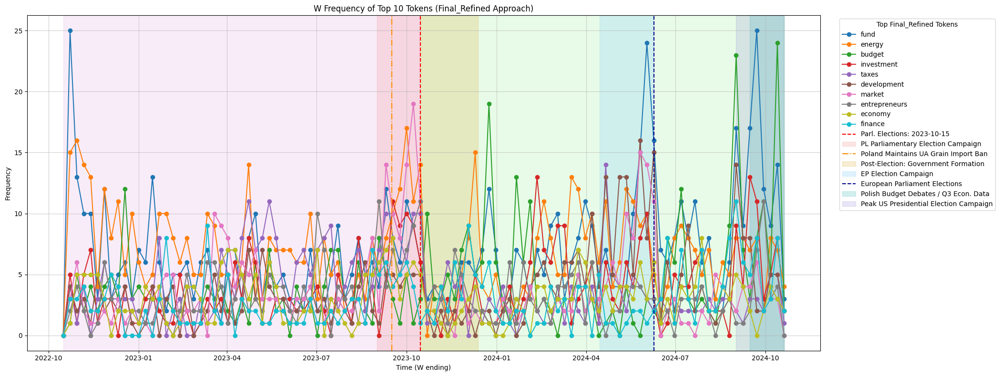

In [66]:
# --- Optional: Generate Top Token Plot ---
# print("\n--- Optional: Plotting Top Token Trends ---")
if 'plot_top_token_timeseries' in locals() and token_col_ts and token_col_ts in df_clean_translated.columns:
    if date_col_ts not in df_clean_translated.columns: print(f"ERROR: Date column '{date_col_ts}' not found.")
    else:
         plot_top_token_timeseries(
            df=df_clean_translated, 
            token_col=token_col_ts, 
            method_name=method_to_analyze,
            top_n=10, freq=time_series_freq, 
            date_col=date_col_ts,
            annotations=annotations_list, 
            show_custom_annotations=show_other_custom_annotations,
            election_date_str=main_election_date_str, 
            show_election_shading=show_pre_post_main_election_shading,
            figsize=(24, 8))


Generating annotated COUNT time series for: Final_Refined Method
Custom annotations: SHOWN.
Election shading: SHOWN.
Processing custom annotations for count plot...


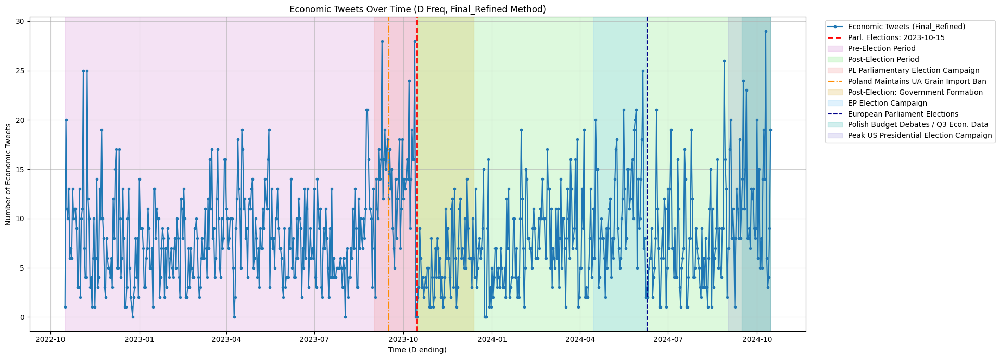

In [67]:
# --- Generate Annotated Plot for Tweet Counts ---
if 'plot_annotated_timeseries' in locals() and flag_col and flag_col in df_clean_translated.columns:
    if date_col_ts not in df_clean_translated.columns: print(f"ERROR: Date column '{date_col_ts}' not found.")
    else:
         plot_annotated_timeseries(
             df=df_clean_translated, 
             flag_col=flag_col, 
             method_name=method_to_analyze,
             annotations=annotations_list, 
             show_custom_annotations=show_other_custom_annotations,
             election_date_str=main_election_date_str, 
             show_election_shading=show_pre_post_main_election_shading,
             freq="D", 
             date_col=date_col_ts,
             figsize=(22, 7) # Optional: Adjust size for daily frequency
             )
elif not ('plot_annotated_timeseries' in locals()): print("ERROR: 'plot_annotated_timeseries' function not defined.")
else: print(f"Skipping annotated plot: Flag column '{flag_col}' missing or method invalid.")



Generating annotated COUNT time series for: Final_Refined Method
Custom annotations: HIDDEN or not provided.
Election shading: HIDDEN or election date not provided.


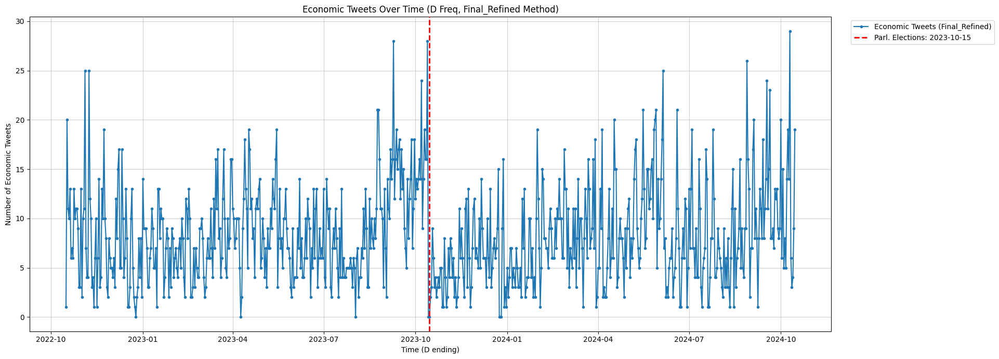

In [68]:
# --- Generate Annotated Plot for Tweet Counts ---
if 'plot_annotated_timeseries' in locals() and flag_col and flag_col in df_clean_translated.columns:
    if date_col_ts not in df_clean_translated.columns: print(f"ERROR: Date column '{date_col_ts}' not found.")
    else:
         plot_annotated_timeseries(
             df=df_clean_translated, 
             flag_col=flag_col, 
             method_name=method_to_analyze,
             annotations=annotations_list, 
             show_custom_annotations= False,
             election_date_str=main_election_date_str, 
             show_election_shading= False,
             freq="D", 
             date_col=date_col_ts,
             figsize=(22, 7) # Optional: Adjust size for daily frequency
             )
elif not ('plot_annotated_timeseries' in locals()): print("ERROR: 'plot_annotated_timeseries' function not defined.")
else: print(f"Skipping annotated plot: Flag column '{flag_col}' missing or method invalid.")



--- 10.C: Time Series Peak Analysis ---
Analyzing peaks for method: 'Final_Refined' using flag 'has_econ_term_FILTERED'
Applying a 12-period (W) rolling average...

Peak analysis (smoothed data): Max smoothed val: 75.92
  Periods with smoothed values >= 68.33 (90% of max):


created_at
2023-09-03    71.833333
2023-09-10    75.916667
2023-09-17    75.500000
2023-09-24    74.833333
2023-10-01    72.916667
2023-10-08    70.916667
2024-05-05    69.500000
2024-09-29    69.800000
2024-10-06    71.666667
2024-10-13    73.750000
2024-10-20    72.571429
Name: has_econ_term_FILTERED, dtype: float64

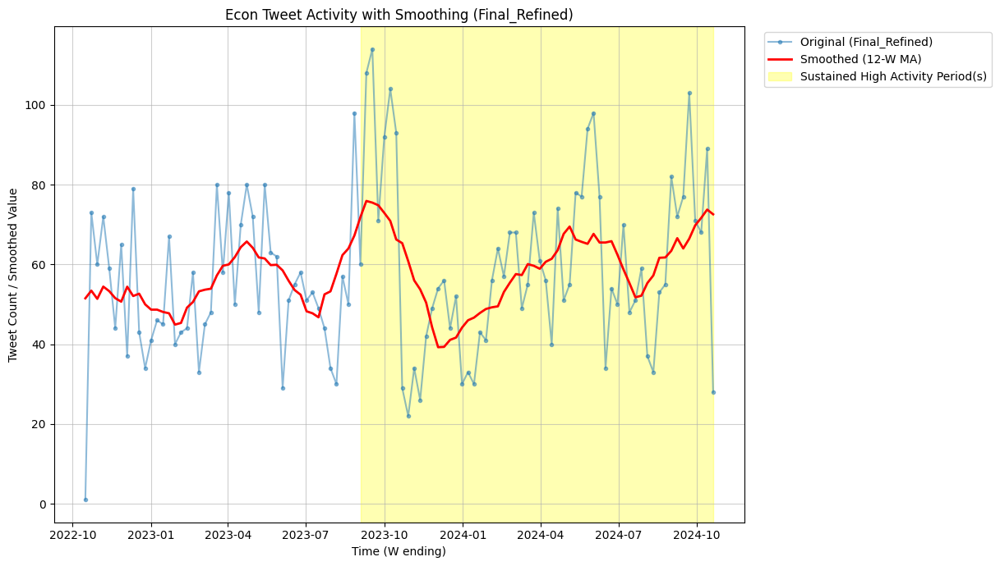


--- Time Series Peak Analysis Complete ---
--------------------------------------------------


In [69]:
# ==============================================================================
# SECTION 10.C: TIME SERIES PEAK ANALYSIS
# ==============================================================================

print("\n" + "="*60)
print("--- 10.C: Time Series Peak Analysis ---")
print("="*60)

run_peak_analysis = False
if 'df_clean_translated' not in globals() or df_clean_translated.empty:
    print("ERROR: 'df_clean_translated' DataFrame not found. Skipping peak analysis.")
elif flag_col is None or flag_col not in df_clean_translated.columns:
    print(f"ERROR: Flag column for method '{method_to_analyze}' ('{flag_col}') not defined or not found. Skipping peak analysis.")
elif date_col_ts not in df_clean_translated.columns:
    print(f"ERROR: Date column '{date_col_ts}' not found. Skipping peak analysis.")
else:
    print(f"Analyzing peaks for method: '{method_to_analyze}' using flag '{flag_col}'")
    df_peak_analysis = df_clean_translated.copy()
    try:
        df_peak_analysis[date_col_ts] = pd.to_datetime(df_peak_analysis[date_col_ts], errors='coerce')
        df_peak_analysis.dropna(subset=[date_col_ts], inplace=True)
        if not df_peak_analysis.empty:
            df_peak_analysis = df_peak_analysis.set_index(date_col_ts).sort_index() # Set index, no drop=False
            if df_peak_analysis.index.tz is not None:
                df_peak_analysis.index = df_peak_analysis.index.tz_convert('UTC').tz_localize(None)
            ts_counts_for_peaks = df_peak_analysis[flag_col].resample(time_series_freq).sum()
            if not ts_counts_for_peaks.empty: run_peak_analysis = True
            else: print("No data after resampling for peak analysis.")
        else: print("No valid date data for peak analysis.")
    except Exception as e: print(f"Error preparing data for peak analysis: {e}")

if run_peak_analysis:
    # --- Smoothing and Peak Detection ---
    if time_series_freq == 'W': smoothing_window = 12
    elif time_series_freq == 'M': smoothing_window = 3
    elif time_series_freq == 'D': smoothing_window = 90
    else: smoothing_window = 12; print(f"Warning: Using default smoothing window for freq '{time_series_freq}'")
    print(f"Applying a {smoothing_window}-period ({time_series_freq}) rolling average...")
    ts_smoothed = ts_counts_for_peaks.rolling(window=smoothing_window, center=True, min_periods=smoothing_window//2).mean().dropna()
    if ts_smoothed.empty: print("Smoothed time series empty.")
    else:
        max_smoothed_value = ts_smoothed.max(); peak_threshold = max_smoothed_value * 0.90
        peak_periods_smoothed = ts_smoothed[ts_smoothed >= peak_threshold]
        print(f"\nPeak analysis (smoothed data): Max smoothed val: {max_smoothed_value:.2f}")
        print(f"  Periods with smoothed values >= {peak_threshold:.2f} (90% of max):")
        if not peak_periods_smoothed.empty:
            try: display(peak_periods_smoothed)
            except NameError: print(peak_periods_smoothed.to_string())
            # --- Visualization of Smoothed Data and Peaks ---
            fig, ax = plt.subplots(figsize=(14, 7))
            ax.plot(ts_counts_for_peaks.index, ts_counts_for_peaks.values, marker='.', linestyle='-', label=f'Original ({method_to_analyze})', alpha=0.5, zorder=5)
            ax.plot(ts_smoothed.index, ts_smoothed.values, linestyle='-', label=f'Smoothed ({smoothing_window}-{time_series_freq} MA)', color='red', lw=2, zorder=10)
            if not peak_periods_smoothed.empty:
                peak_start = peak_periods_smoothed.index.min(); peak_end = peak_periods_smoothed.index.max()
                ax.axvspan(peak_start, peak_end, color='yellow', alpha=0.3, label='Sustained High Activity Period(s)', zorder=1)
            ax.set_title(f'Econ Tweet Activity with Smoothing ({method_to_analyze})'); ax.set_xlabel(f'Time ({time_series_freq} ending)'); ax.set_ylabel('Tweet Count / Smoothed Value')
            ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1)); ax.grid(True, alpha=0.6); plt.tight_layout(rect=[0, 0, 0.88, 1]); plt.show()
        else: print("  No significant peak periods identified in smoothed data.")
else: print("Skipping peak analysis due to earlier errors or no data.")
print("\n--- Time Series Peak Analysis Complete ---")
print("-" * 50)

## SENTIMENT OF ECONOMIC TWEETS USING BERT 

In [57]:
# Option 1: Asks for confirmation (Safer)
# %reset

# Option 2: Forces deletion without confirmation (Use with care!)
%reset -f

# After resetting, it's good practice to run garbage collection
import gc
gc.collect()

print("Namespace reset and garbage collection attempted.")

Namespace reset and garbage collection attempted.


In [58]:
import pandas as pd
import numpy as np
import gc # For garbage collection
import os # For file path operations

# ==============================================================================
# SECTION 11: LOAD OR CREATE/RECREATE df_sentiment_input (with Toggle)
# ==============================================================================
# This section ensures `df_sentiment_input` is available.
# A toggle `force_recreate_sentiment_input_from_full` controls the behavior:
# - If False: Tries to load `df_sentiment_input.parquet`. If fails, proceeds to create it.
# - If True:  Skips loading `df_sentiment_input.parquet` and recreates it from
#             `df_clean_translated` (which is loaded/normalized/checkpointed).

print("\n" + "="*60)
print("--- Section 11: Load or Create/Recreate df_sentiment_input ---")
print("="*60)

# --- Configuration ---
# !!! --- USER TOGGLE --- !!!
# Set to True to force reprocessing of df_clean_translated and recreation of df_sentiment_input
# Set to False to try loading df_sentiment_input.parquet first.
force_recreate_sentiment_input_from_full = False # <<<--- EDIT THIS TOGGLE AS NEEDED

output_dir = 'data/05_final'
full_df_checkpoint_filename = 'df_processed_full_FINAL.parquet'
sentiment_input_filename = 'df_sentiment_input.parquet'

full_output_path = os.path.join(output_dir, full_df_checkpoint_filename)
sentiment_output_path = os.path.join(output_dir, sentiment_input_filename)

df_sentiment_input = None # Initialize

os.makedirs(output_dir, exist_ok=True)
print(f"Output directory for saved files: '{output_dir}'")
print(f"Force recreation of sentiment input from full data: {force_recreate_sentiment_input_from_full}")

# --- Helper function for list normalization (defined once) ---
def normalize_list_column(series_to_normalize):
    """ Ensures each element is a Python list of strings, handles np.ndarray and NaN. """
    def convert_element(x):
        if isinstance(x, np.ndarray): return [str(item) for item in x.tolist()]
        elif isinstance(x, list): return [str(item) for item in x]
        return []
    if not series_to_normalize.empty and series_to_normalize.dropna().empty and not all(isinstance(el, list) for el in series_to_normalize.dropna()):
        return series_to_normalize
    return series_to_normalize.apply(convert_element)

list_cols_for_sentiment_input_normalization = ['matched_keywords_FILTERED', 'extracted_terms_FILTERED']
token_cols_to_normalize_main_df = [
    'matched_exact_econ_words_naive', 'matched_exact_econ_words_regex',
    'matched_exact_econ_words_flashtext', 'matched_exact_econ_words_ac',
    'matched_keywords_ORIG', 'extracted_terms_FILTERED',
    'matched_keywords_FILTERED', 'union_tokens', 'gateway_tokens']

# --- Main Logic ---
if not force_recreate_sentiment_input_from_full and os.path.exists(sentiment_output_path):
    print(f"\n--- 11.A: Attempting to Load Pre-existing 'df_sentiment_input' ---")
    print(f"Found existing '{sentiment_output_path}'.")
    try:
        df_sentiment_input = pd.read_parquet(sentiment_output_path)
        print(f"Successfully loaded 'df_sentiment_input' with shape: {df_sentiment_input.shape}")
        print("\nRe-normalizing list column formats in loaded df_sentiment_input...")
        for col in list_cols_for_sentiment_input_normalization:
            if col in df_sentiment_input.columns:
                print(f"  - Normalizing column: {col}")
                df_sentiment_input[col] = normalize_list_column(df_sentiment_input[col])
        print("List re-normalization complete for loaded df_sentiment_input.")
    except Exception as e:
        print(f"ERROR loading '{sentiment_output_path}': {e}. Will proceed to recreate it.")
        df_sentiment_input = pd.DataFrame() # Ensure it's empty to trigger recreation
else:
    if force_recreate_sentiment_input_from_full:
        print("\nINFO: `force_recreate_sentiment_input_from_full` is True. Will recreate `df_sentiment_input`.")
    else: # File didn't exist
        print(f"INFO: File '{sentiment_output_path}' not found. Will create 'df_sentiment_input'.")
    df_sentiment_input = pd.DataFrame() # Ensure it's marked as empty to trigger creation path

# If df_sentiment_input is still empty (either forced, or load failed, or file not found)
if df_sentiment_input.empty:
    print("\n--- 11.B: Creating/Recreating 'df_sentiment_input' from Source ---")
    df_source_for_sentiment = None
    df_clean_translated_was_loaded_this_run = False

    # Step 1: Ensure df_clean_translated is loaded and normalized
    if 'df_clean_translated' in locals() and isinstance(df_clean_translated, pd.DataFrame) and not df_clean_translated.empty:
        print("Using 'df_clean_translated' from current memory as source.")
        df_source_for_sentiment = df_clean_translated # Use direct reference if already good
        # Assume if it's in memory and we are here, it might need normalization if this is the first time through this path
        print("\nNormalizing token columns in in-memory df_clean_translated...")
        for col in token_cols_to_normalize_main_df:
            if col in df_source_for_sentiment.columns:
                df_source_for_sentiment[col] = normalize_list_column(df_source_for_sentiment[col])
        print("Normalization of in-memory df_clean_translated for checkpointing complete.")
    elif os.path.exists(full_output_path):
        print(f"Loading full processed DataFrame from checkpoint: {full_output_path}")
        try:
            df_source_for_sentiment = pd.read_parquet(full_output_path)
            print(f"Successfully loaded '{full_output_path}' with shape: {df_source_for_sentiment.shape}")
            df_clean_translated_was_loaded_this_run = True # Flag it
            print("\nNormalizing token columns in loaded full DataFrame...")
            for col in token_cols_to_normalize_main_df:
                if col in df_source_for_sentiment.columns:
                     df_source_for_sentiment[col] = normalize_list_column(df_source_for_sentiment[col])
            print("Normalization of loaded full DataFrame complete.")
        except Exception as e: print(f"ERROR loading '{full_output_path}': {e}")
    else:
        print(f"ERROR: 'df_clean_translated' not in memory AND Full checkpoint '{full_output_path}' not found. Cannot create 'df_sentiment_input'.")

    # Step 2: If we have a source, save/update its checkpoint, then create df_sentiment_input
    if df_source_for_sentiment is not None and not df_source_for_sentiment.empty:
        print(f"\nSaving/Updating full normalized checkpoint: {full_output_path}")
        try:
            df_to_save_full = df_source_for_sentiment.copy() # Save the source we are using
            if df_to_save_full.index.name is not None or isinstance(df_to_save_full.index, pd.DatetimeIndex):
                 df_to_save_full.reset_index(drop=False, inplace=True)
            df_to_save_full.to_parquet(full_output_path, index=False)
            print("Save/Update of full DataFrame checkpoint successful.")
            del df_to_save_full
        except Exception as e: print(f"ERROR saving full DataFrame checkpoint: {e}")
        gc.collect()

        # Create df_sentiment_input from df_source_for_sentiment
        print("\nCreating 'df_sentiment_input' by filtering and selecting columns...")
        final_flag_col = 'has_econ_term_FILTERED'
        tweet_id_col_sentiment = 'id'
        text_col_sentiment = 'text_clean_en_demojized'
        essential_columns = [tweet_id_col_sentiment, text_col_sentiment]
        optional_columns_for_sentiment = [
             'created_at', 'party', 'username',
             'matched_keywords_FILTERED', 'extracted_terms_FILTERED']
        required_cols_check = [final_flag_col] + essential_columns
        missing_cols_check = [col for col in required_cols_check if col not in df_source_for_sentiment.columns]

        if missing_cols_check:
            print(f"ERROR: Essential cols missing from source: {missing_cols_check}")
            df_sentiment_input = pd.DataFrame()
        else:
            df_sentiment_input = df_source_for_sentiment[df_source_for_sentiment[final_flag_col] == True].copy()
            print(f"Filtered to {len(df_sentiment_input)} tweets flagged by '{final_flag_col}'.")
            if not df_sentiment_input.empty:
                columns_to_keep = essential_columns[:]
                kept_optional_cols = []
                for col in optional_columns_for_sentiment:
                    if col in df_sentiment_input.columns:
                        if col not in columns_to_keep: columns_to_keep.append(col); kept_optional_cols.append(col)
                if kept_optional_cols: print(f"  + Including optional columns: {kept_optional_cols}")
                final_columns_present = [col for col in columns_to_keep if col in df_sentiment_input.columns]
                if len(final_columns_present) < len(essential_columns):
                     print("ERROR: Not all essential columns present."); df_sentiment_input = pd.DataFrame()
                else:
                     df_sentiment_input = df_sentiment_input[final_columns_present].copy()
                     print(f"\nSelected final columns: {final_columns_present}")
                     print("\nNormalizing list column formats in newly created df_sentiment_input...")
                     for col in list_cols_for_sentiment_input_normalization:
                         if col in df_sentiment_input.columns:
                             df_sentiment_input[col] = normalize_list_column(df_sentiment_input[col])
                     print("List normalization complete for df_sentiment_input.")
                     print(f"Shape of 'df_sentiment_input': {df_sentiment_input.shape}")
                     print("\nSample of newly created 'df_sentiment_input':")
                     try: display(df_sentiment_input.head())
                     except NameError: print(df_sentiment_input.head().to_string())
                     print(f"\nSaving newly created 'df_sentiment_input' to: {sentiment_output_path}")
                     if not df_sentiment_input.empty:
                         try: df_sentiment_input.to_parquet(sentiment_output_path, index=False); print("Save successful.")
                         except Exception as e: print(f"ERROR saving 'df_sentiment_input': {e}")
                     else: print("Skipping save: 'df_sentiment_input' is empty.")
            else: print("No tweets met criteria for 'df_sentiment_input'.")
    else:
        print("ERROR: No source data available to create 'df_sentiment_input'.")
        df_sentiment_input = pd.DataFrame() # Ensure it's empty

# Final status message
print("\n--- Section 11 Complete ---")
if 'df_sentiment_input' in locals() and not df_sentiment_input.empty:
    print(f"   'df_sentiment_input' is ready in memory with {len(df_sentiment_input)} rows.")
    print(f"   It has also been saved to/loaded from '{sentiment_output_path}'.")
else:
    print(f"   WARNING: 'df_sentiment_input' is empty or not properly created/loaded.")
    print(f"            Check for errors in previous steps or file paths.")
print("-" * 50)


--- Section 11: Load or Create/Recreate df_sentiment_input ---
Output directory for saved files: 'data/05_final'
Force recreation of sentiment input from full data: False

--- 11.A: Attempting to Load Pre-existing 'df_sentiment_input' ---
Found existing 'data/05_final\df_sentiment_input.parquet'.
Successfully loaded 'df_sentiment_input' with shape: (6089, 8)

Re-normalizing list column formats in loaded df_sentiment_input...
  - Normalizing column: matched_keywords_FILTERED
  - Normalizing column: extracted_terms_FILTERED
List re-normalization complete for loaded df_sentiment_input.

--- Section 11 Complete ---
   'df_sentiment_input' is ready in memory with 6089 rows.
   It has also been saved to/loaded from 'data/05_final\df_sentiment_input.parquet'.
--------------------------------------------------


In [59]:
df_sentiment_input

,id,text_clean_en_demojized,created_at,party,username,matched_keywords_FILTERED,extracted_terms_FILTERED,text_clean_en
0,1846161400328028160,:cross_mark: We are a year after the election...,2024-10-15 12:09:12+00:00,Konfederacja,bartlomiejpejo,"[crisis, demand]","[crisis, demands]","❌ We are a year after the elections, and Pola..."
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,2024-10-14 07:16:01+00:00,Konfederacja,bartlomiejpejo,[fund],[funded],Poland is soon to launch 49 EU-funded Foreigne...
2,1844415548211245312,Listening to the statement of Deputy Minister ...,2024-10-10 16:31:48+00:00,Konfederacja,bartlomiejpejo,[fund],[funds],Listening to the statement of Deputy Minister ...
3,1843984045073428992,Local government investments are crucial for r...,2024-10-09 11:57:10+00:00,Konfederacja,bartlomiejpejo,[investment],[investments],Local government investments are crucial for r...
4,1843740048350691584,We talked about the trends and challenges of t...,2024-10-08 19:47:37+00:00,Konfederacja,bartlomiejpejo,[market],[market],We talked about the trends and challenges of t...
...,...,...,...,...,...,...,...,...
6084,1622276457975222272,"Dear Minister of Coal and Straw, if you had li...",2023-02-05 16:50:22+00:00,PSL,StefanKrajewski,"[market, import]","[imported, market]","Dear Minister of Coal and Straw, if you had li..."
6085,1621767127660220416,In the majesty of the law and stealing from Po...,2023-02-04 07:06:28+00:00,PSL,StefanKrajewski,"[energy, state-owned companies]","[energy, state-owned companies]",In the majesty of the law and stealing from Po...
6086,1618902451620573184,9th Beef Sector Forum - we met among producers...,2023-01-27 09:23:16+00:00,PSL,StefanKrajewski,[sector],[Sector],9th Beef Sector Forum - we met among producers...
6087,1612071495026483200,The difference is that PKN Orlen has a 49.9...,2023-01-08 12:59:29+00:00,PSL,StefanKrajewski,[treasury],[Treasury],The difference is that PKN Orlen has a 49.9...


In [60]:
df_sentiment_input.columns

Index(['id', 'text_clean_en_demojized', 'created_at', 'party', 'username',
       'matched_keywords_FILTERED', 'extracted_terms_FILTERED',
       'text_clean_en'],
      dtype='object')

In [61]:
# ==============================================================================
# SECTION 11.X: TEXT COLUMN CLEANING (for df_sentiment_input)
# ==============================================================================
# This section applies whitespace cleaning to the text columns within
# df_sentiment_input, which is expected to be loaded or created by Section 11.

print("\n" + "="*60)
print("--- Section 11.X: Text Column Cleaning (for df_sentiment_input) ---")
print("="*60)

import pandas as pd # Should be already imported, but good for standalone section
import re # For text cleaning with regular expressions

# --- Configuration for this cleaning section ---
# These are the text columns within df_sentiment_input that you want to clean.
# These should match the columns you intend to use for sentiment analysis later.
text_cols_to_clean_in_df_sentiment_input = ['text_clean_en', 'text_clean_en_demojized']

# --- Check if df_sentiment_input exists and has data ---
if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    print(f"Found 'df_sentiment_input' with {len(df_sentiment_input)} rows. Proceeding with cleaning.")
    
    # --- Define the text cleaning function (if not already globally defined) ---
    # If you defined clean_text_whitespace globally earlier, you might not need to redefine.
    # For a self-contained block, redefining is safer.
    def clean_text_whitespace_for_series(text_series):
        """Cleans a pandas Series of text strings by normalizing whitespace."""
        def clean_single_string(text):
            if pd.isna(text):
                return text
            text = str(text)
            text = text.strip() # Remove leading/trailing whitespace
            text = re.sub(r'\s+', ' ', text) # Replace multiple spaces with a single space
            return text
        return text_series.apply(clean_single_string)

    # --- Apply cleaning to the specified columns ---
    print("\nApplying whitespace cleaning to text columns in 'df_sentiment_input':")
    cleaned_cols_count = 0
    for col_name in text_cols_to_clean_in_df_sentiment_input:
        if col_name in df_sentiment_input.columns:
            print(f"  - Cleaning column: '{col_name}'")
            # Store a sample before cleaning for comparison (optional)
            # sample_before = df_sentiment_input[col_name].dropna().sample(min(3, len(df_sentiment_input[col_name].dropna()))).tolist()
            
            df_sentiment_input[col_name] = clean_text_whitespace_for_series(df_sentiment_input[col_name])
            cleaned_cols_count += 1
            
            # Optional: Display a sample after cleaning for verification
            # if not df_sentiment_input[col_name].dropna().empty:
            #     print(f"    Sample before: {sample_before}")
            #     sample_after = df_sentiment_input[col_name].dropna().sample(min(3, len(df_sentiment_input[col_name].dropna()))).tolist()
            #     print(f"    Sample after : {sample_after}")
        else:
            print(f"  - WARNING: Column '{col_name}' not found in 'df_sentiment_input'. Skipping cleaning for this column.")
            
    if cleaned_cols_count > 0:
        print("\nWhitespace cleaning of specified text columns in 'df_sentiment_input' complete.")
        print("Sample of 'df_sentiment_input' after text cleaning (first few rows, relevant columns):")
        
        # Display relevant columns, ensuring they exist
        display_cols = [col for col in text_cols_to_clean_in_df_sentiment_input if col in df_sentiment_input.columns]
        if 'id' in df_sentiment_input.columns and 'id' not in display_cols:
            display_cols = ['id'] + display_cols

        if display_cols:
            try:
                display(df_sentiment_input[display_cols].head())
            except NameError: # If 'display' is not available (e.g., not in Jupyter)
                print(df_sentiment_input[display_cols].head().to_string())
        else:
            print("No relevant columns to display in the sample.")

    else:
        print("\nNo text columns were actually cleaned (either not found or list was empty).")

else:
    print("ERROR: 'df_sentiment_input' is not defined, not a DataFrame, or is empty.")
    print("Please ensure Section 11 has run successfully and created/loaded 'df_sentiment_input'.")

print("\n" + "="*60)
print("--- Section 11.X: Text Column Cleaning Complete ---")
print("="*60)


--- Section 11.X: Text Column Cleaning (for df_sentiment_input) ---
Found 'df_sentiment_input' with 6089 rows. Proceeding with cleaning.

Applying whitespace cleaning to text columns in 'df_sentiment_input':
  - Cleaning column: 'text_clean_en'
  - Cleaning column: 'text_clean_en_demojized'

Whitespace cleaning of specified text columns in 'df_sentiment_input' complete.
Sample of 'df_sentiment_input' after text cleaning (first few rows, relevant columns):


,id,text_clean_en,text_clean_en_demojized
0,1846161400328028160,"❌ We are a year after the elections, and Polan...",:cross_mark: We are a year after the elections...
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,Poland is soon to launch 49 EU-funded Foreigne...
2,1844415548211245312,Listening to the statement of Deputy Minister ...,Listening to the statement of Deputy Minister ...
3,1843984045073428992,Local government investments are crucial for r...,Local government investments are crucial for r...
4,1843740048350691584,We talked about the trends and challenges of t...,We talked about the trends and challenges of t...



--- Section 11.X: Text Column Cleaning Complete ---


In [62]:
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    #print(f"Current GPU name: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.7.0+cu126
CUDA available: True
CUDA version: 12.6
Number of GPUs: 1


In [63]:
#pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

In [64]:
df_sentiment_input

,id,text_clean_en_demojized,created_at,party,username,matched_keywords_FILTERED,extracted_terms_FILTERED,text_clean_en
0,1846161400328028160,:cross_mark: We are a year after the elections...,2024-10-15 12:09:12+00:00,Konfederacja,bartlomiejpejo,"[crisis, demand]","[crisis, demands]","❌ We are a year after the elections, and Polan..."
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,2024-10-14 07:16:01+00:00,Konfederacja,bartlomiejpejo,[fund],[funded],Poland is soon to launch 49 EU-funded Foreigne...
2,1844415548211245312,Listening to the statement of Deputy Minister ...,2024-10-10 16:31:48+00:00,Konfederacja,bartlomiejpejo,[fund],[funds],Listening to the statement of Deputy Minister ...
3,1843984045073428992,Local government investments are crucial for r...,2024-10-09 11:57:10+00:00,Konfederacja,bartlomiejpejo,[investment],[investments],Local government investments are crucial for r...
4,1843740048350691584,We talked about the trends and challenges of t...,2024-10-08 19:47:37+00:00,Konfederacja,bartlomiejpejo,[market],[market],We talked about the trends and challenges of t...
...,...,...,...,...,...,...,...,...
6084,1622276457975222272,"Dear Minister of Coal and Straw, if you had li...",2023-02-05 16:50:22+00:00,PSL,StefanKrajewski,"[market, import]","[imported, market]","Dear Minister of Coal and Straw, if you had li..."
6085,1621767127660220416,In the majesty of the law and stealing from Po...,2023-02-04 07:06:28+00:00,PSL,StefanKrajewski,"[energy, state-owned companies]","[energy, state-owned companies]",In the majesty of the law and stealing from Po...
6086,1618902451620573184,9th Beef Sector Forum - we met among producers...,2023-01-27 09:23:16+00:00,PSL,StefanKrajewski,[sector],[Sector],9th Beef Sector Forum - we met among producers...
6087,1612071495026483200,The difference is that PKN Orlen has a 49.9% s...,2023-01-08 12:59:29+00:00,PSL,StefanKrajewski,[treasury],[Treasury],The difference is that PKN Orlen has a 49.9% s...


In [65]:
# === Notebook Cell: AFTER Section 11.X (Save CLEANED Data for Script) ===

print("\n" + "="*60)
print("--- Saving CLEANED df_sentiment_input for External Script ---")
print("="*60)

import os # Ensure os is imported
import pandas as pd # Ensure pandas is imported
import traceback

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    # --- Define NEW Filename for the Script's INPUT ---
    script_input_dir = 'data/05_final' 
    script_input_filename = 'df_sentiment_input_CLEANED.parquet' # Distinct name!
    script_input_path = os.path.join(script_input_dir, script_input_filename)
    
    # Ensure the output directory exists
    os.makedirs(script_input_dir, exist_ok=True)
    
    print(f"Saving CLEANED DataFrame currently in memory (shape {df_sentiment_input.shape}) to:")
    print(f"  '{script_input_path}'") 
    
    try:
        # Save the DataFrame that's currently in memory (which should be cleaned)
        df_sentiment_input.to_parquet(script_input_path, index=False)
        print(f"Successfully saved CLEANED df_sentiment_input for script.")
    except Exception as e:
        print(f"ERROR saving CLEANED df_sentiment_input: {e}")
        traceback.print_exc()
else:
    print("ERROR: Cleaned df_sentiment_input is not available or empty in memory.")
    print("Please ensure Section 11 and Section 11.X (Cleaning) ran successfully.")

print("-" * 50)


--- Saving CLEANED df_sentiment_input for External Script ---
Saving CLEANED DataFrame currently in memory (shape (6089, 8)) to:
  'data/05_final\df_sentiment_input_CLEANED.parquet'
Successfully saved CLEANED df_sentiment_input for script.
--------------------------------------------------


# TESTIGN NEW 

In [66]:
import os 

os.getcwd()

'h:\\000_Projects\\01_GitHub\\05_PythonProjects\\Twitter'

In [67]:
# === Notebook Cell: NEW Section 12.A - Run External Script ===

print("\n" + "="*60)
print("--- Section 12.A: Running External Sentiment Analysis Script ---")
print("="*60)

# Execute the python script. 
# Make sure 'run_sentiment.py' is in the same directory as the notebook.
# The '!' executes this in the system's shell.
print("Executing run_sentiment.py...")
print("This might take some time depending on the data size...")
print("Watch the output below for progress and any errors from the script.")

!python run_sentiment.py 

print("\nScript execution command finished.")
print("(Check the output above for success messages or errors from run_sentiment.py)")

print("\n" + "="*60)
print("--- Section 12.A: External Script Execution Complete ---")
print("="*60)


--- Section 11.Y: Running External Sentiment Analysis Script ---
Executing run_sentiment.py...
This might take some time depending on the data size...
Watch the output below for progress and any errors from the script.
Running sentiment analysis script...
Loading input data from: data/05_final\df_sentiment_input_CLEANED.parquet
Loaded 6089 rows.

--- Setting up Sentiment Analysis Pipelines (Manual Loading) ---
Using device: cuda:0

Loading components for: 'cardiffnlp/twitter-roberta-base-sentiment-latest'
 -> Pipeline created for 'cardiffnlp/twitter-roberta-base-sentiment-latest'.

Loading components for: 'ProsusAI/finbert'
 -> Pipeline created for 'ProsusAI/finbert'.
Successfully created 2 pipeline(s).
--------------------------------------------------

--- Applying Sentiment Analysis Pipelines ---
Processing 6089 tweets.
Using batch size: 32

Processing Text Column: 'text_clean_en'
  Running pipeline: 'cardiffnlp/twitter-roberta-base-sentiment-latest'...
  Finished 'cardiffnlp/twitt

2025-05-08 20:10:56.590517: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-08 20:10:57.723182: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequence

In [68]:
# === Notebook Cell: NEW Section 12.B - Load Script Results ===

print("\n" + "="*60)
print("--- Section 11.Z: Loading Results from External Script ---")
print("="*60)

import pandas as pd
import os 
import traceback

# --- Define path to the script's output file ---
script_output_dir = 'data/05_final'
# *** IMPORTANT: Use the correct filename based on run_sentiment.py's output ***
# script_output_filename = 'df_sentiment_results.parquet' # If you use Option B
script_output_filename = 'df_sentiment_results.parquet' # If you fix the script (Option A - Recommended)
# ---
script_output_path = os.path.join(script_output_dir, script_output_filename)

print(f"Attempting to load sentiment results from: {script_output_path}")

try:
    # Load the results from the script's output file
    df_with_sentiment = pd.read_parquet(script_output_path)
    print(f"Successfully loaded results. Shape: {df_with_sentiment.shape}")

    # Overwrite the notebook's variable with the results
    # This variable now contains the original data PLUS all the new sentiment columns
    df_sentiment_input = df_with_sentiment  
    print("'df_sentiment_input' variable now holds the data with sentiment results.")

    print("\nSample of loaded data with sentiment results:")
    try:
        display(df_sentiment_input.head()) # Use display in Jupyter
    except NameError:
        print(df_sentiment_input.head().to_string()) # Fallback for non-Jupyter

except FileNotFoundError:
    print(f"ERROR: File not found -> {script_output_path}")
    print("Please ensure 'run_sentiment.py' executed successfully in the previous step ('Section 11.Y') and created this output file.")
    print("Double-check the OUTPUT FILENAME used here matches the file saved by the script.")
except Exception as e:
    print(f"ERROR loading results from {script_output_path}: {e}")
    traceback.print_exc()

print("\n" + "="*60)
print("--- Section 12.B: Result Loading Complete ---")
print("="*60)


--- Section 11.Z: Loading Results from External Script ---
Attempting to load sentiment results from: data/05_final\df_sentiment_results.parquet
Successfully loaded results. Shape: (6089, 28)
'df_sentiment_input' variable now holds the data with sentiment results.

Sample of loaded data with sentiment results:


,id,text_clean_en_demojized,created_at,party,username,matched_keywords_FILTERED,extracted_terms_FILTERED,text_clean_en,sentiment_cardiffnlp_emoji_label,sentiment_cardiffnlp_emoji_score_best,...,sentiment_cardiffnlp_demoji_label,sentiment_cardiffnlp_demoji_score_best,sentiment_cardiffnlp_demoji_score_neg,sentiment_cardiffnlp_demoji_score_neu,sentiment_cardiffnlp_demoji_score_pos,sentiment_finbert_demoji_label,sentiment_finbert_demoji_score_best,sentiment_finbert_demoji_score_neg,sentiment_finbert_demoji_score_neu,sentiment_finbert_demoji_score_pos
0,1846161400328028160,:cross_mark: We are a year after the elections...,2024-10-15 12:09:12+00:00,Konfederacja,bartlomiejpejo,"[crisis, demand]","[crisis, demands]","❌ We are a year after the elections, and Polan...",Negative,0.803830,...,Negative,0.816410,0.816410,0.174771,0.008819,Neutral,0.785302,0.041167,0.785302,0.173532
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,2024-10-14 07:16:01+00:00,Konfederacja,bartlomiejpejo,[fund],[funded],Poland is soon to launch 49 EU-funded Foreigne...,Neutral,0.716946,...,Neutral,0.716946,0.006587,0.716946,0.276467,Neutral,0.711673,0.014701,0.711673,0.273627
2,1844415548211245312,Listening to the statement of Deputy Minister ...,2024-10-10 16:31:48+00:00,Konfederacja,bartlomiejpejo,[fund],[funds],Listening to the statement of Deputy Minister ...,Neutral,0.646243,...,Neutral,0.646243,0.333890,0.646243,0.019867,Neutral,0.813761,0.023739,0.813761,0.162500
3,1843984045073428992,Local government investments are crucial for r...,2024-10-09 11:57:10+00:00,Konfederacja,bartlomiejpejo,[investment],[investments],Local government investments are crucial for r...,Neutral,0.545010,...,Neutral,0.545010,0.363077,0.545010,0.091912,Neutral,0.434723,0.266388,0.434723,0.298889
4,1843740048350691584,We talked about the trends and challenges of t...,2024-10-08 19:47:37+00:00,Konfederacja,bartlomiejpejo,[market],[market],We talked about the trends and challenges of t...,Positive,0.787233,...,Positive,0.787233,0.003708,0.209059,0.787233,Neutral,0.799829,0.011726,0.799829,0.188445



--- Section 12.B: Result Loading Complete ---


In [71]:
# === Notebook Cell: Convert String Representation to List (Minimal Regex) ===

import pandas as pd
import re
import numpy as np # Still needed for np.ndarray check

print("\n" + "="*60)
print("--- Converting String Representations to Actual Lists (Minimal) ---")
print("="*60)

def extract_quoted_items(value):
    """
    Specifically targets strings like "['item1' 'item2']" using regex.
    Handles actual lists, numpy arrays, and NaN safely.
    Returns a list of strings.
    """
    # 1. Handle existing lists first
    if isinstance(value, list):
        return [str(item) for item in value]
        
    # 2. Handle numpy arrays explicitly
    if isinstance(value, np.ndarray):
        return [str(item) for item in value.tolist()]
        
    # 3. Handle NaN/None
    if pd.isna(value):
        return [] 
        
    # 4. Process strings - Target the specific format
    if isinstance(value, str):
        # Use regex to find all non-empty sequences inside single quotes
        items = re.findall(r"'(.*?)'", value) 
        # Filter out potentially empty captures like '' that regex might match
        return [item for item in items if item] 
    
    # 5. For any other type, return empty list
    return []

# --- Columns to apply the conversion ---
columns_to_convert = ['extracted_terms_FILTERED', 'matched_keywords_FILTERED']

# --- Apply the function (assuming df_sentiment_input exists) ---
if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame):
    print("Applying focused list conversion...")
    for col in columns_to_convert:
        if col in df_sentiment_input.columns:
            print(f" - Converting column: {col}")
            # Apply the new focused function
            df_sentiment_input[col] = df_sentiment_input[col].apply(extract_quoted_items) 
        else:
            print(f" - WARNING: Column '{col}' not found.")
            
    print("Focused list conversion attempt complete.")
    
    # Minimal verification (optional, comment out if needed)
    print("\nSample after conversion:")
    cols_to_show = [c for c in columns_to_convert if c in df_sentiment_input.columns]
    if cols_to_show:
        try:
            display(df_sentiment_input[cols_to_show].head())
        except NameError:
            print(df_sentiment_input[cols_to_show].head().to_string())
            
else:
    print("ERROR: df_sentiment_input DataFrame not found or invalid.")
    
print("\n" + "="*60)
print("--- List Conversion Complete ---")
print("="*60)


--- Converting String Representations to Actual Lists (Minimal) ---
Applying focused list conversion...
 - Converting column: extracted_terms_FILTERED
 - Converting column: matched_keywords_FILTERED
Focused list conversion attempt complete.

Sample after conversion:


,extracted_terms_FILTERED,matched_keywords_FILTERED
0,"[crisis, demands]","[crisis, demand]"
1,[funded],[fund]
2,[funds],[fund]
3,[investments],[investment]
4,[market],[market]



--- List Conversion Complete ---


# VISUALIZATIONS 

1. Value Counts for Each Sentiment Label Column

This gives you a quick overview of the distribution (Positive/Negative/Neutral/Other/Error) predicted by each of the 4 runs.

In [72]:
# === Notebook Cell: Analyze Value Counts (All 4 Runs) ===
import pandas as pd 

print("\n" + "="*60)
print("--- Analyzing Value Counts for All Sentiment Predictions ---")
print("="*60)

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    # Define all 4 label columns generated by Section 12.B
    label_columns_generated = [
        'sentiment_cardiffnlp_emoji_label', 'sentiment_cardiffnlp_demoji_label',
        'sentiment_finbert_emoji_label',  'sentiment_finbert_demoji_label'
    ]
    
    found_label_cols = []
    all_cols_found = True
    for col in label_columns_generated:
        if col in df_sentiment_input.columns:
            print(f"\n--- Value Counts for: {col} ---")
            # Display counts including missing values (NaN) if any
            print(df_sentiment_input[col].value_counts(dropna=False)) 
            found_label_cols.append(col)
        else:
            print(f"\nWARNING: Label column '{col}' not found in DataFrame.")
            all_cols_found = False
            
    if not found_label_cols:
         print("\nERROR: No sentiment label columns found to analyze.")
    elif not all_cols_found:
         print("\nWARNING: Not all expected sentiment label columns were found.")
         
else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- Value Count Analysis Complete ---")
print("="*60)


--- Analyzing Value Counts for All Sentiment Predictions ---

--- Value Counts for: sentiment_cardiffnlp_emoji_label ---
sentiment_cardiffnlp_emoji_label
Negative    2156
Neutral     2148
Positive    1785
Name: count, dtype: int64

--- Value Counts for: sentiment_cardiffnlp_demoji_label ---
sentiment_cardiffnlp_demoji_label
Negative    2217
Neutral     2204
Positive    1668
Name: count, dtype: int64

--- Value Counts for: sentiment_finbert_emoji_label ---
sentiment_finbert_emoji_label
Neutral     4500
Negative    1020
Positive     569
Name: count, dtype: int64

--- Value Counts for: sentiment_finbert_demoji_label ---
sentiment_finbert_demoji_label
Neutral     4548
Negative    1030
Positive     511
Name: count, dtype: int64

--- Value Count Analysis Complete ---


2. Compare Predictions (Agreement/Disagreement)

Let's show comparisons for both the demoji versions and the emoji versions.

In [73]:
# === Notebook Cell: Compare Predictions ===
import pandas as pd
import numpy as np 

print("\n" + "="*60)
print("--- Comparing Model Predictions (Crosstabs - Markdown Output) ---")
print("="*60)

# Make sure tabulate is installed for markdown output: pip install tabulate
try:
    import tabulate
    markdown_possible = True
except ImportError:
    print("INFO: 'tabulate' package not found. Plain text output will be used.")
    print("      Install using: pip install tabulate")
    markdown_possible = False

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    
    comparison_pairs = [
        ('sentiment_cardiffnlp_demoji_label', 'sentiment_finbert_demoji_label'),
        ('sentiment_cardiffnlp_emoji_label',  'sentiment_finbert_emoji_label'),
        ('sentiment_cardiffnlp_emoji_label',  'sentiment_cardiffnlp_demoji_label'), # Cardiff emoji vs demoji
        ('sentiment_finbert_emoji_label',   'sentiment_finbert_demoji_label')  # Finbert emoji vs demoji
    ]

    for col1, col2 in comparison_pairs:
        print(f"\n--- Comparison: '{col1}' (Rows) vs '{col2}' (Columns) ---")
        if col1 in df_sentiment_input.columns and col2 in df_sentiment_input.columns:
            
            crosstab_results = pd.crosstab(df_sentiment_input[col1], df_sentiment_input[col2], dropna=False)
            
            # --- Print Markdown Version Only (or fallback) ---
            print("\n") # Add a newline for spacing before the table
            if markdown_possible:
                # Print the markdown table directly
                print(crosstab_results.to_markdown()) 
            else:
                # Fallback to plain text if tabulate is missing
                print(crosstab_results.to_string())
            # --- End Markdown Only ---
                
            # Calculate direct agreement
            agreement_direct = (df_sentiment_input[col1] == df_sentiment_input[col2]).sum()
            total_tweets_comp = len(df_sentiment_input) 
            if total_tweets_comp > 0:
                 print(f"\n  Direct agreement count: {agreement_direct} out of {total_tweets_comp}")
                 print(f"  Direct agreement percentage: {agreement_direct / total_tweets_comp * 100:.2f}%")
            else:
                 print("  Cannot calculate agreement percentage (no tweets).")
        else:
            print(f"  ERROR: One or both columns ('{col1}', '{col2}') not found for comparison.")
        print("-" * 40)

else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- Prediction Comparison Complete ---")
print("="*60)


--- Comparing Model Predictions (Crosstabs - Markdown Output) ---

--- Comparison: 'sentiment_cardiffnlp_demoji_label' (Rows) vs 'sentiment_finbert_demoji_label' (Columns) ---


| sentiment_cardiffnlp_demoji_label   |   Negative |   Neutral |   Positive |
|:------------------------------------|-----------:|----------:|-----------:|
| Negative                            |        906 |      1286 |         25 |
| Neutral                             |        107 |      1982 |        115 |
| Positive                            |         17 |      1280 |        371 |

  Direct agreement count: 3259 out of 6089
  Direct agreement percentage: 53.52%
----------------------------------------

--- Comparison: 'sentiment_cardiffnlp_emoji_label' (Rows) vs 'sentiment_finbert_emoji_label' (Columns) ---


| sentiment_cardiffnlp_emoji_label   |   Negative |   Neutral |   Positive |
|:-----------------------------------|-----------:|----------:|-----------:|
| Negative                           |      

they do differ quite a lot but we will probably go on with cardiffnlp

3.A. Analyze Score Distributions

This generates the plot type you requested: one plot per model run, showing overlaid distributions for Positive (Green), Negative (Red), and Neutral (Grey) scores.


--- Analyzing Score Distributions (Highlighting Chosen Model) ---


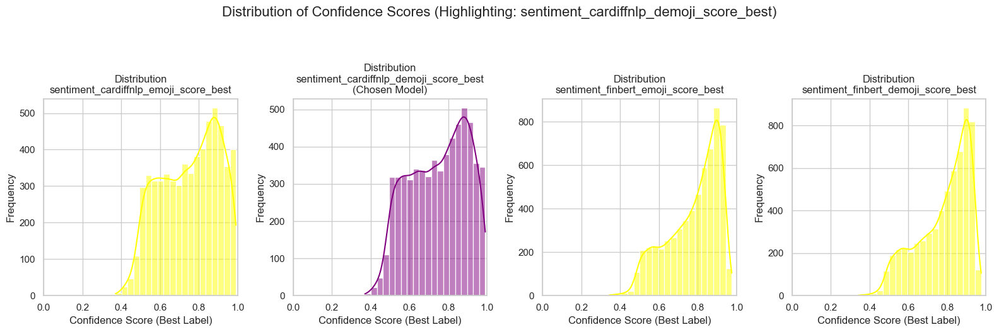


--- Score Distribution Analysis Complete ---


In [77]:
# === Notebook Cell: Analyze Score Distributions (Highlight Chosen Model) ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback # Ensure traceback is imported

print("\n" + "="*60)
print("--- Analyzing Score Distributions (Highlighting Chosen Model) ---")
print("="*60)

# --- Configuration ---
# *** Specify the exact score column you want to highlight ***
highlight_score_col = 'sentiment_cardiffnlp_demoji_score_best' 
highlight_color = 'purple' # Color for the highlighted plot
other_color = 'yellow'     # Color for the other plots
# ---

# Use a consistent style for plots
sns.set(style="whitegrid")

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    # List all the 'best score' columns generated
    score_columns_generated = [
        'sentiment_cardiffnlp_emoji_score_best', 'sentiment_cardiffnlp_demoji_score_best',
        'sentiment_finbert_emoji_score_best',  'sentiment_finbert_demoji_score_best'
    ]

    found_score_cols = [col for col in score_columns_generated if col in df_sentiment_input.columns]

    if highlight_score_col not in found_score_cols:
         print(f"WARNING: Specified highlight column '{highlight_score_col}' not found in DataFrame. No plot will be highlighted.")
         # Reset highlight_score_col to avoid errors later if needed, or handle appropriately
         # highlight_score_col = None # Option 1: Disable highlighting
         
    if found_score_cols:
        num_cols_to_plot = len(found_score_cols)
        plt.figure(figsize=(max(12, num_cols_to_plot * 4), 5)) 

        for i, col in enumerate(found_score_cols):
            plt.subplot(1, num_cols_to_plot, i + 1) 
            data_to_plot = df_sentiment_input[col].dropna()
            
            # --- Determine plot color ---
            plot_color = highlight_color if col == highlight_score_col else other_color
            plot_title = f'Distribution\n{col}'
            if col == highlight_score_col:
                 plot_title += "\n(Chosen Model)" # Add indicator to title
            # ---
                 
            if not data_to_plot.empty:
                 sns.histplot(data_to_plot, kde=True, bins=20, color=plot_color) # Use determined color
                 plt.title(plot_title)
                 plt.xlabel('Confidence Score (Best Label)')
                 plt.ylabel('Frequency')
            else:
                 plt.title(f'{col}\n(No data)')
                 plt.xlabel('Confidence Score (Best Label)')
            plt.xlim(0, 1) 

        plt.suptitle(f'Distribution of Confidence Scores (Highlighting: {highlight_score_col})', fontsize=16, y=1.05) # Adjusted y for potentially longer titles
        plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust layout 
        plt.show()
        
    else:
        print("ERROR: No 'score_best' columns found to analyze.")
else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- Score Distribution Analysis Complete ---")
print("="*60)


--- Analyzing P/N/N Score Distributions per Run ---

Plotting distributions for: sentiment_cardiffnlp_emoji

Plotting distributions for: sentiment_cardiffnlp_demoji

Plotting distributions for: sentiment_finbert_emoji

Plotting distributions for: sentiment_finbert_demoji


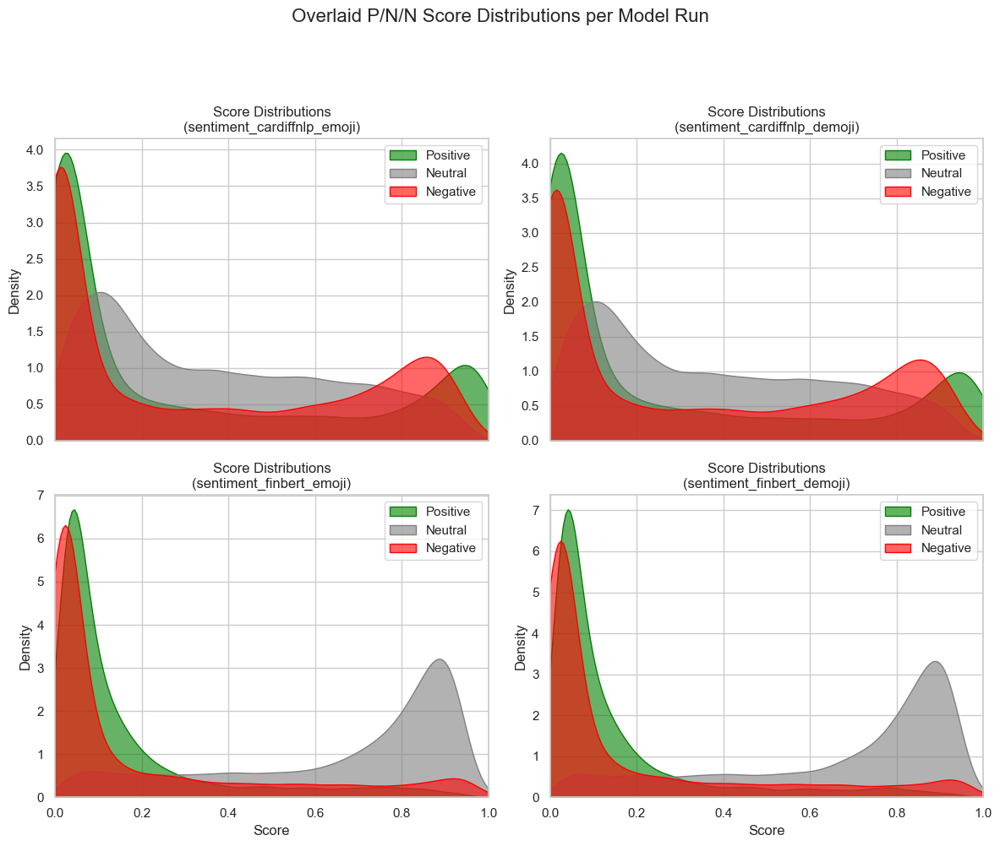


--- P/N/N Score Distribution Analysis Complete ---


In [35]:
# === Notebook Cell: Analyze P/N/N Score Distributions per Run ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n" + "="*60)
print("--- Analyzing P/N/N Score Distributions per Run ---")
print("="*60)

# Use a consistent style for plots
sns.set(style="whitegrid")

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    
    # Define the base names for the 4 runs
    run_bases = [
        'sentiment_cardiffnlp_emoji', 'sentiment_cardiffnlp_demoji',
        'sentiment_finbert_emoji',  'sentiment_finbert_demoji'
    ]
    
    # Define colors
    color_map = {'pos': 'green', 'neu': 'grey', 'neg': 'red'}
    label_map = {'pos': 'Positive', 'neu': 'Neutral', 'neg': 'Negative'}
    
    # Check if any relevant columns exist
    score_cols_exist = False
    for base in run_bases:
        if f"{base}_score_pos" in df_sentiment_input.columns:
             score_cols_exist = True
             break
             
    if score_cols_exist:
        num_runs = len(run_bases)
        # Create subplots (e.g., 2x2 grid)
        fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=False) # Adjust figsize if needed
        axes = axes.flatten() # Flatten the 2x2 array for easy iteration

        plot_idx = 0
        for run_base_name in run_bases:
            ax = axes[plot_idx]
            found_data_for_plot = False
            
            print(f"\nPlotting distributions for: {run_base_name}") 
            
            # Construct column names for this run
            pos_col = f"{run_base_name}_score_pos"
            neu_col = f"{run_base_name}_score_neu"
            neg_col = f"{run_base_name}_score_neg"
            
            # Plot KDE for each sentiment if column exists
            for sentiment_suffix, col_name in [('pos', pos_col), ('neu', neu_col), ('neg', neg_col)]:
                if col_name in df_sentiment_input.columns:
                    data_to_plot = df_sentiment_input[col_name].dropna()
                    if not data_to_plot.empty:
                        sns.kdeplot(data=data_to_plot, 
                                    ax=ax, 
                                    color=color_map[sentiment_suffix], 
                                    label=label_map[sentiment_suffix], 
                                    alpha=0.6,  # Opacity
                                    fill=True,  # Fill under the curve
                                    bw_adjust=0.75) # Adjust bandwidth smoothing if needed
                        found_data_for_plot = True
                    else:
                         print(f"  - No data for {col_name}")
                else:
                     print(f"  - Column {col_name} not found.")

            if found_data_for_plot:
                 ax.set_title(f"Score Distributions\n({run_base_name})")
                 ax.set_xlabel("Score")
                 ax.set_ylabel("Density")
                 ax.legend()
                 ax.set_xlim(0, 1) # Scores are between 0 and 1
            else:
                 ax.set_title(f"Score Distributions\n({run_base_name} - No Data Found)")
                 ax.set_xlabel("Score")
            
            plot_idx += 1

        # Hide any unused subplots if num_runs < 4
        for i in range(plot_idx, len(axes)):
             fig.delaxes(axes[i])

        plt.suptitle('Overlaid P/N/N Score Distributions per Model Run', fontsize=16, y=1.03)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust layout
        plt.show()

    else:
        print("ERROR: No individual score columns (e.g., '..._score_pos') found to analyze.")
else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- P/N/N Score Distribution Analysis Complete ---")
print("="*60)

This version will create one plot for each of the 4 model runs. Within each plot, it will show the distribution of the best confidence score (_score_best) achieved for each tweet, colored by the label that was actually predicted (Positive=Green, Negative=Red, Neutral=Grey). This helps visualize how confident the model tends to be for each type of prediction it makes.


--- Analyzing Best Score Distribution by Predicted Label ---

Plotting distributions for: sentiment_cardiffnlp_emoji

Plotting distributions for: sentiment_cardiffnlp_demoji


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\1482522971.py:70: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(title='Predicted Label')
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\1482522971.py:70: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(title='Predicted Label')
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\1482522971.py:70: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(title='Predicted Label')



Plotting distributions for: sentiment_finbert_emoji

Plotting distributions for: sentiment_finbert_demoji


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\1482522971.py:70: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(title='Predicted Label')


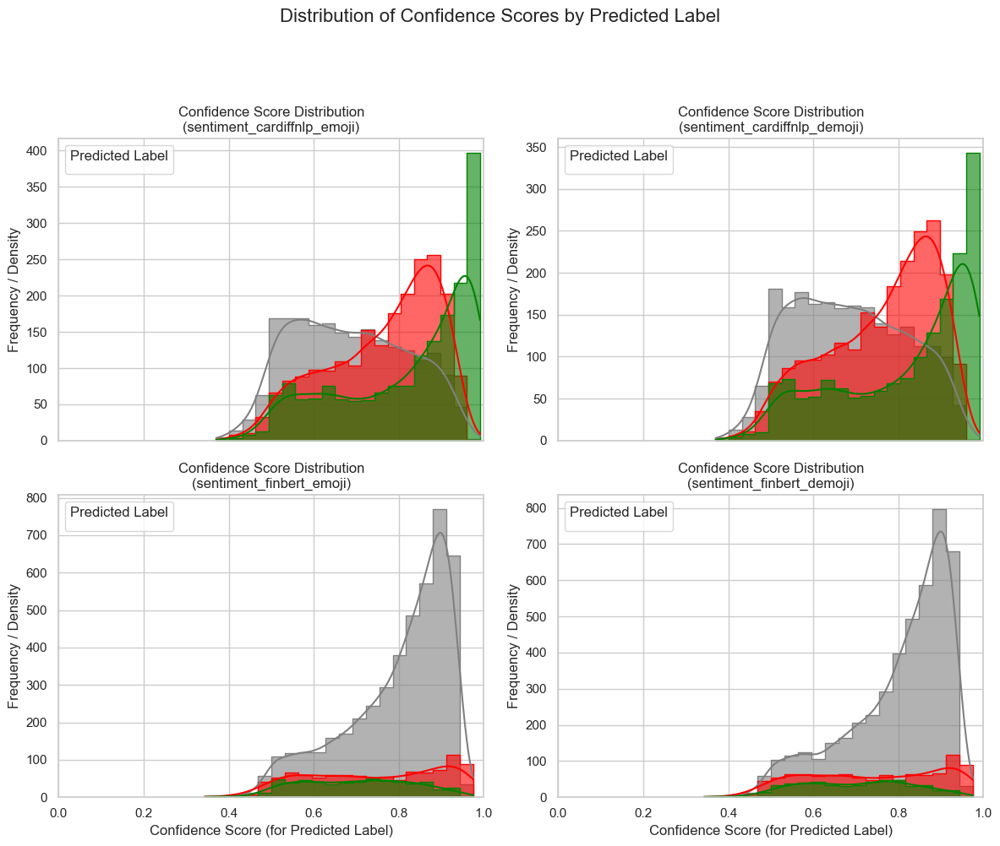


--- Best Score Distribution Analysis Complete ---


In [78]:
# === Notebook Cell: Analyze Best Score Distribution by Predicted Label ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # Import numpy

print("\n" + "="*60)
print("--- Analyzing Best Score Distribution by Predicted Label ---")
print("="*60)

# Use a consistent style for plots
sns.set(style="whitegrid")

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    
    # Define the base names for the 4 runs
    run_bases = [
        'sentiment_cardiffnlp_emoji', 'sentiment_cardiffnlp_demoji',
        'sentiment_finbert_emoji',  'sentiment_finbert_demoji'
    ]
    
    # Define colors and ensure order matches labels for consistent plotting
    palette_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey', 'Other': 'blue', 'ERROR': 'orange'}
    label_order = ['Positive', 'Negative', 'Neutral', 'Other', 'ERROR'] # Define order for legend consistency
    
    # Check if any relevant columns exist
    cols_exist = False
    for base in run_bases:
        if f"{base}_label" in df_sentiment_input.columns and f"{base}_score_best" in df_sentiment_input.columns:
             cols_exist = True
             break
             
    if cols_exist:
        num_runs = len(run_bases)
        # Create subplots (e.g., 2x2 grid)
        fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=False) 
        axes = axes.flatten() # Flatten for easy iteration

        plot_idx = 0
        for run_base_name in run_bases:
            ax = axes[plot_idx]
            print(f"\nPlotting distributions for: {run_base_name}") 
            
            # Construct column names for this run
            label_col = f"{run_base_name}_label"
            score_col = f"{run_base_name}_score_best"
            
            # Check if both required columns exist for this run
            if label_col in df_sentiment_input.columns and score_col in df_sentiment_input.columns:
                
                # Filter out potential NaN values in label or score before plotting
                plot_data = df_sentiment_input[[label_col, score_col]].dropna()

                if not plot_data.empty:
                    # Create the histogram/density plot, colored by the predicted label
                    sns.histplot(data=plot_data, 
                                 x=score_col, 
                                 hue=label_col, 
                                 hue_order=label_order, # Ensure consistent color order
                                 palette=palette_colors, # Apply custom colors
                                 kde=True, # Add density curve
                                 alpha=0.6, 
                                 ax=ax,
                                 element="step", # Use steps instead of bars for potentially clearer overlap
                                 bins=20) # Adjust bins as needed
                                 
                    ax.set_title(f"Confidence Score Distribution\n({run_base_name})")
                    ax.set_xlabel("Confidence Score (for Predicted Label)")
                    ax.set_ylabel("Frequency / Density")
                    ax.legend(title='Predicted Label')
                    ax.set_xlim(0, 1) 
                else:
                    print(f"  - No valid data (label/score pairs) found for {run_base_name}")
                    ax.set_title(f"Confidence Score Distribution\n({run_base_name} - No Data)")
                    ax.set_xlabel("Confidence Score (for Predicted Label)")
                    ax.set_xlim(0, 1) 
            else:
                 print(f"  - Missing required columns ({label_col} or {score_col}) for {run_base_name}")
                 ax.set_title(f"Confidence Score Distribution\n({run_base_name} - Missing Cols)")
                 ax.set_xlabel("Confidence Score (for Predicted Label)")
                 ax.set_xlim(0, 1) 
            
            plot_idx += 1

        # Hide any unused subplots if num_runs < 4
        for i in range(plot_idx, len(axes)):
             fig.delaxes(axes[i])

        plt.suptitle('Distribution of Confidence Scores by Predicted Label', fontsize=16, y=1.03)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97]) 
        plt.show()

    else:
        print("ERROR: No label/score_best column pairs found to analyze.")
else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- Best Score Distribution Analysis Complete ---")
print("="*60)


--- Analyzing Score Distribution for Chosen Model ---
Plotting score distribution for chosen run: sentiment_cardiffnlp_demoji


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\2743419556.py:71: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(handles=handles, labels=labels, title='Predicted Label')


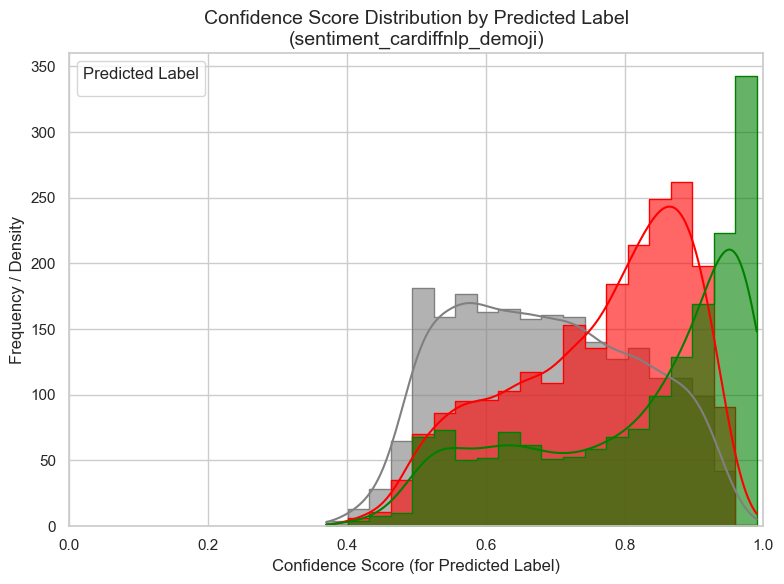


--- Chosen Model Score Distribution Analysis Complete ---


In [79]:
# === Notebook Cell: Analyze Score Distribution for CHOSEN Model ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # Import numpy
import traceback # Import traceback

print("\n" + "="*60)
print("--- Analyzing Score Distribution for Chosen Model ---")
print("="*60)

# --- Configuration ---
# *** Specify the EXACT base name for the chosen model run ***
chosen_run_base = 'sentiment_cardiffnlp_demoji' 
# ---

# Define colors and label order
# Ensure keys match the actual labels present in your data column
palette_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey', 'Other': 'blue', 'ERROR': 'orange'}
# Define preferred order for the legend
label_order = ['Positive', 'Negative', 'Neutral', 'Other', 'ERROR'] 

# Use a consistent style for plots
sns.set(style="whitegrid")

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    
    # Construct column names for the chosen run
    label_col = f"{chosen_run_base}_label"
    score_col = f"{chosen_run_base}_score_best"
            
    # Check if both required columns exist for the chosen run
    if label_col in df_sentiment_input.columns and score_col in df_sentiment_input.columns:
        
        print(f"Plotting score distribution for chosen run: {chosen_run_base}") 
        
        # Filter out potential NaN values in label or score before plotting
        plot_data = df_sentiment_input[[label_col, score_col]].dropna()

        if not plot_data.empty:
            # Get the actual unique labels present in this data subset for legend accuracy
            actual_labels_present = plot_data[label_col].unique()
            # Filter the predefined order and palette based on actual labels
            actual_hue_order = [lbl for lbl in label_order if lbl in actual_labels_present]
            actual_palette = {lbl: col for lbl, col in palette_colors.items() if lbl in actual_labels_present}

            # --- Create a SINGLE plot ---
            plt.figure(figsize=(8, 6)) # Size for a single plot
            ax = plt.gca() # Get current axes
            
            # Create the histogram/density plot, colored by the predicted label
            sns.histplot(data=plot_data, 
                         x=score_col, 
                         hue=label_col, 
                         hue_order=actual_hue_order, # Use filtered order
                         palette=actual_palette,   # Use filtered palette
                         kde=True, 
                         alpha=0.6, 
                         ax=ax,
                         element="step", 
                         bins=20) 
                         
            ax.set_title(f"Confidence Score Distribution by Predicted Label\n({chosen_run_base})", fontsize=14)
            ax.set_xlabel("Confidence Score (for Predicted Label)")
            ax.set_ylabel("Frequency / Density")
            
            # Add legend only if there are multiple hues present
            if len(actual_labels_present) > 1:
                 handles, labels = ax.get_legend_handles_labels()
                 # Create legend with only the labels/handles that were actually plotted
                 ax.legend(handles=handles, labels=labels, title='Predicted Label')
            elif len(actual_labels_present) == 1: # If only one label type exists
                 ax.legend([actual_labels_present[0]], title='Predicted Label')


            ax.set_xlim(0, 1) 
            plt.tight_layout() 
            plt.show()
            
        else:
            print(f"  - No valid data (label/score pairs) found for {chosen_run_base} after dropping NaNs.")

    else:
         print(f"ERROR: Missing required columns '{label_col}' or '{score_col}' for the chosen run.")
         
else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- Chosen Model Score Distribution Analysis Complete ---")
print("="*60)

4. Examine Specific Disagreement Examples

Filter the DataFrame to see the actual tweets where models strongly disagree. Reading these is often the most insightful step.

In [81]:
# === Notebook Cell: Examine Disagreements ===
import pandas as pd

print("\n" + "="*60)
print("--- Examining Disagreement Examples (P vs N, Demoji) ---")
print("="*60)

# Example: Where CardiffNLP (demoji) and FinBERT (demoji) disagree Pos/Neg
col1 = 'sentiment_cardiffnlp_demoji_label'
col2 = 'sentiment_finbert_demoji_label'
text_col = 'text_clean_en_demojized' # Text column to display

if 'df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty:
    if all(c in df_sentiment_input.columns for c in [col1, col2, text_col]):
        
        # Filter for rows where one is Positive and the other is Negative
        disagreements = df_sentiment_input[
            ((df_sentiment_input[col1] == 'Positive') & (df_sentiment_input[col2] == 'Negative')) |
            ((df_sentiment_input[col1] == 'Negative') & (df_sentiment_input[col2] == 'Positive'))
        ].copy() # Use .copy() is good practice when filtering then potentially adding columns
        
        print(f"Found {len(disagreements)} tweets where '{col1}' and '{col2}' gave opposite Positive/Negative labels.")
        
        if not disagreements.empty:
            print("\nSample of Strong Disagreements:")
            
            # Prepare columns to display, including scores
            score_col1 = col1.replace('_label','_score_best')
            score_col2 = col2.replace('_label','_score_best')
            
            display_cols_base = [text_col, col1, score_col1, col2, score_col2]
            # Add individual P/N/N scores for more context if needed
            # display_cols_extra = [ f"{c.replace('_label','_score_pos')}" for c in [col1, col2] ] + \
            #                      [ f"{c.replace('_label','_score_neu')}" for c in [col1, col2] ] + \
            #                      [ f"{c.replace('_label','_score_neg')}" for c in [col1, col2] ] 
            # display_cols_all = display_cols_base + display_cols_extra                     
            
            # Ensure all selected display columns actually exist in the DataFrame
            display_cols_final = [c for c in display_cols_base if c in disagreements.columns] 
            
            try:
                with pd.option_context('display.max_colwidth', 150, 'display.max_rows', 20): 
                    display(disagreements[display_cols_final].head(100)) # Show first 10 disagreements
            except NameError:
                 print(disagreements[display_cols_final].head(100).to_string())
                 
            print("\nConsider manually reviewing these texts to see which model seems more appropriate.")
        else:
             print("No strong Positive/Negative disagreements found between these two columns.")
             
    else:
        print(f"ERROR: One or more required columns ('{col1}', '{col2}', '{text_col}', score columns) not found.")
else:
    print("ERROR: df_sentiment_input is not available or empty.")

print("\n" + "="*60)
print("--- Disagreement Examination Complete ---")
print("="*60)


--- Examining Disagreement Examples (P vs N, Demoji) ---
Found 42 tweets where 'sentiment_cardiffnlp_demoji_label' and 'sentiment_finbert_demoji_label' gave opposite Positive/Negative labels.

Sample of Strong Disagreements:


,text_clean_en_demojized,sentiment_cardiffnlp_demoji_label,sentiment_cardiffnlp_demoji_score_best,sentiment_finbert_demoji_label,sentiment_finbert_demoji_score_best
12,"Thanks to the MPs breaking the quorum, they managed to prevent the Left, PO and Third Way from removing MP Matysiak from the infrastructure commit...",Positive,0.753686,Negative,0.689634
28,"Despite social pressure, the KO government is not stopping work on the harmful ""0% loan"", which is only intended to deepen the housing crisis. The...",Negative,0.641897,Positive,0.744664
53,"Poles cannot feel confident when health problems begin. The Polish health care system is extremely inefficient. Unfortunately, adding money to thi...",Negative,0.920716,Positive,0.380981
134,"Do you think apartments are outrageously expensive? Thanks to Prime Minister Tusk, they will be even more expensive. The 2 percent loan fueled an ...",Negative,0.903908,Positive,0.516195
206,"Maybe Donald Tusk will not implement his hundred specifics, but he will increase our VAT (again).",Negative,0.553473,Positive,0.793644
...,...,...,...,...,...
5125,"All the more so, there is no reason to fear competition from Kiev. For us, a much bigger problem is weak Ukraine. The key to an effective policy t...",Negative,0.479357,Positive,0.715653
5394,– Well… finally! This is the best comment on the celebration in honor of the funds obtained for the region in a bloody negotiation battle. However...,Positive,0.698866,Negative,0.679398
5416,"The infrastructure of airports in southern Poland, despite heavy rains, functions properly. There were no significant delays or disturbances in th...",Positive,0.545191,Negative,0.861614
5481,"Good data for the economy before Christmas! 🇵 🇱 According to a flash estimate, inflation slowed down to 1.9% y/y in March. This is the *lowest* in...",Positive,0.898536,Negative,0.970983



Consider manually reviewing these texts to see which model seems more appropriate.

--- Disagreement Examination Complete ---


In [39]:
chosen_label_column = 'sentiment_cardiffnlp_demoji_label'
print(f"Selecting '{chosen_label_column}' as the final sentiment label based on analysis.")
df_sentiment_input['final_sentiment_label'] = df_sentiment_input[chosen_label_column]
# Display counts for the chosen label
print("\nValue Counts for the chosen final label:")
print(df_sentiment_input['final_sentiment_label'].value_counts(dropna=False))

Selecting 'sentiment_cardiffnlp_demoji_label' as the final sentiment label based on analysis.

Value Counts for the chosen final label:
final_sentiment_label
Negative    2217
Neutral     2204
Positive    1668
Name: count, dtype: int64


# VISUALIZATIONS FINALS 

Step 1: Prepare Data for Plotting

First, let's create a final sentiment column and ensure the timestamp is ready for time-series analysis.

In [84]:
df_sentiment_input

,id,text_clean_en_demojized,created_at,party,username,matched_keywords_FILTERED,extracted_terms_FILTERED,text_clean_en,sentiment_cardiffnlp_emoji_label,sentiment_cardiffnlp_emoji_score_best,...,sentiment_cardiffnlp_demoji_score_best,sentiment_cardiffnlp_demoji_score_neg,sentiment_cardiffnlp_demoji_score_neu,sentiment_cardiffnlp_demoji_score_pos,sentiment_finbert_demoji_label,sentiment_finbert_demoji_score_best,sentiment_finbert_demoji_score_neg,sentiment_finbert_demoji_score_neu,sentiment_finbert_demoji_score_pos,final_sentiment_label
0,1846161400328028160,:cross_mark: We are a year after the elections...,2024-10-15 12:09:12+00:00,Konfederacja,bartlomiejpejo,"[crisis, demand]","[crisis, demands]","❌ We are a year after the elections, and Polan...",Negative,0.803830,...,0.816410,0.816410,0.174771,0.008819,Neutral,0.785302,0.041167,0.785302,0.173532,Negative
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,2024-10-14 07:16:01+00:00,Konfederacja,bartlomiejpejo,[fund],[funded],Poland is soon to launch 49 EU-funded Foreigne...,Neutral,0.716946,...,0.716946,0.006587,0.716946,0.276467,Neutral,0.711673,0.014701,0.711673,0.273627,Neutral
2,1844415548211245312,Listening to the statement of Deputy Minister ...,2024-10-10 16:31:48+00:00,Konfederacja,bartlomiejpejo,[fund],[funds],Listening to the statement of Deputy Minister ...,Neutral,0.646243,...,0.646243,0.333890,0.646243,0.019867,Neutral,0.813761,0.023739,0.813761,0.162500,Neutral
3,1843984045073428992,Local government investments are crucial for r...,2024-10-09 11:57:10+00:00,Konfederacja,bartlomiejpejo,[investment],[investments],Local government investments are crucial for r...,Neutral,0.545010,...,0.545010,0.363077,0.545010,0.091912,Neutral,0.434723,0.266388,0.434723,0.298889,Neutral
4,1843740048350691584,We talked about the trends and challenges of t...,2024-10-08 19:47:37+00:00,Konfederacja,bartlomiejpejo,[market],[market],We talked about the trends and challenges of t...,Positive,0.787233,...,0.787233,0.003708,0.209059,0.787233,Neutral,0.799829,0.011726,0.799829,0.188445,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6084,1622276457975222272,"Dear Minister of Coal and Straw, if you had li...",2023-02-05 16:50:22+00:00,PSL,StefanKrajewski,"[market, import]","[imported, market]","Dear Minister of Coal and Straw, if you had li...",Negative,0.503983,...,0.564069,0.564069,0.414973,0.020958,Negative,0.930797,0.930797,0.057035,0.012168,Negative
6085,1621767127660220416,In the majesty of the law and stealing from Po...,2023-02-04 07:06:28+00:00,PSL,StefanKrajewski,"[energy, state-owned companies]","[energy, state-owned companies]",In the majesty of the law and stealing from Po...,Negative,0.898026,...,0.898026,0.898026,0.093379,0.008595,Negative,0.665957,0.665957,0.310907,0.023136,Negative
6086,1618902451620573184,9th Beef Sector Forum - we met among producers...,2023-01-27 09:23:16+00:00,PSL,StefanKrajewski,[sector],[Sector],9th Beef Sector Forum - we met among producers...,Positive,0.778472,...,0.621158,0.007121,0.371721,0.621158,Neutral,0.556230,0.011549,0.556230,0.432221,Positive
6087,1612071495026483200,The difference is that PKN Orlen has a 49.9% s...,2023-01-08 12:59:29+00:00,PSL,StefanKrajewski,[treasury],[Treasury],The difference is that PKN Orlen has a 49.9% s...,Neutral,0.586729,...,0.586729,0.344122,0.586729,0.069149,Neutral,0.860346,0.073162,0.860346,0.066492,Neutral


In [83]:
# === Notebook Cell: Prepare Data for Time Plots ===
import pandas as pd

print("\n" + "="*60)
print("--- Preparing Data for Sentiment Over Time Plots ---")
print("="*60)

# --- Configuration ---
chosen_label_col = 'sentiment_cardiffnlp_demoji_label'
final_sentiment_col = 'final_sentiment_label' # Name for the column we'll use
time_col = 'created_at'
party_col = 'party'
# ---

plot_data_ready = False
if 'df_sentiment_input' in locals() and not df_sentiment_input.empty:
    required_cols = [chosen_label_col, time_col, party_col]
    missing_cols = [col for col in required_cols if col not in df_sentiment_input.columns]
    
    if missing_cols:
        print(f"ERROR: Missing required columns for plotting: {missing_cols}")
        print("Please ensure these columns exist in your df_sentiment_input.")
    else:
        # Create the final sentiment label column
        df_sentiment_input[final_sentiment_col] = df_sentiment_input[chosen_label_col]
        print(f"Created '{final_sentiment_col}' based on '{chosen_label_col}'.")
        
        # Convert 'created_at' to datetime if it's not already
        if not pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]):
            print(f"Converting '{time_col}' to datetime...")
            try:
                # Attempt conversion, inferring format if possible
                df_sentiment_input[time_col] = pd.to_datetime(df_sentiment_input[time_col])
                print(f"'{time_col}' converted successfully.")
            except Exception as e:
                print(f"ERROR converting '{time_col}' to datetime: {e}. Cannot proceed with time plots.")
                # Reset flag if conversion fails
                plot_data_ready = False 
            else:
                # Check if timezone-aware after conversion
                 if df_sentiment_input[time_col].dt.tz is not None:
                     print(f"'{time_col}' is timezone-aware ({df_sentiment_input[time_col].dt.tz}). Converting to UTC for consistency.")
                     try:
                         df_sentiment_input[time_col] = df_sentiment_input[time_col].dt.tz_convert('UTC')
                     except Exception as e_tz:
                         print(f"ERROR converting timezone for '{time_col}': {e_tz}. Proceeding with original timezone.")
                 plot_data_ready = True # Set flag only if datetime conversion succeeds
        else:
            print(f"'{time_col}' is already a datetime type.")
            # Still check timezone
            if df_sentiment_input[time_col].dt.tz is not None:
                print(f"'{time_col}' is timezone-aware ({df_sentiment_input[time_col].dt.tz}). Converting to UTC for consistency.")
                try:
                    df_sentiment_input[time_col] = df_sentiment_input[time_col].dt.tz_convert('UTC')
                except Exception as e_tz:
                    print(f"ERROR converting timezone for '{time_col}': {e_tz}. Proceeding with original timezone.")
            plot_data_ready = True # Data is ready if already datetime

        if plot_data_ready:
             # Display value counts for final label and party (if it exists)
             print(f"\nValue counts for '{final_sentiment_col}':")
             print(df_sentiment_input[final_sentiment_col].value_counts(dropna=False))
             if party_col in df_sentiment_input.columns:
                 print(f"\nValue counts for '{party_col}':")
                 print(df_sentiment_input[party_col].value_counts(dropna=False))
                 
             # Check for missing values in key columns
             print("\nMissing values check:")
             print(df_sentiment_input[[time_col, party_col, final_sentiment_col]].isnull().sum())

else:
    print("ERROR: df_sentiment_input is not available or empty.")

if not plot_data_ready:
     print("\nData preparation failed. Cannot proceed with plotting.")
     
print("\n" + "="*60)
print("--- Data Preparation Complete ---")
print("="*60)


--- Preparing Data for Sentiment Over Time Plots ---
Created 'final_sentiment_label' based on 'sentiment_cardiffnlp_demoji_label'.
'created_at' is already a datetime type.
'created_at' is timezone-aware (UTC). Converting to UTC for consistency.

Value counts for 'final_sentiment_label':
final_sentiment_label
Negative    2217
Neutral     2204
Positive    1668
Name: count, dtype: int64

Value counts for 'party':
party
Konfederacja    1693
NL              1224
PIS              904
PO               833
PL2050           753
PSL              682
Name: count, dtype: int64

Missing values check:
created_at               0
party                    0
final_sentiment_label    0
dtype: int64

--- Data Preparation Complete ---


Step 2: Plot Overall Sentiment Over Time

This plot shows the counts of Positive, Negative, and Neutral tweets per week.


--- Plotting Overall Sentiment Over Time (Monthly - Colored) ---

Data prepared for overall plot (counts per month):


final_sentiment_label,Positive,Negative,Neutral
created_at,,,
2022-10-16 00:00:00+00:00,1,0,0
2022-10-23 00:00:00+00:00,10,41,22
2022-10-30 00:00:00+00:00,12,24,24
2022-11-06 00:00:00+00:00,14,34,24
2022-11-13 00:00:00+00:00,8,28,23


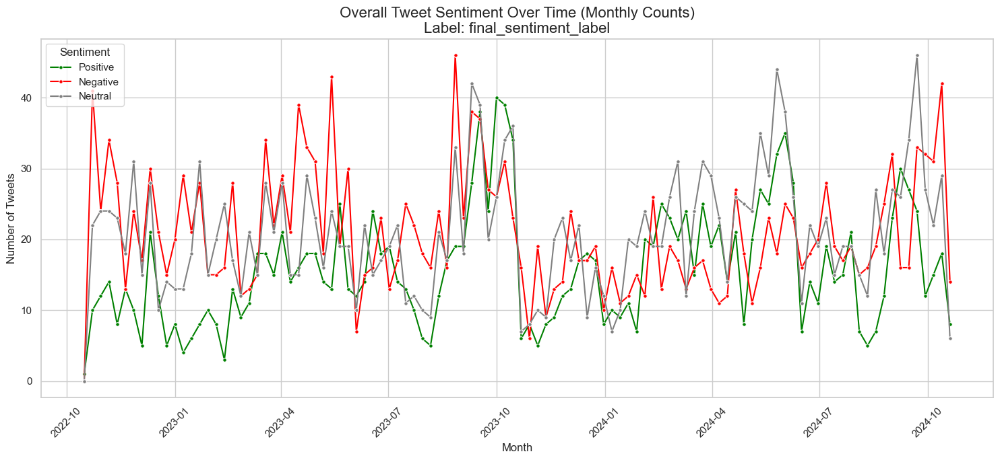


--- Overall Monthly Sentiment Plotting Complete ---


In [88]:
# === Notebook Cell: Plot Overall Sentiment Over Time (Monthly - Colored) ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback # Ensure traceback is imported

print("\n" + "="*60)
print("--- Plotting Overall Sentiment Over Time (Monthly - Colored) ---")
print("="*60)

# --- Configuration ---
time_frequency = 'W' # Aggregate by Month ('ME' for Month End)
final_sentiment_col = 'final_sentiment_label' # Column holding chosen sentiment
time_col = 'created_at'
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey', 'Other': 'blue', 'ERROR': 'orange'}
# ---

# Check if data preparation was successful 
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        # Resample and count sentiment per time bin
        df_time_indexed = df_sentiment_input.set_index(time_col)
        sentiment_over_time_monthly = df_time_indexed.groupby([pd.Grouper(freq=time_frequency), final_sentiment_col]) \
                                                     .size() \
                                                     .unstack(fill_value=0)
                                             
        # Ensure all standard sentiment columns exist
        sentiments_to_plot = ['Positive', 'Negative', 'Neutral']
        for sentiment in sentiments_to_plot:
            if sentiment not in sentiment_over_time_monthly.columns:
                sentiment_over_time_monthly[sentiment] = 0
        
        sentiment_over_time_monthly = sentiment_over_time_monthly[sentiments_to_plot]

        print("\nData prepared for overall plot (counts per month):")
        try:
            display(sentiment_over_time_monthly.head())
        except NameError:
            print(sentiment_over_time_monthly.head().to_string())

        # --- Plotting with specific colors ---
        plt.figure(figsize=(15, 7))
        
        for sentiment in sentiments_to_plot:
            sns.lineplot(x=sentiment_over_time_monthly.index, 
                         y=sentiment_over_time_monthly[sentiment], 
                         label=sentiment, 
                         color=sentiment_colors.get(sentiment, 'black'), 
                         marker='o', 
                         markersize=4, 
                         dashes=False) 
        
        plt.title(f'Overall Tweet Sentiment Over Time (Monthly Counts)\nLabel: {final_sentiment_col}', fontsize=16)
        plt.xlabel('Month')
        plt.ylabel('Number of Tweets')
        plt.xticks(rotation=45)
        plt.legend(title='Sentiment')
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"An error occurred during overall monthly plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully in the initial preparation step.")

print("\n" + "="*60)
print("--- Overall Monthly Sentiment Plotting Complete ---")
print("="*60)


--- Plotting Overall Sentiment Over Time (Weekly/Monthly - Colored & ANNOTATED) ---
Aggregating data by frequency: W

Data prepared for overall plot (counts per W):


final_sentiment_label,Positive,Negative,Neutral
created_at,,,
2022-10-16 00:00:00+00:00,1,0,0
2022-10-23 00:00:00+00:00,10,41,22
2022-10-30 00:00:00+00:00,12,24,24
2022-11-06 00:00:00+00:00,14,34,24
2022-11-13 00:00:00+00:00,8,28,23



Adding annotations to the plot...
Plot Date Range (UTC): 2022-10-16 to 2024-10-20
Processing other custom annotations...


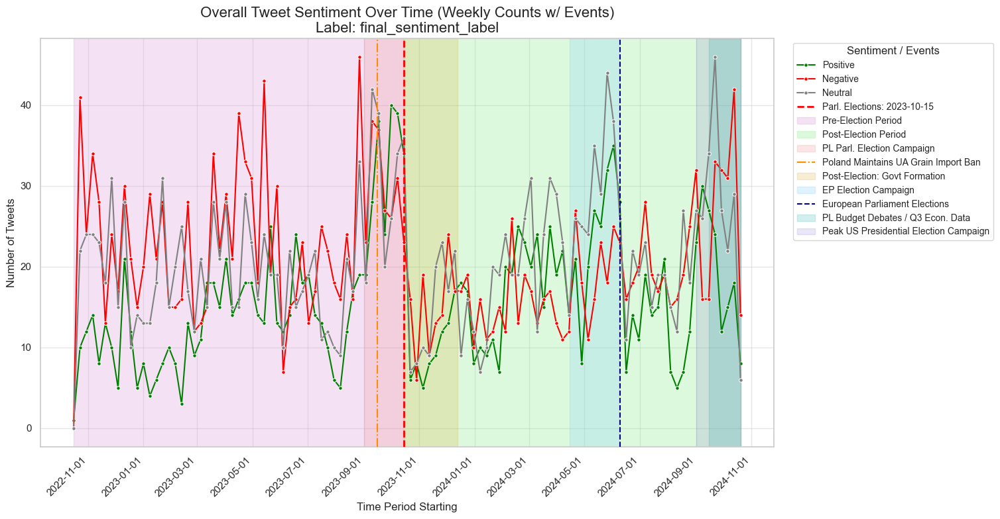


--- Overall W Annotated Sentiment Plotting Complete ---


In [93]:
# === Notebook Cell: Plot Overall Sentiment Over Time (Weekly/Monthly - Colored & ANNOTATED) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates # For date formatting
import seaborn as sns
import traceback 
from datetime import datetime, timezone 

print("\n" + "="*60)
print("--- Plotting Overall Sentiment Over Time (Weekly/Monthly - Colored & ANNOTATED) ---")
print("="*60)

# --- Configuration ---
# *** CHOOSE FREQUENCY: 'W' for Weekly, 'ME' for Monthly (Month End) ***
time_frequency = 'W'  # <<< CHANGE THIS TO 'W' or 'ME' AS NEEDED 
# --------------------

final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}

# --- Annotation Configuration (Copied/Adapted from your Section 10.B) ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2, 'add_lines': False},
    {'date': '2023-09-16', 'label': 'Poland Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.5 },
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25, 'add_lines': False },
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5 },
    {'start_date': '2024-09-15', 'end_date': '2024-10-31', 'label': 'PL Budget Debates / Q3 Econ. Data', 'color': 'lightseagreen', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-09-01', 'end_date': '2024-11-04', 'label': 'Peak US Presidential Election Campaign', 'color': 'slateblue', 'alpha': 0.15, 'add_lines': False},
]
main_election_date_str = '2023-10-15' 
show_pre_post_main_election_shading = True 
show_other_custom_annotations = True      
# --- End Annotation Configuration ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        # --- Data Prep ---
        df_plot = df_sentiment_input.copy() 
        # Ensure datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_plot[time_col]):
             df_plot[time_col] = pd.to_datetime(df_plot[time_col], utc=True, errors='coerce')
        df_plot = df_plot.dropna(subset=[time_col])
        if df_plot[time_col].dt.tz is None: df_plot[time_col] = df_plot[time_col].dt.tz_localize('UTC')
        elif df_plot[time_col].dt.tz != timezone.utc: df_plot[time_col] = df_plot[time_col].dt.tz_convert('UTC')
             
        df_time_indexed = df_plot.set_index(time_col)

        # Use the configured frequency
        plot_freq = time_frequency 
        print(f"Aggregating data by frequency: {plot_freq}")
        
        sentiment_over_time = df_time_indexed.groupby([pd.Grouper(freq=plot_freq), final_sentiment_col]) \
                                             .size().unstack(fill_value=0)
                                             
        sentiments_to_plot = ['Positive', 'Negative', 'Neutral']
        for sentiment in sentiments_to_plot:
            if sentiment not in sentiment_over_time.columns:
                sentiment_over_time[sentiment] = 0
        sentiment_over_time = sentiment_over_time[[s for s in sentiments_to_plot if s in sentiment_over_time.columns]] 

        print(f"\nData prepared for overall plot (counts per {plot_freq}):")
        display(sentiment_over_time.head())
        
        if sentiment_over_time.empty:
             print(f"No data available after resampling for frequency '{plot_freq}'.")
        else:
             # --- Plotting ---
             fig, ax = plt.subplots(figsize=(18, 8)) 
             
             # Plot sentiment lines
             for sentiment in sentiment_over_time.columns:
                 sns.lineplot(x=sentiment_over_time.index, 
                              y=sentiment_over_time[sentiment], 
                              label=sentiment, 
                              color=sentiment_colors.get(sentiment, 'black'), 
                              marker='o', markersize=4, dashes=False, ax=ax, zorder=5) 
             
             # --- Add Annotations (Timezone Fixed) ---
             print("\nAdding annotations to the plot...")
             plot_start_date = sentiment_over_time.index.min()
             plot_end_date = sentiment_over_time.index.max()
             print(f"Plot Date Range (UTC): {plot_start_date.strftime('%Y-%m-%d')} to {plot_end_date.strftime('%Y-%m-%d')}")
             
             election_date = pd.to_datetime(main_election_date_str, utc=True) if main_election_date_str else None
             annotation_labels_used = set() 

             # Main Election Line & Shading
             if election_date and pd.notna(plot_start_date) and pd.notna(plot_end_date):
                  if plot_start_date <= election_date <= plot_end_date:
                       election_label = f"Parl. Elections: {election_date.strftime('%Y-%m-%d')}"
                       current_label = election_label if election_label not in annotation_labels_used else None
                       ax.axvline(election_date, color='red', linestyle='--', lw=2, label=current_label, zorder=10)
                       if current_label: annotation_labels_used.add(election_label)
                       if show_pre_post_main_election_shading:
                           pre_label = 'Pre-Election Period' if 'Pre-Election Period' not in annotation_labels_used else None
                           post_label = 'Post-Election Period' if 'Post-Election Period' not in annotation_labels_used else None
                           span1_start = max(plot_start_date, pd.to_datetime('1900-01-01', utc=True)); span1_end = election_date
                           if span1_start < span1_end: ax.axvspan(span1_start, span1_end, color='#DDA0DD', alpha=0.3, label=pre_label, zorder=1); annotation_labels_used.add('Pre-Election Period')
                           span2_start = election_date; span2_end = min(plot_end_date, pd.to_datetime('2100-01-01', utc=True))
                           if span2_start < span2_end: ax.axvspan(span2_start, span2_end, color='#90EE90', alpha=0.3, label=post_label, zorder=1); annotation_labels_used.add('Post-Election Period')
                  
             # Other Custom Annotations
             if annotations_list and show_other_custom_annotations:
                 print("Processing other custom annotations...")
                 for event in annotations_list:
                     label=event.get('label', 'Annotation')
                     try:
                         if 'date' in event:
                             dt = pd.to_datetime(event['date'], utc=True)
                             if pd.notna(plot_start_date) and pd.notna(plot_end_date) and plot_start_date <= dt <= plot_end_date:
                                 current_label = label if label not in annotation_labels_used else None
                                 ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), label=current_label, zorder=10)
                                 if current_label: annotation_labels_used.add(label)
                                 
                         elif 'start_date' in event and 'end_date' in event:
                             dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                             if pd.notna(dt_start) and pd.notna(dt_end) and dt_start <= dt_end and dt_start <= plot_end_date and dt_end >= plot_start_date:
                                 current_label = label if label not in annotation_labels_used else None
                                 span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                 if span_start < span_end: 
                                     ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.2), label=current_label, zorder=1)
                                     if current_label: annotation_labels_used.add(label)
                                 if event.get('add_lines', False):
                                     line_color=event.get('line_color', event.get('color', 'cyan')); line_style=event.get('line_style', ':'); line_width=event.get('line_width', 1)
                                     if plot_start_date <= dt_start <= plot_end_date: ax.axvline(dt_start, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
                                     if plot_start_date <= dt_end <= plot_end_date: ax.axvline(dt_end, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
                     except Exception as e_ann: print(f"Warning: Could not process annotation '{label}'. Error: {e_ann}")
             # --- End Annotations ---

             # --- Final Plot Formatting ---
             freq_name = "Weekly" if plot_freq == 'W' else "Monthly" if plot_freq == 'ME' else plot_freq
             plt.title(f'Overall Tweet Sentiment Over Time ({freq_name} Counts w/ Events)\nLabel: {final_sentiment_col}', fontsize=16)
             plt.xlabel('Time Period Starting' if plot_freq=='W' else 'Month End')
             plt.ylabel('Number of Tweets')
             
             # *** Apply YYYY-MM-DD Date Formatting ***
             ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) 
             ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=8, maxticks=20)) # Auto adjust tick density
             plt.xticks(rotation=45, ha='right') 
             
             # Consolidate legend 
             handles, labels = ax.get_legend_handles_labels()
             by_label = dict(zip(labels, handles)) 
             ax.legend(by_label.values(), by_label.keys(), title='Sentiment / Events', loc='upper left', bbox_to_anchor=(1.02, 1), fontsize='small') 
             
             plt.grid(True, alpha=0.5)
             plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust for legend
             plt.show()

    except Exception as e:
        print(f"An error occurred during annotated plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully in the initial preparation step.")

print("\n" + "="*60)
print(f"--- Overall {time_frequency} Annotated Sentiment Plotting Complete ---")
print("="*60)

Step 3: Plot Sentiment Over Time per Party (Showing P/N/N Breakdown)

This uses faceted line plots to show the Positive/Negative/Neutral counts per week for each party separately.


--- Plotting Sentiment COUNTS Over Time per Party (Manual Legend Position) ---

Data prepared for per-party counts plot (long format):


,created_at,party,final_sentiment_label,count
0,2022-10-16 00:00:00+00:00,PL2050,Positive,1
1,2022-10-23 00:00:00+00:00,Konfederacja,Negative,5
2,2022-10-23 00:00:00+00:00,Konfederacja,Neutral,4
3,2022-10-23 00:00:00+00:00,Konfederacja,Positive,3
4,2022-10-23 00:00:00+00:00,NL,Negative,17



Generating faceted line plot of counts for 6 parties...
Manually adjusted legend position relative to figure.


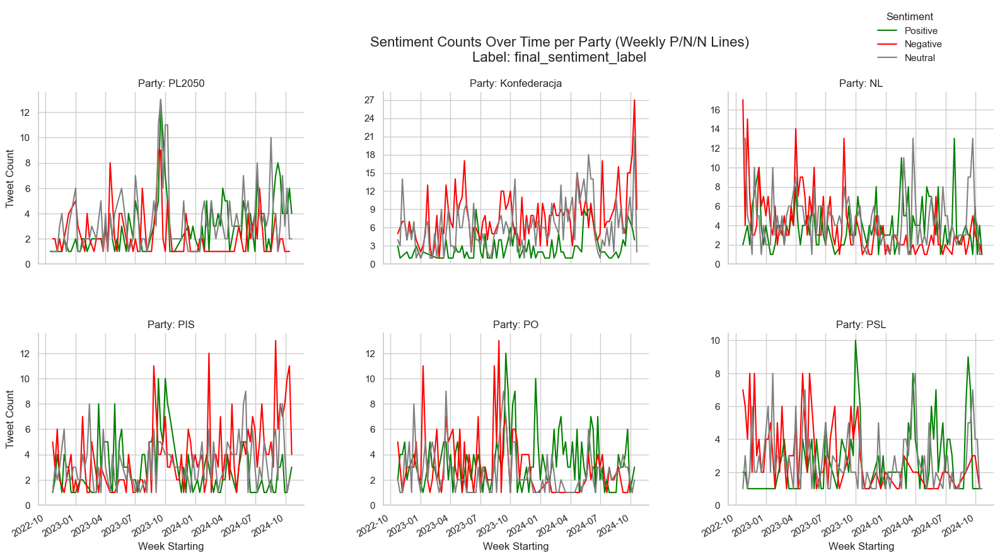


--- Per-Party Sentiment Counts Plotting Complete ---


In [102]:
# === Notebook Cell: Plot Sentiment COUNTS Over Time per Party (Faceted Lines - Legend Repositioned v2) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker # For integer ticks
import seaborn as sns
import traceback 
import numpy as np 

print("\n" + "="*60)
print("--- Plotting Sentiment COUNTS Over Time per Party (Manual Legend Position) ---")
print("="*60)

# --- Configuration ---
time_frequency = 'W' 
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
parties_to_plot = None 
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey', 'Other': 'blue', 'ERROR': 'orange'}
sentiment_order = ['Positive', 'Negative', 'Neutral', 'Other', 'ERROR'] 
# ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_plot_subset = df_sentiment_input.copy()
        if parties_to_plot:
            df_plot_subset = df_plot_subset[df_plot_subset[party_col].isin(parties_to_plot)]
            print(f"Filtered data to include only parties: {parties_to_plot}")

        if df_plot_subset.empty:
             print("No data remaining after filtering.")
        else:
             # --- Data Preparation ---
             sentiment_counts_time_party = df_plot_subset.groupby([
                 pd.Grouper(key=time_col, freq=time_frequency), 
                 party_col, 
                 final_sentiment_col
             ]).size().reset_index(name='count') 

             print("\nData prepared for per-party counts plot (long format):")
             display(sentiment_counts_time_party.head())

             # --- Plotting with Seaborn Facets ---
             present_sentiments = sentiment_counts_time_party[final_sentiment_col].unique()
             plot_sentiments = [s for s in ['Positive', 'Negative', 'Neutral'] if s in present_sentiments]
             if not plot_sentiments: plot_sentiments = [s for s in sentiment_order if s in present_sentiments]
                  
             filtered_palette = {k: v for k, v in sentiment_colors.items() if k in plot_sentiments}
             filtered_order = [s for s in sentiment_order if s in plot_sentiments]

             num_parties = sentiment_counts_time_party[party_col].nunique()
             num_facet_cols = min(num_parties, 3) 

             print(f"\nGenerating faceted line plot of counts for {num_parties} parties...")

             # Create the plot, ensuring default legend is generated
             g = sns.relplot(
                 data=sentiment_counts_time_party, 
                 x=time_col, 
                 y='count', 
                 hue=final_sentiment_col, 
                 hue_order=filtered_order, 
                 palette=filtered_palette, 
                 kind='line', 
                 col=party_col, 
                 col_wrap=num_facet_cols, 
                 height=4, aspect=1.5,
                 legend='full', # Create the default legend object initially
                 facet_kws={'sharey': False, 'sharex': True} 
             )

             # --- Iterate through axes JUST to fix Y-ticks ---
             for ax in g.axes.flat:
                 ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
                 ax.set_ylim(bottom=0) 
             # --- End Y-tick fixing loop ---

             # --- Final Plot Formatting ---
             g.set_titles("Party: {col_name}") 
             g.set_axis_labels("Week Starting", "Tweet Count") 
             # Adjust title y position slightly if needed
             g.fig.suptitle(f'Sentiment Counts Over Time per Party (Weekly P/N/N Lines)\nLabel: {final_sentiment_col}', fontsize=16, y=1.03) 
             g.fig.autofmt_xdate() 

             # --- Manually Adjust Legend Position ---
             try:
                 # Access the legend object created by relplot
                 legend = g.legend
                 if legend:
                     legend.set_title("Sentiment")
                     # Set bbox_to_anchor relative to the FIGURE (0,0 bottom left, 1,1 top right)
                     # Place the legend's 'upper left' corner at coordinates (e.g., 0.85, 0.98)
                     # You might need to tweak these coordinates (x, y)
                     legend.set_bbox_to_anchor((0.70, 1.1)) 
                     legend.set_loc("upper left") 
                     print("Manually adjusted legend position relative to figure.")
                 else:
                      print("Warning: Legend object not found on FacetGrid.")
             except Exception as e_leg:
                  print(f"Warning: Error adjusting legend: {e_leg}")
             # --- End Legend Adjustment ---

             # --- Adjust Subplot Layout to Make Space ---
             # Use plt.subplots_adjust instead of tight_layout for more control when legend is outside
             # Leave space on right (e.g., right=0.85 means plots use left 85%)
             # Leave space on top (e.g., top=0.92 means plots use bottom 92%)
             plt.subplots_adjust(right=0.85, top=0.92, bottom=0.1, left=0.08, hspace=0.4, wspace=0.3) 
             # Adjust hspace/wspace (space between subplots) if needed

             plt.show()

    except Exception as e:
        print(f"An error occurred during per-party counts plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing party column.")

print("\n" + "="*60)
print("--- Per-Party Sentiment Counts Plotting Complete ---")
print("="*60)


--- Plotting Stacked Area Sentiment Over Time (Select Party/Sentiments) ---
Filtered data for party: Konfederacja. Rows remaining: 1693

Data prepared for stacked area plot (counts per W):


final_sentiment_label,Positive,Negative,Neutral
created_at,,,
2022-10-23 00:00:00+00:00,3,5,4
2022-10-30 00:00:00+00:00,1,6,3
2022-11-06 00:00:00+00:00,0,7,14
2022-11-13 00:00:00+00:00,0,7,7
2022-11-20 00:00:00+00:00,2,4,4



Adding annotations to the plot...
Plot Date Range (UTC): 2022-10-23 to 2024-10-20
Processing other custom annotations...
An error occurred during stacked area plot generation: object of type 'list_reverseiterator' has no len()

--- Stacked Area Plotting Complete (Party: Konfederacja) ---


Traceback (most recent call last):
  File "C:\Users\macie\AppData\Local\Temp\ipykernel_13432\330668412.py", line 184, in <module>
    ax.legend(reversed(handles), reversed(labels), # Often reverse stackplot legend order
  File "c:\Users\macie\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\axes\_axes.py", line 337, in legend
    self.legend_ = mlegend.Legend(self, handles, labels, **kwargs)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\macie\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\legend.py", line 462, in __init__
    if len(handles) < 2:
       ^^^^^^^^^^^^
TypeError: object of type 'list_reverseiterator' has no len()


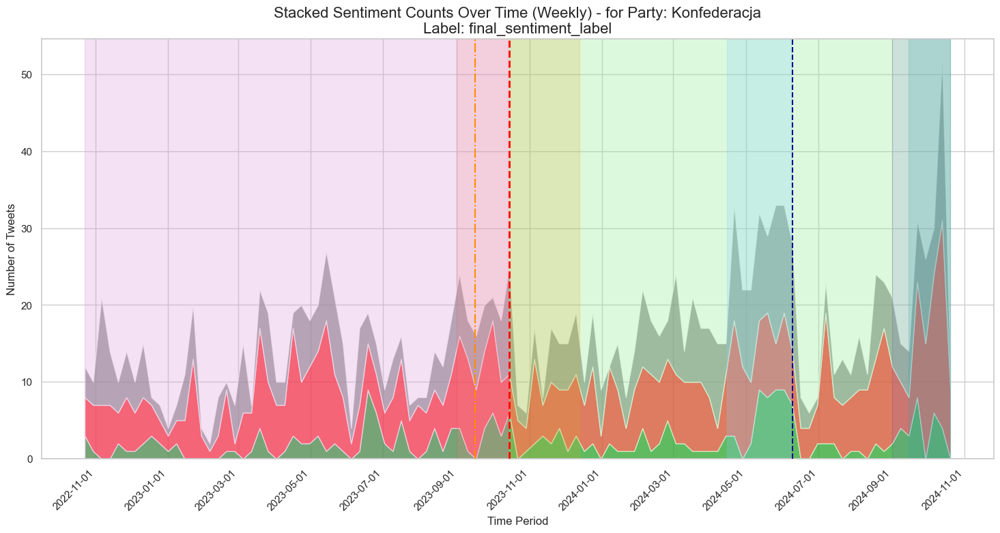

In [108]:
# === Notebook Cell: Stacked Area Sentiment Plot (Select Party & Sentiments) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import seaborn as sns # Keep seaborn for style consistency if desired
import traceback 
from datetime import datetime, timezone 
import numpy as np

print("\n" + "="*60)
print("--- Plotting Stacked Area Sentiment Over Time (Select Party/Sentiments) ---")
print("="*60)

# --- Configuration ---
# *** SET TARGET PARTY: Enter a specific party name or None for Overall ***
target_party = 'Konfederacja'  # <<< E.g., 'Konfederacja', 'PO', 'PIS', or None for all parties combined
# *** SET SENTIMENTS TO PLOT: Choose one or more from ['Positive', 'Negative', 'Neutral'] ***
sentiments_to_include = ['Positive', 'Negative', 'Neutral'] # <<< Modify this list as needed
# *** SET TIME FREQUENCY: 'W' for Weekly, 'ME' for Monthly (Month End) ***
time_frequency = 'W' 
# --------------------

# Basic column names and colors
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'} # Only need P/N/N

# --- Annotation Configuration (Copied/Adapted) ---
annotations_list = [
    # ... (paste your full annotations_list here) ...
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2, 'add_lines': False},
    {'date': '2023-09-16', 'label': 'Poland Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.5 },
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25, 'add_lines': False },
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5 },
    {'start_date': '2024-09-15', 'end_date': '2024-10-31', 'label': 'PL Budget Debates / Q3 Econ. Data', 'color': 'lightseagreen', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-09-01', 'end_date': '2024-11-04', 'label': 'Peak US Presidential Election Campaign', 'color': 'slateblue', 'alpha': 0.15, 'add_lines': False},
]
main_election_date_str = '2023-10-15' 
show_pre_post_main_election_shading = True 
show_other_custom_annotations = True      
# --- End Annotation Configuration ---

# --- Check data readiness ---
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and # Need party col even if plotting overall
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        # --- Data Preparation ---
        df_plot = df_sentiment_input.copy() 
        
        # Filter by party if specified
        plot_title_suffix = "Overall"
        if target_party:
            if target_party in df_plot[party_col].unique():
                df_plot = df_plot[df_plot[party_col] == target_party]
                plot_title_suffix = f"for Party: {target_party}"
                print(f"Filtered data for party: {target_party}. Rows remaining: {len(df_plot)}")
            else:
                print(f"ERROR: Party '{target_party}' not found in data. Plotting overall instead.")
                target_party = None # Revert to overall if party not found
        else:
             print("Calculating overall sentiment counts (all parties combined).")


        # Ensure 'created_at' is datetime and explicitly UTC 
        if not pd.api.types.is_datetime64_any_dtype(df_plot[time_col]):
             df_plot[time_col] = pd.to_datetime(df_plot[time_col], utc=True, errors='coerce')
        df_plot = df_plot.dropna(subset=[time_col])
        if df_plot[time_col].dt.tz is None: df_plot[time_col] = df_plot[time_col].dt.tz_localize('UTC')
        elif df_plot[time_col].dt.tz != timezone.utc: df_plot[time_col] = df_plot[time_col].dt.tz_convert('UTC')
             
        df_time_indexed = df_plot.set_index(time_col)

        # Use the configured frequency ('ME' or 'W')
        plot_freq = 'ME' if time_frequency == 'M' else time_frequency 
        if plot_freq == 'M': print("Warning: Using 'ME' (Month End) frequency instead of 'M'.")
        
        # Group by time and sentiment, get counts, unstack
        sentiment_over_time = df_time_indexed.groupby([pd.Grouper(freq=plot_freq), final_sentiment_col]) \
                                             .size().unstack(fill_value=0)
                                             
        # Filter and order columns based on sentiments_to_include
        plot_cols = [s for s in sentiments_to_include if s in sentiment_colors.keys()] # Use only P/N/N usually
        for sentiment in plot_cols:
            if sentiment not in sentiment_over_time.columns:
                sentiment_over_time[sentiment] = 0 # Add missing columns with 0 count
        # Select only the desired columns in the desired order for stacking
        plot_data_final = sentiment_over_time[[s for s in plot_cols if s in sentiment_over_time.columns]]

        print(f"\nData prepared for stacked area plot (counts per {plot_freq}):")
        display(plot_data_final.head())
        
        if plot_data_final.empty:
             print(f"No data available after resampling for frequency '{plot_freq}'.")
        else:
             # --- Plotting Stacked Area Chart ---
             fig, ax = plt.subplots(figsize=(18, 8)) 
             
             # Prepare data for stackplot: X values and a list of Y value arrays
             x_values = plot_data_final.index
             # Get data columns as a list of numpy arrays
             y_values = [plot_data_final[col].values for col in plot_data_final.columns] 
             plot_labels = plot_data_final.columns.tolist()
             plot_colors_used = [sentiment_colors.get(s, 'grey') for s in plot_labels]

             # Create the stackplot
             ax.stackplot(x_values, y_values, labels=plot_labels, colors=plot_colors_used, alpha=0.7)
             
             # --- Add Annotations ---
             print("\nAdding annotations to the plot...")
             plot_start_date = plot_data_final.index.min()
             plot_end_date = plot_data_final.index.max()
             print(f"Plot Date Range (UTC): {plot_start_date.strftime('%Y-%m-%d')} to {plot_end_date.strftime('%Y-%m-%d')}")
             
             election_date = pd.to_datetime(main_election_date_str, utc=True) if main_election_date_str else None
             annotation_labels_used = set() 

             # (Paste the same annotation logic here as used in the previous plot block)
             # ... [Annotation code - Main Election] ...
             if election_date and pd.notna(plot_start_date) and pd.notna(plot_end_date):
                 if plot_start_date <= election_date <= plot_end_date:
                     election_label = f"Parl. Elections: {election_date.strftime('%Y-%m-%d')}"
                     current_label = election_label if election_label not in annotation_labels_used else None
                     ax.axvline(election_date, color='red', linestyle='--', lw=2, label=current_label, zorder=10)
                     if current_label: annotation_labels_used.add(election_label)
                     if show_pre_post_main_election_shading:
                         pre_label = 'Pre-Election Period' if 'Pre-Election Period' not in annotation_labels_used else None
                         post_label = 'Post-Election Period' if 'Post-Election Period' not in annotation_labels_used else None
                         span1_start = max(plot_start_date, pd.to_datetime('1900-01-01', utc=True)); span1_end = election_date
                         if span1_start < span1_end: ax.axvspan(span1_start, span1_end, color='#DDA0DD', alpha=0.3, label=pre_label, zorder=1); annotation_labels_used.add('Pre-Election Period')
                         span2_start = election_date; span2_end = min(plot_end_date, pd.to_datetime('2100-01-01', utc=True))
                         if span2_start < span2_end: ax.axvspan(span2_start, span2_end, color='#90EE90', alpha=0.3, label=post_label, zorder=1); annotation_labels_used.add('Post-Election Period')
             
             # ... [Annotation code - Other Custom Annotations] ...
             if annotations_list and show_other_custom_annotations:
                 print("Processing other custom annotations...")
                 for event in annotations_list:
                     label=event.get('label', 'Annotation')
                     try:
                         if 'date' in event:
                             dt = pd.to_datetime(event['date'], utc=True)
                             if pd.notna(plot_start_date) and pd.notna(plot_end_date) and plot_start_date <= dt <= plot_end_date:
                                 current_label = label if label not in annotation_labels_used else None
                                 ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), label=current_label, zorder=10)
                                 if current_label: annotation_labels_used.add(label)
                         elif 'start_date' in event and 'end_date' in event:
                             dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                             if pd.notna(dt_start) and pd.notna(dt_end) and dt_start <= dt_end and dt_start <= plot_end_date and dt_end >= plot_start_date:
                                 current_label = label if label not in annotation_labels_used else None
                                 span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                 if span_start < span_end: 
                                     ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.2), label=current_label, zorder=1)
                                     if current_label: annotation_labels_used.add(label)
                                 if event.get('add_lines', False): # Optional lines at span boundaries
                                     line_color=event.get('line_color', event.get('color', 'cyan')); line_style=event.get('line_style', ':'); line_width=event.get('line_width', 1)
                                     if plot_start_date <= dt_start <= plot_end_date: ax.axvline(dt_start, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
                                     if plot_start_date <= dt_end <= plot_end_date: ax.axvline(dt_end, color=line_color, linestyle=line_style, lw=line_width, zorder=9)
                     except Exception as e_ann: print(f"Warning: Could not process annotation '{label}'. Error: {e_ann}")
             # --- End Annotations ---

             # --- Final Plot Formatting ---
             freq_name = "Weekly" if plot_freq == 'W' else "Monthly"
             plt.title(f'Stacked Sentiment Counts Over Time ({freq_name}) - {plot_title_suffix}\nLabel: {final_sentiment_col}', fontsize=16)
             plt.xlabel('Time Period')
             plt.ylabel('Number of Tweets')
             
             # Format x-axis dates
             ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) 
             ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=8, maxticks=15)) # Auto adjust tick density
             plt.xticks(rotation=45, ha='right') 
             
             # Consolidate legend 
             handles, labels = ax.get_legend_handles_labels()
             # Filter labels to match plot_labels if needed (stackplot handles might be different)
             # For stackplot, legend items correspond directly to the plotted data series
             ax.legend(reversed(handles), reversed(labels), # Often reverse stackplot legend order
                       title='Sentiment / Events', loc='upper left', bbox_to_anchor=(1.02, 1), fontsize='small') 
             
             plt.grid(True, axis='y', alpha=0.5) # Grid only on y-axis can be cleaner for area plots
             plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust for legend
             plt.show()

    except Exception as e:
        print(f"An error occurred during stacked area plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully.")

print("\n" + "="*60)
print(f"--- Stacked Area Plotting Complete (Party: {target_party if target_party else 'Overall'}) ---")
print("="*60)

4. Sentiment per Top N Users per Party

This analysis finds the most active users within each party and shows their sentiment distribution.


--- Analyzing Sentiment per Top N Users per Party ---
Identifying top 10 users per party based on tweet count...
Found 58 unique top users across parties.
Filtered DataFrame to 5978 tweets from top users.

Data prepared for top user sentiment plots:


final_sentiment_label,party,username,Negative,Neutral,Positive,total_tweets
8,Konfederacja,bartlomiejpejo,128,119,54,301
4,Konfederacja,SlawomirMentzen,122,91,53,266
2,Konfederacja,MarSypniewski,124,96,37,257
1,Konfederacja,KonradBerkowicz,89,65,18,172
7,Konfederacja,Wlodek_Skalik,93,50,23,166



Generating faceted bar plot for top 10 users per party...


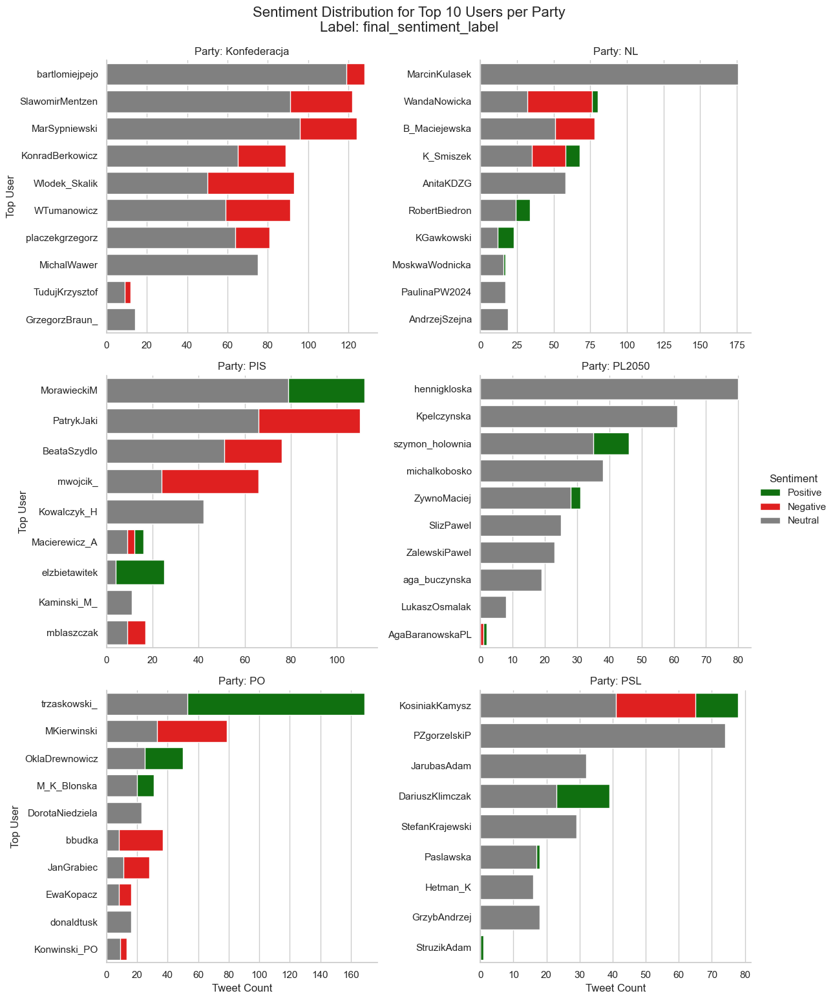


--- Top User Sentiment Analysis Complete ---


In [103]:
# === Notebook Cell: Sentiment per Top N Users per Party ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback # Ensure traceback is imported

print("\n" + "="*60)
print("--- Analyzing Sentiment per Top N Users per Party ---")
print("="*60)

# --- Configuration ---
final_sentiment_col = 'final_sentiment_label'
party_col = 'party'
user_col = 'username' # Assuming 'username' column exists
top_n_users = 10 # How many top users per party to show
# ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and
                   user_col in df_sentiment_input.columns)

if plot_data_ready:
    try:
        # --- Find Top N Users per Party ---
        print(f"Identifying top {top_n_users} users per party based on tweet count...")
        user_counts_per_party = df_sentiment_input.groupby([party_col])[user_col].value_counts()
        top_users = user_counts_per_party.groupby(level=0, group_keys=False).nlargest(top_n_users) # Get top N within each party
        top_users_df = top_users.reset_index() # Convert multi-index series to DataFrame
        top_users_list = top_users_df[user_col].unique().tolist() # Get unique list of top users across all parties
        
        print(f"Found {len(top_users_list)} unique top users across parties.")
        # print("Top users identified (Party, User, Count):")
        # try:
        #     display(top_users_df)
        # except NameError:
        #      print(top_users_df.to_string())

        # --- Filter main DataFrame for these top users ---
        df_top_users_data = df_sentiment_input[df_sentiment_input[user_col].isin(top_users_list)].copy()
        print(f"Filtered DataFrame to {len(df_top_users_data)} tweets from top users.")

        if not df_top_users_data.empty:
            # --- Calculate Sentiment Counts per Top User per Party ---
            sentiment_counts_top_users = df_top_users_data.groupby([party_col, user_col, final_sentiment_col]) \
                                                         .size() \
                                                         .unstack(fill_value=0) # Pivot sentiment to columns
                                                         
            # Ensure P/N/N columns exist
            for sentiment in ['Positive', 'Negative', 'Neutral']:
                if sentiment not in sentiment_counts_top_users.columns:
                    sentiment_counts_top_users[sentiment] = 0

            # Get total tweets per user to sort bars
            total_tweets_per_user = sentiment_counts_top_users.sum(axis=1)
            sentiment_counts_top_users['total_tweets'] = total_tweets_per_user
            
            # Prepare data for plotting (reset index)
            plot_data = sentiment_counts_top_users.reset_index()
            
            # Sort within each party by total tweets for consistent bar ordering
            plot_data = plot_data.sort_values(by=[party_col, 'total_tweets'], ascending=[True, False])

            print("\nData prepared for top user sentiment plots:")
            try:
                 display(plot_data.head())
            except NameError:
                 print(plot_data.head().to_string())

            # --- Plotting with Seaborn Facets (Bar Plot) ---
            # Melt data for stacked or grouped bar plot using catplot
            plot_data_melted = pd.melt(plot_data, 
                                       id_vars=[party_col, user_col, 'total_tweets'], 
                                       value_vars=['Positive', 'Negative', 'Neutral'], # Add Other/ERROR if relevant
                                       var_name='Sentiment', 
                                       value_name='Count')

            print(f"\nGenerating faceted bar plot for top {top_n_users} users per party...")

            # Determine number of columns for facets dynamically
            num_parties = plot_data[party_col].nunique()
            num_facet_cols = min(num_parties, 2) # Adjust max columns per row (e.g., 2 or 3)
            
            # Calculate required rows based on unique parties and col_wrap
            unique_parties = plot_data[party_col].unique()
            num_rows = int(np.ceil(len(unique_parties) / num_facet_cols))
            facet_height = 5 # Adjust height per facet
            
            sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey', 'Other': 'blue', 'ERROR': 'orange'}
            sentiment_order = ['Positive', 'Negative', 'Neutral', 'Other', 'ERROR']
            
            present_sentiments = plot_data_melted['Sentiment'].unique()
            filtered_palette = {k: v for k, v in sentiment_colors.items() if k in present_sentiments}
            filtered_order = [s for s in sentiment_order if s in present_sentiments]

            # Use catplot for faceted bar chart
            g = sns.catplot(
                data=plot_data_melted,
                x='Count', 
                y=user_col, 
                hue='Sentiment',
                col=party_col, # Facet by party
                kind='bar',
                orient='h', # Horizontal bars
                palette=filtered_palette,
                hue_order=filtered_order,
                col_wrap=num_facet_cols,
                height=facet_height, 
                aspect=1.2, # Adjust aspect ratio
                sharex=False, # X-axis (Count) should not be shared
                sharey=False, # Y-axis (User) should not be shared
                dodge=False # Creates stacked bars
                # For grouped bars instead of stacked, use dodge=True
            )

            g.set_titles("Party: {col_name}")
            g.set_axis_labels("Tweet Count", "Top User")
            g.fig.suptitle(f'Sentiment Distribution for Top {top_n_users} Users per Party\nLabel: {final_sentiment_col}', fontsize=16, y=1.03)
            # Improve layout if needed
            # g.fig.tight_layout(rect=[0, 0.03, 1, 0.96]) 
            plt.show()
            
        else:
            print("No data found for the identified top users.")

    except Exception as e:
        print(f"An error occurred during top user analysis: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns (party, username).")

print("\n" + "="*60)
print("--- Top User Sentiment Analysis Complete ---")
print("="*60)


--- Analyzing POSITIVE vs NEGATIVE Sentiment per Top N Users per Party ---
Identifying top 10 users per party based on tweet count...
Found 58 unique top users across parties.
Filtered DataFrame to 5978 tweets from top users.

Data prepared for top user sentiment plots (including Neutral for sorting):


final_sentiment_label,party,username,Negative,Neutral,Positive,total_tweets
8,Konfederacja,bartlomiejpejo,128,119,54,301
4,Konfederacja,SlawomirMentzen,122,91,53,266
2,Konfederacja,MarSypniewski,124,96,37,257
1,Konfederacja,KonradBerkowicz,89,65,18,172
7,Konfederacja,Wlodek_Skalik,93,50,23,166



Generating faceted GROUPED bar plot (Pos vs Neg) for top 10 users per party...


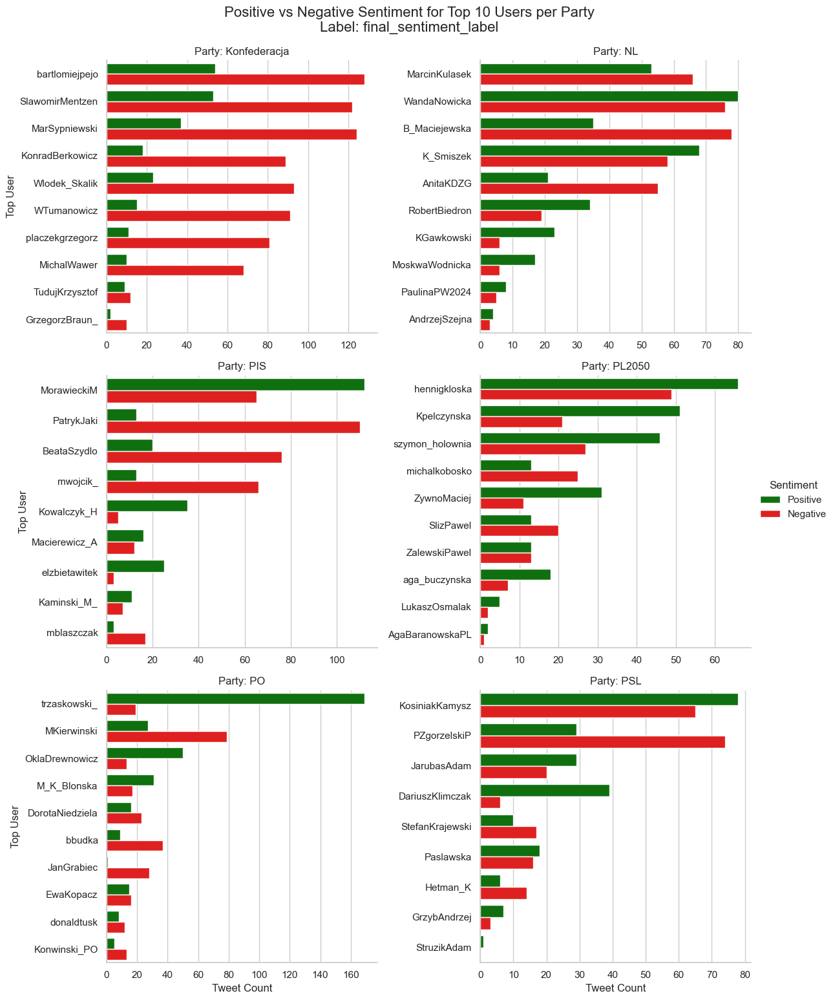


--- Top User Pos/Neg Sentiment Analysis Complete ---


In [104]:
# === Notebook Cell: POSITIVE vs NEGATIVE Sentiment per Top N Users per Party ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback # Ensure traceback is imported
import numpy as np # Ensure numpy is imported

print("\n" + "="*60)
print("--- Analyzing POSITIVE vs NEGATIVE Sentiment per Top N Users per Party ---")
print("="*60)

# --- Configuration ---
final_sentiment_col = 'final_sentiment_label'
party_col = 'party'
user_col = 'username' # Assuming 'username' column exists
top_n_users = 10 # How many top users per party to show
# ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and
                   user_col in df_sentiment_input.columns)

if plot_data_ready:
    try:
        # --- Find Top N Users per Party (same as before) ---
        print(f"Identifying top {top_n_users} users per party based on tweet count...")
        user_counts_per_party = df_sentiment_input.groupby([party_col])[user_col].value_counts()
        top_users = user_counts_per_party.groupby(level=0, group_keys=False).nlargest(top_n_users)
        top_users_df = top_users.reset_index()
        top_users_list = top_users_df[user_col].unique().tolist()
        print(f"Found {len(top_users_list)} unique top users across parties.")

        # --- Filter main DataFrame for these top users ---
        df_top_users_data = df_sentiment_input[df_sentiment_input[user_col].isin(top_users_list)].copy()
        print(f"Filtered DataFrame to {len(df_top_users_data)} tweets from top users.")

        if not df_top_users_data.empty:
            # --- Calculate Sentiment Counts per Top User per Party (including Neutral initially) ---
            sentiment_counts_top_users = df_top_users_data.groupby([party_col, user_col, final_sentiment_col]) \
                                                         .size() \
                                                         .unstack(fill_value=0) 
                                                         
            # Ensure P/N/N columns exist
            for sentiment in ['Positive', 'Negative', 'Neutral']:
                if sentiment not in sentiment_counts_top_users.columns:
                    sentiment_counts_top_users[sentiment] = 0

            # Get total tweets per user to sort bars (using P+N+N for sorting)
            total_tweets_per_user = sentiment_counts_top_users.sum(axis=1)
            sentiment_counts_top_users['total_tweets'] = total_tweets_per_user
            
            # Prepare data for plotting (reset index)
            plot_data = sentiment_counts_top_users.reset_index()
            
            # Sort within each party by total tweets 
            plot_data = plot_data.sort_values(by=[party_col, 'total_tweets'], ascending=[True, False])

            print("\nData prepared for top user sentiment plots (including Neutral for sorting):")
            try:
                 display(plot_data.head())
            except NameError:
                 print(plot_data.head().to_string())

            # --- Plotting with Seaborn Facets (GROUPED Bar Plot for Pos/Neg) ---
            # Melt data but ONLY keep Positive and Negative rows for plotting
            plot_data_melted = pd.melt(plot_data, 
                                       id_vars=[party_col, user_col, 'total_tweets'], 
                                       value_vars=['Positive', 'Negative'], # <-- Only melt Pos/Neg
                                       var_name='Sentiment', 
                                       value_name='Count')
                                       
            # Filter out rows with zero count to avoid plotting empty bars if desired
            # plot_data_melted = plot_data_melted[plot_data_melted['Count'] > 0]

            print(f"\nGenerating faceted GROUPED bar plot (Pos vs Neg) for top {top_n_users} users per party...")

            # Determine number of columns for facets dynamically
            num_parties = plot_data[party_col].nunique()
            num_facet_cols = min(num_parties, 2) 
            
            # Calculate required rows 
            unique_parties = plot_data[party_col].unique()
            num_rows = int(np.ceil(len(unique_parties) / num_facet_cols))
            facet_height = 5 
            
            # Define palette and order specifically for Pos/Neg
            pos_neg_colors = {'Positive': 'green', 'Negative': 'red'}
            pos_neg_order = ['Positive', 'Negative']
            
            if not plot_data_melted.empty:
                # Use catplot for faceted bar chart
                g = sns.catplot(
                    data=plot_data_melted,
                    x='Count', 
                    y=user_col, 
                    hue='Sentiment',
                    col=party_col, # Facet by party
                    kind='bar',
                    orient='h', # Horizontal bars
                    palette=pos_neg_colors, # Use only Pos/Neg colors
                    hue_order=pos_neg_order, # Use only Pos/Neg order
                    col_wrap=num_facet_cols,
                    height=facet_height, 
                    aspect=1.2, 
                    sharex=False, 
                    sharey=False, 
                    dodge=True # <-- Use dodge=True for GROUPED bars
                )

                g.set_titles("Party: {col_name}")
                g.set_axis_labels("Tweet Count", "Top User")
                # Adjust legend position if needed
                # g.add_legend(title="Sentiment", loc='upper right') 
                g.fig.suptitle(f'Positive vs Negative Sentiment for Top {top_n_users} Users per Party\nLabel: {final_sentiment_col}', fontsize=16, y=1.03)
                plt.show()
            else:
                 print("No Positive or Negative sentiment data found for the top users to plot.")
            
        else:
            print("No data found for the identified top users.")

    except Exception as e:
        print(f"An error occurred during top user analysis: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns (party, username).")

print("\n" + "="*60)
print("--- Top User Pos/Neg Sentiment Analysis Complete ---")
print("="*60)

Okay, let's tackle these requests.

1. 100% Stacked Area Chart (Explanation and Code)

Summary / Why it's useful: You mentioned wanting a better "grip" on what's happening than just raw counts, especially since tweet volume varies between parties and over time. The 100% Stacked Area Chart is excellent for this. Instead of showing raw counts on the Y-axis, it shows the proportion (or percentage) of Positive, Negative, and Neutral tweets for each party within each time period. The total height of the chart at any time point is always 100%.   

This normalizes for activity volume, meaning you can directly compare the balance of sentiment between Party A and Party B, even if Party A tweeted 100 times and Party B only tweeted 10 times in a given week.
It clearly visualizes the internal composition of sentiment for each party and how that relative balance shifts over time. Did a party become mostly negative (red area grows towards 100%), or did neutral (grey area) dominate?   
It directly addresses the "division over red, green, grey" by showing the relative size of each colored area.   



--- Plotting 100% STACKED Sentiment PROPORTIONS Over Time per Party ---

Data prepared for 100% stacked plot (proportions per ME):


final_sentiment_label,created_at,party,Positive,Neutral,Negative
0,2022-10-31 00:00:00+00:00,Konfederacja,0.148148,0.370370,0.481481
1,2022-10-31 00:00:00+00:00,NL,0.105263,0.491228,0.403509
2,2022-10-31 00:00:00+00:00,PIS,0.187500,0.250000,0.562500
3,2022-10-31 00:00:00+00:00,PL2050,0.142857,0.285714,0.571429
4,2022-10-31 00:00:00+00:00,PO,0.333333,0.166667,0.500000



Generating 100% stacked area plot for 6 parties...


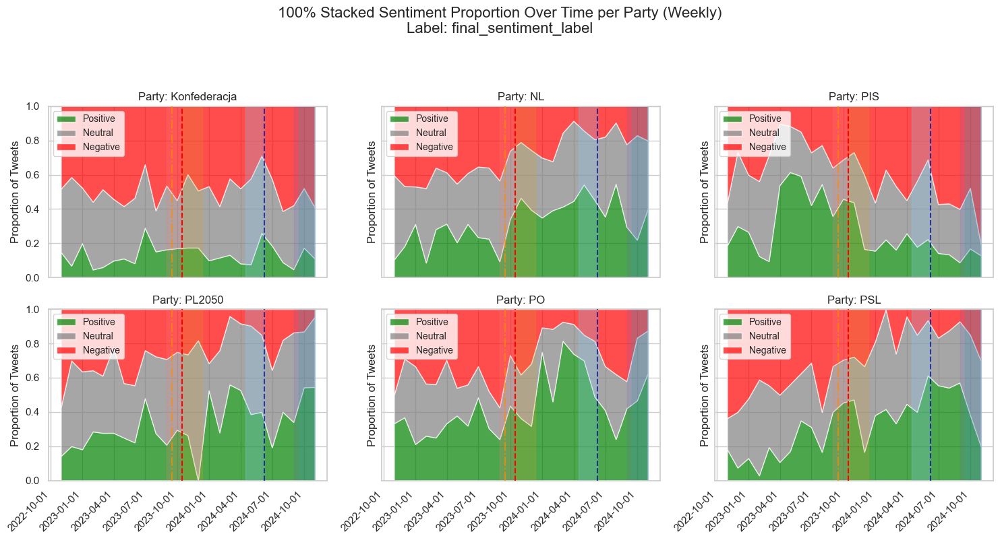


--- 100% Stacked Plotting Complete ---


In [120]:
# === Notebook Cell: Plot 100% STACKED Sentiment PROPORTIONS Over Time per Party ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import seaborn as sns # Keep seaborn for style consistency if desired
import traceback 
from datetime import datetime, timezone 
import numpy as np

print("\n" + "="*60)
print("--- Plotting 100% STACKED Sentiment PROPORTIONS Over Time per Party ---")
print("="*60)

# --- Configuration ---
time_frequency = 'M' # Aggregate by Week ('D'=Day, 'ME'=Month End)
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
parties_to_plot = None # List ['PartyA', 'PartyB'] or None for all
# Define order and colors for stacking (bottom to top in the list)
sentiments_to_plot = ['Positive', 'Neutral', 'Negative'] 
sentiment_colors = {'Positive': 'green', 'Neutral': 'grey', 'Negative': 'red'}
# --- Annotation Configuration ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2, 'add_lines': False},
    {'date': '2023-09-16', 'label': 'Poland Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.5 },
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25, 'add_lines': False },
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5 },
    {'start_date': '2024-09-15', 'end_date': '2024-10-31', 'label': 'PL Budget Debates / Q3 Econ. Data', 'color': 'lightseagreen', 'alpha': 0.2, 'add_lines': False },
    {'start_date': '2024-09-01', 'end_date': '2024-11-04', 'label': 'Peak US Presidential Election Campaign', 'color': 'slateblue', 'alpha': 0.15, 'add_lines': False},
]
main_election_date_str = '2023-10-15' 
show_pre_post_main_election_shading = True 
show_other_custom_annotations = True      
# --- End Annotation Configuration ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_plot_subset = df_sentiment_input.copy() 
        if parties_to_plot:
            df_plot_subset = df_plot_subset[df_plot_subset[party_col].isin(parties_to_plot)]
            print(f"Filtered data to include only parties: {parties_to_plot}")

        if df_plot_subset.empty:
             print("No data remaining after filtering.")
        else:
             # --- Data Preparation ---
             # Ensure 'created_at' is datetime and explicitly UTC 
             if not pd.api.types.is_datetime64_any_dtype(df_plot_subset[time_col]):
                 df_plot_subset[time_col] = pd.to_datetime(df_plot_subset[time_col], utc=True, errors='coerce')
             df_plot_subset = df_plot_subset.dropna(subset=[time_col])
             if df_plot_subset[time_col].dt.tz is None: df_plot_subset[time_col] = df_plot_subset[time_col].dt.tz_localize('UTC')
             elif df_plot_subset[time_col].dt.tz != timezone.utc: df_plot_subset[time_col] = df_plot_subset[time_col].dt.tz_convert('UTC')

             df_time_indexed = df_plot_subset.set_index(time_col)

             plot_freq = 'ME' if time_frequency == 'M' else time_frequency 
             if plot_freq == 'M': print("Warning: Using 'ME' (Month End) frequency instead of 'M'.")

             # Group by time, party, and sentiment, get counts, unstack
             sentiment_counts = df_time_indexed.groupby([pd.Grouper(freq=plot_freq), party_col, final_sentiment_col]) \
                                              .size().unstack(fill_value=0)

             # Ensure selected sentiment columns exist
             for sentiment in sentiments_to_plot:
                 if sentiment not in sentiment_counts.columns:
                     sentiment_counts[sentiment] = 0.0
             # Keep only selected columns
             sentiment_counts = sentiment_counts[[s for s in sentiments_to_plot if s in sentiment_counts.columns]]

             # Calculate proportions (row-wise sum is total per party per time period)
             # Add a small value to prevent division by zero if a party has zero tweets in a period
             total_counts_per_period = sentiment_counts.sum(axis=1)
             sentiment_proportions = sentiment_counts.divide(total_counts_per_period + 1e-9, axis=0).fillna(0)

             # Reset index to make time and party columns for plotting
             plot_data_stacked = sentiment_proportions.reset_index()

             print(f"\nData prepared for 100% stacked plot (proportions per {plot_freq}):")
             display(plot_data_stacked.head())

             if plot_data_stacked.empty:
                  print(f"No data available after resampling for frequency '{plot_freq}'.")
             else:
                  # --- Plotting ---
                  parties = plot_data_stacked[party_col].unique()
                  num_parties = len(parties)
                  num_facet_cols = min(num_parties, 3)
                  num_rows = int(np.ceil(num_parties / num_facet_cols))

                  print(f"\nGenerating 100% stacked area plot for {num_parties} parties...")

                  fig, axes = plt.subplots(num_rows, num_facet_cols, figsize=(num_facet_cols * 5, num_rows * 4), 
                                           sharex=True, sharey=True) # Share Y axis (0-1)
                  # Handle case where there's only one plot (axes is not an array)
                  if num_parties == 1:
                      axes = np.array([axes]) 
                  axes = axes.flatten() 

                  plot_colors_used = [sentiment_colors.get(s, 'grey') for s in sentiments_to_plot] 

                  for i, party in enumerate(parties):
                      ax = axes[i]
                      # Filter data for the current party and set time as index for stackplot
                      party_data = plot_data_stacked[plot_data_stacked[party_col] == party].set_index(time_col)
                      party_data = party_data[sentiments_to_plot] # Ensure correct order for stacking

                      if not party_data.empty:
                          x_values = party_data.index 
                          # Stackplot expects y values as a sequence of 1D arrays (one per category)
                          y_values = [party_data[col].values for col in party_data.columns] 

                          ax.stackplot(x_values, y_values, labels=party_data.columns, colors=plot_colors_used, alpha=0.7)

                          # --- Add Annotations to this subplot ---
                          plot_start_date = party_data.index.min()
                          plot_end_date = party_data.index.max()
                          election_date = pd.to_datetime(main_election_date_str, utc=True) if main_election_date_str else None
                          annotation_labels_used = set() # Reset for each subplot's legend

                          # Add Election Line/Shading (simplified for brevity, use full logic from previous plot if needed)
                          if election_date and plot_start_date <= election_date <= plot_end_date:
                              ax.axvline(election_date, color='red', linestyle='--', lw=1.5, zorder=10)
                          # Add Other Annotations (simplified example - add full loop if needed)
                          if annotations_list and show_other_custom_annotations:
                               for event in annotations_list:
                                   if 'date' in event:
                                       dt = pd.to_datetime(event['date'], utc=True)
                                       if plot_start_date <= dt <= plot_end_date:
                                            ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), alpha=0.7, zorder=9)
                                   elif 'start_date' in event: # Basic span plotting
                                        dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                                        if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                             span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                             if span_start < span_end: ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), zorder=1)
                          # --- End Simplified Annotations ---

                          ax.set_title(f"Party: {party}")
                          ax.legend(loc='upper left', fontsize='small')
                          ax.set_ylim(0, 1) 
                          ax.set_ylabel("Proportion of Tweets")
                          ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                          for label in ax.get_xticklabels(): # Rotate labels for this axis
                              label.set_rotation(45)
                              label.set_ha('right')

                      else:
                          ax.set_title(f"Party: {party} (No Data)")

                  # Hide unused axes
                  for j in range(i + 1, len(axes)):
                       fig.delaxes(axes[j])

                  fig.suptitle(f'100% Stacked Sentiment Proportion Over Time per Party ({freq_name})\nLabel: {final_sentiment_col}', fontsize=16, y=1.03)
                  # Use tight_layout BEFORE adjusting legend outside
                  plt.tight_layout(rect=[0, 0.03, 1, 0.97]) 
                  plt.show()

    except Exception as e:
        print(f"An error occurred during 100% stacked plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully.")

print("\n" + "="*60)
print(f"--- 100% Stacked Plotting Complete ---")
print("="*60)

1. Smoothed 100% Stacked Area Chart (Weekly/Monthly)

You felt weekly was too rough and monthly too coarse. Applying a moving average (smoothing) to the weekly proportion data before plotting is a great idea to see the underlying trends more clearly.

Is it a good idea? Yes, smoothing time series data like this is very common. It helps reduce noise and makes it easier to spot gradual shifts. We'll calculate weekly proportions and then apply a rolling average (e.g., over 4 weeks).


--- Plotting SMOOTHED 100% STACKED Sentiment PROPORTIONS (FIXED v2) ---
Applying 4-period rolling average (center=True)...

Smoothed data prepared for 100% stacked plot (proportions per W):


final_sentiment_label,created_at,party,Positive,Neutral,Negative
0,2022-10-16 00:00:00+00:00,PL2050,0.500000,0.166667,0.333333
1,2022-10-23 00:00:00+00:00,Konfederacja,0.175000,0.316667,0.508333
2,2022-10-23 00:00:00+00:00,NL,0.106250,0.528125,0.365625
3,2022-10-23 00:00:00+00:00,PIS,0.196429,0.258929,0.544643
4,2022-10-23 00:00:00+00:00,PL2050,0.333333,0.222222,0.444444



Generating SMOOTHED 100% stacked area plot for 6 parties...


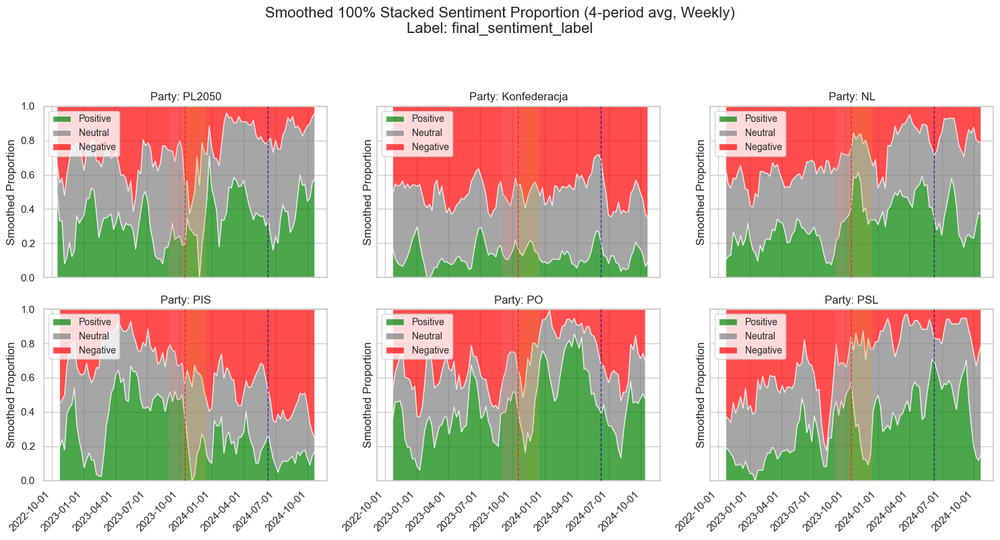


--- Smoothed Stacked Plotting Complete ---


In [132]:
# === Notebook Cell: Plot SMOOTHED 100% STACKED Sentiment PROPORTIONS Over Time per Party (FIXED v2) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import seaborn as sns 
import traceback 
from datetime import datetime, timezone 
import numpy as np

print("\n" + "="*60)
print("--- Plotting SMOOTHED 100% STACKED Sentiment PROPORTIONS (FIXED v2) ---")
print("="*60)

# --- Configuration ---
time_frequency = 'W' 
rolling_window = 4 
center_rolling = True 
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
parties_to_plot = None 
sentiments_to_plot = ['Positive', 'Neutral', 'Negative'] 
sentiment_colors = {'Positive': 'green', 'Neutral': 'grey', 'Negative': 'red'}
# --- Annotation Configuration --- (Assuming your full list is here)
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2},
    {'date': '2023-10-15', 'label': 'PL Election 2023', 'color': 'red', 'linestyle': '--'},
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2},
    {'date': '2024-06-09', 'label': 'EP Elections', 'color': 'darkblue', 'linestyle': '--'},
] # Add your full list
show_other_custom_annotations = True      
# --- End Annotation Configuration ---

plot_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_plot_subset = df_sentiment_input.copy() 
        if parties_to_plot:
            df_plot_subset = df_plot_subset[df_plot_subset[party_col].isin(parties_to_plot)]
            print(f"Filtered data to include only parties: {parties_to_plot}")

        if df_plot_subset.empty: print("No data remaining after filtering.")
        else:
             if not pd.api.types.is_datetime64_any_dtype(df_plot_subset[time_col]): df_plot_subset[time_col] = pd.to_datetime(df_plot_subset[time_col], utc=True, errors='coerce')
             df_plot_subset = df_plot_subset.dropna(subset=[time_col])
             if df_plot_subset[time_col].dt.tz is None: df_plot_subset[time_col] = df_plot_subset[time_col].dt.tz_localize('UTC')
             elif df_plot_subset[time_col].dt.tz != timezone.utc: df_plot_subset[time_col] = df_plot_subset[time_col].dt.tz_convert('UTC')
             
             plot_freq = time_frequency 
             
             sentiment_counts_grouped = df_plot_subset.groupby([
                 pd.Grouper(key=time_col, freq=plot_freq), 
                 party_col, 
                 final_sentiment_col
             ]).size()
             sentiment_counts_unstacked = sentiment_counts_grouped.unstack(level=final_sentiment_col, fill_value=0)
             
             for sentiment in sentiments_to_plot:
                 if sentiment not in sentiment_counts_unstacked.columns:
                     sentiment_counts_unstacked[sentiment] = 0.0
             sentiment_counts_for_prop = sentiment_counts_unstacked[[s for s in sentiments_to_plot if s in sentiment_counts_unstacked.columns]]

             total_counts_per_period = sentiment_counts_for_prop.sum(axis=1)
             sentiment_proportions = sentiment_counts_for_prop.divide(total_counts_per_period + 1e-9, axis=0).fillna(0)
             
             print(f"Applying {rolling_window}-period rolling average (center={center_rolling})...")
             
             # Apply rolling mean per party
             # The lambda x: x here refers to the sub-DataFrame for each party, 
             # which has a DatetimeIndex (time_col)
             sentiment_proportions_smooth = sentiment_proportions.groupby(level=party_col, group_keys=False) \
                                                                 .apply(lambda x: x.rolling(window=rolling_window, center=center_rolling, min_periods=1).mean()) \
                                                                 .fillna(0)
            
             # After groupby().apply(), the resulting index might be (party, time_col) or (time_col, party_col)
             # Let's ensure the names are what reset_index expects or reset specific levels
             # If the resulting index is (party, time), then .reset_index() should be fine.
             # If the error "cannot insert party, already exists" occurs, it means sentiment_proportions_smooth
             # already has a DATA column named 'party'. This is unexpected here.
             
             # Defensive check (though it shouldn't be necessary with correct groupby operations)
             if party_col in sentiment_proportions_smooth.columns:
                 print(f"WARNING: Column '{party_col}' detected in sentiment_proportions_smooth before reset_index. This is unusual.")
                 # Option: Drop it if it's a duplicate, or rename index level
                 # For now, let's try resetting specific levels if they exist by name
                 try:
                     plot_data_stacked = sentiment_proportions_smooth.reset_index(level=[time_col, party_col])
                 except KeyError: # If index levels are not named as expected
                     plot_data_stacked = sentiment_proportions_smooth.reset_index() # Fallback to default reset
             else:
                 plot_data_stacked = sentiment_proportions_smooth.reset_index()


             print(f"\nSmoothed data prepared for 100% stacked plot (proportions per {plot_freq}):")
             display(plot_data_stacked.head())
             
             if plot_data_stacked.empty: print(f"No data available after resampling/smoothing.")
             else:
                  # --- Plotting ---
                  parties = plot_data_stacked[party_col].unique()
                  num_parties = len(parties)
                  num_facet_cols = min(num_parties, 3)
                  num_rows = int(np.ceil(num_parties / num_facet_cols))
                  print(f"\nGenerating SMOOTHED 100% stacked area plot for {num_parties} parties...")
                  
                  fig, axes = plt.subplots(num_rows, num_facet_cols, figsize=(num_facet_cols * 5, num_rows * 4), sharex=True, sharey=True) 
                  if num_parties == 1: axes = np.array([axes]) 
                  axes = axes.flatten() 
                  
                  columns_actually_in_plot_data = [s for s in sentiments_to_plot if s in plot_data_stacked.columns]
                  plot_colors_used = [sentiment_colors.get(s, 'grey') for s in columns_actually_in_plot_data] 

                  for i, party_name in enumerate(parties):
                      ax = axes[i]
                      party_data = plot_data_stacked[plot_data_stacked[party_col] == party_name].set_index(time_col)
                      party_data_for_stack = party_data[columns_actually_in_plot_data] 
                      
                      if not party_data_for_stack.empty:
                          x_values = party_data_for_stack.index 
                          y_values = [party_data_for_stack[col].values for col in party_data_for_stack.columns] 
                          ax.stackplot(x_values, y_values, labels=party_data_for_stack.columns, colors=plot_colors_used, alpha=0.7)
                          
                          plot_start_date = party_data_for_stack.index.min(); plot_end_date = party_data_for_stack.index.max()
                          if annotations_list and show_other_custom_annotations:
                              # (Simplified annotation loop for brevity - use your full version)
                              for event in annotations_list:
                                  try:
                                      if 'date' in event:
                                          dt = pd.to_datetime(event['date'], utc=True)
                                          if plot_start_date <= dt <= plot_end_date: ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), alpha=0.7, zorder=9)
                                      elif 'start_date' in event: 
                                          dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                                          if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                              span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                              if span_start < span_end: ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), zorder=1)
                                  except Exception as e_ann: print(f"Warn: Annot err: {e_ann}")

                          ax.set_title(f"Party: {party_name}")
                          ax.legend(loc='upper left', fontsize='small')
                          ax.set_ylim(0, 1); ax.set_ylabel("Smoothed Proportion")
                          ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                          for label_tick in ax.get_xticklabels(): label_tick.set_rotation(45); label_tick.set_ha('right')
                      else: ax.set_title(f"Party: {party_name} (No Data)")

                  for j in range(i + 1, len(axes)): fig.delaxes(axes[j])
                  freq_name = "Weekly" if plot_freq == 'W' else "Monthly"
                  fig.suptitle(f'Smoothed 100% Stacked Sentiment Proportion ({rolling_window}-period avg, {freq_name})\nLabel: {final_sentiment_col}', fontsize=16, y=1.03)
                  plt.tight_layout(rect=[0, 0.03, 1, 0.97]) 
                  plt.show()

    except Exception as e: print(f"Error during smoothed stacked plot: {e}"); traceback.print_exc()
else: print("Skipping plot: Data not ready.")
print("\n" + "="*60); print(f"--- Smoothed Stacked Plotting Complete ---"); print("="*60)

2. You mentioned the tweet counts per party are very unbalanced over time. That's exactly why the Net Sentiment Score plot can be valuable!

Normalization is Built-in: The score is calculated as (Positive - Negative) / (Positive + Negative + Neutral). By dividing by the total number of relevant tweets in that period, it automatically accounts for volume fluctuations.
Focus on Polarity Balance: A score of +0.5 means the same thing (Positive tweets significantly outnumbered Negative ones within the discussion that occurred) whether the party had 10 tweets or 100 tweets that week. Similarly, a score near 0 indicates a balance between Positive and Negative (or high neutrality), regardless of the total count.
Clear Trend Signal: It gives you a single line per party, making it easy to see if a party's overall discourse balance shifted towards more positive or negative territory, even if their raw tweet count went up or down simultaneously.
Think of it this way:

The Counts Plot shows the raw volume of each sentiment.
The 100% Stacked Area Plot shows the internal percentage breakdown of sentiments.   
The Net Sentiment Score Plot shows the overall positive vs. negative balance, normalized for volume.
They all tell slightly different parts of the story, and looking at them together often gives the richest understanding. The Net Sentiment plot specifically helps overcome the scale differences you noticed in the raw count plots when comparing the polarity leanings between parties.


--- Plotting Net Sentiment Score Over Time (Colored Fill & Annotations) ---

Data prepared for net sentiment plot:


final_sentiment_label,created_at,party,net_sentiment_score
0,2022-10-16 00:00:00+00:00,PL2050,1.000000
1,2022-10-23 00:00:00+00:00,Konfederacja,-0.166667
2,2022-10-23 00:00:00+00:00,NL,-0.468750
3,2022-10-23 00:00:00+00:00,PIS,-0.571429
4,2022-10-23 00:00:00+00:00,PL2050,-0.666667



Generating Per-Party Net Sentiment Plot...


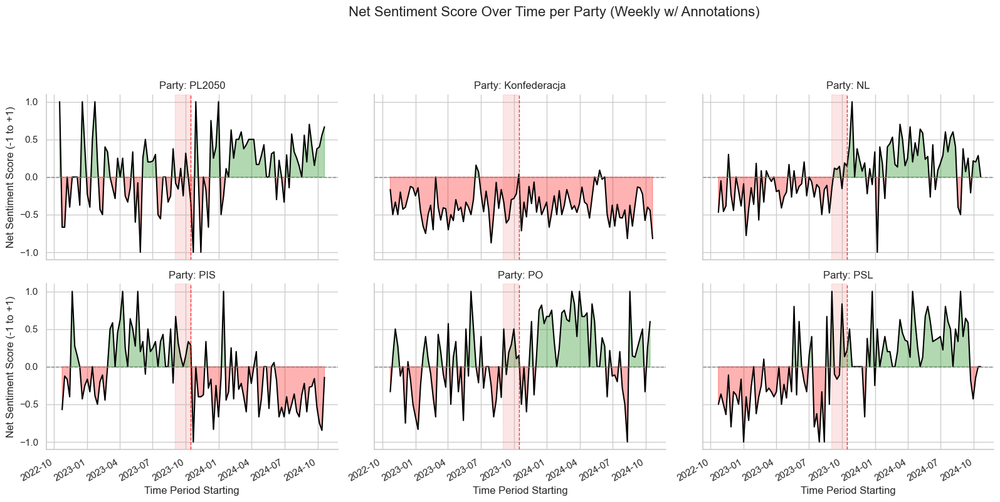


--- Net Sentiment Plotting Complete ---


In [131]:
# === Notebook Cell: Plot NET Sentiment Score Over Time (Colored Fill & Annotations) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import traceback 
from datetime import datetime, timezone 
import numpy as np

print("\n" + "="*60)
print("--- Plotting Net Sentiment Score Over Time (Colored Fill & Annotations) ---")
print("="*60)

# --- Configuration ---
time_frequency = 'W' # Or 'ME'
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
# --- Annotation Configuration ---
annotations_list = [ # Use your full list
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2},
    {'date': '2023-10-15', 'label': 'PL Election 2023', 'color': 'red', 'linestyle': '--'},
    # ... add all other annotations ...
]
main_election_date_str = '2023-10-15' # Included in list above
show_pre_post_main_election_shading = False # Use spans instead
show_other_custom_annotations = True      
# --- End Annotation Configuration ---

plot_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        # --- Data Preparation ---
        df_plot = df_sentiment_input.copy()
        # Ensure UTC
        if not pd.api.types.is_datetime64_any_dtype(df_plot[time_col]): df_plot[time_col] = pd.to_datetime(df_plot[time_col], utc=True, errors='coerce')
        df_plot = df_plot.dropna(subset=[time_col])
        if df_plot[time_col].dt.tz is None: df_plot[time_col] = df_plot[time_col].dt.tz_localize('UTC')
        elif df_plot[time_col].dt.tz != timezone.utc: df_plot[time_col] = df_plot[time_col].dt.tz_convert('UTC')
        df_time_indexed = df_plot.set_index(time_col)

        plot_freq = 'ME' if time_frequency == 'M' else time_frequency
        if plot_freq == 'M': print("Warning: Using 'ME' (Month End) frequency.")
        
        sentiment_counts = df_time_indexed.groupby([pd.Grouper(freq=plot_freq), party_col, final_sentiment_col]) \
                                         .size().unstack(fill_value=0)
        for sentiment in ['Positive', 'Negative', 'Neutral']:
            if sentiment not in sentiment_counts.columns: sentiment_counts[sentiment] = 0
        sentiment_counts['total_pnn'] = sentiment_counts['Positive'] + sentiment_counts['Negative'] + sentiment_counts['Neutral']
        epsilon = 1e-9 
        sentiment_counts['net_sentiment_score'] = \
            (sentiment_counts['Positive'] - sentiment_counts['Negative']) / (sentiment_counts['total_pnn'] + epsilon)
        plot_data_net = sentiment_counts[['net_sentiment_score']].reset_index()
        
        print("\nData prepared for net sentiment plot:")
        display(plot_data_net.head())

        if plot_data_net.empty: print(f"No data available after resampling for frequency '{plot_freq}'.")
        else:
             # --- Plotting Per-Party Net Sentiment with Colored Fill & Annotations---
             print("\nGenerating Per-Party Net Sentiment Plot...")
             num_parties = plot_data_net[party_col].nunique()
             num_facet_cols = min(num_parties, 3)

             g = sns.relplot(
                 data=plot_data_net, x=time_col, y='net_sentiment_score', 
                 kind='line', col=party_col, col_wrap=num_facet_cols, 
                 height=4, aspect=1.5, color='black', linewidth=1.5, # Use neutral line color
                 legend=False, facet_kws={'sharey': True, 'sharex': True} 
             )
             
             # --- Add Colored Fill and Annotations to each axis ---
             annotation_labels_used_global = set() # Track labels used across facets for main legend
             
             for ax in g.axes.flat:
                 # Get data for this specific facet/axis
                 title_text = ax.get_title() # e.g., "party = Konfederacja"
                 if not title_text or party_col not in title_text: continue # Skip if title is weird
                 current_party = title_text.split('=')[-1].strip()
                 party_data = plot_data_net[plot_data_net[party_col] == current_party]
                 
                 if party_data.empty: continue
                 
                 x_vals = party_data[time_col]
                 y_vals = party_data['net_sentiment_score']

                 # Add colored fill based on value
                 ax.fill_between(x_vals, y_vals, 0, where=y_vals >= 0, color='green', alpha=0.3, interpolate=True)
                 ax.fill_between(x_vals, y_vals, 0, where=y_vals < 0, color='red', alpha=0.3, interpolate=True)
                 
                 # Add horizontal line at 0
                 ax.axhline(0, color='grey', linestyle='--', linewidth=1, zorder=10)
                 
                 # --- Add Annotations (Simplified, use full loop if needed) ---
                 plot_start_date = x_vals.min(); plot_end_date = x_vals.max()
                 if annotations_list and show_other_custom_annotations:
                    for event in annotations_list:
                         label=event.get('label', 'Annotation')
                         try:
                              if 'date' in event:
                                   dt = pd.to_datetime(event['date'], utc=True)
                                   if plot_start_date <= dt <= plot_end_date:
                                        current_label = label if label not in annotation_labels_used_global else None
                                        ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), label=current_label, zorder=9, alpha=0.8)
                                        if current_label: annotation_labels_used_global.add(label)
                              elif 'start_date' in event:
                                   dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                                   if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                        current_label = label if label not in annotation_labels_used_global else None
                                        span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                        if span_start < span_end: 
                                             ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), label=current_label, zorder=1)
                                             if current_label: annotation_labels_used_global.add(label)
                         except Exception as e_ann: print(f"Warn annot {label}: {e_ann}")
                 # --- End Annotations ---

             # Final formatting for the whole figure
             g.set_titles("Party: {col_name}") 
             g.set_axis_labels("Time Period Starting" if plot_freq=='W' else "Month End", "Net Sentiment Score (-1 to +1)") 
             g.set(ylim=(-1.1, 1.1)) 
             g.fig.suptitle(f'Net Sentiment Score Over Time per Party ({freq_name} w/ Annotations)', fontsize=16, y=1.03)
             g.fig.autofmt_xdate() 
             
             # Add a consolidated legend for annotations if any were added with labels
             handles, labels = plt.gca().get_legend_handles_labels() # Get handles from last axes
             if handles: # Only add legend if there are labeled annotations
                  by_label = dict(zip(labels, handles))
                  g.add_legend(by_label, title="Events", loc='upper left', bbox_to_anchor=(1.01, 1.0))

             plt.tight_layout(rect=[0, 0.03, 0.9, 0.95]) # Adjust right margin for legend
             plt.show()

    except Exception as e: print(f"Error during net sentiment plot: {e}"); traceback.print_exc()
else: print("Skipping plot: Data not ready.")
print("\n" + "="*60); print("--- Net Sentiment Plotting Complete ---"); print("="*60)

3. Before vs. After Election Comparison Plot

This plot will show the total counts of Positive, Negative, and Neutral tweets for each party, comparing the period before the election (2023-10-15) to the period after.




--- Sentiment Counts per Party - BEFORE Election ---
Filtering data BEFORE 2023-10-15

Counts Before Election:


final_sentiment_label,Positive,Negative,Neutral
party,,,
Konfederacja,100,354,265
NL,167,283,261
PIS,167,117,132
PL2050,101,117,153
PO,171,193,139
PSL,93,177,129



Generating plot for BEFORE election...


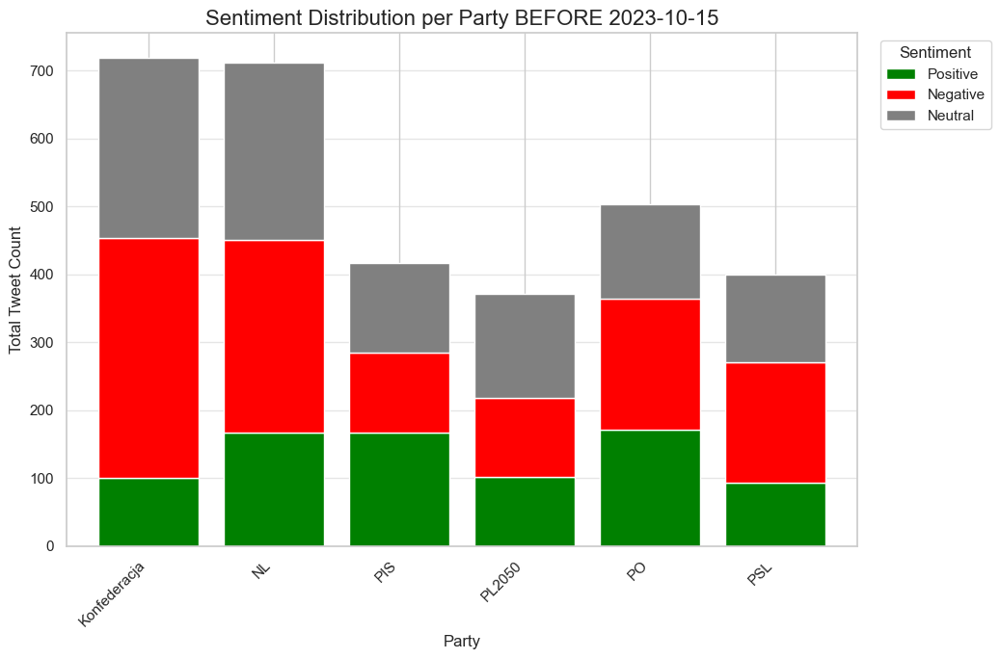


--- BEFORE Election Plotting Complete ---

--- Sentiment Counts per Party - AFTER Election ---
Filtering data ON or AFTER 2023-10-15

Counts On/After Election:


final_sentiment_label,Positive,Negative,Neutral
party,,,
Konfederacja,132,464,378
NL,208,94,211
PIS,81,244,163
PL2050,157,61,164
PO,167,75,88
PSL,124,38,121



Generating plot for AFTER election...


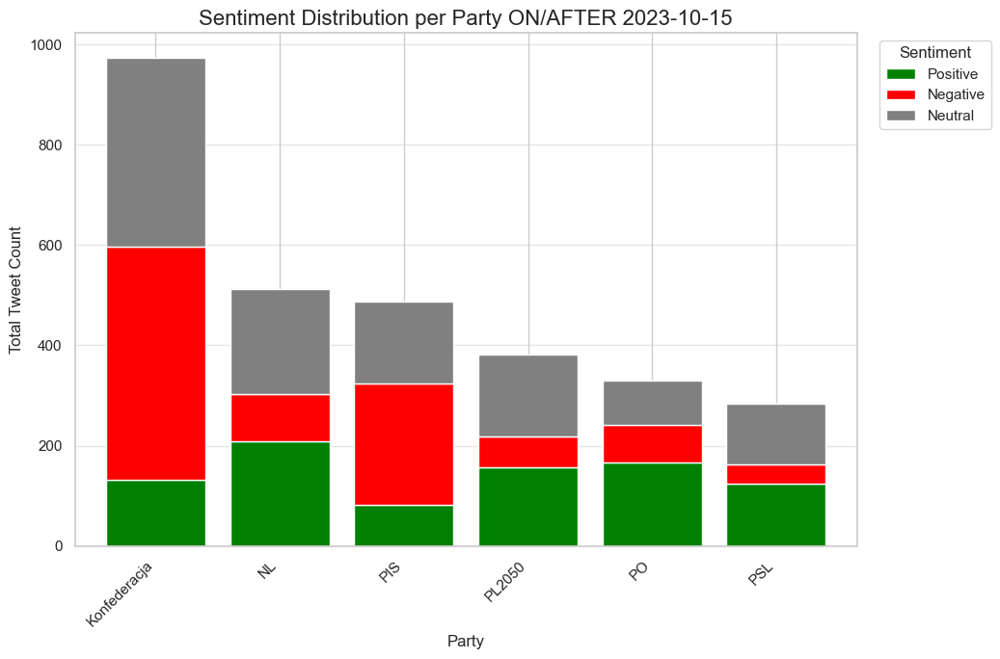


--- AFTER Election Plotting Complete ---


In [124]:
# === Notebook Cell: BEFORE Election Sentiment Counts per Party ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback 
import numpy as np 
from datetime import datetime, timezone

print("\n" + "="*60)
print("--- Sentiment Counts per Party - BEFORE Election ---")
print("="*60)

# --- Configuration ---
election_date_str = '2023-10-15'
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
sentiments_to_compare = ['Positive', 'Negative', 'Neutral']
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}
# ---

plot_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready and election_date_str:
    try:
        df_comp = df_sentiment_input.copy()
        # Ensure datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_comp[time_col]): df_comp[time_col] = pd.to_datetime(df_comp[time_col], utc=True, errors='coerce')
        df_comp = df_comp.dropna(subset=[time_col])
        if df_comp[time_col].dt.tz is None: df_comp[time_col] = df_comp[time_col].dt.tz_localize('UTC')
        elif df_comp[time_col].dt.tz != timezone.utc: df_comp[time_col] = df_comp[time_col].dt.tz_convert('UTC')
        
        election_date = pd.to_datetime(election_date_str, utc=True)
        print(f"Filtering data BEFORE {election_date_str}")
        
        # --- Filter for BEFORE period ---
        df_before = df_comp[df_comp[time_col] < election_date].copy()

        if df_before.empty:
            print("No data found before the election date.")
        else:
            # Calculate counts per party and sentiment for the BEFORE period
            counts_before = df_before.groupby([party_col, final_sentiment_col]) \
                                     .size() \
                                     .unstack(fill_value=0)
            
            # Ensure P/N/N columns exist and select them
            for sentiment in sentiments_to_compare:
                if sentiment not in counts_before.columns: counts_before[sentiment] = 0
            counts_before = counts_before[[s for s in sentiments_to_compare if s in counts_before.columns]] # Use desired order
            
            print("\nCounts Before Election:")
            display(counts_before)

            # --- Plotting (Stacked Bar) ---
            print("\nGenerating plot for BEFORE election...")
            ax = counts_before.plot(kind='bar', stacked=True, 
                                    color=[sentiment_colors.get(s,'grey') for s in counts_before.columns],
                                    figsize=(12, 7), width=0.8)

            plt.title(f'Sentiment Distribution per Party BEFORE {election_date_str}', fontsize=16)
            plt.xlabel('Party')
            plt.ylabel('Total Tweet Count')
            plt.xticks(rotation=45, ha='right')
            plt.legend(title='Sentiment', bbox_to_anchor=(1.02, 1), loc='upper left')
            plt.grid(True, axis='y', alpha=0.5)
            plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust for legend
            plt.show()
            
    except Exception as e: print(f"Error generating BEFORE plot: {e}"); traceback.print_exc()
else: print("Skipping plot: Data not ready or election date missing.")
print("\n" + "="*60); print("--- BEFORE Election Plotting Complete ---"); print("="*60)


# === Notebook Cell: AFTER Election Sentiment Counts per Party ===
# (This cell is very similar to the one above, just filtering for >= election_date)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback 
import numpy as np 
from datetime import datetime, timezone

print("\n" + "="*60)
print("--- Sentiment Counts per Party - AFTER Election ---")
print("="*60)

# --- Configuration ---
election_date_str = '2023-10-15'
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
sentiments_to_compare = ['Positive', 'Negative', 'Neutral']
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}
# ---

# Check data readiness (same check as before)
plot_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready and election_date_str:
    try:
        df_comp = df_sentiment_input.copy()
        # Ensure datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_comp[time_col]): df_comp[time_col] = pd.to_datetime(df_comp[time_col], utc=True, errors='coerce')
        df_comp = df_comp.dropna(subset=[time_col])
        if df_comp[time_col].dt.tz is None: df_comp[time_col] = df_comp[time_col].dt.tz_localize('UTC')
        elif df_comp[time_col].dt.tz != timezone.utc: df_comp[time_col] = df_comp[time_col].dt.tz_convert('UTC')
        
        election_date = pd.to_datetime(election_date_str, utc=True)
        print(f"Filtering data ON or AFTER {election_date_str}")
        
        # --- Filter for AFTER period ---
        df_after = df_comp[df_comp[time_col] >= election_date].copy()

        if df_after.empty:
            print("No data found on or after the election date.")
        else:
            # Calculate counts per party and sentiment for the AFTER period
            counts_after = df_after.groupby([party_col, final_sentiment_col]) \
                                    .size() \
                                    .unstack(fill_value=0)
            
            # Ensure P/N/N columns exist and select them
            for sentiment in sentiments_to_compare:
                if sentiment not in counts_after.columns: counts_after[sentiment] = 0
            counts_after = counts_after[[s for s in sentiments_to_compare if s in counts_after.columns]]
            
            print("\nCounts On/After Election:")
            display(counts_after)

            # --- Plotting (Stacked Bar) ---
            print("\nGenerating plot for AFTER election...")
            ax = counts_after.plot(kind='bar', stacked=True, 
                                   color=[sentiment_colors.get(s,'grey') for s in counts_after.columns],
                                   figsize=(12, 7), width=0.8)

            plt.title(f'Sentiment Distribution per Party ON/AFTER {election_date_str}', fontsize=16)
            plt.xlabel('Party')
            plt.ylabel('Total Tweet Count')
            plt.xticks(rotation=45, ha='right')
            plt.legend(title='Sentiment', bbox_to_anchor=(1.02, 1), loc='upper left')
            plt.grid(True, axis='y', alpha=0.5)
            plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust for legend
            plt.show()
            
    except Exception as e: print(f"Error generating AFTER plot: {e}"); traceback.print_exc()
else: print("Skipping plot: Data not ready or election date missing.")
print("\n" + "="*60); print("--- AFTER Election Plotting Complete ---"); print("="*60)


# --- Optional: Revisit Grouped Bar Plot for Direct Comparison ---
# The code for the faceted grouped bar plot (response #25) directly compares 
# 'Before' vs 'After' counts for each Sentiment within each Party facet. 
# If the two separate plots above aren't sufficient, that approach provides 
# the most direct visual comparison of the *change* per sentiment per party.
# Let me know if you want that code block again.
# -------------------------------------------------------------------

In [128]:
df_sentiment_input

,id,text_clean_en_demojized,created_at,party,username,matched_keywords_FILTERED,extracted_terms_FILTERED,text_clean_en,sentiment_cardiffnlp_emoji_label,sentiment_cardiffnlp_emoji_score_best,...,sentiment_cardiffnlp_demoji_score_best,sentiment_cardiffnlp_demoji_score_neg,sentiment_cardiffnlp_demoji_score_neu,sentiment_cardiffnlp_demoji_score_pos,sentiment_finbert_demoji_label,sentiment_finbert_demoji_score_best,sentiment_finbert_demoji_score_neg,sentiment_finbert_demoji_score_neu,sentiment_finbert_demoji_score_pos,final_sentiment_label
0,1846161400328028160,:cross_mark: We are a year after the elections...,2024-10-15 12:09:12+00:00,Konfederacja,bartlomiejpejo,"[crisis, demand]","[crisis, demands]","❌ We are a year after the elections, and Polan...",Negative,0.803830,...,0.816410,0.816410,0.174771,0.008819,Neutral,0.785302,0.041167,0.785302,0.173532,Negative
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,2024-10-14 07:16:01+00:00,Konfederacja,bartlomiejpejo,[fund],[funded],Poland is soon to launch 49 EU-funded Foreigne...,Neutral,0.716946,...,0.716946,0.006587,0.716946,0.276467,Neutral,0.711673,0.014701,0.711673,0.273627,Neutral
2,1844415548211245312,Listening to the statement of Deputy Minister ...,2024-10-10 16:31:48+00:00,Konfederacja,bartlomiejpejo,[fund],[funds],Listening to the statement of Deputy Minister ...,Neutral,0.646243,...,0.646243,0.333890,0.646243,0.019867,Neutral,0.813761,0.023739,0.813761,0.162500,Neutral
3,1843984045073428992,Local government investments are crucial for r...,2024-10-09 11:57:10+00:00,Konfederacja,bartlomiejpejo,[investment],[investments],Local government investments are crucial for r...,Neutral,0.545010,...,0.545010,0.363077,0.545010,0.091912,Neutral,0.434723,0.266388,0.434723,0.298889,Neutral
4,1843740048350691584,We talked about the trends and challenges of t...,2024-10-08 19:47:37+00:00,Konfederacja,bartlomiejpejo,[market],[market],We talked about the trends and challenges of t...,Positive,0.787233,...,0.787233,0.003708,0.209059,0.787233,Neutral,0.799829,0.011726,0.799829,0.188445,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6084,1622276457975222272,"Dear Minister of Coal and Straw, if you had li...",2023-02-05 16:50:22+00:00,PSL,StefanKrajewski,"[market, import]","[imported, market]","Dear Minister of Coal and Straw, if you had li...",Negative,0.503983,...,0.564069,0.564069,0.414973,0.020958,Negative,0.930797,0.930797,0.057035,0.012168,Negative
6085,1621767127660220416,In the majesty of the law and stealing from Po...,2023-02-04 07:06:28+00:00,PSL,StefanKrajewski,"[energy, state-owned companies]","[energy, state-owned companies]",In the majesty of the law and stealing from Po...,Negative,0.898026,...,0.898026,0.898026,0.093379,0.008595,Negative,0.665957,0.665957,0.310907,0.023136,Negative
6086,1618902451620573184,9th Beef Sector Forum - we met among producers...,2023-01-27 09:23:16+00:00,PSL,StefanKrajewski,[sector],[Sector],9th Beef Sector Forum - we met among producers...,Positive,0.778472,...,0.621158,0.007121,0.371721,0.621158,Neutral,0.556230,0.011549,0.556230,0.432221,Positive
6087,1612071495026483200,The difference is that PKN Orlen has a 49.9% s...,2023-01-08 12:59:29+00:00,PSL,StefanKrajewski,[treasury],[Treasury],The difference is that PKN Orlen has a 49.9% s...,Neutral,0.586729,...,0.586729,0.344122,0.586729,0.069149,Neutral,0.860346,0.073162,0.860346,0.066492,Neutral



--- COMBINED Sentiment Before vs. After Election (Faceted Grouped Stacked Bars) ---
Election date cutoff: 2023-10-15

Data prepared for Combined Before/After comparison:


,party,Period,final_sentiment_label,count
0,Konfederacja,AE (After),Negative,464
1,Konfederacja,AE (After),Neutral,378
2,Konfederacja,AE (After),Positive,132
3,Konfederacja,BE (Before),Negative,354
4,Konfederacja,BE (Before),Neutral,265



Generating faceted grouped stacked bar plot for 6 parties...


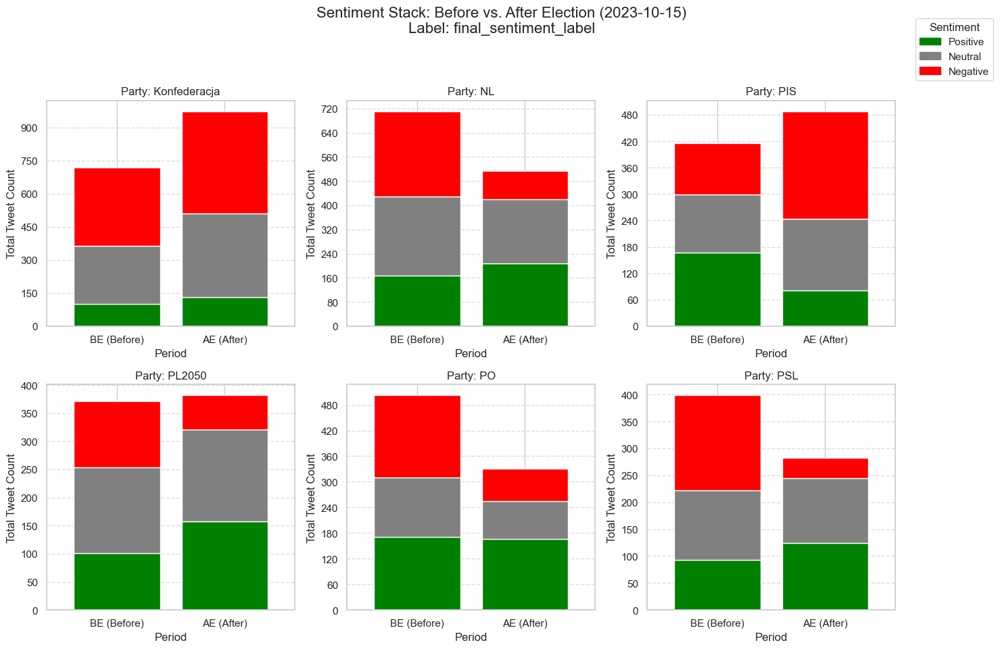


--- COMBINED Before/After Plotting Complete ---


In [135]:
# === Notebook Cell: COMBINED Before vs. After Election (Faceted Grouped Stacked Bars) ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback 
import numpy as np 
from datetime import datetime, timezone
import matplotlib.ticker as mticker # For integer ticks

print("\n" + "="*60)
print("--- COMBINED Sentiment Before vs. After Election (Faceted Grouped Stacked Bars) ---")
print("="*60)

# --- Configuration ---
election_date_str = '2023-10-15'
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
# Order for stacking and legend (bottom to top)
sentiments_for_stacking = ['Positive', 'Neutral', 'Negative'] 
# Colors for P/N/N (ensure keys match sentiments_for_stacking)
sentiment_colors = {'Positive': 'green', 'Neutral': 'grey', 'Negative': 'red'} 
# ---

plot_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready and election_date_str:
    try:
        df_comp = df_sentiment_input.copy()
        # Ensure datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_comp[time_col]): df_comp[time_col] = pd.to_datetime(df_comp[time_col], utc=True, errors='coerce')
        df_comp = df_comp.dropna(subset=[time_col])
        if df_comp[time_col].dt.tz is None: df_comp[time_col] = df_comp[time_col].dt.tz_localize('UTC')
        elif df_comp[time_col].dt.tz != timezone.utc: df_comp[time_col] = df_comp[time_col].dt.tz_convert('UTC')
        
        election_date = pd.to_datetime(election_date_str, utc=True)
        print(f"Election date cutoff: {election_date.strftime('%Y-%m-%d')}")

        # Add a 'Period' column: 'BE (Before)' or 'AE (After)'
        df_comp['Period'] = np.where(df_comp[time_col] < election_date, 'BE (Before)', 'AE (After)')
        period_order = ['BE (Before)', 'AE (After)'] # For consistent order on x-axis
        
        # Filter data to only include specified sentiments for stacking
        df_comp_filtered = df_comp[df_comp[final_sentiment_col].isin(sentiments_for_stacking)]

        # Calculate counts per party, period, and sentiment
        comparison_counts = df_comp_filtered.groupby([party_col, 'Period', final_sentiment_col]) \
                                           .size() \
                                           .reset_index(name='count')

        print("\nData prepared for Combined Before/After comparison:")
        display(comparison_counts.head())

        if comparison_counts.empty:
             print("No data available after grouping for comparison plot.")
        else:
             # --- Plotting with Seaborn Facets (Grouped Stacked Bar Plot) ---
             parties = sorted(comparison_counts[party_col].unique()) # Sort parties for consistent facet order
             num_parties = len(parties)
             num_facet_cols = min(num_parties, 3) # Adjust for layout
             num_rows = int(np.ceil(num_parties / num_facet_cols))
             
             print(f"\nGenerating faceted grouped stacked bar plot for {num_parties} parties...")

             fig, axes = plt.subplots(num_rows, num_facet_cols, 
                                      figsize=(num_facet_cols * 5, num_rows * 5), 
                                      sharey=False, squeeze=False) # Ensure axes is always 2D array
             axes = axes.flatten() # Flatten for easy iteration

             # Create a common legend
             legend_handles = [plt.Rectangle((0,0),1,1, color=sentiment_colors[s]) for s in sentiments_for_stacking]
             legend_labels = sentiments_for_stacking

             for i, current_party_name in enumerate(parties):
                 ax = axes[i]
                 party_data = comparison_counts[comparison_counts[party_col] == current_party_name]
                 
                 # Pivot for stacked bar: Index=Period, Columns=Sentiment, Values=count
                 pivot_df = party_data.pivot_table(index='Period', 
                                                   columns=final_sentiment_col, 
                                                   values='count', 
                                                   fill_value=0)
                 
                 # Reindex to ensure 'BE (Before)' and 'AE (After)' are present and in order
                 pivot_df = pivot_df.reindex(period_order, fill_value=0)
                 
                 # Ensure desired sentiment order for stacking and add missing columns with 0
                 for sent in sentiments_for_stacking:
                     if sent not in pivot_df.columns:
                         pivot_df[sent] = 0
                 pivot_df = pivot_df[sentiments_for_stacking] # Enforce order P, N, Neu

                 # Use pandas plotting for stacked bar on this axis
                 pivot_df.plot(kind='bar', stacked=True, ax=ax, 
                               color=[sentiment_colors.get(s,'grey') for s in pivot_df.columns],
                               width=0.8, legend=False) # Turn off individual legends
                 
                 ax.set_title(f"Party: {current_party_name}")
                 ax.set_ylabel("Total Tweet Count")
                 ax.set_xlabel("Period")
                 ax.tick_params(axis='x', rotation=0) # Keep 'BE', 'AE' horizontal
                 ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True)) # Integer Y-axis
                 ax.set_ylim(bottom=0)
                 ax.grid(axis='y', linestyle='--', alpha=0.7)

             # Hide any unused subplots
             for j in range(num_parties, len(axes)):
                 fig.delaxes(axes[j])

             # Add a single figure-level legend
             fig.legend(handles=legend_handles, labels=legend_labels, 
                        title="Sentiment", loc="upper right", 
                        bbox_to_anchor=(0.99, 0.98)) # Adjust bbox to place it neatly

             fig.suptitle(f'Sentiment Stack: Before vs. After Election ({election_date.strftime("%Y-%m-%d")})\nLabel: {final_sentiment_col}', 
                          fontsize=16, y=0.99) # Adjust y if suptitle overlaps legend
             
             # Adjust layout to prevent overlap - may need fine-tuning
             plt.tight_layout(rect=[0, 0.03, 0.9, 0.95]) # Leave space on right for legend
             plt.show()
             
             # For a "line indicating change", you'd calculate numerical differences 
             # (e.g., P_after - P_before) and perhaps display them in a table or a separate plot.
             # This plot visually shows the change through the bar heights.

    except Exception as e: print(f"Error generating COMBINED Before/After plot: {e}"); traceback.print_exc()
else: 
    if not plot_data_ready: print("Skipping plot: Data not prepared successfully.")
    elif not election_date_str: print("Skipping plot: Election date not specified.")
print("\n" + "="*60); print("--- COMBINED Before/After Plotting Complete ---"); print("="*60)


--- COMBINED Positive/Negative Sentiment Before vs. After Election per Party ---
Election date cutoff: 2023-10-15

Data prepared for Positive/Negative Before/After comparison:


,party,Period,final_sentiment_label,count
0,Konfederacja,AE (After),Negative,464
1,Konfederacja,AE (After),Positive,132
2,Konfederacja,BE (Before),Negative,354
3,Konfederacja,BE (Before),Positive,100
4,NL,AE (After),Negative,94



Generating faceted grouped stacked bar plot for 6 parties (Pos/Neg only)...


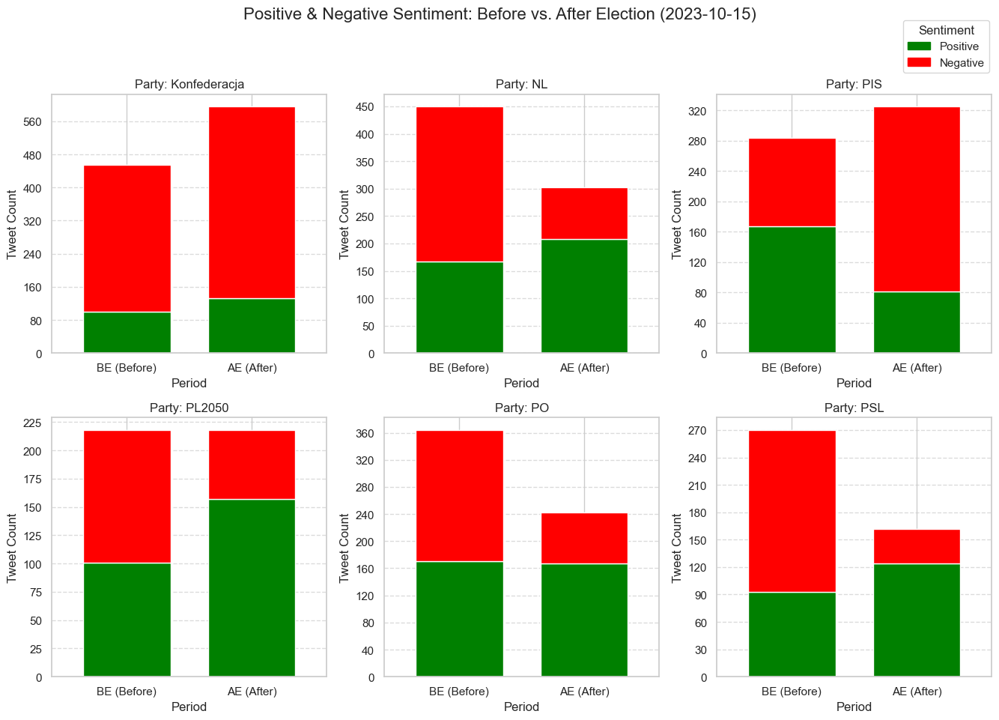


--- Pos/Neg Before/After Plotting Complete ---


In [136]:
# === Notebook Cell: COMBINED Before vs. After Election (Positive & Negative Only Stacked Bars) ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns # Seaborn is not strictly needed for pandas plot, but good for style consistency
import traceback 
import numpy as np 
from datetime import datetime, timezone
import matplotlib.ticker as mticker # For integer ticks

print("\n" + "="*60)
print("--- COMBINED Positive/Negative Sentiment Before vs. After Election per Party ---")
print("="*60)

# --- Configuration ---
election_date_str = '2023-10-15'
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
# *** Focus only on Positive and Negative for this plot ***
sentiments_to_stack = ['Positive', 'Negative'] 
# Define colors for these sentiments
sentiment_colors = {'Positive': 'green', 'Negative': 'red'} 
# ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and 
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and 
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready and election_date_str:
    try:
        df_comp = df_sentiment_input.copy()
        # Ensure datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_comp[time_col]): 
            df_comp[time_col] = pd.to_datetime(df_comp[time_col], utc=True, errors='coerce')
        df_comp = df_comp.dropna(subset=[time_col])
        if df_comp[time_col].dt.tz is None: 
            df_comp[time_col] = df_comp[time_col].dt.tz_localize('UTC')
        elif df_comp[time_col].dt.tz != timezone.utc: 
            df_comp[time_col] = df_comp[time_col].dt.tz_convert('UTC')
        
        election_date = pd.to_datetime(election_date_str, utc=True)
        print(f"Election date cutoff: {election_date.strftime('%Y-%m-%d')}")

        # Add a 'Period' column: 'BE (Before)' or 'AE (After)'
        df_comp['Period'] = np.where(df_comp[time_col] < election_date, 'BE (Before)', 'AE (After)')
        period_order = ['BE (Before)', 'AE (After)'] # For consistent order on x-axis
        
        # *** Filter data to only include Positive and Negative sentiments ***
        df_comp_filtered = df_comp[df_comp[final_sentiment_col].isin(sentiments_to_stack)]

        # Calculate counts per party, period, and the filtered sentiments
        comparison_counts = df_comp_filtered.groupby([party_col, 'Period', final_sentiment_col]) \
                                           .size() \
                                           .reset_index(name='count')

        print("\nData prepared for Positive/Negative Before/After comparison:")
        display(comparison_counts.head())

        if comparison_counts.empty:
             print("No Positive or Negative data available after grouping for comparison plot.")
        else:
             parties = sorted(comparison_counts[party_col].unique())
             num_parties = len(parties)
             num_facet_cols = min(num_parties, 3) 
             num_rows = int(np.ceil(num_parties / num_facet_cols))
             
             print(f"\nGenerating faceted grouped stacked bar plot for {num_parties} parties (Pos/Neg only)...")

             fig, axes = plt.subplots(num_rows, num_facet_cols, 
                                      figsize=(num_facet_cols * 4.5, num_rows * 5), 
                                      sharey=False, squeeze=False) 
             axes = axes.flatten() 

             # Prepare legend handles and labels once
             legend_handles = [plt.Rectangle((0,0),1,1, color=sentiment_colors[s]) for s in sentiments_to_stack if s in sentiment_colors]
             legend_labels = [s for s in sentiments_to_stack if s in sentiment_colors]

             for i, current_party_name in enumerate(parties):
                 ax = axes[i]
                 party_data = comparison_counts[comparison_counts[party_col] == current_party_name]
                 
                 pivot_df = party_data.pivot_table(index='Period', 
                                                   columns=final_sentiment_col, 
                                                   values='count', 
                                                   fill_value=0)
                 
                 pivot_df = pivot_df.reindex(period_order, fill_value=0) # Ensure BE then AE
                 
                 # Ensure only Positive and Negative columns exist and in order for stacking
                 plot_cols_ordered = [s for s in sentiments_to_stack if s in pivot_df.columns]
                 pivot_df = pivot_df[plot_cols_ordered]
                 
                 plot_colors_used = [sentiment_colors.get(s,'grey') for s in pivot_df.columns]

                 if not pivot_df.empty:
                     pivot_df.plot(kind='bar', stacked=True, ax=ax, 
                                   color=plot_colors_used,
                                   width=0.7, legend=False) 
                 
                 ax.set_title(f"Party: {current_party_name}")
                 ax.set_ylabel("Tweet Count")
                 ax.set_xlabel("Period")
                 ax.tick_params(axis='x', rotation=0) 
                 ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
                 ax.set_ylim(bottom=0)
                 ax.grid(axis='y', linestyle='--', alpha=0.7)

             for j in range(num_parties, len(axes)): # Hide unused subplots
                 fig.delaxes(axes[j])

             fig.legend(handles=legend_handles, labels=legend_labels, 
                        title="Sentiment", loc="upper right", 
                        bbox_to_anchor=(0.99, 0.98)) 

             fig.suptitle(f'Positive & Negative Sentiment: Before vs. After Election ({election_date.strftime("%Y-%m-%d")})', 
                          fontsize=16, y=0.99) 
             
             plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
             plt.show()
             
    except Exception as e: print(f"Error generating Pos/Neg Before/After plot: {e}"); traceback.print_exc()
else: 
    if not plot_data_ready: print("Skipping plot: Data not prepared successfully.")
    elif not election_date_str: print("Skipping plot: Election date not specified.")
print("\n" + "="*60); print("--- Pos/Neg Before/After Plotting Complete ---"); print("="*60)

In [138]:
# === Notebook Cell: Calculate Numerical Change Before vs. After Election (FIXED) ===
import pandas as pd
import numpy as np
import traceback 
from datetime import datetime, timezone # Ensure timezone is imported

print("\n" + "="*60)
print("--- Calculating Sentiment Change Before vs. After Election (FIXED) ---")
print("="*60)

# --- Configuration (should match the plot above) ---
election_date_str = '2023-10-15'
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
sentiments_to_analyze = ['Positive', 'Negative'] # Focus on these
# ---

# Check data readiness
analysis_data_ready = ('df_sentiment_input' in locals() and isinstance(df_sentiment_input, pd.DataFrame) and 
                       not df_sentiment_input.empty and
                       final_sentiment_col in df_sentiment_input.columns and 
                       time_col in df_sentiment_input.columns and
                       party_col in df_sentiment_input.columns and 
                       pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if analysis_data_ready and election_date_str:
    try:
        df_change_calc = df_sentiment_input.copy()
        # Ensure datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_change_calc[time_col]): 
            df_change_calc[time_col] = pd.to_datetime(df_change_calc[time_col], utc=True, errors='coerce')
        df_change_calc = df_change_calc.dropna(subset=[time_col])
        if df_change_calc[time_col].dt.tz is None: 
            df_change_calc[time_col] = df_change_calc[time_col].dt.tz_localize('UTC')
        elif df_change_calc[time_col].dt.tz != timezone.utc: 
            df_change_calc[time_col] = df_change_calc[time_col].dt.tz_convert('UTC')
        
        election_date = pd.to_datetime(election_date_str, utc=True)

        df_change_calc['Period'] = np.where(df_change_calc[time_col] < election_date, 'BE (Before)', 'AE (After)')
        
        df_change_filtered = df_change_calc[df_change_calc[final_sentiment_col].isin(sentiments_to_analyze)]

        # Group by party, period, and sentiment to get counts
        grouped_counts = df_change_filtered.groupby([party_col, 'Period', final_sentiment_col]) \
                                           .size().unstack(fill_value=0) # Unstack sentiment
        
        # Unstack period as well to get BE and AE counts side-by-side for easy calculation
        change_pivot = grouped_counts.unstack(level='Period', fill_value=0) 
        
        # Flatten multi-index columns: (Sentiment, Period_Value) -> Sentiment_Period_Value
        # Example: ('Positive', 'BE (Before)') -> 'Positive_BE_Before' (or similar based on replace)
        change_pivot.columns = [f"{col[0]}_{col[1].replace(' (Before)','_BE').replace(' (After)','_AE')}" for col in change_pivot.columns]

        print("\nCounts for calculating change (column names after flattening):")
        display(change_pivot.head()) # This will show actual column names like 'Positive_BE_BE'

        # Calculate absolute and percentage change for Positive and Negative
        calculated_change_cols = False
        for sentiment in sentiments_to_analyze:
            # *** CORRECTED COLUMN NAME CONSTRUCTION ***
            be_col = f"{sentiment}_BE_BE" 
            ae_col = f"{sentiment}_AE_AE"
            
            if be_col in change_pivot.columns and ae_col in change_pivot.columns:
                change_pivot[f"{sentiment}_Abs_Change"] = change_pivot[ae_col] - change_pivot[be_col]
                # Percentage change: (AE - BE) / BE * 100. Handle BE = 0 (becomes NaN then can be filled).
                change_pivot[f"{sentiment}_Pct_Change"] = \
                    ((change_pivot[ae_col] - change_pivot[be_col]) / (change_pivot[be_col].replace(0, np.nan))) * 100
                calculated_change_cols = True
            else:
                print(f"Warning: Columns for {sentiment} ('{be_col}' or '{ae_col}') not found for change calculation. Check pivot table column names above.")

        print("\nSentiment Change Before vs. After Election (per Party):")
        # Display only newly created change columns
        cols_to_show_change = [col for col in change_pivot.columns if '_Change' in col]
        if cols_to_show_change:
            try:
                display(change_pivot[cols_to_show_change])
            except NameError:
                print(change_pivot[cols_to_show_change].to_string())
        elif calculated_change_cols: # Check if we expected to calculate them
             print("Change columns were calculated but list to show is empty (check logic).")
        else:
            print("No change columns were calculated (likely due to missing source columns).")
            
    except Exception as e: print(f"Error calculating change: {e}"); traceback.print_exc()
else:
    if not analysis_data_ready: print("Skipping change calculation: Data not prepared.")
    elif not election_date_str: print("Skipping change calculation: Election date not specified.")

print("\n" + "="*60); print("--- Sentiment Change Calculation Complete ---"); print("="*60)


--- Calculating Sentiment Change Before vs. After Election (FIXED) ---

Counts for calculating change (column names after flattening):


,Negative_AE_AE,Negative_BE_BE,Positive_AE_AE,Positive_BE_BE
party,,,,
Konfederacja,464,354,132,100
NL,94,283,208,167
PIS,244,117,81,167
PL2050,61,117,157,101
PO,75,193,167,171



Sentiment Change Before vs. After Election (per Party):


,Positive_Abs_Change,Positive_Pct_Change,Negative_Abs_Change,Negative_Pct_Change
party,,,,
Konfederacja,32,32.000000,110,31.073446
NL,41,24.550898,-189,-66.784452
PIS,-86,-51.497006,127,108.547009
PL2050,56,55.445545,-56,-47.863248
PO,-4,-2.339181,-118,-61.139896
PSL,31,33.333333,-139,-78.531073



--- Sentiment Change Calculation Complete ---



--- Plotting Percentage Sentiment Change (Before vs. After Election) ---

Data prepared for Percentage Change Plot:


,party,Sentiment_Change_Metric,Percentage_Change,Sentiment_Type
0,Konfederacja,Positive_Pct_Change,32.000000,Positive
1,NL,Positive_Pct_Change,24.550898,Positive
2,PIS,Positive_Pct_Change,-51.497006,Positive
3,PL2050,Positive_Pct_Change,55.445545,Positive
4,PO,Positive_Pct_Change,-2.339181,Positive


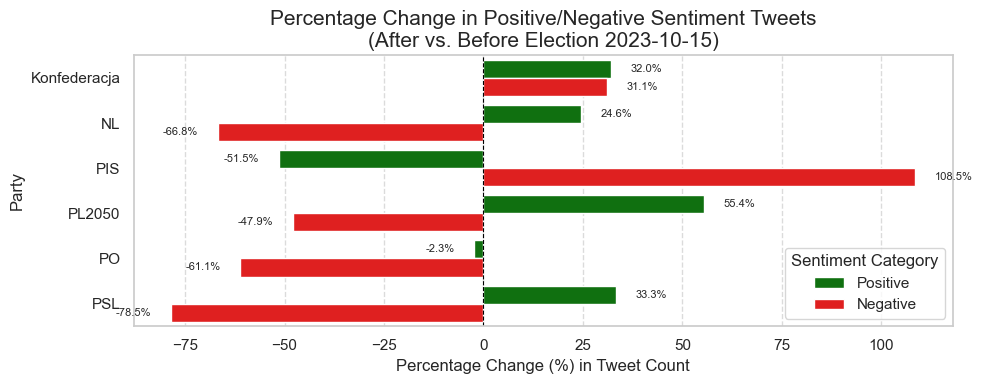


--- Percentage Sentiment Change Plotting Complete ---


In [139]:
# === Notebook Cell: Plot Percentage Sentiment Change (Before vs. After Election) ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback
import numpy as np

print("\n" + "="*60)
print("--- Plotting Percentage Sentiment Change (Before vs. After Election) ---")
print("="*60)

# Assuming 'change_pivot' DataFrame exists from the previous cell and now has 
# 'Positive_Pct_Change' and 'Negative_Pct_Change' columns, with 'party' as its index.

if 'change_pivot' in locals() and isinstance(change_pivot, pd.DataFrame):
    
    pct_change_cols_to_plot = []
    if 'Positive_Pct_Change' in change_pivot.columns:
        pct_change_cols_to_plot.append('Positive_Pct_Change')
    if 'Negative_Pct_Change' in change_pivot.columns:
        pct_change_cols_to_plot.append('Negative_Pct_Change')
    
    if not pct_change_cols_to_plot:
        print("ERROR: No percentage change columns (e.g., 'Positive_Pct_Change') found in 'change_pivot'.")
        print("Ensure the previous cell for numerical change calculation ran correctly and generated these columns.")
    else:
        df_pct_change_for_plot = change_pivot[pct_change_cols_to_plot].copy()
        # Replace potential NaN/Inf with 0 for plotting if desired, or handle in plot
        df_pct_change_for_plot = df_pct_change_for_plot.fillna(0).replace([np.inf, -np.inf], 0) 
        df_pct_change_for_plot = df_pct_change_for_plot.reset_index() # Make 'party' a column

        # Melt the DataFrame for easier plotting with seaborn
        df_melted_pct = pd.melt(df_pct_change_for_plot, 
                                id_vars=[party_col], 
                                value_vars=pct_change_cols_to_plot, # Only plot these
                                var_name='Sentiment_Change_Metric', 
                                value_name='Percentage_Change')

        # Extract base sentiment (Positive/Negative) for coloring
        df_melted_pct['Sentiment_Type'] = df_melted_pct['Sentiment_Change_Metric'].apply(
            lambda x: 'Positive' if 'Positive' in x else 'Negative' if 'Negative' in x else 'Other'
        )
        
        print("\nData prepared for Percentage Change Plot:")
        display(df_melted_pct.head())

        if df_melted_pct.empty:
            print("No data to plot for percentage changes.")
        else:
            num_parties = df_melted_pct[party_col].nunique()
            plt.figure(figsize=(10, max(4, num_parties * 0.6))) # Adjust height based on num parties
            
            # Define colors for Positive/Negative sentiment categories
            change_palette = {'Positive': 'green', 'Negative': 'red'}

            # Create the horizontal bar plot
            bar_plot = sns.barplot(
                data=df_melted_pct,
                y=party_col, # Parties on the y-axis
                x='Percentage_Change', # Percentage change on the x-axis
                hue='Sentiment_Type',  # Color bars by Positive or Negative sentiment change
                palette=change_palette,
                orient='h',
                dodge=True # Group bars for each party
            )
            
            plt.axvline(0, color='black', linewidth=0.8, linestyle='--') # Line at 0% change
            plt.xlabel('Percentage Change (%) in Tweet Count')
            plt.ylabel('Party')
            plt.title(f'Percentage Change in Positive/Negative Sentiment Tweets\n(After vs. Before Election {election_date_str})', fontsize=15)
            plt.legend(title='Sentiment Category', loc='lower right') # Adjust legend as needed
            plt.grid(axis='x', linestyle='--', alpha=0.7)
            
            # Add value labels to bars
            for p in bar_plot.patches:
                width = p.get_width()
                # Position text: if bar is to the right (positive), place text right; if left (negative), place left.
                text_x_pos = width + (5 if width > 0 else -5) 
                ha = 'left' if width > 0 else 'right'
                
                if width != 0: # Only annotate non-zero bars
                    bar_plot.text(text_x_pos, 
                                  p.get_y() + p.get_height() / 2., 
                                  f"{width:.1f}%", 
                                  va='center', 
                                  ha=ha,
                                  fontsize=8)

            plt.tight_layout()
            plt.show()
else:
    print("ERROR: 'change_pivot' DataFrame not found. Run the numerical change calculation cell first.")

print("\n" + "="*60)
print("--- Percentage Sentiment Change Plotting Complete ---")
print("="*60)

. 100% Stacked Area Chart (Sentiment Proportions per Party)

What it shows: This plot is similar to the faceted line plot showing P/N/N counts per party, but instead of raw counts, it shows the proportion of each sentiment within each party's tweets for each time period. The total height always represents 100%.
Why it's useful: It normalizes for the total number of tweets each party sends. This makes it excellent for comparing the internal balance of sentiment across parties, even if one party tweets much more than another. You can easily see if a party becomes, say, 70% negative during a specific week, regardless of whether they sent 10 or 100 tweets. It directly addresses the "division over red, green, grey" by showing the relative size of each colored area.   
How it looks: Each party gets its own plot (facet). Time is on the X-axis. The Y-axis goes from 0% to 100%. The area is filled with stacked colors (green for Positive, red for Negative, grey for Neutral) showing their proportion at each time point.


--- Plotting 100% STACKED Sentiment PROPORTIONS Over Time per Party ---

Data prepared for 100% stacked plot:


final_sentiment_label,created_at,party,Positive,Negative,Neutral
0,2022-10-16 00:00:00+00:00,PL2050,1.000000,0.000000,0.000000
1,2022-10-23 00:00:00+00:00,Konfederacja,0.250000,0.416667,0.333333
2,2022-10-23 00:00:00+00:00,NL,0.062500,0.531250,0.406250
3,2022-10-23 00:00:00+00:00,PIS,0.142857,0.714286,0.142857
4,2022-10-23 00:00:00+00:00,PL2050,0.000000,0.666667,0.333333



Generating 100% stacked area plot for 6 parties...


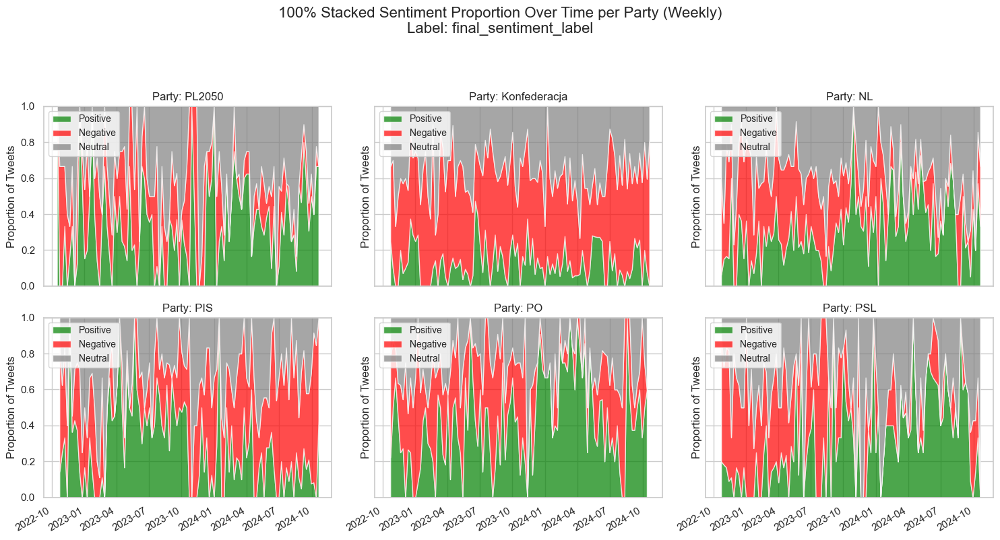


--- 100% Stacked Plotting Complete ---


In [140]:
# === Notebook Cell: Plot 100% STACKED Sentiment PROPORTIONS Over Time per Party ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback # Ensure traceback is imported
import numpy as np # Ensure numpy is imported

print("\n" + "="*60)
print("--- Plotting 100% STACKED Sentiment PROPORTIONS Over Time per Party ---")
print("="*60)

# --- Configuration ---
time_frequency = 'W' # Aggregate by Week ('D'=Day, 'M'=Month)
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
parties_to_plot = None 
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey', 'Other': 'blue', 'ERROR': 'orange'}
sentiment_order = ['Positive', 'Negative', 'Neutral', 'Other', 'ERROR'] # Controls stacking order (bottom to top)
# ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_plot_subset = df_sentiment_input.copy()
        if parties_to_plot:
            df_plot_subset = df_plot_subset[df_plot_subset[party_col].isin(parties_to_plot)]
            print(f"Filtered data to include only parties: {parties_to_plot}")

        if df_plot_subset.empty:
             print("No data remaining after filtering.")
        else:
             # --- Data Preparation ---
             # Group by time, party, and sentiment, then count
             sentiment_counts = df_plot_subset.groupby([
                 pd.Grouper(key=time_col, freq=time_frequency), 
                 party_col, 
                 final_sentiment_col
             ]).size().unstack(fill_value=0) # Unstack sentiment to columns

             # Calculate proportions (row-wise sum is total per party per week)
             sentiment_proportions_stacked = sentiment_counts.apply(lambda x: x / x.sum(), axis=1).fillna(0)

             # Ensure P/N/N columns exist if they were all zero for some periods
             for sentiment in ['Positive', 'Negative', 'Neutral']:
                 if sentiment not in sentiment_proportions_stacked.columns:
                     sentiment_proportions_stacked[sentiment] = 0.0
             
             # Select and reorder columns for plotting and stacking order
             plot_cols = [s for s in sentiment_order if s in sentiment_proportions_stacked.columns]
             plot_cols = [s for s in plot_cols if s in ['Positive', 'Negative', 'Neutral']] # Focus on P/N/N
             sentiment_proportions_stacked = sentiment_proportions_stacked[plot_cols]
             
             # Reset index to make time and party columns for plotting
             plot_data_stacked = sentiment_proportions_stacked.reset_index()

             print("\nData prepared for 100% stacked plot:")
             try:
                 display(plot_data_stacked.head())
             except NameError:
                 print(plot_data_stacked.head().to_string())

             # --- Plotting ---
             num_parties = plot_data_stacked[party_col].nunique()
             print(f"\nGenerating 100% stacked area plot for {num_parties} parties...")
             
             # Plotting requires iterating through parties or using FacetGrid manually with stackplot
             
             # Prepare data for stackplot (pivot might be needed or iterate)
             plot_data_stacked = plot_data_stacked.set_index(time_col)
             
             parties = plot_data_stacked[party_col].unique()
             num_facet_cols = min(len(parties), 3)
             num_rows = int(np.ceil(len(parties) / num_facet_cols))
             
             fig, axes = plt.subplots(num_rows, num_facet_cols, figsize=(num_facet_cols * 5, num_rows * 4), 
                                      sharex=True, sharey=True) # Share Y axis (0-1)
             axes = axes.flatten() # Flatten for easy iteration
             
             plot_colors = [sentiment_colors.get(s, 'grey') for s in plot_cols] # Get colors in plot order

             for i, party in enumerate(parties):
                 ax = axes[i]
                 party_data = plot_data_stacked[plot_data_stacked[party_col] == party][plot_cols]
                 
                 if not party_data.empty:
                     # Use pandas plotting directly with stack=True or plt.stackplot
                     # Using plt.stackplot requires numpy arrays
                     x_values = party_data.index # The time index
                     y_values = [party_data[col].values for col in plot_cols] # List of arrays for P, N, Neu
                     
                     ax.stackplot(x_values, y_values, labels=plot_cols, colors=plot_colors, alpha=0.7)
                     
                     ax.set_title(f"Party: {party}")
                     ax.legend(loc='upper left', fontsize='small')
                     ax.set_ylim(0, 1) # Y-axis is proportion 0 to 1
                     ax.set_ylabel("Proportion of Tweets")
                     # ax.tick_params(axis='x', rotation=45) # Rotate x-axis labels if needed
                 else:
                     ax.set_title(f"Party: {party} (No Data)")
             
             # Hide unused axes
             for j in range(i + 1, len(axes)):
                 fig.delaxes(axes[j])

             fig.autofmt_xdate() # Format dates on x-axis nicely
             fig.suptitle(f'100% Stacked Sentiment Proportion Over Time per Party (Weekly)\nLabel: {final_sentiment_col}', fontsize=16, y=1.03)
             plt.tight_layout(rect=[0, 0.03, 1, 0.97])
             plt.show()

    except Exception as e:
        print(f"An error occurred during 100% stacked plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns.")

print("\n" + "="*60)
print("--- 100% Stacked Plotting Complete ---")
print("="*60)

2. Net Sentiment Score Over Time (Overall and per Party)

What it shows: A single line representing the balance between positive and negative sentiment. A common way to calculate it is (Positive Count - Negative Count) / (Total P+N+N Count). This ranges from -1 (all negative) to +1 (all positive), with 0 indicating perfect balance or all neutral.
Why it's useful: Simplifies the sentiment trend into one easy-to-follow metric of polarity.
How it looks: One line plot showing the overall net sentiment, and/or faceted line plots showing the net sentiment for each party.


--- Plotting Net Sentiment Score Over Time ---

Data prepared for net sentiment plot:


final_sentiment_label,created_at,party,net_sentiment_score
0,2022-10-16 00:00:00+00:00,PL2050,1.000000
1,2022-10-23 00:00:00+00:00,Konfederacja,-0.166667
2,2022-10-23 00:00:00+00:00,NL,-0.468750
3,2022-10-23 00:00:00+00:00,PIS,-0.571429
4,2022-10-23 00:00:00+00:00,PL2050,-0.666667



Generating Overall Net Sentiment Plot...


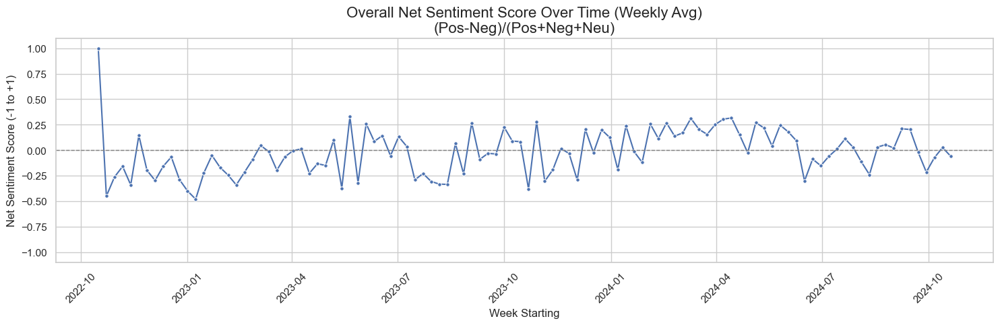


Generating Per-Party Net Sentiment Plot...


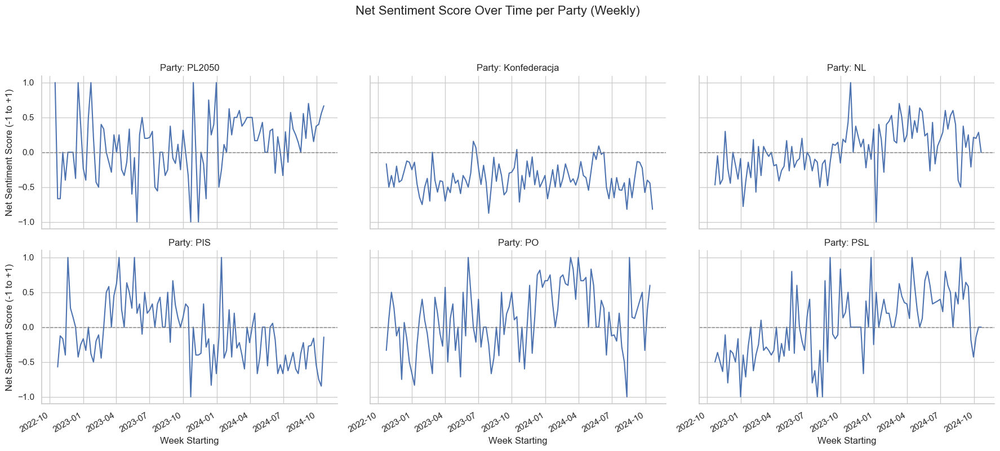


--- Net Sentiment Plotting Complete ---


In [141]:
# === Notebook Cell: Plot NET Sentiment Score Over Time (Overall & Per Party) ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback # Ensure traceback is imported
import numpy as np # Ensure numpy is imported

print("\n" + "="*60)
print("--- Plotting Net Sentiment Score Over Time ---")
print("="*60)

# --- Configuration ---
time_frequency = 'W' # Aggregate by Week ('D'=Day, 'M'=Month)
final_sentiment_col = 'final_sentiment_label' 
time_col = 'created_at'
party_col = 'party'
# ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and # Need party for per-party plot
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        # --- Data Preparation ---
        # Group by time, party, and sentiment, then count
        sentiment_counts = df_sentiment_input.groupby([
                 pd.Grouper(key=time_col, freq=time_frequency), 
                 party_col, 
                 final_sentiment_col
             ]).size().unstack(fill_value=0) # Unstack sentiment to columns

        # Ensure P/N/N columns exist
        for sentiment in ['Positive', 'Negative', 'Neutral']:
            if sentiment not in sentiment_counts.columns:
                sentiment_counts[sentiment] = 0
        
        # Calculate total relevant tweets (P+N+N) - exclude Other/ERROR if present
        sentiment_counts['total_pnn'] = sentiment_counts['Positive'] + sentiment_counts['Negative'] + sentiment_counts['Neutral']
        
        # Calculate Net Sentiment Score: (Pos - Neg) / Total_PNN
        # Add small epsilon to denominator to avoid division by zero if total is 0
        epsilon = 1e-9 
        sentiment_counts['net_sentiment_score'] = \
            (sentiment_counts['Positive'] - sentiment_counts['Negative']) / (sentiment_counts['total_pnn'] + epsilon)

        # Reset index to make time and party columns
        plot_data_net = sentiment_counts[['net_sentiment_score']].reset_index()
        
        print("\nData prepared for net sentiment plot:")
        try:
            display(plot_data_net.head())
        except NameError:
            print(plot_data_net.head().to_string())

        # --- Plotting Overall Net Sentiment ---
        print("\nGenerating Overall Net Sentiment Plot...")
        # Calculate overall net sentiment by averaging across parties per time period
        overall_net_sentiment = plot_data_net.groupby(time_col)['net_sentiment_score'].mean()
        
        plt.figure(figsize=(15, 5))
        sns.lineplot(x=overall_net_sentiment.index, y=overall_net_sentiment.values, marker='o', markersize=4)
        plt.axhline(0, color='grey', linestyle='--', linewidth=1) # Line at 0
        plt.title(f'Overall Net Sentiment Score Over Time (Weekly Avg)\n(Pos-Neg)/(Pos+Neg+Neu)', fontsize=16)
        plt.xlabel('Week Starting')
        plt.ylabel('Net Sentiment Score (-1 to +1)')
        plt.ylim(-1.1, 1.1)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        # --- Plotting Per-Party Net Sentiment ---
        print("\nGenerating Per-Party Net Sentiment Plot...")
        num_parties = plot_data_net[party_col].nunique()
        num_facet_cols = min(num_parties, 3)

        g = sns.relplot(
            data=plot_data_net, 
            x=time_col, 
            y='net_sentiment_score', 
            kind='line', 
            col=party_col, # Facet by party
            col_wrap=num_facet_cols, 
            height=4, aspect=1.5,
            legend=False, 
            facet_kws={'sharey': True, 'sharex': True} # Share Y axis (-1 to 1)
        )
        
        g.map(plt.axhline, y=0, color='grey', linestyle='--', linewidth=1) # Add horizontal line at 0
        
        g.set_titles("Party: {col_name}") 
        g.set_axis_labels("Week Starting", "Net Sentiment Score (-1 to +1)") 
        g.set(ylim=(-1.1, 1.1)) # Set Y-axis limits 
        g.fig.suptitle(f'Net Sentiment Score Over Time per Party (Weekly)', fontsize=16, y=1.03)
        g.fig.autofmt_xdate() 
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        plt.show()


    except Exception as e:
        print(f"An error occurred during net sentiment plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns.")

print("\n" + "="*60)
print("--- Net Sentiment Plotting Complete ---")
print("="*60)

In [ ]:
1. Sentiment Associated with Specific Economic Keywords

Since these tweets were selected based on economic keywords, understanding the sentiment profile associated with different keywords can be very revealing. Are tweets mentioning "inflation" usually negative? Are tweets about "investment" more positive?

What it shows: The distribution of Positive/Negative/Neutral sentiment for tweets containing specific keywords.
Why it's useful: Helps identify which economic topics are driving positive or negative sentiment in the discourse.

In [55]:
df_sentiment_input

,id,text_clean_en_demojized,created_at,party,username,matched_keywords_FILTERED,extracted_terms_FILTERED,text_clean_en,sentiment_cardiffnlp_emoji_label,sentiment_cardiffnlp_emoji_score_best,...,sentiment_cardiffnlp_demoji_score_best,sentiment_cardiffnlp_demoji_score_neg,sentiment_cardiffnlp_demoji_score_neu,sentiment_cardiffnlp_demoji_score_pos,sentiment_finbert_demoji_label,sentiment_finbert_demoji_score_best,sentiment_finbert_demoji_score_neg,sentiment_finbert_demoji_score_neu,sentiment_finbert_demoji_score_pos,final_sentiment_label
0,1846161400328028160,:cross_mark: We are a year after the elections...,2024-10-15 12:09:12+00:00,Konfederacja,bartlomiejpejo,"[crisis, demand]","[crisis, demands]","❌ We are a year after the elections, and Polan...",Negative,0.803830,...,0.816410,0.816410,0.174771,0.008819,Neutral,0.785302,0.041167,0.785302,0.173532,Negative
1,1845725230272000256,Poland is soon to launch 49 EU-funded Foreigne...,2024-10-14 07:16:01+00:00,Konfederacja,bartlomiejpejo,[fund],[funded],Poland is soon to launch 49 EU-funded Foreigne...,Neutral,0.716946,...,0.716946,0.006587,0.716946,0.276467,Neutral,0.711673,0.014701,0.711673,0.273627,Neutral
2,1844415548211245312,Listening to the statement of Deputy Minister ...,2024-10-10 16:31:48+00:00,Konfederacja,bartlomiejpejo,[fund],[funds],Listening to the statement of Deputy Minister ...,Neutral,0.646243,...,0.646243,0.333890,0.646243,0.019867,Neutral,0.813761,0.023739,0.813761,0.162500,Neutral
3,1843984045073428992,Local government investments are crucial for r...,2024-10-09 11:57:10+00:00,Konfederacja,bartlomiejpejo,[investment],[investments],Local government investments are crucial for r...,Neutral,0.545010,...,0.545010,0.363077,0.545010,0.091912,Neutral,0.434723,0.266388,0.434723,0.298889,Neutral
4,1843740048350691584,We talked about the trends and challenges of t...,2024-10-08 19:47:37+00:00,Konfederacja,bartlomiejpejo,[market],[market],We talked about the trends and challenges of t...,Positive,0.787233,...,0.787233,0.003708,0.209059,0.787233,Neutral,0.799829,0.011726,0.799829,0.188445,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6084,1622276457975222272,"Dear Minister of Coal and Straw, if you had li...",2023-02-05 16:50:22+00:00,PSL,StefanKrajewski,"[market, import]","[imported, market]","Dear Minister of Coal and Straw, if you had li...",Negative,0.503983,...,0.564069,0.564069,0.414973,0.020958,Negative,0.930797,0.930797,0.057035,0.012168,Negative
6085,1621767127660220416,In the majesty of the law and stealing from Po...,2023-02-04 07:06:28+00:00,PSL,StefanKrajewski,"[energy, state-owned companies]","[energy, state-owned companies]",In the majesty of the law and stealing from Po...,Negative,0.898026,...,0.898026,0.898026,0.093379,0.008595,Negative,0.665957,0.665957,0.310907,0.023136,Negative
6086,1618902451620573184,9th Beef Sector Forum - we met among producers...,2023-01-27 09:23:16+00:00,PSL,StefanKrajewski,[sector],[Sector],9th Beef Sector Forum - we met among producers...,Positive,0.778472,...,0.621158,0.007121,0.371721,0.621158,Neutral,0.556230,0.011549,0.556230,0.432221,Positive
6087,1612071495026483200,The difference is that PKN Orlen has a 49.9% s...,2023-01-08 12:59:29+00:00,PSL,StefanKrajewski,[treasury],[Treasury],The difference is that PKN Orlen has a 49.9% s...,Neutral,0.586729,...,0.586729,0.344122,0.586729,0.069149,Neutral,0.860346,0.073162,0.860346,0.066492,Neutral



--- Analyzing Sentiment Distribution per Top Keyword ---
Exploded keywords for analysis. Total keyword occurrences: 8039

Top 20 most frequent keywords overall:


matched_keywords_FILTERED
fund              746
energy            739
budget            450
investment        406
taxes             406
market            402
development       402
entrepreneurs     342
economy           321
finance           308
inflation         284
crisis            277
economics         244
industry          238
pensions          179
demand            155
equalities        147
infrastructure    138
agricultural      137
debt              132
Name: count, dtype: int64


Calculating sentiment distribution for top 20 keywords...

Sentiment Proportion per Top Keyword:


final_sentiment_label,Negative,Neutral,Positive,total_count
matched_keywords_FILTERED,,,,
fund,0.398123,0.416890,0.184987,746
energy,0.277402,0.289581,0.433018,739
budget,0.393333,0.373333,0.233333,450
taxes,0.467980,0.357143,0.174877,406
investment,0.219212,0.278325,0.502463,406
development,0.159204,0.318408,0.522388,402
market,0.300995,0.393035,0.305970,402
entrepreneurs,0.327485,0.330409,0.342105,342
economy,0.401869,0.302181,0.295950,321


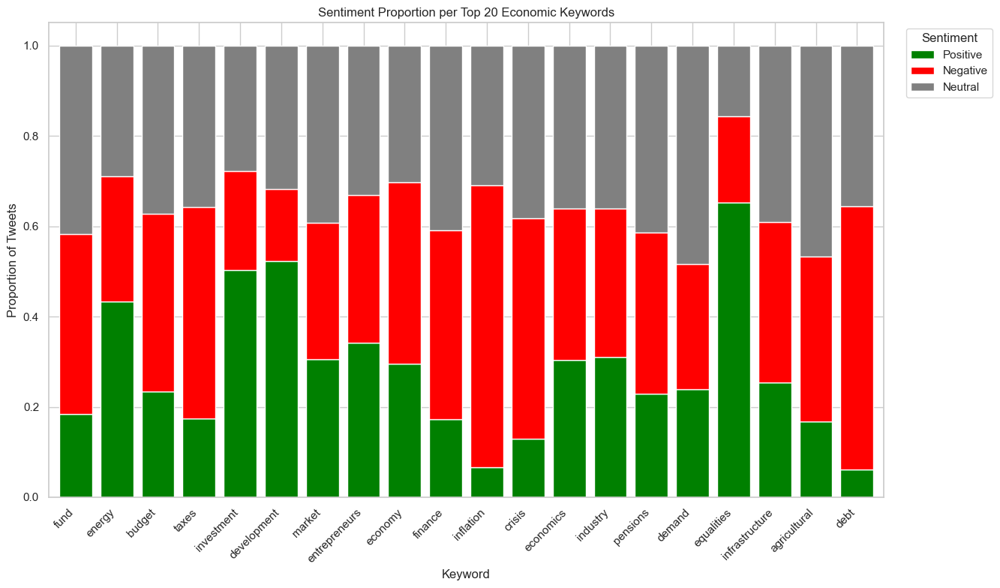


--- Keyword Sentiment Analysis Complete ---


In [142]:
# === Notebook Cell: Analyze Sentiment per Keyword ===
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import traceback 
from collections import Counter

print("\n" + "="*60)
print("--- Analyzing Sentiment Distribution per Top Keyword ---")
print("="*60)

# --- Configuration ---
keyword_col = 'matched_keywords_FILTERED' # List column from keyword matching
final_sentiment_col = 'final_sentiment_label'
top_n_keywords = 20 # How many top keywords to analyze
# ---

# Check data readiness
analysis_data_ready = ('df_sentiment_input' in locals() and 
                       isinstance(df_sentiment_input, pd.DataFrame) and 
                       not df_sentiment_input.empty and
                       final_sentiment_col in df_sentiment_input.columns and
                       keyword_col in df_sentiment_input.columns)

if analysis_data_ready:
    try:
        # Explode the list of keywords so each keyword gets its own row (along with the tweet's sentiment)
        # Ensure the column contains lists, handle potential errors if it doesn't
        df_exploded = df_sentiment_input[[keyword_col, final_sentiment_col]].dropna(subset=[keyword_col])
        
        # Check if column needs conversion from string representation of list
        if not df_exploded.empty and isinstance(df_exploded[keyword_col].iloc[0], str):
             print("Keyword column appears to be stringified list, attempting conversion...")
             import ast
             try:
                 df_exploded[keyword_col] = df_exploded[keyword_col].apply(ast.literal_eval)
             except (ValueError, SyntaxError):
                 print("WARNING: Conversion failed. Ensure keyword column contains actual lists.")
                 # Attempt basic split if it looks like simple space-separated string in brackets? Highly heuristic.
                 # df_exploded[keyword_col] = df_exploded[keyword_col].str.strip('[]').str.split()

        # Proceed only if we likely have lists
        if not df_exploded.empty and isinstance(df_exploded[keyword_col].iloc[0], list):
            df_exploded = df_exploded.explode(keyword_col).dropna(subset=[keyword_col])
            df_exploded = df_exploded[df_exploded[keyword_col] != ''] # Remove empty strings if any

            if df_exploded.empty:
                print("No keywords found after exploding lists.")
            else:
                print(f"Exploded keywords for analysis. Total keyword occurrences: {len(df_exploded)}")

                # --- Calculate overall keyword frequency ---
                all_keywords_counts = df_exploded[keyword_col].value_counts()
                print(f"\nTop {top_n_keywords} most frequent keywords overall:")
                try:
                    display(all_keywords_counts.head(top_n_keywords))
                except NameError:
                    print(all_keywords_counts.head(top_n_keywords).to_string())
                
                top_keywords_list = all_keywords_counts.head(top_n_keywords).index.tolist()

                # --- Calculate sentiment distribution for these top keywords ---
                print(f"\nCalculating sentiment distribution for top {top_n_keywords} keywords...")
                df_top_keywords = df_exploded[df_exploded[keyword_col].isin(top_keywords_list)]
                
                sentiment_per_keyword = df_top_keywords.groupby([keyword_col, final_sentiment_col]) \
                                                      .size() \
                                                      .unstack(fill_value=0)
                                                      
                # Calculate proportions
                sentiment_proportions_per_keyword = sentiment_per_keyword.apply(lambda x: x / x.sum(), axis=1).fillna(0)
                
                # Add total count back for context & sorting
                sentiment_proportions_per_keyword['total_count'] = sentiment_per_keyword.sum(axis=1)
                
                # Sort by total count
                sentiment_proportions_per_keyword = sentiment_proportions_per_keyword.sort_values('total_count', ascending=False)

                print("\nSentiment Proportion per Top Keyword:")
                try:
                    display(sentiment_proportions_per_keyword)
                except NameError:
                    print(sentiment_proportions_per_keyword.to_string())

                # --- Optional: Visualize sentiment proportions for top keywords ---
                plot_cols = [s for s in ['Positive', 'Negative', 'Neutral'] if s in sentiment_proportions_per_keyword.columns]
                if plot_cols:
                    sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}
                    plot_colors = [sentiment_colors.get(s, 'blue') for s in plot_cols]
                    
                    ax = sentiment_proportions_per_keyword[plot_cols].plot(
                        kind='bar', 
                        stacked=True, 
                        figsize=(15, 8), 
                        color=plot_colors,
                        width=0.8
                    )
                    plt.title(f'Sentiment Proportion per Top {top_n_keywords} Economic Keywords')
                    plt.xlabel('Keyword')
                    plt.ylabel('Proportion of Tweets')
                    plt.xticks(rotation=45, ha='right')
                    plt.legend(title='Sentiment', bbox_to_anchor=(1.02, 1), loc='upper left')
                    plt.tight_layout(rect=[0, 0, 0.9, 1]) # Adjust layout to make space for legend
                    plt.show()
        else:
             print("Could not process keyword column - ensure it contains lists.")

    except Exception as e:
        print(f"An error occurred during keyword sentiment analysis: {e}")
        traceback.print_exc()
else:
    print("Skipping analysis: Data not ready or missing required columns.")

print("\n" + "="*60)
print("--- Keyword Sentiment Analysis Complete ---")
print("="*60)


--- Plotting Sentiment Over Time for Top N Keywords (Annotated - Tick Fix) ---
Top 6 keywords to plot: ['fund', 'energy', 'budget', 'investment', 'taxes', 'market']
  Processing and plotting for keyword: 'fund'
  Processing and plotting for keyword: 'energy'
  Processing and plotting for keyword: 'budget'
  Processing and plotting for keyword: 'investment'
  Processing and plotting for keyword: 'taxes'
  Processing and plotting for keyword: 'market'


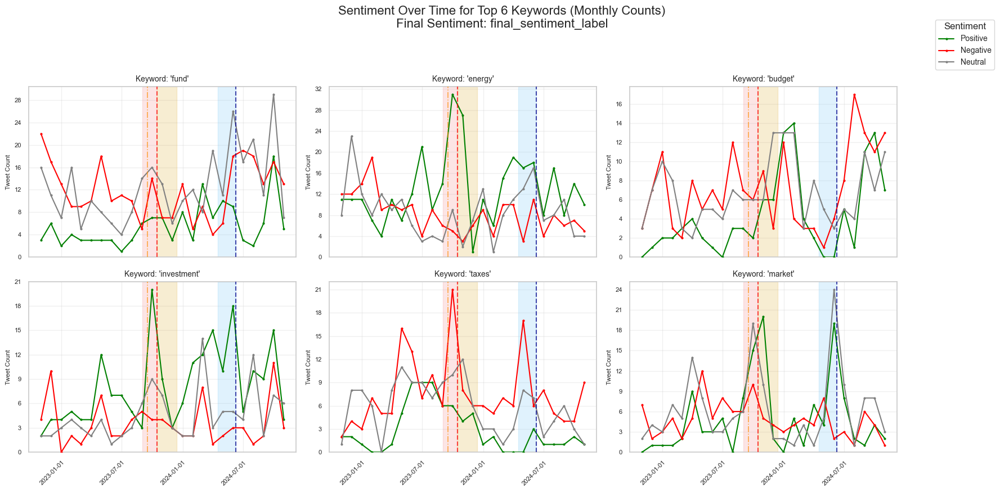


--- Top Keyword Sentiment Plotting Complete ---


In [145]:
# === Notebook Cell: Sentiment Over Time for Top N Keywords (Annotated - Tick Fix) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import matplotlib.ticker as mticker # Added for Y-axis integer ticks
import seaborn as sns 
import traceback 
from datetime import datetime, timezone 
import numpy as np
from collections import Counter 

print("\n" + "="*60)
print("--- Plotting Sentiment Over Time for Top N Keywords (Annotated - Tick Fix) ---")
print("="*60)

# --- Configuration ---
keyword_col = 'matched_keywords_FILTERED'
final_sentiment_col = 'final_sentiment_label'
time_col = 'created_at'
top_n_keywords_to_plot = 6 
time_frequency = 'ME'      # 'W' for Weekly, 'ME' for Monthly
# --- Sentiment Colors ---
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}
sentiments_to_plot_lines = ['Positive', 'Negative', 'Neutral'] 

# --- Annotation Configuration ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2},
    {'date': '2023-09-16', 'label': 'PL Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.2},
    {'date': '2023-10-15', 'label': 'PL Election 2023', 'color': 'red', 'linestyle': '--', 'linewidth': 1.5},
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2},
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25},
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5},
]
show_other_custom_annotations = True
# --- End Annotation Configuration ---

plot_data_ready = ('df_sentiment_input' in locals() and 
                   isinstance(df_sentiment_input, pd.DataFrame) and 
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   keyword_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_analysis = df_sentiment_input.copy()
        if not pd.api.types.is_datetime64_any_dtype(df_analysis[time_col]):
            df_analysis[time_col] = pd.to_datetime(df_analysis[time_col], utc=True, errors='coerce')
        df_analysis = df_analysis.dropna(subset=[time_col])
        if df_analysis[time_col].dt.tz is None: df_analysis[time_col] = df_analysis[time_col].dt.tz_localize('UTC')
        elif df_analysis[time_col].dt.tz != timezone.utc: df_analysis[time_col] = df_analysis[time_col].dt.tz_convert('UTC')

        all_keywords_flat = []
        for sublist in df_analysis[keyword_col].dropna():
            if isinstance(sublist, list):
                all_keywords_flat.extend([kw for kw in sublist if kw]) 
        
        if not all_keywords_flat:
            print("No keywords found in the specified column.")
        else:
            keyword_counts = Counter(all_keywords_flat)
            top_keywords = [kw for kw, count in keyword_counts.most_common(top_n_keywords_to_plot)]
            print(f"Top {len(top_keywords)} keywords to plot: {top_keywords}")

            if not top_keywords:
                print("No top keywords identified to plot.")
            else:
                num_keywords = len(top_keywords)
                num_facet_cols = min(num_keywords, 3) 
                num_rows = int(np.ceil(num_keywords / num_facet_cols))
                
                fig, axes = plt.subplots(num_rows, num_facet_cols, 
                                         figsize=(num_facet_cols * 6, num_rows * 4.5), 
                                         sharex=True, squeeze=False) 
                axes = axes.flatten()
                
                fig_legend_handles = [] 
                fig_legend_labels = []

                for i, current_keyword in enumerate(top_keywords):
                    ax = axes[i]
                    print(f"  Processing and plotting for keyword: '{current_keyword}'")

                    df_keyword_subset = df_analysis[df_analysis[keyword_col].apply(
                        lambda k_list: isinstance(k_list, list) and current_keyword in k_list
                    )]

                    if df_keyword_subset.empty:
                        ax.set_title(f"Keyword: '{current_keyword}'\n(No Data)", fontsize=10)
                        ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                        ax.tick_params(axis='x', rotation=45, labelsize=8) 
                        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                        plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor") # Set alignment
                        continue 

                    df_kw_time_indexed = df_keyword_subset.set_index(time_col)
                    plot_freq = 'ME' if time_frequency == 'M' else time_frequency
                    
                    sentiment_over_time_kw = df_kw_time_indexed.groupby([pd.Grouper(freq=plot_freq), final_sentiment_col]) \
                                                              .size().unstack(fill_value=0)
                    
                    for sentiment in sentiments_to_plot_lines:
                        if sentiment not in sentiment_over_time_kw.columns:
                            sentiment_over_time_kw[sentiment] = 0
                    sentiment_over_time_kw = sentiment_over_time_kw[[s for s in sentiments_to_plot_lines if s in sentiment_over_time_kw.columns]]

                    if sentiment_over_time_kw.empty:
                        ax.set_title(f"Keyword: '{current_keyword}'\n(No Resampled Data)", fontsize=10)
                        ax.text(0.5, 0.5, "No Resampled Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                        ax.tick_params(axis='x', rotation=45, labelsize=8)
                        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                        plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor") # Set alignment
                        continue
                        
                    for sentiment_label_in_loop in sentiment_over_time_kw.columns: # Renamed variable for clarity
                        line, = ax.plot(sentiment_over_time_kw.index, sentiment_over_time_kw[sentiment_label_in_loop],
                                       label=sentiment_label_in_loop, 
                                       color=sentiment_colors.get(sentiment_label_in_loop, 'black'),
                                       marker='.', markersize=4, zorder=5)
                        if sentiment_label_in_loop not in fig_legend_labels:
                            fig_legend_handles.append(line)
                            fig_legend_labels.append(sentiment_label_in_loop)
                    
                    plot_start_date = sentiment_over_time_kw.index.min()
                    plot_end_date = sentiment_over_time_kw.index.max()
                    
                    if annotations_list and show_other_custom_annotations:
                        for event in annotations_list:
                            event_label_base = event.get('label', 'Event')
                            try:
                                if 'date' in event:
                                    dt = pd.to_datetime(event['date'], utc=True)
                                    if plot_start_date <= dt <= plot_end_date:
                                        ax.axvline(dt, color=event.get('color', 'grey'), 
                                                   linestyle=event.get('linestyle', ':'), 
                                                   lw=event.get('linewidth', 1), 
                                                   zorder=9, alpha=0.7)
                                elif 'start_date' in event and 'end_date' in event:
                                    dt_start=pd.to_datetime(event['start_date'], utc=True)
                                    dt_end=pd.to_datetime(event['end_date'], utc=True)
                                    if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                        span_start = max(dt_start, plot_start_date)
                                        span_end = min(dt_end, plot_end_date)
                                        if span_start < span_end:
                                            ax.axvspan(span_start, span_end, 
                                                       color=event.get('color', 'cyan'), 
                                                       alpha=event.get('alpha', 0.15), 
                                                       zorder=1)
                            except Exception as e_ann: print(f"    Warn: Annot err for '{event_label_base}' on '{current_keyword}' plot: {e_ann}")

                    ax.set_title(f"Keyword: '{current_keyword}'", fontsize=10)
                    ax.set_ylabel("Tweet Count", fontsize=8)
                    # *** CORRECTED Tick Label Formatting ***
                    ax.tick_params(axis='x', labelsize=8) # Set size first
                    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor") # Then rotate and align
                    # ***
                    ax.tick_params(axis='y', labelsize=8)
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                    ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=3, maxticks=7)) 
                    ax.grid(True, alpha=0.3)
                    ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True, min_n_ticks=3)) 
                    ax.set_ylim(bottom=0)

                for j in range(num_keywords, len(axes)):
                    fig.delaxes(axes[j])
                
                if fig_legend_handles:
                    fig.legend(fig_legend_handles, fig_legend_labels, 
                               loc='upper right', 
                               title="Sentiment", 
                               bbox_to_anchor=(0.99, 0.98), 
                               fontsize='small', frameon=True)
                
                freq_name = "Weekly" if plot_freq == 'W' else "Monthly"
                fig.suptitle(f'Sentiment Over Time for Top {num_keywords} Keywords ({freq_name} Counts)\nFinal Sentiment: {final_sentiment_col}', fontsize=16, y=1.0) 
                plt.tight_layout(rect=[0, 0.03, 0.90, 0.95]) 
                plt.show()
    except Exception as e:
        print(f"An error occurred during top keyword sentiment plot generation: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns.")

print("\n" + "="*60)
print("--- Top Keyword Sentiment Plotting Complete ---")
print("="*60)


--- Plotting Sentiment Over Time for Top N Keywords PER PARTY (Annotated) ---

=== Processing Party: Konfederacja ===
  Top 3 keywords for Konfederacja: ['taxes', 'entrepreneurs', 'market']


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:212: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.tight_layout(rect

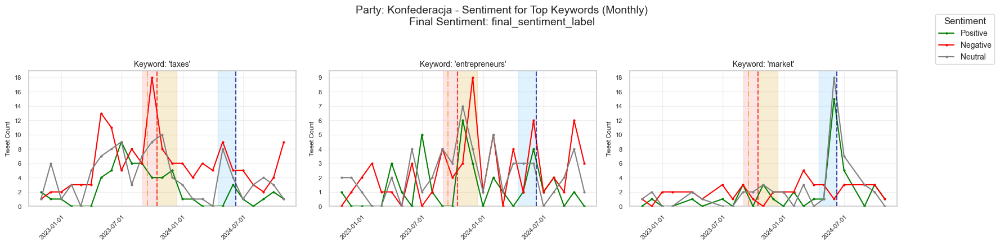


=== Processing Party: NL ===
  Top 3 keywords for NL: ['fund', 'energy', 'equalities']


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:212: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.tight_layout(rect

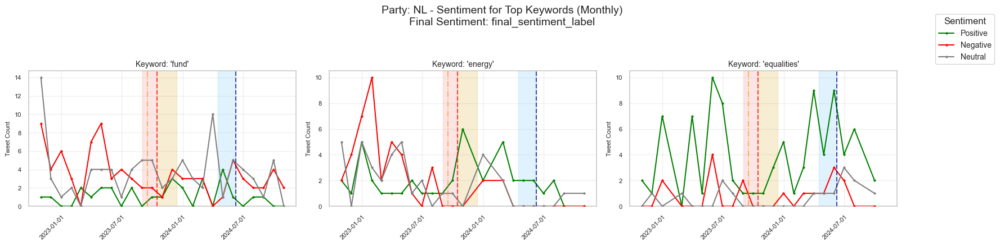


=== Processing Party: PIS ===
  Top 3 keywords for PIS: ['fund', 'energy', 'development']


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:212: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.tight_layout(rect

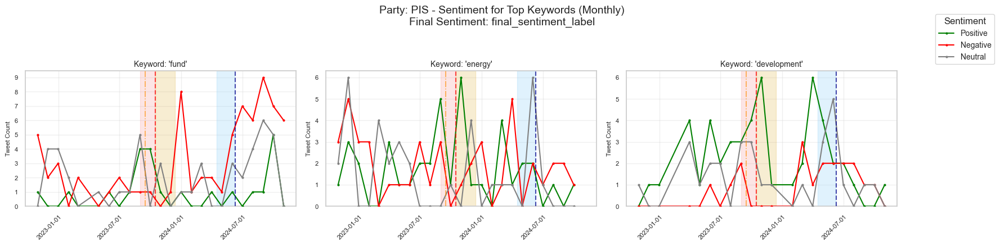


=== Processing Party: PL2050 ===
  Top 3 keywords for PL2050: ['energy', 'fund', 'investment']


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:212: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.tight_layout(rect

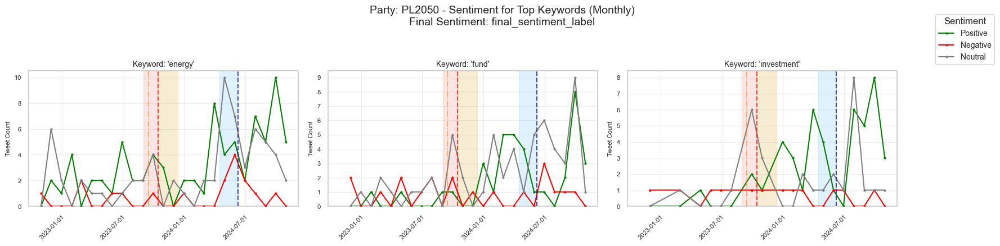


=== Processing Party: PO ===
  Top 3 keywords for PO: ['energy', 'fund', 'investment']


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:212: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.tight_layout(rect

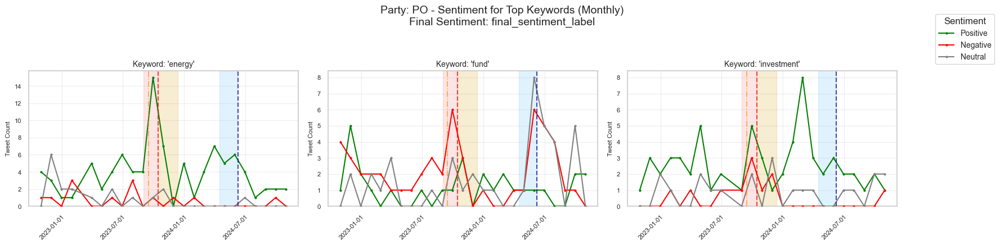


=== Processing Party: PSL ===
  Top 3 keywords for PSL: ['fund', 'energy', 'entrepreneurs']


C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:182: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
C:\Users\macie\AppData\Local\Temp\ipykernel_13432\3628232292.py:212: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 6.
  plt.tight_layout(rect

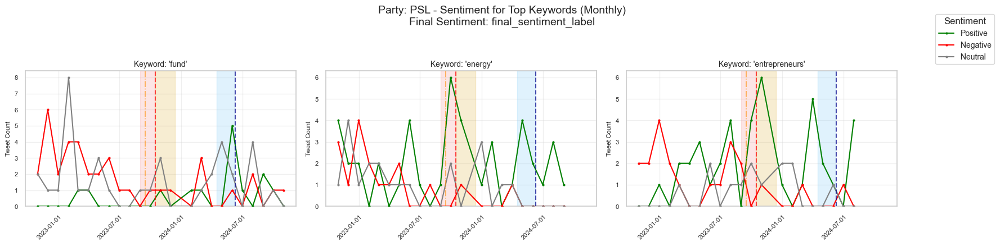


--- Top Keyword per Party Sentiment Plotting Complete ---


In [146]:
# === Notebook Cell: Sentiment Over Time for Top N Keywords PER PARTY (Annotated) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import seaborn as sns 
import traceback
from datetime import datetime, timezone
import numpy as np
from collections import Counter 

print("\n" + "="*60)
print("--- Plotting Sentiment Over Time for Top N Keywords PER PARTY (Annotated) ---")
print("="*60)

# --- Configuration ---
keyword_col = 'matched_keywords_FILTERED'
final_sentiment_col = 'final_sentiment_label'
time_col = 'created_at'
party_col = 'party' # Ensure this column exists in your df_sentiment_input
top_n_keywords_per_party = 3 # How many top keywords per party to plot (e.g., 3 or 5)
time_frequency = 'ME'      # 'W' for Weekly, 'ME' for Monthly (Month End)
# --- Sentiment Colors ---
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}
# Order for lines in each plot and for the common legend
sentiments_to_plot_lines = ['Positive', 'Negative', 'Neutral'] 

# --- Annotation Configuration (Use your full list here) ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2},
    {'date': '2023-09-16', 'label': 'PL Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.2},
    {'date': '2023-10-15', 'label': 'PL Election 2023', 'color': 'red', 'linestyle': '--', 'linewidth': 1.5},
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2},
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25},
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5},
    # ... Add your other annotations ...
]
show_other_custom_annotations = True
# --- End Annotation Configuration ---

# Check data readiness
plot_data_ready = ('df_sentiment_input' in locals() and
                   isinstance(df_sentiment_input, pd.DataFrame) and
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   keyword_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and # Added party_col check
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_analysis = df_sentiment_input.copy()

        # Ensure 'created_at' is datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_analysis[time_col]):
            df_analysis[time_col] = pd.to_datetime(df_analysis[time_col], utc=True, errors='coerce')
        df_analysis = df_analysis.dropna(subset=[time_col])
        if df_analysis[time_col].dt.tz is None: df_analysis[time_col] = df_analysis[time_col].dt.tz_localize('UTC')
        elif df_analysis[time_col].dt.tz != timezone.utc: df_analysis[time_col] = df_analysis[time_col].dt.tz_convert('UTC')

        unique_parties = sorted(df_analysis[party_col].unique())
        if not unique_parties:
            print("No parties found in the data.")
        
        for current_party_name in unique_parties:
            print(f"\n=== Processing Party: {current_party_name} ===")
            df_party_subset = df_analysis[df_analysis[party_col] == current_party_name]

            if df_party_subset.empty:
                print(f"  No data for party '{current_party_name}'.")
                continue

            # 1. Find Top N Keywords for THIS party
            all_keywords_party = []
            for sublist in df_party_subset[keyword_col].dropna():
                if isinstance(sublist, list): # Ensure it's a list
                    all_keywords_party.extend([kw for kw in sublist if kw]) # Add non-empty keywords
            
            if not all_keywords_party:
                print(f"  No keywords found for party '{current_party_name}'.")
                continue
            
            keyword_counts_party = Counter(all_keywords_party)
            top_keywords_for_party = [kw for kw, count in keyword_counts_party.most_common(top_n_keywords_per_party)]
            print(f"  Top {len(top_keywords_for_party)} keywords for {current_party_name}: {top_keywords_for_party}")

            if not top_keywords_for_party:
                print(f"  No top keywords to plot for party '{current_party_name}'.")
                continue

            # --- Setup Subplots for THIS party's keywords ---
            num_keywords_to_plot_this_party = len(top_keywords_for_party)
            num_facet_cols = min(num_keywords_to_plot_this_party, 3) 
            num_rows = int(np.ceil(num_keywords_to_plot_this_party / num_facet_cols))
            
            if num_rows == 0 or num_facet_cols == 0 : # Should not happen if top_keywords_for_party is not empty
                print(f"  Skipping plots for {current_party_name} due to zero rows/cols for subplots.")
                continue

            fig_party, axes_party = plt.subplots(num_rows, num_facet_cols,
                                                 figsize=(num_facet_cols * 6, num_rows * 4.5),
                                                 sharex=True, squeeze=False) # squeeze=False ensures axes_party is always 2D array
            axes_party = axes_party.flatten() # Flatten for easy iteration by index

            # To collect handles and labels for a single figure legend
            figure_legend_handles = []
            figure_legend_labels = []

            for i, current_keyword in enumerate(top_keywords_for_party):
                ax = axes_party[i]
                # print(f"    Plotting for keyword: '{current_keyword}'") # Verbose

                # Filter data for the current keyword from this party's subset
                df_keyword_party_subset = df_party_subset[df_party_subset[keyword_col].apply(
                    lambda k_list: isinstance(k_list, list) and current_keyword in k_list
                )]

                if df_keyword_party_subset.empty:
                    ax.set_title(f"Keyword: '{current_keyword}'\n(No Data for this party)", fontsize=10)
                    ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                    ax.tick_params(axis='x', rotation=45, labelsize=8)
                    plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                    continue

                df_kw_time_indexed = df_keyword_party_subset.set_index(time_col)
                plot_freq = 'ME' if time_frequency == 'M' else time_frequency
                
                sentiment_over_time_kw = df_kw_time_indexed.groupby([pd.Grouper(freq=plot_freq), final_sentiment_col]) \
                                                          .size().unstack(fill_value=0)
                
                for sentiment in sentiments_to_plot_lines:
                    if sentiment not in sentiment_over_time_kw.columns:
                        sentiment_over_time_kw[sentiment] = 0
                # Ensure correct order and only plot existing P/N/N columns
                sentiment_over_time_kw = sentiment_over_time_kw[[s for s in sentiments_to_plot_lines if s in sentiment_over_time_kw.columns]]

                if sentiment_over_time_kw.empty:
                    ax.set_title(f"Keyword: '{current_keyword}'\n(No Resampled Data)", fontsize=10)
                    ax.text(0.5, 0.5, "No Resampled Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                    ax.tick_params(axis='x', rotation=45, labelsize=8)
                    plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                    continue
                    
                # Plot sentiment lines for the current keyword
                for sentiment_label in sentiment_over_time_kw.columns:
                    line, = ax.plot(sentiment_over_time_kw.index, sentiment_over_time_kw[sentiment_label],
                                   label=sentiment_label, 
                                   color=sentiment_colors.get(sentiment_label, 'black'),
                                   marker='.', markersize=4, zorder=5)
                    # Collect handles for the main figure legend (only once per sentiment type)
                    if sentiment_label not in figure_legend_labels:
                        figure_legend_handles.append(line)
                        figure_legend_labels.append(sentiment_label)
                
                # --- Add Annotations to this subplot ---
                plot_start_date = sentiment_over_time_kw.index.min()
                plot_end_date = sentiment_over_time_kw.index.max()
                
                if annotations_list and show_other_custom_annotations:
                    for event in annotations_list:
                        # (Using simplified annotation plotting here for brevity, copy your full version)
                        try:
                            if 'date' in event:
                                dt = pd.to_datetime(event['date'], utc=True)
                                if plot_start_date <= dt <= plot_end_date:
                                    ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), zorder=9, alpha=0.7)
                            elif 'start_date' in event and 'end_date' in event:
                                dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                                if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                    span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                    if span_start < span_end:
                                        ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), zorder=1)
                        except Exception as e_ann: print(f"    Warn: Annot err for '{event.get('label', 'Event')}' on '{current_keyword}' plot: {e_ann}")
                # --- End Annotations ---

                ax.set_title(f"Keyword: '{current_keyword}'", fontsize=10)
                ax.set_ylabel("Tweet Count", fontsize=8)
                ax.tick_params(axis='x', labelsize=8)
                plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
                ax.tick_params(axis='y', labelsize=8)
                ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=3, maxticks=5)) # Auto-adjust number of x-ticks
                ax.grid(True, alpha=0.3)
                ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True, min_n_ticks=3)) # Ensure integer Y ticks
                ax.set_ylim(bottom=0)

            # Hide any unused subplots in this party's figure
            for j in range(num_keywords_to_plot_this_party, len(axes_party)):
                fig_party.delaxes(axes_party[j])
            
            # Common legend for sentiment lines for THIS party's figure
            # Sort handles by labels to match sentiment_order if possible for consistency
            if figure_legend_handles: # Only add if there's something to show
                 temp_legend_dict = dict(zip(figure_legend_labels, figure_legend_handles))
                 ordered_handles = [temp_legend_dict[lbl] for lbl in sentiments_to_plot_lines if lbl in temp_legend_dict]
                 ordered_labels = [lbl for lbl in sentiments_to_plot_lines if lbl in temp_legend_dict]

                 if ordered_handles: # Add legend if we have sorted handles
                      fig_party.legend(ordered_handles, ordered_labels,
                                    loc='upper right', 
                                    title="Sentiment", 
                                    bbox_to_anchor=(0.99, 0.98), # Adjust for figure, e.g., (0.99 for x, 0.98 for y)
                                    fontsize='small', frameon=True)
            
            freq_name = "Weekly" if plot_freq == 'W' else "Monthly"
            fig_party.suptitle(f'Party: {current_party_name} - Sentiment for Top Keywords ({freq_name})\nFinal Sentiment: {final_sentiment_col}', fontsize=14, y=1.0) # Adjust y to avoid overlap
            
            # Adjust layout carefully to accommodate suptitle and legend
            plt.tight_layout(rect=[0, 0.03, 0.90, 0.95]) # Leave space on right for legend and top for suptitle
            plt.show()

    except Exception as e:
        print(f"An error occurred during top keyword sentiment plot generation by party: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns.")

print("\n" + "="*60)
print("--- Top Keyword per Party Sentiment Plotting Complete ---")
print("="*60)


--- Plotting Sentiment Over Time for Top N Keywords PER PARTY (Custom Tick Interval) ---

=== Processing Party: Konfederacja ===
  Top 9 keywords for Konfederacja: ['taxes', 'entrepreneurs', 'market', 'energy', 'inflation', 'budget', 'economy', 'finance', 'fund']


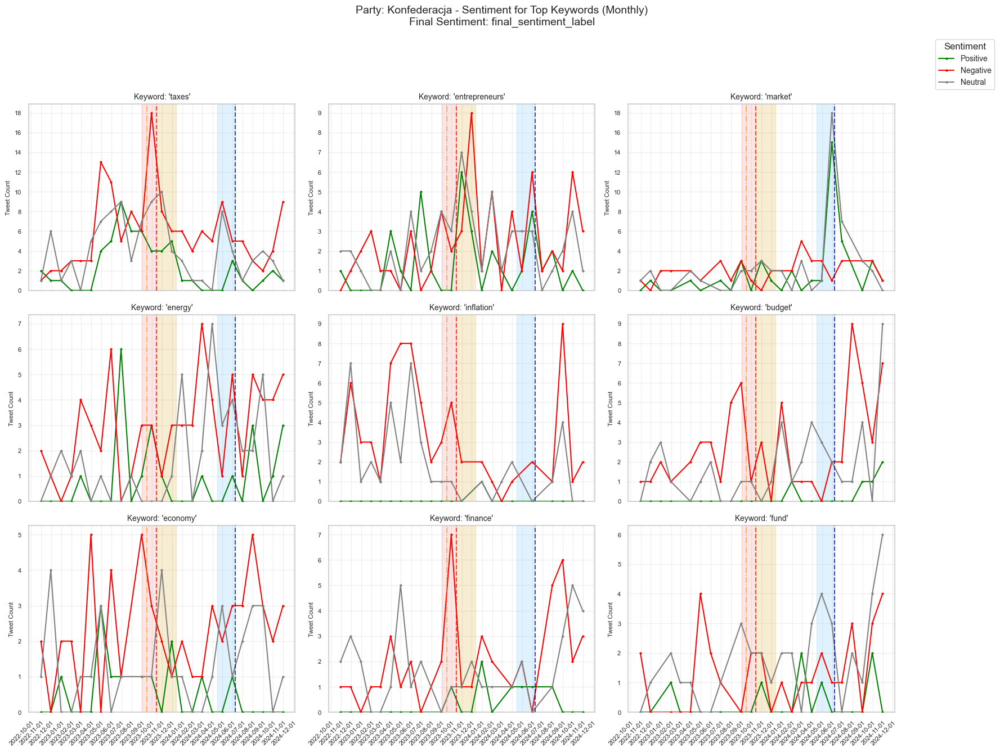


=== Processing Party: NL ===
  Top 9 keywords for NL: ['fund', 'energy', 'equalities', 'budget', 'market', 'pensions', 'development', 'crisis', 'finance']


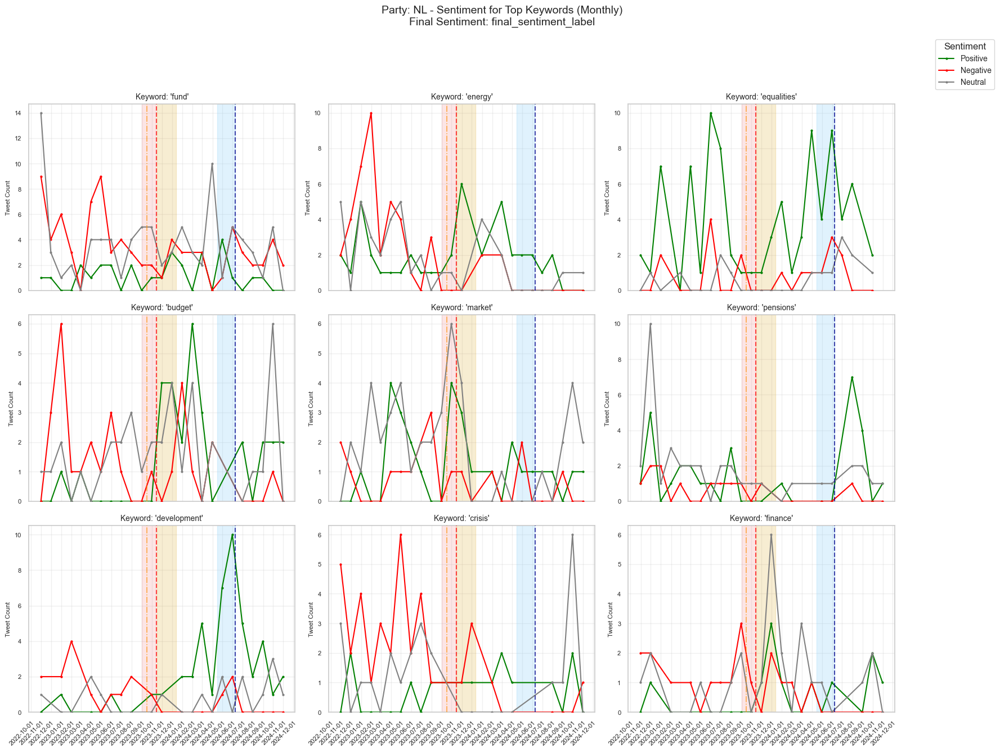


=== Processing Party: PIS ===
  Top 9 keywords for PIS: ['fund', 'energy', 'development', 'investment', 'finance', 'budget', 'economy', 'market', 'crisis']


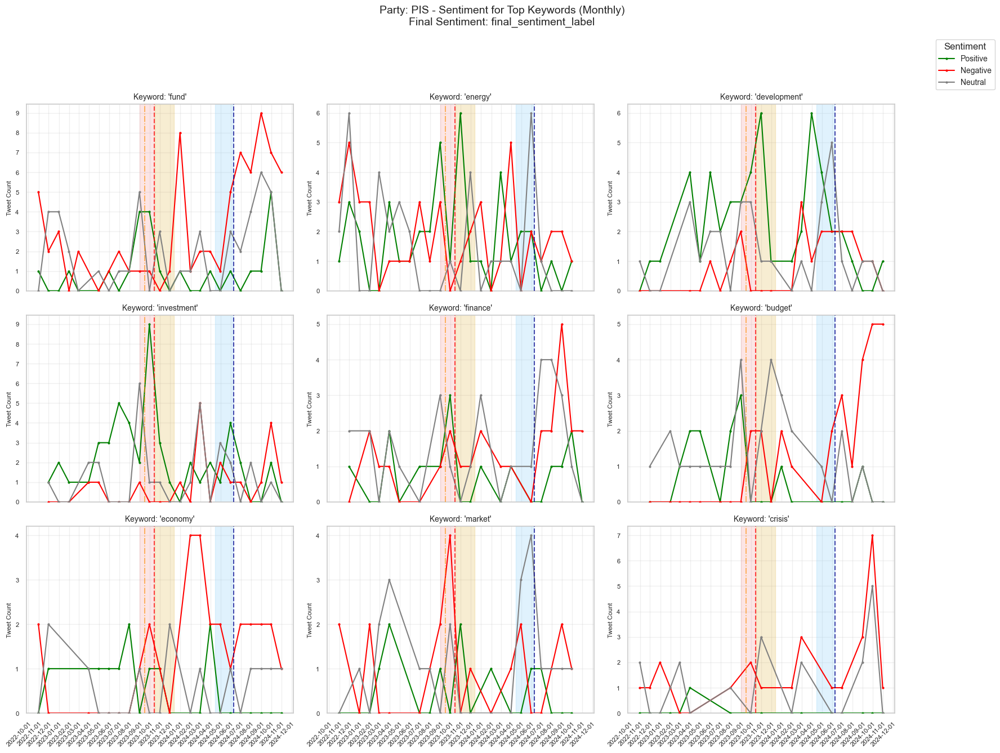


=== Processing Party: PL2050 ===
  Top 9 keywords for PL2050: ['energy', 'fund', 'investment', 'development', 'entrepreneurs', 'economy', 'budget', 'finance', 'market']


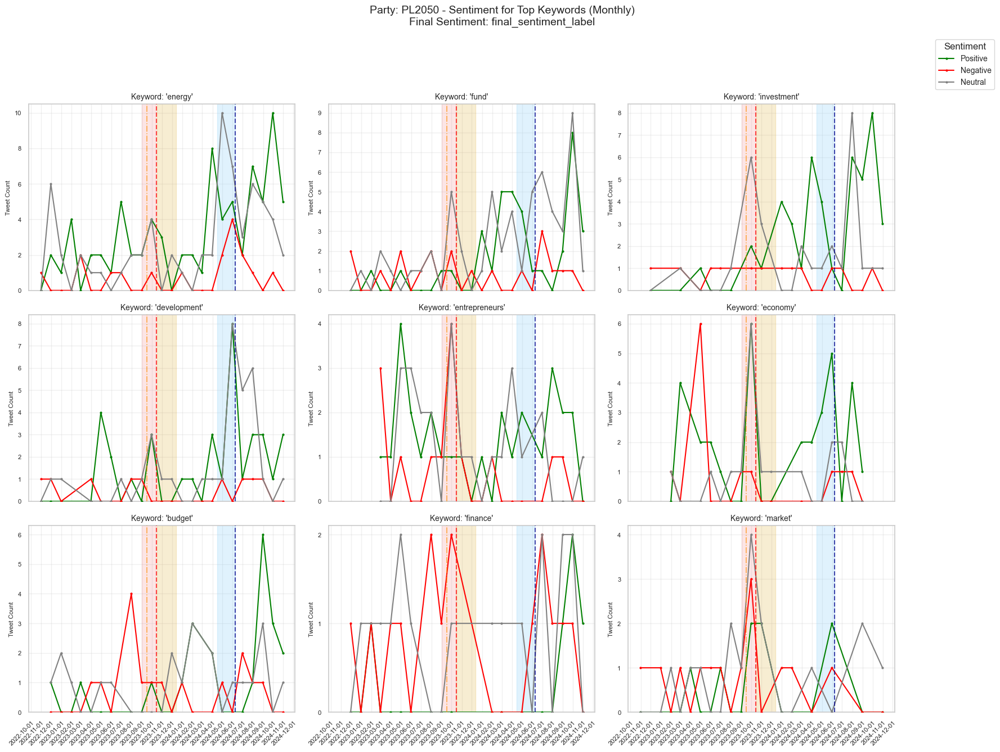


=== Processing Party: PO ===
  Top 9 keywords for PO: ['energy', 'fund', 'investment', 'budget', 'crisis', 'inflation', 'finance', 'development', 'market']


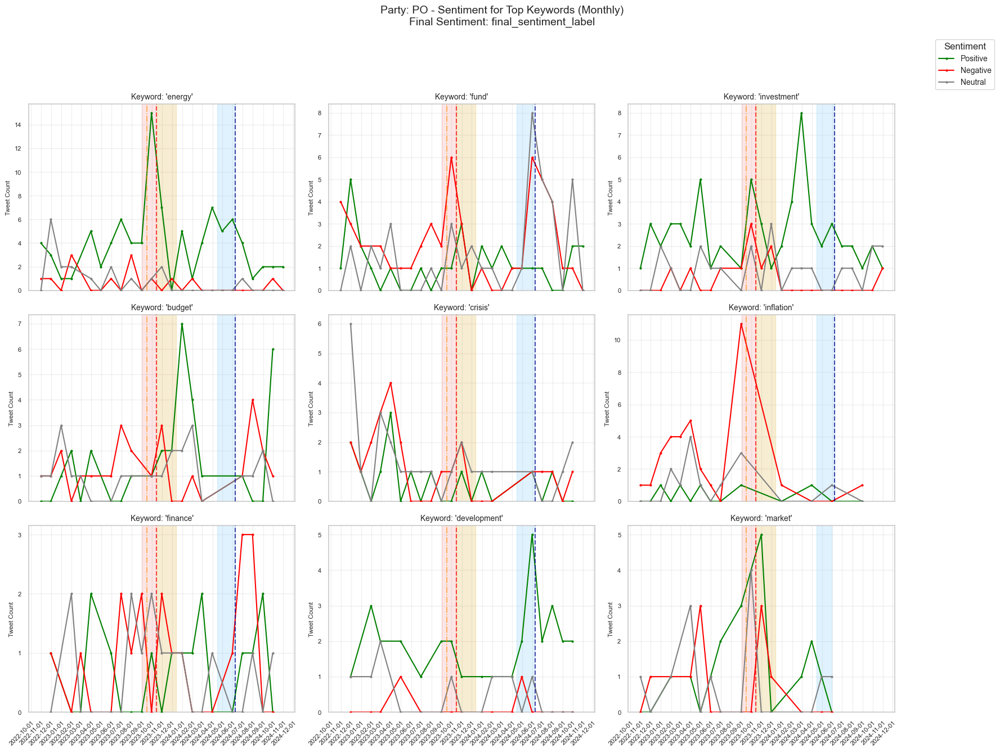


=== Processing Party: PSL ===
  Top 9 keywords for PSL: ['fund', 'energy', 'entrepreneurs', 'development', 'economy', 'investment', 'market', 'agricultural', 'budget']


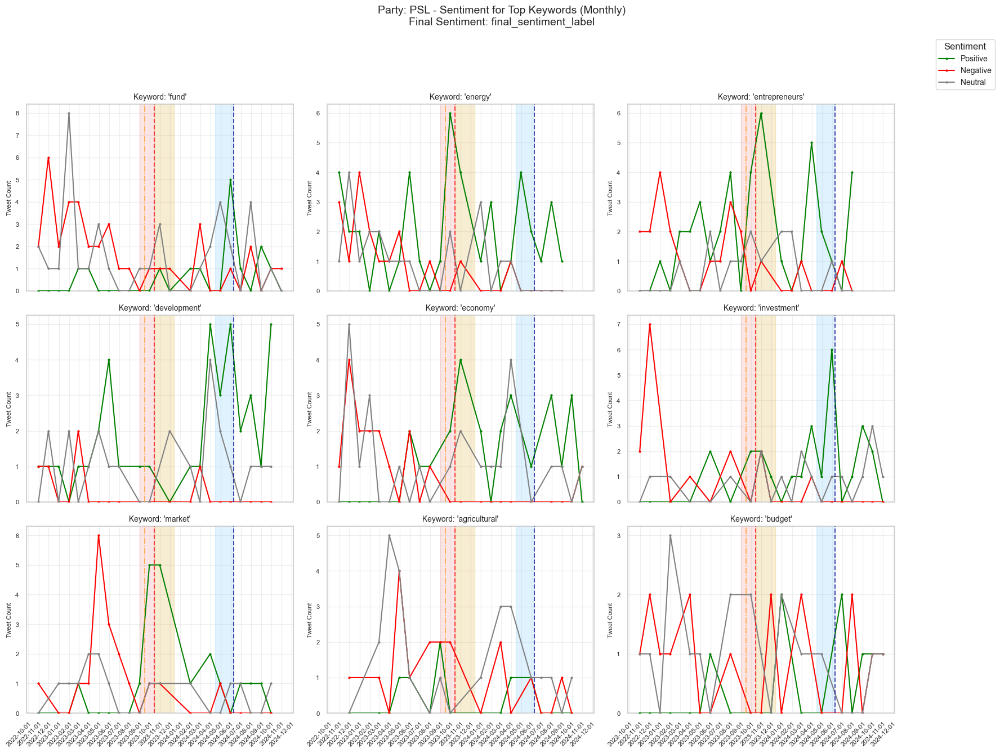


--- Top Keyword per Party Sentiment Plotting Complete ---


In [148]:
# === Notebook Cell: Sentiment Over Time for Top N Keywords PER PARTY (Annotated - Custom Tick Interval) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates # For date formatting and locators
import matplotlib.ticker as mticker # For integer Y-axis ticks
import seaborn as sns 
import traceback
from datetime import datetime, timezone
import numpy as np
from collections import Counter 

print("\n" + "="*60)
print("--- Plotting Sentiment Over Time for Top N Keywords PER PARTY (Custom Tick Interval) ---")
print("="*60)

# --- Configuration ---
keyword_col = 'matched_keywords_FILTERED'
final_sentiment_col = 'final_sentiment_label'
time_col = 'created_at'
party_col = 'party' 
top_n_keywords_per_party = 9 
time_frequency = 'ME'      # 'W' for Weekly, 'ME' for Monthly (Month End) - data aggregation frequency

# *** NEW: Configuration for X-axis Tick Interval ***
x_axis_tick_interval_months = 1  # <<< SET TO 1 for 1-month, 3 for 3-month intervals 
# ---

# --- Sentiment Colors ---
sentiment_colors = {'Positive': 'green', 'Negative': 'red', 'Neutral': 'grey'}
sentiments_to_plot_lines = ['Positive', 'Negative', 'Neutral'] 

# --- Annotation Configuration (Use your full list here) ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2},
    {'date': '2023-09-16', 'label': 'PL Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.2},
    {'date': '2023-10-15', 'label': 'PL Election 2023', 'color': 'red', 'linestyle': '--', 'linewidth': 1.5},
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2},
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25},
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5},
    # ... Add your other annotations ...
]
show_other_custom_annotations = True
# --- End Annotation Configuration ---

plot_data_ready = ('df_sentiment_input' in locals() and
                   isinstance(df_sentiment_input, pd.DataFrame) and
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   keyword_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and 
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_analysis = df_sentiment_input.copy()

        # Ensure 'created_at' is datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_analysis[time_col]):
            df_analysis[time_col] = pd.to_datetime(df_analysis[time_col], utc=True, errors='coerce')
        df_analysis = df_analysis.dropna(subset=[time_col])
        if df_analysis[time_col].dt.tz is None: df_analysis[time_col] = df_analysis[time_col].dt.tz_localize('UTC')
        elif df_analysis[time_col].dt.tz != timezone.utc: df_analysis[time_col] = df_analysis[time_col].dt.tz_convert('UTC')

        unique_parties = sorted(df_analysis[party_col].unique())
        if not unique_parties:
            print("No parties found in the data.")
        
        for current_party_name in unique_parties:
            print(f"\n=== Processing Party: {current_party_name} ===")
            df_party_subset = df_analysis[df_analysis[party_col] == current_party_name]

            if df_party_subset.empty:
                print(f"  No data for party '{current_party_name}'.")
                continue

            all_keywords_party = []
            for sublist in df_party_subset[keyword_col].dropna():
                if isinstance(sublist, list):
                    all_keywords_party.extend([kw for kw in sublist if kw]) 
            
            if not all_keywords_party:
                print(f"  No keywords found for party '{current_party_name}'.")
                continue
            
            keyword_counts_party = Counter(all_keywords_party)
            top_keywords_for_party = [kw for kw, count in keyword_counts_party.most_common(top_n_keywords_per_party)]
            print(f"  Top {len(top_keywords_for_party)} keywords for {current_party_name}: {top_keywords_for_party}")

            if not top_keywords_for_party:
                print(f"  No top keywords to plot for party '{current_party_name}'.")
                continue

            num_keywords_to_plot_this_party = len(top_keywords_for_party)
            num_facet_cols = min(num_keywords_to_plot_this_party, 3) 
            num_rows = int(np.ceil(num_keywords_to_plot_this_party / num_facet_cols))
            
            if num_rows == 0 or num_facet_cols == 0 :
                print(f"  Skipping plots for {current_party_name} due to zero rows/cols for subplots.")
                continue

            fig_party, axes_party = plt.subplots(num_rows, num_facet_cols,
                                                 figsize=(num_facet_cols * 6, num_rows * 4.5),
                                                 sharex=True, squeeze=False) 
            axes_party = axes_party.flatten() 

            figure_legend_handles = []
            figure_legend_labels = []

            for i, current_keyword in enumerate(top_keywords_for_party):
                ax = axes_party[i]
                
                df_keyword_party_subset = df_party_subset[df_party_subset[keyword_col].apply(
                    lambda k_list: isinstance(k_list, list) and current_keyword in k_list
                )]

                if df_keyword_party_subset.empty:
                    ax.set_title(f"Keyword: '{current_keyword}'\n(No Data for this party)", fontsize=10)
                    ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                    ax.tick_params(axis='x', rotation=45, labelsize=8)
                    plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) # Apply formatter
                    continue 

                df_kw_time_indexed = df_keyword_party_subset.set_index(time_col)
                plot_freq = 'ME' if time_frequency == 'M' else time_frequency
                
                sentiment_over_time_kw = df_kw_time_indexed.groupby([pd.Grouper(freq=plot_freq), final_sentiment_col]) \
                                                          .size().unstack(fill_value=0)
                
                for sentiment in sentiments_to_plot_lines:
                    if sentiment not in sentiment_over_time_kw.columns:
                        sentiment_over_time_kw[sentiment] = 0
                sentiment_over_time_kw = sentiment_over_time_kw[[s for s in sentiments_to_plot_lines if s in sentiment_over_time_kw.columns]]

                if sentiment_over_time_kw.empty:
                    ax.set_title(f"Keyword: '{current_keyword}'\n(No Resampled Data)", fontsize=10)
                    ax.text(0.5, 0.5, "No Resampled Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                    ax.tick_params(axis='x', rotation=45, labelsize=8)
                    plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) # Apply formatter
                    continue
                    
                for sentiment_label_in_loop in sentiment_over_time_kw.columns:
                    line, = ax.plot(sentiment_over_time_kw.index, sentiment_over_time_kw[sentiment_label_in_loop],
                                   label=sentiment_label_in_loop, 
                                   color=sentiment_colors.get(sentiment_label_in_loop, 'black'),
                                   marker='.', markersize=4, zorder=5)
                    if sentiment_label_in_loop not in figure_legend_labels:
                        figure_legend_handles.append(line)
                        figure_legend_labels.append(sentiment_label_in_loop)
                
                plot_start_date = sentiment_over_time_kw.index.min()
                plot_end_date = sentiment_over_time_kw.index.max()
                
                if annotations_list and show_other_custom_annotations:
                    for event in annotations_list:
                        # (Simplified annotation plotting)
                        try:
                            if 'date' in event:
                                dt = pd.to_datetime(event['date'], utc=True)
                                if plot_start_date <= dt <= plot_end_date:
                                    ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), zorder=9, alpha=0.7)
                            elif 'start_date' in event and 'end_date' in event:
                                dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                                if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                    span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                    if span_start < span_end:
                                        ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), zorder=1)
                        except Exception as e_ann: print(f"    Warn: Annot err for '{event.get('label', 'Event')}' on '{current_keyword}' plot: {e_ann}")

                ax.set_title(f"Keyword: '{current_keyword}'", fontsize=10)
                ax.set_ylabel("Tweet Count", fontsize=8)
                ax.tick_params(axis='x', labelsize=8)
                plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
                ax.tick_params(axis='y', labelsize=8)
                
                # *** APPLY DATE FORMATTER AND MONTH LOCATOR ***
                ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) 
                ax.xaxis.set_major_locator(mdates.MonthLocator(interval=x_axis_tick_interval_months))
                # ***
                
                ax.grid(True, alpha=0.3)
                ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True, min_n_ticks=3)) 
                ax.set_ylim(bottom=0)

            for j in range(num_keywords_to_plot_this_party, len(axes_party)):
                fig_party.delaxes(axes_party[j])
            
            if figure_legend_handles:
                 temp_legend_dict = dict(zip(figure_legend_labels, figure_legend_handles))
                 ordered_handles = [temp_legend_dict[lbl] for lbl in sentiments_to_plot_lines if lbl in temp_legend_dict]
                 ordered_labels = [lbl for lbl in sentiments_to_plot_lines if lbl in temp_legend_dict]
                 if ordered_handles:
                      fig_party.legend(ordered_handles, ordered_labels,
                                    loc='upper right', title="Sentiment", 
                                    bbox_to_anchor=(0.99, 0.98), fontsize='small', frameon=True)
            
            freq_name = "Weekly" if plot_freq == 'W' else "Monthly"
            fig_party.suptitle(f'Party: {current_party_name} - Sentiment for Top Keywords ({freq_name})\nFinal Sentiment: {final_sentiment_col}', fontsize=14, y=1.02)
            
            plt.tight_layout(rect=[0, 0.03, 0.90, 0.96]) # Adjust for figure legend & suptitle
            plt.show()

    except Exception as e:
        print(f"An error occurred during top keyword sentiment plot generation by party: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns.")

print("\n" + "="*60)
print("--- Top Keyword per Party Sentiment Plotting Complete ---")
print("="*60)


--- Plotting AVERAGE Sentiment Score Over Time for Top N Keywords PER PARTY (Annotated) ---

=== Processing Party: Konfederacja ===
  Top 3 keywords for Konfederacja: ['taxes', 'entrepreneurs', 'market']


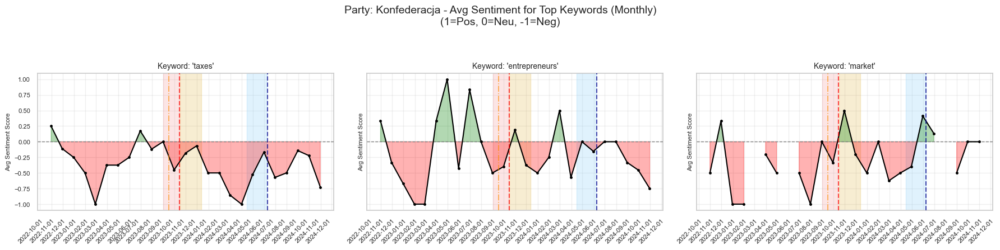


=== Processing Party: NL ===
  Top 3 keywords for NL: ['fund', 'energy', 'equalities']


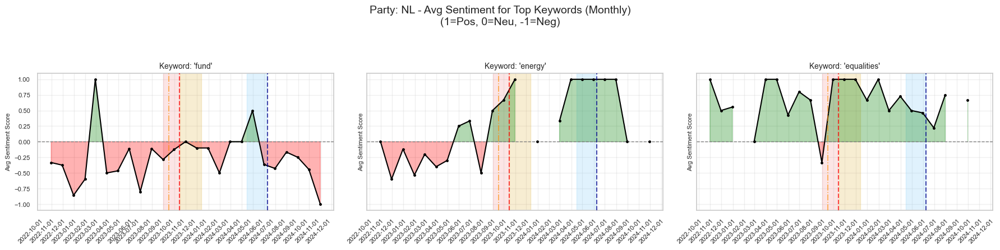


=== Processing Party: PIS ===
  Top 3 keywords for PIS: ['fund', 'energy', 'development']


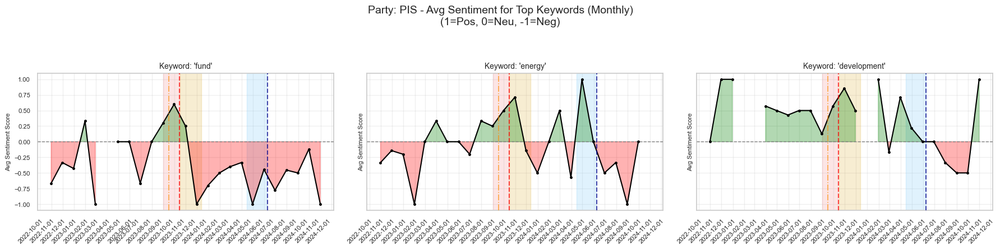


=== Processing Party: PL2050 ===
  Top 3 keywords for PL2050: ['energy', 'fund', 'investment']


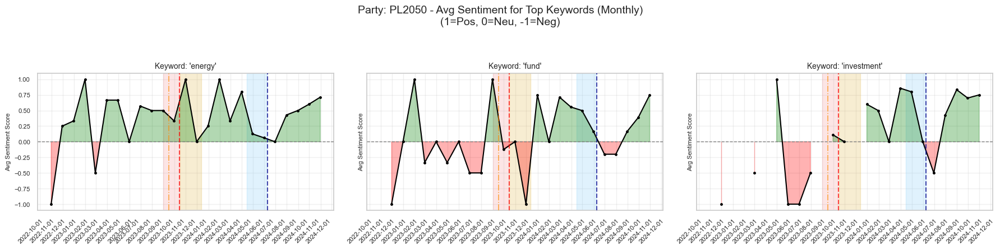


=== Processing Party: PO ===
  Top 3 keywords for PO: ['energy', 'fund', 'investment']


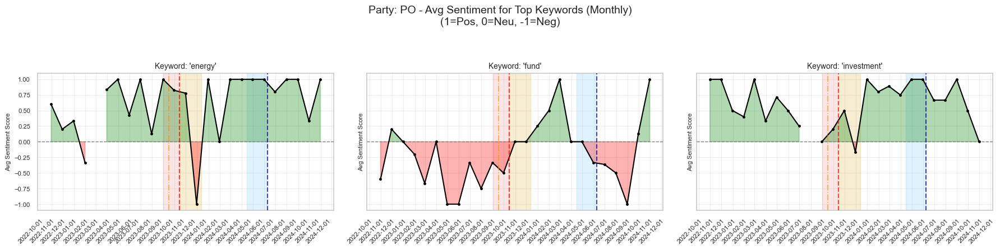


=== Processing Party: PSL ===
  Top 3 keywords for PSL: ['fund', 'energy', 'entrepreneurs']


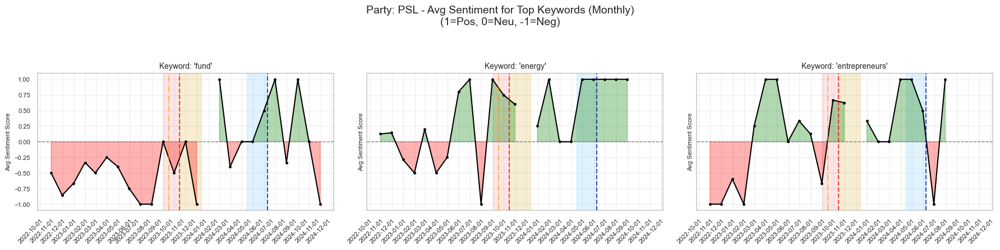


--- Top Keyword Average Sentiment per Party Plotting Complete ---


In [149]:
# === Notebook Cell: AVERAGE Sentiment Score Over Time for Top N Keywords PER PARTY (Annotated) ===
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import seaborn as sns 
import traceback
from datetime import datetime, timezone
import numpy as np
from collections import Counter 

print("\n" + "="*60)
print("--- Plotting AVERAGE Sentiment Score Over Time for Top N Keywords PER PARTY (Annotated) ---")
print("="*60)

# --- Configuration ---
keyword_col = 'matched_keywords_FILTERED'
final_sentiment_col = 'final_sentiment_label'
time_col = 'created_at'
party_col = 'party' 
top_n_keywords_per_party = 3 
time_frequency = 'ME'      # 'W' for Weekly, 'ME' for Monthly (Month End)

# Sentiment mapping for average calculation
sentiment_to_numeric_map = {'Positive': 1, 'Neutral': 0, 'Negative': -1}
# Other/ERROR will become NaN and be excluded from mean calculation by default

# --- Annotation Configuration (Use your full list here) ---
annotations_list = [
    {'start_date': '2023-09-01', 'end_date': '2023-10-14', 'label': 'PL Parl. Election Campaign', 'color': 'lightcoral', 'alpha': 0.2},
    {'date': '2023-09-16', 'label': 'PL Maintains UA Grain Import Ban', 'color': '#FF8C00', 'linestyle': '-.', 'linewidth': 1.2},
    {'date': '2023-10-15', 'label': 'PL Election 2023', 'color': 'red', 'linestyle': '--', 'linewidth': 1.5},
    {'start_date': '2023-10-16', 'end_date': '2023-12-13', 'label': 'Post-Election: Govt Formation', 'color': '#DAA520', 'alpha': 0.2},
    {'start_date': '2024-04-15', 'end_date': '2024-06-08', 'label': 'EP Election Campaign', 'color': 'lightskyblue', 'alpha': 0.25},
    {'date': '2024-06-09', 'label': 'European Parliament Elections', 'color': 'darkblue', 'linestyle': '--', 'linewidth': 1.5},
    # ... Add your other annotations ...
]
show_other_custom_annotations = True
# --- End Annotation Configuration ---

plot_data_ready = ('df_sentiment_input' in locals() and
                   isinstance(df_sentiment_input, pd.DataFrame) and
                   not df_sentiment_input.empty and
                   final_sentiment_col in df_sentiment_input.columns and
                   keyword_col in df_sentiment_input.columns and
                   time_col in df_sentiment_input.columns and
                   party_col in df_sentiment_input.columns and 
                   pd.api.types.is_datetime64_any_dtype(df_sentiment_input[time_col]))

if plot_data_ready:
    try:
        df_analysis = df_sentiment_input.copy()

        # Ensure 'created_at' is datetime and UTC
        if not pd.api.types.is_datetime64_any_dtype(df_analysis[time_col]):
            df_analysis[time_col] = pd.to_datetime(df_analysis[time_col], utc=True, errors='coerce')
        df_analysis = df_analysis.dropna(subset=[time_col])
        if df_analysis[time_col].dt.tz is None: df_analysis[time_col] = df_analysis[time_col].dt.tz_localize('UTC')
        elif df_analysis[time_col].dt.tz != timezone.utc: df_analysis[time_col] = df_analysis[time_col].dt.tz_convert('UTC')

        # Map final sentiment label to numeric score
        df_analysis['sentiment_numeric_score'] = df_analysis[final_sentiment_col].map(sentiment_to_numeric_map)

        unique_parties = sorted(df_analysis[party_col].unique())
        if not unique_parties:
            print("No parties found in the data.")
        
        for current_party_name in unique_parties:
            print(f"\n=== Processing Party: {current_party_name} ===")
            df_party_subset = df_analysis[df_analysis[party_col] == current_party_name]

            if df_party_subset.empty:
                print(f"  No data for party '{current_party_name}'.")
                continue

            all_keywords_party = []
            for sublist in df_party_subset[keyword_col].dropna():
                if isinstance(sublist, list):
                    all_keywords_party.extend([kw for kw in sublist if kw]) 
            
            if not all_keywords_party:
                print(f"  No keywords found for party '{current_party_name}'.")
                continue
            
            keyword_counts_party = Counter(all_keywords_party)
            top_keywords_for_party = [kw for kw, count in keyword_counts_party.most_common(top_n_keywords_per_party)]
            print(f"  Top {len(top_keywords_for_party)} keywords for {current_party_name}: {top_keywords_for_party}")

            if not top_keywords_for_party:
                print(f"  No top keywords to plot for party '{current_party_name}'.")
                continue

            num_keywords_to_plot_this_party = len(top_keywords_for_party)
            num_facet_cols = min(num_keywords_to_plot_this_party, 3) 
            num_rows = int(np.ceil(num_keywords_to_plot_this_party / num_facet_cols))
            
            if num_rows == 0 or num_facet_cols == 0 :
                print(f"  Skipping plots for {current_party_name} due to zero rows/cols for subplots.")
                continue

            fig_party, axes_party = plt.subplots(num_rows, num_facet_cols,
                                                 figsize=(num_facet_cols * 6, num_rows * 4.5),
                                                 sharex=True, sharey=True, # Share Y-axis (-1 to 1)
                                                 squeeze=False) 
            axes_party = axes_party.flatten()

            for i, current_keyword in enumerate(top_keywords_for_party):
                ax = axes_party[i]
                
                df_keyword_party_subset = df_party_subset[df_party_subset[keyword_col].apply(
                    lambda k_list: isinstance(k_list, list) and current_keyword in k_list
                )]

                if df_keyword_party_subset.empty:
                    ax.set_title(f"Keyword: '{current_keyword}'\n(No Data for this party)", fontsize=10)
                    ax.text(0.5, 0.5, "No Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                    ax.tick_params(axis='x', rotation=45, labelsize=8)
                    plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                    ax.set_ylim(-1.1, 1.1) # Set Y-axis for average score
                    continue 

                df_kw_time_indexed = df_keyword_party_subset.set_index(time_col)
                plot_freq = 'ME' if time_frequency == 'M' else time_frequency
                
                # Calculate AVERAGE numeric sentiment score over time for this keyword
                avg_sentiment_over_time_kw = df_kw_time_indexed.groupby(pd.Grouper(freq=plot_freq)) \
                                                               ['sentiment_numeric_score'].mean() # Use .mean()
                
                if avg_sentiment_over_time_kw.empty or avg_sentiment_over_time_kw.isnull().all():
                    ax.set_title(f"Keyword: '{current_keyword}'\n(No Avg Sentiment Data)", fontsize=10)
                    ax.text(0.5, 0.5, "No Avg Sentiment Data", ha='center', va='center', transform=ax.transAxes, fontsize=9)
                    ax.tick_params(axis='x', rotation=45, labelsize=8)
                    plt.setp(ax.get_xticklabels(), ha="right", rotation_mode="anchor")
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                    ax.set_ylim(-1.1, 1.1)
                    continue
                    
                # Plot average sentiment line
                ax.plot(avg_sentiment_over_time_kw.index, avg_sentiment_over_time_kw.values,
                        color='black', # Or a party-specific color if preferred
                        marker='.', markersize=5, zorder=5)
                
                # Add fill for positive/negative average score
                ax.fill_between(avg_sentiment_over_time_kw.index, avg_sentiment_over_time_kw.values, 0, 
                                where=avg_sentiment_over_time_kw.values >= 0, 
                                color='green', alpha=0.3, interpolate=True, zorder=2)
                ax.fill_between(avg_sentiment_over_time_kw.index, avg_sentiment_over_time_kw.values, 0, 
                                where=avg_sentiment_over_time_kw.values < 0, 
                                color='red', alpha=0.3, interpolate=True, zorder=2)
                ax.axhline(0, color='grey', linestyle='--', linewidth=1, zorder=3) # Neutral line
                
                # --- Add Annotations to this subplot ---
                plot_start_date = avg_sentiment_over_time_kw.index.min()
                plot_end_date = avg_sentiment_over_time_kw.index.max()
                
                if annotations_list and show_other_custom_annotations:
                    for event in annotations_list:
                        # (Simplified annotation plotting)
                        try:
                            if 'date' in event:
                                dt = pd.to_datetime(event['date'], utc=True)
                                if plot_start_date <= dt <= plot_end_date:
                                    ax.axvline(dt, color=event.get('color', 'grey'), linestyle=event.get('linestyle', ':'), lw=event.get('linewidth', 1), zorder=9, alpha=0.7)
                            elif 'start_date' in event and 'end_date' in event:
                                dt_start=pd.to_datetime(event['start_date'], utc=True); dt_end=pd.to_datetime(event['end_date'], utc=True)
                                if dt_start <= plot_end_date and dt_end >= plot_start_date:
                                    span_start = max(dt_start, plot_start_date); span_end = min(dt_end, plot_end_date)
                                    if span_start < span_end:
                                        ax.axvspan(span_start, span_end, color=event.get('color', 'cyan'), alpha=event.get('alpha', 0.15), zorder=1)
                        except Exception as e_ann: print(f"    Warn: Annot err for '{event.get('label', 'Event')}' on '{current_keyword}' plot: {e_ann}")
                # --- End Annotations ---

                ax.set_title(f"Keyword: '{current_keyword}'", fontsize=10)
                ax.set_ylabel("Avg Sentiment Score", fontsize=8)
                ax.tick_params(axis='x', labelsize=8)
                plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
                ax.tick_params(axis='y', labelsize=8)
                ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
                ax.xaxis.set_major_locator(mdates.MonthLocator(interval=x_axis_tick_interval_months)) # Use new config
                ax.grid(True, alpha=0.3)
                ax.set_ylim(-1.1, 1.1) # Y-axis from -1 to +1 for average score

            for j in range(num_keywords_to_plot_this_party, len(axes_party)):
                fig_party.delaxes(axes_party[j])
            
            # No separate legend for P/N/N lines needed, colors are implicit for avg score
            freq_name = "Weekly" if plot_freq == 'W' else "Monthly"
            fig_party.suptitle(f'Party: {current_party_name} - Avg Sentiment for Top Keywords ({freq_name})\n(1=Pos, 0=Neu, -1=Neg)', fontsize=14, y=1.02)
            
            plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust for suptitle
            plt.show()

    except Exception as e:
        print(f"An error occurred during top keyword average sentiment plot generation by party: {e}")
        traceback.print_exc()
else:
    print("Skipping plot: Data not prepared successfully or missing required columns.")

print("\n" + "="*60)
print("--- Top Keyword Average Sentiment per Party Plotting Complete ---")
print("="*60)